In [187]:
suppressPackageStartupMessages(library(dplyr)) 
library(ggplot2)
library(pheatmap)
library(RColorBrewer)
library(Seurat)
library(harmony)
library(repr)
library(fgsea)
suppressPackageStartupMessages(library(ggalluvial))

source("/projects/ps-renlab2/y2xie/scripts/basics.R")
source("/projects/ps-renlab2/y2xie/scripts/DPT_help.R")

In [121]:
suppressPackageStartupMessages(library("msigdbr"))
suppressPackageStartupMessages(library("fgsea"))

suppressPackageStartupMessages(library(GenomicRanges))
suppressPackageStartupMessages(library(enrichR))
dbs <- c("GO_Biological_Process_2021")

suppressPackageStartupMessages(library(clusterProfiler))
suppressPackageStartupMessages(library(org.Hs.eg.db))

In [3]:
sum_anno <- function(df){
    t1 <- table(df$Annotation) %>% as.data.frame %>%
    mutate(Var1 = gsub("^([^\\(]+).*", "\\1", Var1)) %>%
    group_by(Var1) %>% summarise(Freq = sum(Freq))

    t1a1 <- t1[grep("\\|", t1$Var1, invert = T), ] %>%
    mutate(Var1 = gsub("^(CpG)-.*$", "\\1", Var1)) %>%
    group_by(Var1) %>% summarise(Freq = sum(Freq)) %>% setNames(c("Var1", "Freq"))

    t1a2 <- t1[grep("\\|", t1$Var1), ] %>% 
    mutate(Var1 = gsub("^([^|]+)\\|([^|]+)\\|([^|]+)$", "\\2", Var1)) %>%
    mutate(Var1 = gsub("\\?", "", Var1)) %>%
    mutate(simple = ifelse(Var1 %in% c("LINE", "LTR", "SINE", "Simple_repeat"), Var1, "Other repeats")) %>%
    group_by(simple) %>% summarise(Freq = sum(Freq)) %>% setNames(c("Var1", "Freq"))

    anno <- rbind(t1a1, t1a2)
    return(anno)
}

sum_detailed_anno <- function(df){
    t1 <- table(df$Detailed.Annotation) %>% as.data.frame %>%
    mutate(Var1 = gsub("^([^\\(]+).*", "\\1", Var1)) %>%
    group_by(Var1) %>% summarise(Freq = sum(Freq))

    t1a1 <- t1[grep("\\|", t1$Var1, invert = T), ] %>%
    mutate(Var1 = gsub("^(CpG)-.*$", "\\1", Var1)) %>%
    group_by(Var1) %>% summarise(Freq = sum(Freq)) %>% setNames(c("Var1", "Freq"))

    t1a2 <- t1[grep("\\|", t1$Var1), ] %>% 
    mutate(Var1 = gsub("^([^|]+)\\|([^|]+)\\|([^|]+)$", "\\2", Var1)) %>%
    mutate(Var1 = gsub("\\?", "", Var1)) %>%
    mutate(simple = ifelse(Var1 %in% c("LINE", "LTR", "SINE", "Simple_repeat"), Var1, "Other repeats")) %>%
    group_by(simple) %>% summarise(Freq = sum(Freq)) %>% setNames(c("Var1", "Freq"))

    anno <- rbind(t1a1, t1a2)
    return(anno)
}

In [4]:
## read donor disease info
donor_info <- read.table("../reference/Final_FNIH_Heart_10X.donor.xls", sep = "\t", header = T)
length(unique(donor_info[,1]))

[1] 30

In [5]:
### set cell tree
corder <- c('vCM','aCM','Epicardial','SM','Pericyte','Neuronal','Fibroblast',
            'Adipocyte','Endothelial','Endocardial','Myeloid','Lymphoid')

In [6]:
celltype_colors <- c(
    vCM = "#b94656",
    aCM = "#b95c38",
    Fibroblast = "#c0a13b",
    SM = "#71893b",
    Pericyte = "#6dbc5f",
    Epicardial = "#45c097",
    Endocardial = "#628ed6",
    Endothelial = "#6a70d7",
    Neuronal = "#5a3687",
    Myeloid = "#c074cc",
    Lymphoid = "#d16bad",
    Adipocyte = "#aa3d71"
)

cols1 <- c('#1F78B4', '#FB9A99'); names(cols1) <- c("M", "F")
cols2 <- c('#B2DF8A', '#FF7F00', '#CAB2D6'); names(cols2) <- c("CONTROL", "Ischemic", "Non-ischemic")
cols3 <- c('#B15928', '#FDBF6F'); names(cols3) <- c("TRUE", "FALSE")
cols4 <- c("#006934", "#2EA7E0", "#956134", "#036EB8"); names(cols4) <- c("Hi-C", "H3K27ac", "H3K27me3","ATAC")
cols5 <- c("#4f652f", "#d44f3a", "#5bac96", "#e6b8b3"); names(cols5) <- c("LV", "LA", "RV","RA")
cols <- c("#cd5c5c", "#c0c0c0", "#008000", "#ffc800", '#66cdaa')
names(cols) <- c("E1", "E2", "E3", "E4", "E5")

cols0 <- c('3\' UTR ' = "#6F4066",
           '5\' UTR ' = "#B78EA6",
           'CpG' = "#71818D",
           'Intergenic' = "#326680",
           'TTS ' = "#B0BEC5",
           'exon ' = "#527172",
           'intron ' = "#495347",
           'non-coding ' = "#73A085",
           'promoter-TSS ' = "#D0C185",
           'LINE' = "#ECBF6D",
           'LTR' = "#C56D48",
           'Other repeats' = "#C0A08D",
           'SINE' = "#B05857",
           'Simple_repeat' = "#701B28")

### Check TSS enrichment of all library

In [16]:
# meta <- read.csv("integration/All_data_int_metadata.file.txt", sep = "\t")
# lib1 <- meta %>% filter(orig.ident == "MULTIOME") %>% dplyr::select(library) %>% unlist %>% unique
# lib2 <- meta %>% filter(Target == "H3K27ac") %>% dplyr::select(dna) %>% unlist %>% unique
# lib3 <- meta %>% filter(Target == "H3K27me3") %>% dplyr::select(dna) %>% unlist %>% unique

[1] "QY_2600" "QY_2602" "QY_2608" "QY_2610" "QY_2616" "QY_2618" "QY_2624"
[8] "QY_2626"

Using sample as id variables



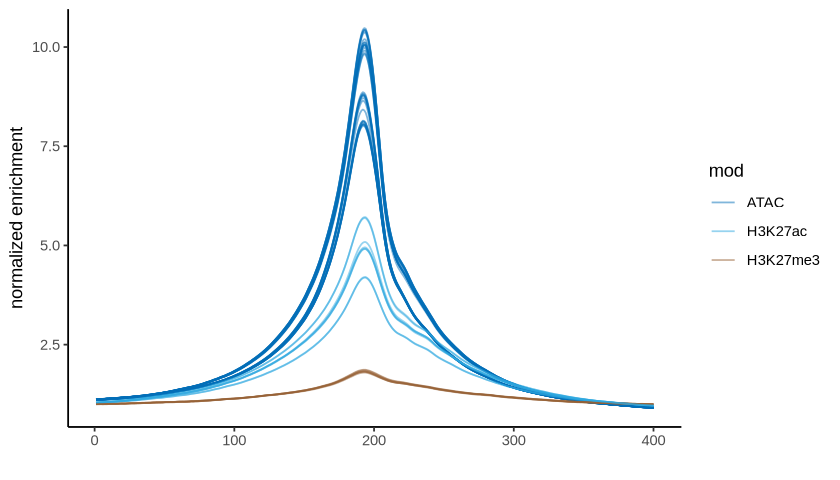

In [44]:
# enrichm <- read.csv("../06.bw/enrichment//FNIH_ATAC_DPT_TSSe_profile.txt", sep = "\t", skip = 1, header = T, row.names = 1)
# enrichm$X <- NULL
bdg <- enrichm[,c(1:3, 397:400)] %>% rowMeans
tmp <- (enrichm[,1:400]/bdg) %>% as.data.frame %>%
tibble::rownames_to_column('sample') %>%
reshape2::melt() %>%
mutate(variable = as.integer(gsub("X", "", variable))) 

t1 <- tmp %>% 
mutate(mod = ifelse(sample %in% paste0(lib1, "_rmdup"), "ATAC", "NA")) %>%
mutate(mod = ifelse(sample %in% paste0(lib2, "_rmdup"), "H3K27ac", mod)) %>%
mutate(mod = ifelse(sample %in% paste0(lib3, "_rmdup"), "H3K27me3", mod)) %>%
filter(mod != "NA") %>%
ggplot(aes(x = variable, y = value, color = mod, group = sample)) + 
geom_line(alpha = 0.5, linewidth = 0.5) + 
theme_classic() + xlab("") + ylab("normalized enrichment") + 
scale_color_manual(values = c("#036EB8", "#2EA7E0", "#956134"))

options(repr.plot.width = 7, repr.plot.height = 4)
t1

ggsave(t1, filename = "plot/FIG_ATAC_ac_me3_lib_normTSSe.pdf", dpi = 300, height = 4, width = 7)

## Determine peaks size to merge consensus peak list for H3K27me3

,Min.,1st Qu.,Median,Mean,3rd Qu.,Max.
aCM.me3,263,1559.00,3374,6830.190,7870.00,122229
aCM,261,2040.50,4779,10465.904,11838.00,241243
Adipocyte.me3,276,700.00,1477,3676.668,5987.00,16986
Adipocyte,299,651.25,849,1032.407,1294.25,3164
Endocardial.me3,275,1308.00,2310,3379.619,4220.00,34804
Endocardial,263,1076.00,1739,2399.773,2875.00,21854
Endothelial.me3,279,1917.00,4500,9430.237,10928.00,198200
Endothelial,259,1875.00,3720,6747.201,7872.00,83990
Epicardial.me3,281,980.00,1523,2403.455,2462.00,35111
Epicardial,278,986.00,1364,1568.698,1897.00,8237


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    244    1661    3642    7794    8614  241372 

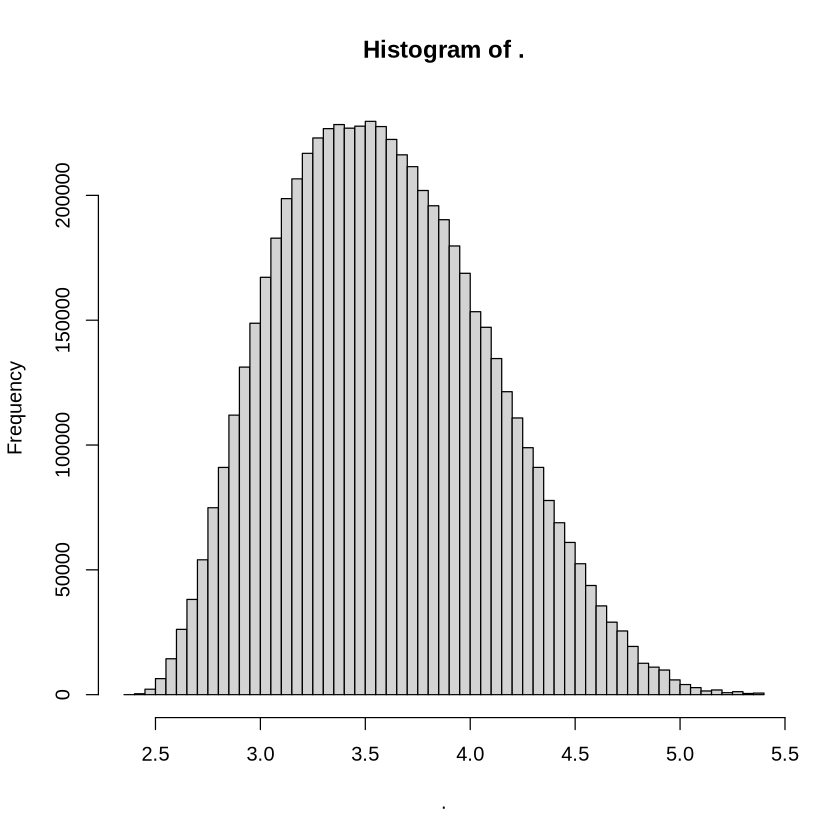

In [9]:
nlist <- list()
for (f in list.files("../10.conserved_peaks/parsePeak/", pattern = ".*.naivePeakList.narrowPeak.gz$")){
    fname <- gsub(".naivePeakList.narrowPeak.gz", "", f)
    nlist[[fname]] <- read.table(paste0("../10.conserved_peaks/parsePeak/", f))
}

do.call(rbind, lapply(nlist, function(x) summary(x$V3 - x$V2)))
                      
lapply(nlist, function(x) log10(x$V3 - x$V2 + 1)) %>% unlist %>% hist(breaks = 50)
lapply(nlist, function(x) x$V3 - x$V2) %>% unlist %>% summary

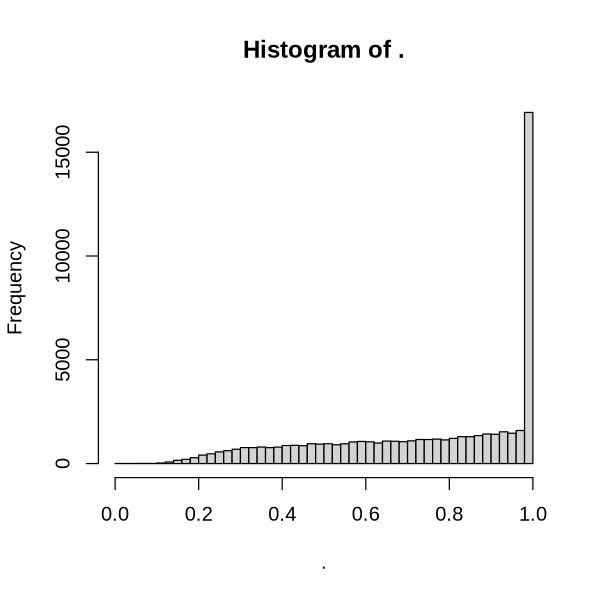

In [10]:
### Whether stitching returns peaks similar to broad peaks?
options(repr.plot.width = 5, repr.plot.height = 5)
compare <- read.table('../10.conserved_peaks/celltype_H3K27me3/merge/compare/vCM_compare_with_broadPeak.bed') %>%
mutate(query = V3 - V2, ref = V6 - V5, ratio = V14/ref) %>%
mutate(ratio = ifelse(V4 == ".", 0, ratio))

compare %>% group_by(V7) %>%
summarise(tratio = sum(ratio)) %>%
ungroup %>% select(tratio) %>%
unlist %>% hist(breaks = 50)

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


nn2.celltype,vCM,aCM,Epicardial,SM,Pericyte,Neuronal,Fibroblast,Adipocyte,Endothelial,Endocardial,Myeloid,Lymphoid
Freq,10630,8404,532,1204,4510,894,6882,122,14338,1019,10606,3026


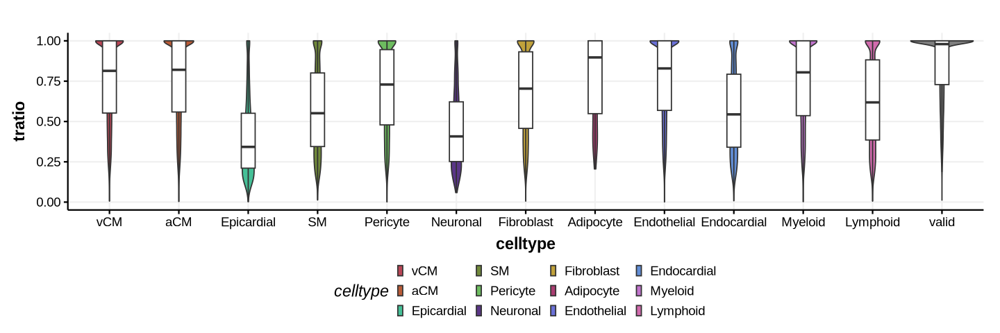

In [312]:
### Does this 3.5kb merging preserves broad peak pattern?
compare <- list()
for (f in list.files('../10.conserved_peaks/celltype_H3K27me3/merge/compare/', pattern = '.*_compare_with_broadPeak.bed')){
    fname <- gsub("_compare_with_broadPeak.bed", "", f)
    compare[[fname]] <- read.table(paste0('../10.conserved_peaks/celltype_H3K27me3/merge/compare/', f)) %>%
    mutate(query = V3 - V2, ref = V6 - V5, ratio = V14/ref) %>%
    mutate(ratio = ifelse(V4 == ".", 0, ratio)) %>%
    group_by(V7) %>%
    summarise(tratio = sum(ratio)) %>%
    ungroup %>%
    mutate(celltype = fname)
}

options(repr.plot.width = 12, repr.plot.height = 4)
do.call(rbind, compare) %>%
filter(V7 != ".") %>%
mutate(celltype = factor(celltype, levels = c(corder, "valid"))) %>%
ggplot(aes(x = celltype, y = tratio, fill = celltype)) + 
geom_violin() + 
geom_boxplot(width = 0.2, fill = "white", coef = 2, outlier.shape = NA) + 
theme_Publication() + 
scale_fill_manual(values = celltype_colors)

# meta <- read.csv("integration/All_data_int_metadata.file.txt", sep = '\t')
meta %>%
filter(orig.ident == "DPT", Target == "H3K27me3", integrated_majortype == 1) %>%
select(nn2.celltype) %>% table %>% as.data.frame %>%
mutate(nn2.celltype = factor(nn2.celltype, levels = corder)) %>%
arrange(nn2.celltype) %>% t
### Not affected by cell number, but low for Epicaridal / Neuronal

In [314]:
lapply(compare, function(x) nrow(x)) %>% as.data.frame %>% select(corder)

vCM,aCM,Epicardial,SM,Pericyte,Neuronal,Fibroblast,Adipocyte,Endothelial,Endocardial,Myeloid,Lymphoid
<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
57263,68803,3869,15916,31769,5683,33146,155,57001,12679,63827,44796


In [1127]:
mlist <- list()
for (f in list.files("../reference/FNIH_peaks/unified_peaks//")){
    tmp <- read.table(paste0("../reference/FNIH_peaks/unified_peaks/", f))
    mlist[[f]] <- sum(tmp$V3 - tmp$V2)/2913022398
}

mean(unlist(mlist))
median(unlist(mlist))

[1] 0.008024759

[1] 0.006502401

In [275]:
### cell type specific H3K27me3
det <- read.csv("FNIH_Heart_analysis/H3K27me3_15kb_seurat_ranktest.csv")

### Filter blacklist
bl <- read.table("/projects/ps-renlab2/y2xie/ps-renlab/y2xie/projects/genome_ref/hg38-blacklist.v2.bed")
blrange <- GenomicRanges::GRanges(bl$V1, IRanges::IRanges(bl$V2, bl$V3))
atrange <- stringr::str_split_fixed(unique(det$gene), pattern = "[-:]", n = 3)
atrange <- GenomicRanges::GRanges(atrange[,1], IRanges::IRanges(as.integer(atrange[,2]), as.integer(atrange[,3])))

fdet <- det[-queryHits(findOverlaps(atrange, blrange)),]

In [386]:
qpeak1 <- fdet %>% filter((pct.1-pct.2) >= 0.1, avg_log2FC > 0) %>% 
mutate(cluster = factor(cluster, levels = corder)) %>%
arrange(cluster) %>% group_by(cluster) %>% 
slice_max(order_by = avg_log2FC, n = 5) %>%
ungroup %>% dplyr::select(gene) %>% unlist %>% unique

qpeak2 <- fdet %>% filter(abs(pct.1-pct.2) >= 0.1, avg_log2FC < 0) %>% 
mutate(cluster = factor(cluster, levels = corder)) %>%
arrange(cluster) %>% group_by(cluster) %>% 
slice_min(order_by = avg_log2FC, n = 3) %>%
ungroup %>% dplyr::select(gene) %>% unlist %>% unique

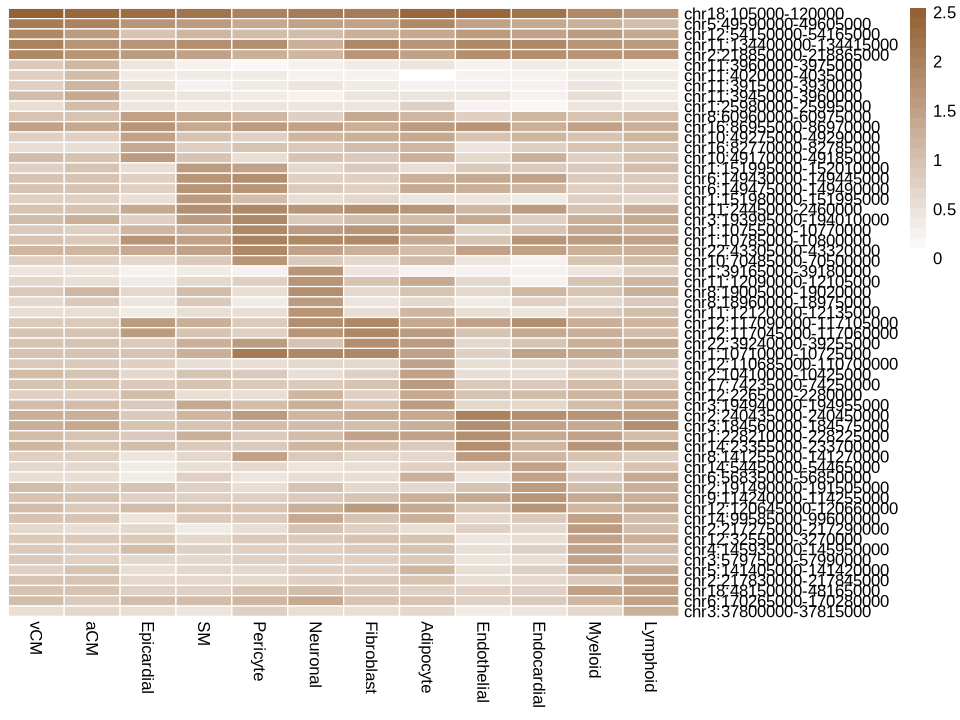

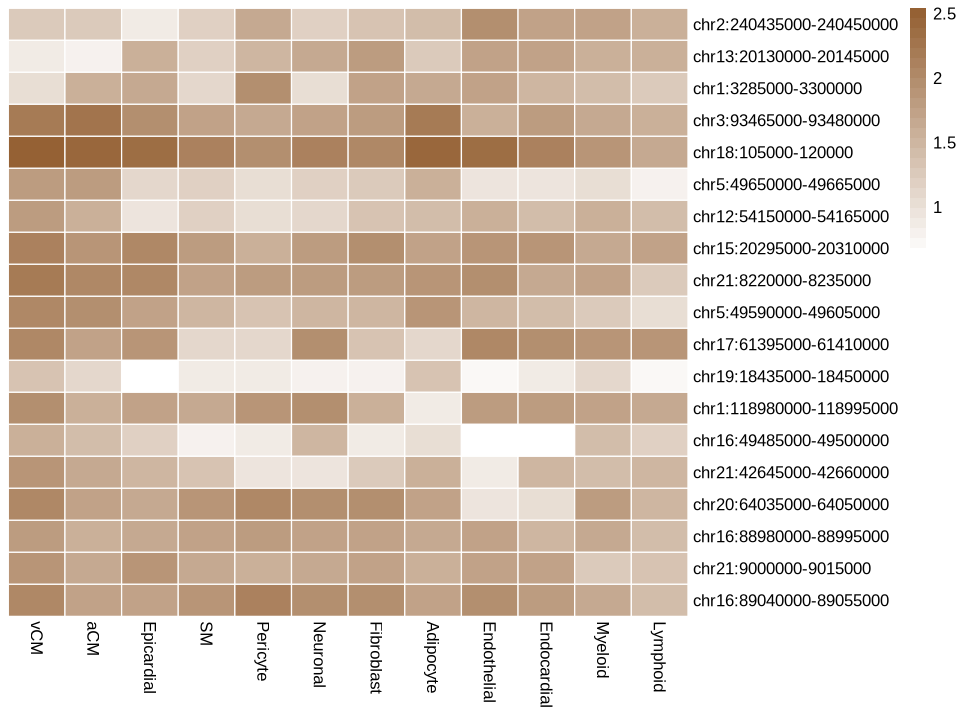

In [388]:
cpm <- read.csv("FNIH_Heart_signal/FNIH_Heart_pool.H3K27me3.15kb.cpm.csv", header = T, row.names = 1)
rmat <- cpm[qpeak1, corder]
# max_indices <- max.col(rmat)
# permutation_vector <- order(max_indices)
# smat <- rmat[permutation_vector, ]
options(repr.plot.width = 8, repr.plot.height = 6)
log10(rmat + 1) %>%
pheatmap(scale = "none", border_color = "white", cluster_cols = F, cluster_rows = F, 
         color = colorRampPalette(c("white", "#956134"))(25))

rmat <- cpm[qpeak2, corder]
log10(rmat + 1) %>%
pheatmap(scale = "none", border_color = "white", cluster_cols = F, cluster_rows = F, 
         color = colorRampPalette(c("white", "#956134"))(25))

In [335]:
### read GA
ga <- anndata::read_h5ad("FNIH_Heart_signal/FNIH_Heart_pool.GA.h5ad")
ga

AnnData object with n_obs × n_vars = 131253 × 60606
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'doublet_probability', 'doublet_score_x', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.ribo', 'RNA_snn_res.0.3', 'seurat_clusters', 'doublet_score_y', 'doublet_ident', 'DROPLET.TYPE', 'BEST.GUESS', 'NEXT.GUESS', 'rna', 'rna_bc', 'dna', 'library_info', 'dna_bc', 'Donor', 'Batch', 'Target', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.1', 'predicted.celltype', 'predicted.celltype_scores', 'predicted.cellsubtype', 'predicted.cellsubtype_scores', 'atac_bc', 'leiden'

In [380]:
qmeta <- rmeta %>% filter(orig.ident == "DPT", Target == "H3K27me3", integrated_majortype == "1")
rownames(qmeta) <- paste0(qmeta$dna, ":", qmeta$dna_bc)
vcell <- intersect(rownames(qmeta), ga$obs_names)

qmeta <- qmeta[vcell,] 
qmeta$nCount_histone <- ga$obs[rownames(qmeta), ]$n_fragment %>% as.character %>% as.integer
gacpm <- ArcXPM(t(ga$X[vcell, ]), meta = qmeta, method = "CPM", group.by = "nn2.celltype")

gc()

sparsity: 0.94462181962182
coarse dgTMatrix into Matrix.
check readSums:  12 
check obj_mtx_collapse:  12 


,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,15990690,854,33929158,1812.1,33929158,1812.1
Vcells,172097164,1313,11419226456,87121.8,15659480061,119472.4


In [393]:
write.csv(gacpm, "FNIH_Heart_analysis/FNIH_Heart_pool_H3K27me3.GA.cpm.csv", quote = F)

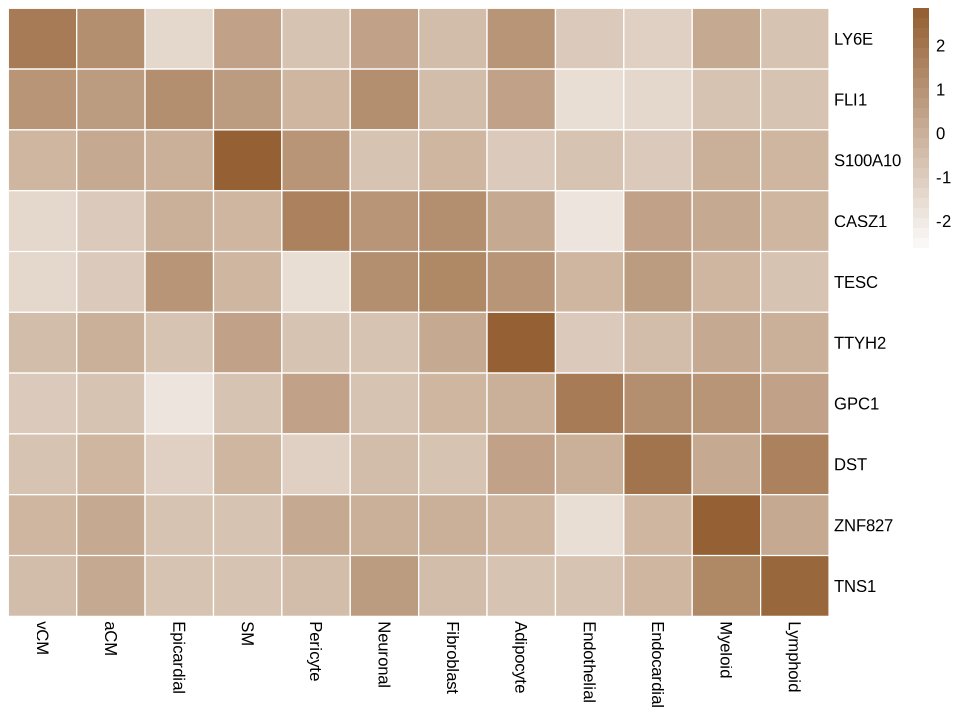

In [394]:
qgene1 <- c("LY6E", "FLI1", "S100A10", "CASZ1", "TESC", "TTYH2", "GPC1", "DST", "ZNF827","TNS1")
t1 <- log10(gacpm[intersect(qgene1, rownames(gacpm)), corder] + 1) %>%
pheatmap(scale = "row", border_color = "white", cluster_cols = F, cluster_rows = F, 
         color = colorRampPalette(c("white", "#956134"))(25))
ggsave(t1, filename = "plot/FIG_FNIH_Heart_pool_H3K27me3.GA.marker.pdf",
       dpi = 300, height = 6, width = 6.5)

In [456]:
qpeak1 <- fdet %>% filter((pct.1-pct.2) >= 0.1, avg_log2FC > 0) %>% 
mutate(cluster = factor(cluster, levels = corder)) %>%
arrange(cluster) %>% group_by(cluster) %>% 
slice_max(order_by = avg_log2FC, n = 5) %>%
ungroup %>% dplyr::select(gene) %>% unlist %>% unique
atrange <- stringr::str_split_fixed(qpeak1, pattern = "[-:]", n = 3)
atrange <- GenomicRanges::GRanges(atrange[,1], IRanges::IRanges(as.integer(atrange[,2]), as.integer(atrange[,3])))

tss <- read.table("/projects/ps-renlab2/y2xie/ps-renlab/y2xie/projects/genome_ref/refdata-cellranger-arc-GRCh38-2020-A-2.0.0/regions/tss_1500bp.bed")
tsrange <- GenomicRanges::GRanges(tss$V1, IRanges::IRanges(tss$V2, tss$V3))
qgene1 <- tss[subjectHits(findOverlaps(atrange, tsrange)),] %>%
dplyr::select(V7) %>% unlist %>% unique

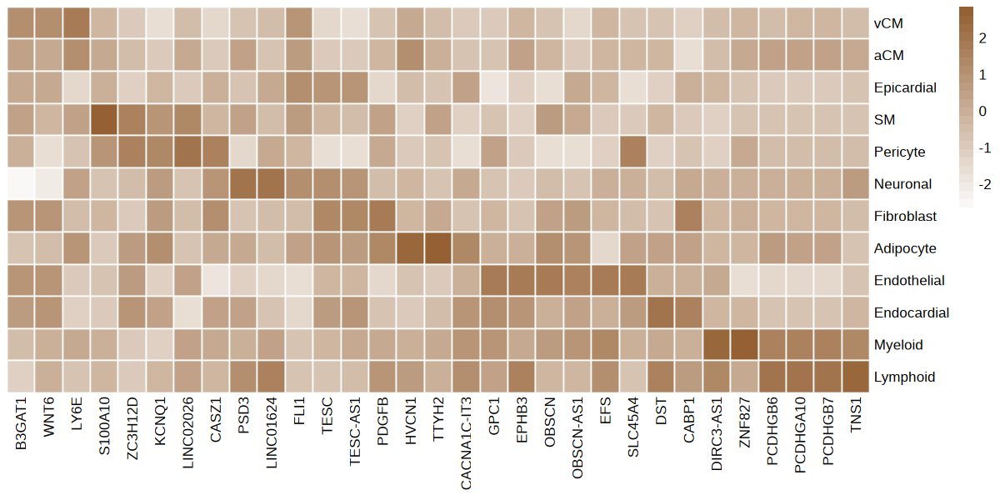

In [468]:
options(repr.plot.width = 10, repr.plot.height = 5)

rmat <- log10(gacpm[intersect(c(qgene1, "LY6E", "FLI1", "S100A10", "CASZ1", "TESC", "TTYH2", "GPC1", "DST", "ZNF827","TNS1"), rownames(gacpm)), corder] + 1)
max_indices <- max.col(rmat)
permutation_vector <- order(max_indices)
smat <- rmat[permutation_vector, ]
t1 <- smat %>% t %>%
pheatmap(scale = "column", border_color = "white", cluster_cols = F, 
         cluster_rows = F, angle_col = 90,
         color = colorRampPalette(c("white", "#956134"))(25))

ggsave(t1, filename = "plot/FIG_FNIH_Heart_pool_H3K27ac.GA.marker.pdf",
       dpi = 300, width = 10, height = 4.5)

In [395]:
qmeta <- rmeta %>% filter(orig.ident == "DPT", Target == "H3K27ac", integrated_majortype == "1")
rownames(qmeta) <- paste0(qmeta$dna, ":", qmeta$dna_bc)
vcell <- intersect(rownames(qmeta), ga$obs_names)

qmeta <- qmeta[vcell,] 
qmeta$nCount_histone <- ga$obs[rownames(qmeta), ]$n_fragment %>% as.character %>% as.integer
gacpm <- ArcXPM(t(ga$X[vcell, ]), meta = qmeta, method = "CPM", group.by = "nn2.celltype")
write.csv(gacpm, "FNIH_Heart_analysis/FNIH_Heart_pool_H3K27ac.GA.cpm.csv", quote = F)

sparsity: 0.904356279356279
coarse dgTMatrix into Matrix.
check readSums:  12 
check obj_mtx_collapse:  12 


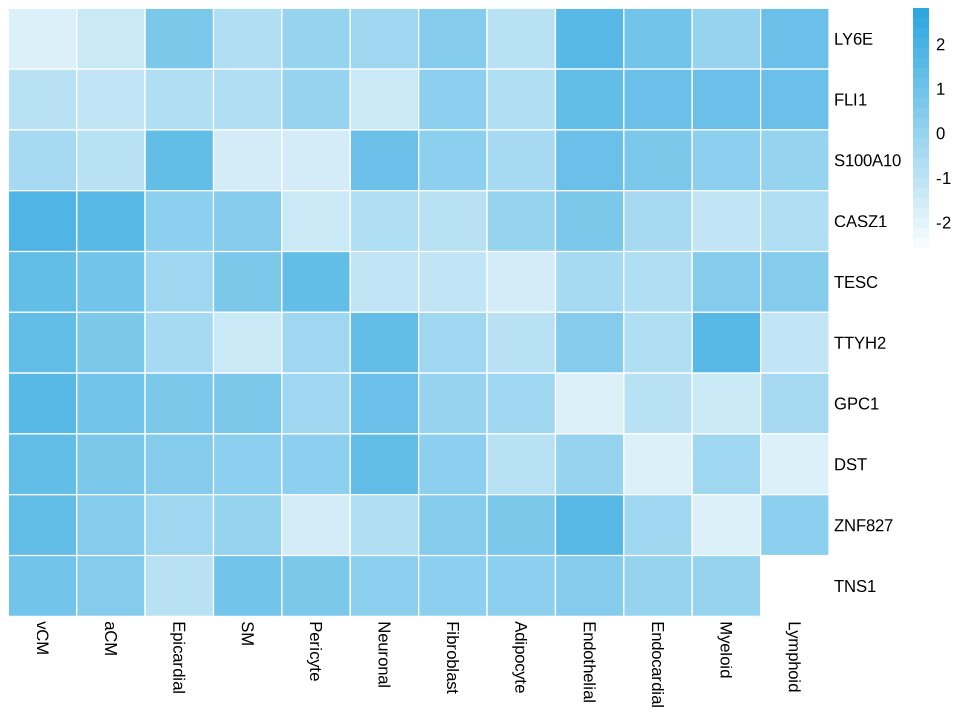

In [396]:
t2 <- log10(gacpm[intersect(qgene1, rownames(gacpm)), corder] + 1) %>%
pheatmap(scale = "row", border_color = "white", cluster_cols = F, cluster_rows = F, 
         color = colorRampPalette(c("white", "#2EA7E0"))(25))
ggsave(t2, filename = "plot/FIG_FNIH_Heart_pool_H3K27ac.GA.marker.pdf",
       dpi = 300, height = 6, width = 6.5)

## Generate celltype matrix for DEseq

In [87]:
K27ac_cpm <- read.csv('FNIH_Heart_pool_chamber_celltype_donor.H3K27ac.peaks.rpm.csv', row.names = 1)
# K27ac_cpm <- read.csv('FNIH_Heart_pool_chamber_celltype_donor.H3K27ac.HeartUnionPeak.rpm.csv', row.names = 1)
K27ac_cpm <- K27ac_cpm[rowSums(K27ac_cpm) > 0,]
head(K27ac_cpm)

,Adipocyte.LA.D35,Adipocyte.LA.D36,Adipocyte.LA.D37,Adipocyte.LA.D40,Adipocyte.LA.D51,Adipocyte.LA.D52,Adipocyte.LA.D53,Adipocyte.LA.D55,Adipocyte.LA.DTX031,Adipocyte.LA.DTX065,⋯,vCM.RVF.DTX087,vCM.RVF.DTX088,vCM.RVF.DTX089,vCM.RVF.DTX091,vCM.RVF.DTX093,vCM.RVF.DTX096,vCM.RVF.DTX097,vCM.RVF.DTX105,vCM.RVF.DTX114,vCM.RVF.DTX119
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr1:9790-10789,1,1,1,0,1,1,1,0,0,0,⋯,17,3,72,32,7,10,7,59,11,18
chr1:13164-14163,0,0,0,0,0,0,0,0,0,0,⋯,1,0,5,0,0,0,1,0,0,0
chr1:14215-15214,0,0,0,0,0,0,0,0,0,0,⋯,0,0,1,0,1,1,0,0,0,0
chr1:15727-16726,0,0,0,0,0,0,0,0,0,0,⋯,0,0,3,0,0,0,0,2,0,0
chr1:17010-18009,0,0,0,0,0,0,1,0,0,0,⋯,0,0,1,2,0,0,0,1,1,2
chr1:18786-19785,0,0,0,0,0,0,0,0,0,0,⋯,0,0,1,0,0,0,0,0,0,0


In [142]:
for (f in unique(mmg$predicted.celltype)){
    tmp <- K27ac_cpm[,grep(f, colnames(K27ac_cpm))]
#     valid <- read.table(paste0("../10.conserved_peaks/celltype_H3K27ac/FNIH_heart_H3K27ac.", f, ".bed"), sep = "\t")
    valid <- read.table(paste0("../reference/FNIH_peaks/", f, "_UnifiedFiltVariable.bed"), sep = "\t")
    drange <- paste0(valid$V1, ":", valid$V2, "-", valid$V3)
    tmp <- tmp[intersect(drange, rownames(tmp)),]
    rownames(tmp) <- sub(":", "-", rownames(tmp))
    colnames(tmp) <- gsub(paste0(f, "."), "", colnames(tmp))
    for (chamber in c("LV", "RA", "RVF", "LA")){
        tmp2 <- tmp[,grep(chamber, colnames(tmp)),drop=F]
        colnames(tmp2) <- gsub(paste0(chamber,"."), "", colnames(tmp2))
        write.table(tmp2, paste0("../10.conserved_peaks/peaks_mtx/", chamber, "_", f, "_HeartUnionPeak_H3K27ac_donor_count.xls"), sep = "\t", quote = F,
                   row.names = T, col.names = T)
    }
}

In [145]:
# K27me3_cpm <- read.csv('FNIH_Heart_pool_chamber_celltype_donor.H3K27me3.peaks.rpm.csv', row.names = 1)
K27me3_cpm <- read.csv('FNIH_Heart_pool_chamber_celltype_donor.H3K27me3.HeartUnionPeak.rpm.csv', row.names = 1)
K27me3_cpm <- K27me3_cpm[rowSums(K27me3_cpm) > 0,]

In [274]:
system("mkdir bin_mtx")
for (f in corder){
    tmp <- K27me3_cpm[,grep(f, colnames(K27me3_cpm))]
    write.table(tmp, paste0("bin_mtx/", f, "_H3K27me3_donor.15kb_bin.rpm.xls"), sep = "\t", quote = F,
               row.names = T, col.names = T)
}

In [146]:
for (f in unique(mmg$predicted.celltype)){
    tmp <- K27me3_cpm[,grep(f, colnames(K27me3_cpm))]
#     valid <- read.table(paste0("../10.conserved_peaks/celltype_H3K27me3/FNIH_heart_H3K27me3.", f, ".bed"), sep = "\t")
    valid <- read.table(paste0("../reference/FNIH_peaks/", f, "_UnifiedFiltVariable.bed"), sep = "\t")
    drange <- paste0(valid$V1, ":", valid$V2, "-", valid$V3)
    tmp <- tmp[intersect(drange, rownames(tmp)),]
    rownames(tmp) <- sub(":", "-", rownames(tmp))
    colnames(tmp) <- gsub(paste0(f, "."), "", colnames(tmp))
    for (chamber in c("LV", "RA", "RVF", "LA")){
        tmp2 <- tmp[, grep(chamber, colnames(tmp)),drop=F]
        colnames(tmp2) <- gsub(paste0(chamber,"."), "", colnames(tmp2))
        write.table(tmp2, paste0("../10.conserved_peaks/peaks_mtx/", chamber, "_", f, "_HeartUnionPeak_H3K27me3_donor_count.xls"), sep = "\t", quote = F,
                   row.names = T, col.names = T)
    }
}

In [130]:
### TSS table
system("mkdir ../10.conserved_peaks/tss_mtx/")
K27me3_cpm <- read.csv('FNIH_Heart_pool_chamber_celltype_donor.H3K27me3.TSS.rpm.csv', row.names = 1)
for (f in unique(mmg$predicted.celltype)){
    tmp <- K27me3_cpm[,grep(f, colnames(K27me3_cpm))]
    rownames(tmp) <- sub(":", "-", rownames(tmp))
    colnames(tmp) <- gsub(paste0(f, "."), "", colnames(tmp))
    for (chamber in c("LV", "RA", "RVF", "LA")){
        tmp2 <- tmp[, grep(chamber, colnames(tmp)),drop=F]
        tmp2 <- tmp2[rowSums(tmp2) > 0,]
        if (!is.null(nrow(tmp2))){
            colnames(tmp2) <- gsub(paste0(chamber,"."), "", colnames(tmp2))
            write.table(tmp2, paste0("../10.conserved_peaks/tss_mtx/", chamber, "_", f, "_H3K27me3_donor_count.xls"), sep = "\t", quote = F,
                       row.names = T, col.names = T)
        } 
    }
}

In [131]:
K27ac_cpm <- read.csv('FNIH_Heart_pool_chamber_celltype_donor.H3K27ac.TSS.rpm.csv', row.names = 1)
for (f in unique(mmg$predicted.celltype)){
    tmp <- K27ac_cpm[,grep(f, colnames(K27ac_cpm))]
    rownames(tmp) <- sub(":", "-", rownames(tmp))
    colnames(tmp) <- gsub(paste0(f, "."), "", colnames(tmp))
    for (chamber in c("LV", "RA", "RVF", "LA")){
        tmp2 <- tmp[, grep(chamber, colnames(tmp)),drop=F]
        tmp2 <- tmp2[rowSums(tmp2) > 0,]
        if (!is.null(nrow(tmp2))){
            colnames(tmp2) <- gsub(paste0(chamber,"."), "", colnames(tmp2))
            write.table(tmp2, paste0("../10.conserved_peaks/tss_mtx/", chamber, "_", f, "_H3K27ac_donor_count.xls"), sep = "\t", quote = F,
                       row.names = T, col.names = T)
        } 
    }
}

In [138]:
### Also read and output a gene-tss table
tss <- read.table("/projects/ps-renlab/y2xie/projects/genome_ref/refdata-cellranger-arc-GRCh38-2020-A-2.0.0/regions/tss_1500bp.bed")
tss <- tss %>% mutate(range = paste0(V1, ":", V2, "-", V3)) %>% 
select(c(V7, range)) %>% setNames(c("gene", "cood")) %>% mutate(note = "unique")
duprange <- tss$cood[!(duplicated(tss$cood)|duplicated(tss$cood, fromLast=TRUE))]
tss[tss$cood %in% duprange,]$note <- "shared"
write.table(tss, "../10.conserved_peaks/tss_mtx/tss_gene.info", quote = F, row.names = T, col.names = T, sep = "\t")
write.table(tss, "../../78.FNIH_DPT_IGM_240813/10.conserved_peaks/tss_mtx/tss_gene.info", quote = F, row.names = T, col.names = T, sep = "\t")

In [77]:
### Check coverage
K27ac_cpm <- read.csv('FNIH_Heart_pool_chamber_celltype_donor.H3K27ac.HeartUnionPeak.rpm.csv', row.names = 1)
head(K27ac_cpm)

,Adipocyte.LA.D35,Adipocyte.LA.D36,Adipocyte.LA.D37,Adipocyte.LA.D40,Adipocyte.LA.D51,Adipocyte.LA.D52,Adipocyte.LA.D53,Adipocyte.LA.D55,Adipocyte.LA.DTX031,Adipocyte.LA.DTX065,⋯,vCM.RVF.DTX087,vCM.RVF.DTX088,vCM.RVF.DTX089,vCM.RVF.DTX091,vCM.RVF.DTX093,vCM.RVF.DTX096,vCM.RVF.DTX097,vCM.RVF.DTX105,vCM.RVF.DTX114,vCM.RVF.DTX119
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr10:100006284-100006584,0,0,0,0,0,0,0,0,0,0,⋯,0,0,1,1,0,0,0,1,0,1
chr10:10001292-10001592,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,2,0,0
chr10:100020786-100021081,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,1,0,0,0,0,0,0
chr10:100038502-100038802,1,0,0,0,0,0,0,0,0,0,⋯,0,0,2,1,0,1,0,0,0,0
chr10:100043798-100044098,0,0,0,0,0,0,0,0,0,0,⋯,1,0,0,2,0,0,0,1,0,0
chr10:100115013-100115313,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


In [88]:
K27ac_cpm %>% dim 

### Filter cCREs
K27ac_cpm_subset <- K27ac_cpm[rowSums(K27ac_cpm) > (ncol(K27ac_cpm)/3),]
K27ac_cpm_subset %>% dim
for (f in unique(gsub("^([^.]+).*", "\\1", colnames(K27ac_cpm)))){
    tmp <- K27ac_cpm_subset[,grep(f, colnames(K27ac_cpm_subset))]
    print(f)
    print(colMeans(K27ac_cpm_subset) %>% mean)
}

[1] 416794   1134

[1] 205211   1134

[1] "Adipocyte"
[1] 0.9194813
[1] "Endocardial"
[1] 0.9194813
[1] "Endothelial"
[1] 0.9194813
[1] "Epicardial"
[1] 0.9194813
[1] "Fibroblast"
[1] 0.9194813
[1] "Lymphoid"
[1] 0.9194813
[1] "Myeloid"
[1] 0.9194813
[1] "Neuronal"
[1] 0.9194813
[1] "Pericyte"
[1] 0.9194813
[1] "SM"
[1] 0.9194813
[1] "aCM"
[1] 0.9194813
[1] "vCM"
[1] 0.9194813


## Genearte pseudobulk donor information for histone modification diff test

In [71]:
table(donor_info[donor_info$chamber == "LV" ,c("sex", "disease_status_major")])
### shit

table(donor_info[donor_info$chamber == "LV" ,]$disease_status_major)

### try 5 donors per pseudo-group
tmp <- donor_info[donor_info$chamber == "LV" , c("donor", "disease_status_major")] %>% distinct
split_into_classes <- function(df_group, rows_per_class) {
    class_labels <- rep(1:ceiling(nrow(df_group) / rows_per_class), each = rows_per_class)[1:nrow(df_group)]
    df_group$class <- class_labels
    return(df_group)
}

rows_per_class <- 3
df_split <- tmp %>%
group_by(disease_status_major) %>%
group_modify(~ split_into_classes(.x, rows_per_class)) %>%
ungroup() %>%
mutate(class = paste0(disease_status_major, "_pseudorep_", class))

        disease_status_major
sex      HF NON_HF
  female  2      8
  male   18      2


    HF NON_HF 
    20     10 

In [556]:
read.table("../reference/4chambers_Ac1kb//4Chambers_Ac//HFnonHF_ResultsSummaries.tsv", sep = '\t')

,celltype,contrast,overall_meanCount,non0s_genes,up_pval,down_pval,up_padj,down_padj
,<chr>,<chr>,<dbl>,<int>,<int>,<int>,<int>,<int>
1,aCM_H3k27ac,HF_vs_NON_HF,3.4383353,39063,5098,3354,88,63
2,Endocardial_H3k27ac,HF_vs_NON_HF,0.1809744,1,236,418,0,0
3,Endothelial_H3k27ac,HF_vs_NON_HF,1.7191401,22517,2638,3914,13,27
4,Fibroblast_H3k27ac,HF_vs_NON_HF,0.6656144,3818,2164,3363,0,0
5,Low quality_H3k27ac,HF_vs_NON_HF,0.1608311,9,180,283,0,0
6,Lymphoid_H3k27ac,HF_vs_NON_HF,0.3260571,183,872,859,0,0
7,Myeloid_H3k27ac,HF_vs_NON_HF,2.2415656,7352,4125,9222,4,16
8,Pericyte_H3k27ac,HF_vs_NON_HF,0.8921581,4865,976,1373,0,14
9,SM_H3k27ac,HF_vs_NON_HF,0.1635579,12,172,521,0,0


In [628]:
rpm <- read.csv("FNIH_Heart_signal/FNIH_Heart_pool_celltype_donor.H3K27ac.peaks.rpm.csv", row.names = 1)
colnames(rpm) <- stringr::str_split(colnames(rpm), pattern = "\\.") %>% 
lapply(function(x) paste0(x[1], ":", x[length(x)])) %>% unlist
       
trpm <- rpm[,grep("Fibroblast", colnames(rpm))]

In [629]:
### try to merge into two replicates for DESeq2
tmp <- stringr::str_split_fixed(colnames(trpm), pattern = ":", n = 2) %>%
as.data.frame

tgroup <- merge(tmp, distinct(donor_info[,c("donor", "disease_status_major", "sex")]), by.x = "V2", by.y = "donor") %>%
group_by(disease_status_major, sex) %>%
mutate(group = rep(1:2, length.out = n())) %>%
ungroup %>%
mutate(name = paste0(V1, ":", V2)) %>%
mutate(group = paste0(disease_status_major, "_pseudo", group))

tmtx <- matrix(0, nrow = nrow(trpm), ncol = length(unique(tgroup$group)), 
               dimnames = list(rownames(trpm), unique(tgroup$group)))

for (f in unique(tgroup$group)){
       tmtx[,f] <- trpm[, tgroup[tgroup$group == f,]$name] %>% rowSums 
}

tmtx <- tmtx %>% as.data.frame

In [635]:
# write.table(tmtx, "FNIH_Heart_signal/FNIH_Heart_pool_vCM_pseudodonor.H3K27ac.peaks.rpm.csv",
#            sep = "\t", quote = F, row.names = T, col.names = T)
# write.table(tgroup, "FNIH_Heart_signal/FNIH_Heart_pool_vCM_pseudodonor.condition.csv",
#            sep = "\t", quote = F, row.names = T, col.names = T)

head(counts_filtered)

,NON_HF_pseudo1,NON_HF_pseudo2,HF_pseudo1,HF_pseudo2
,<dbl>,<dbl>,<dbl>,<dbl>
chr1:9790-10789,123,106,158,128
chr1:180334-181333,22,30,39,37
chr1:777105-778104,6,11,12,16
chr1:778246-779245,40,45,66,79
chr1:779248-780247,8,6,10,18
chr1:817488-818487,15,15,23,32


In [630]:
suppressPackageStartupMessages(library(DESeq2))
counts_filtered <- tmtx[rowMeans(tmtx) >= 10, ]
meta_cell.use <- tgroup %>% dplyr::select(group) %>%
distinct %>% mutate(condition = gsub("_pseudo.*", "", group)) %>%
tibble::column_to_rownames("group")

dds <- DESeqDataSetFromMatrix(countData = counts_filtered,
                                          colData = meta_cell.use, 
                                          design = ~ condition)
dds$condition <- factor(dds$condition, levels = c("NON_HF", "HF"))
dds <- DESeq(dds)
dds.results <- results(dds, alpha = 0.05)
summary(dds.results)

converting counts to integer mode

Warning message in DESeqDataSet(se, design = design, ignoreRank):
“some variables in design formula are characters, converting to factors”
estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing




out of 96627 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)       : 0, 0%
LFC < 0 (down)     : 0, 0%
outliers [1]       : 0, 0%
low counts [2]     : 0, 0%
(mean count < 8)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



In [627]:
meta_cell.use

,condition
,<chr>
NON_HF_pseudo1,NON_HF
NON_HF_pseudo2,NON_HF
HF_pseudo1,HF
HF_pseudo2,HF


In [620]:
dim(dds.results)

[1] 411364      6

In [73]:
system("mkdir ../10.conserved_peaks/peaks_mtx/pseudorep")
file <- list.files(path = '../10.conserved_peaks/peaks_mtx/', pattern = ".*aCM_HeartUnionPeak_H3K27ac_donor_count.xls")
for (f in file){
    test <- read.table(paste0("../10.conserved_peaks/peaks_mtx/", f), header = T) %>% as.matrix
    colnames(test) <- df_split[match(colnames(test), df_split$donor),]$class
    test <- OP2(as(Matrix(test, sparse = "T"), "dgTMatrix")) %>% as.data.frame
    write.table(test, paste0("../10.conserved_peaks/peaks_mtx/pseudorep/", f), sep = "\t", quote = F,
                row.names = T, col.names = T)
}
write.table(df_split, "../10.conserved_peaks/peaks_mtx/pseudorep/design.xls", sep = "\t", quote = F, row.names = F, col.names = T)

In [95]:
colSums(K27ac_cpm) %>% summary

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    420   14439   56486  234108  204374 7015220 

In [1842]:
### Calculate gene expression variance in each cell major type in HF vs control

In [1864]:
ref <- NormalizeData(ref, normalization.method = "LogNormalize", assay = "RNA", scale.factor = 10000)

cv <- function(x){
    meanx = mean(x)
    sdx = sd(x)
    return(sdx / meanx)
}

In [1874]:
options(warn = 0)
qgene <- rownames(rpkm)[unlist(apply(rpkm, 1, function(x) mean(x) > 0.1))] 
qgene <- intersect(rownames(ref[["RNA"]]@counts), qgene)
fh_var <- nfh_var <- list()
for (f in unique(ref$cell.major_types)){
    cells1 <- ref@meta.data %>% filter(cell.major_types == f, disease_status_major == "NON_HF") %>% rownames
    cells2 <- ref@meta.data %>% filter(cell.major_types == f, disease_status_major == "HF") %>% rownames
    bumm <- min(length(cells1), length(cells2))
    cells1 <- sample(cells1, size = bumm, replace = F)
    cells2 <- sample(cells2, size = bumm, replace = F)
    nfh_var[[f]] <- data.frame(gene = qgene, var = unlist(apply(ref[["RNA"]]@data[qgene, cells1], MARGIN = 1, function(x) cv(x))), celltype = f)
    fh_var[[f]] <- data.frame(gene = qgene, var = unlist(apply(ref[["RNA"]]@data[qgene, cells2], MARGIN = 1, function(x) cv(x))), celltype = f)
}
                                                               

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 3.1 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 3.1 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.3 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.3 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 3.2 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 3.2 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.0 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.0 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.4 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.4 GiB”
Warning message in asMethod(ob

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“Removed 21225 rows containing non-finite outside the scale range (`stat_ydensity()`).”
Warning message:
“Removed 21225 rows containing non-finite outside the scale range (`stat_boxplot()`).”


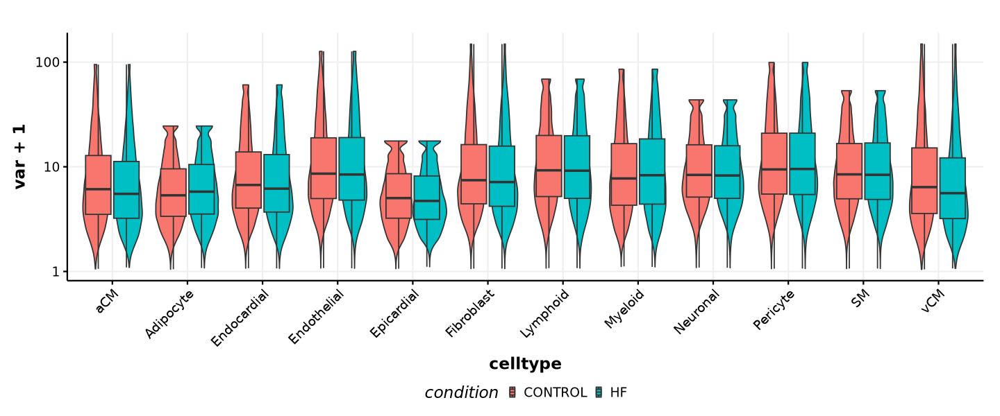

In [1885]:
# nfh_var <- do.call(rbind, nfh_var) %>% mutate(condition = "CONTROL")
# fh_var <- do.call(rbind, fh_var) %>% mutate(condition = "HF")

options(repr.plot.width = 12, repr.plot.height = 5)
rbind(nfh_var, fh_var) %>%
ggplot(aes(x = celltype, y = var+1, fill = condition)) + 
geom_violin() + 
geom_boxplot(outlier.shape = NA, coef = 2) + 
scale_y_log10() + 
theme_Publication() + 
theme(axis.text.x = element_text(angle = 45, hjust = 1))

## Cluster correlation

In [3]:
mmg <- qs::qread("FNIH_Heart_pool_DPT_SNG_SoupX_reference_mapping_filtered.qs")
mmg@meta.data[colnames(mmg), colnames(donor_info)] <- donor_info[match(mmg$Donor, donor_info$donor), colnames(donor_info)]

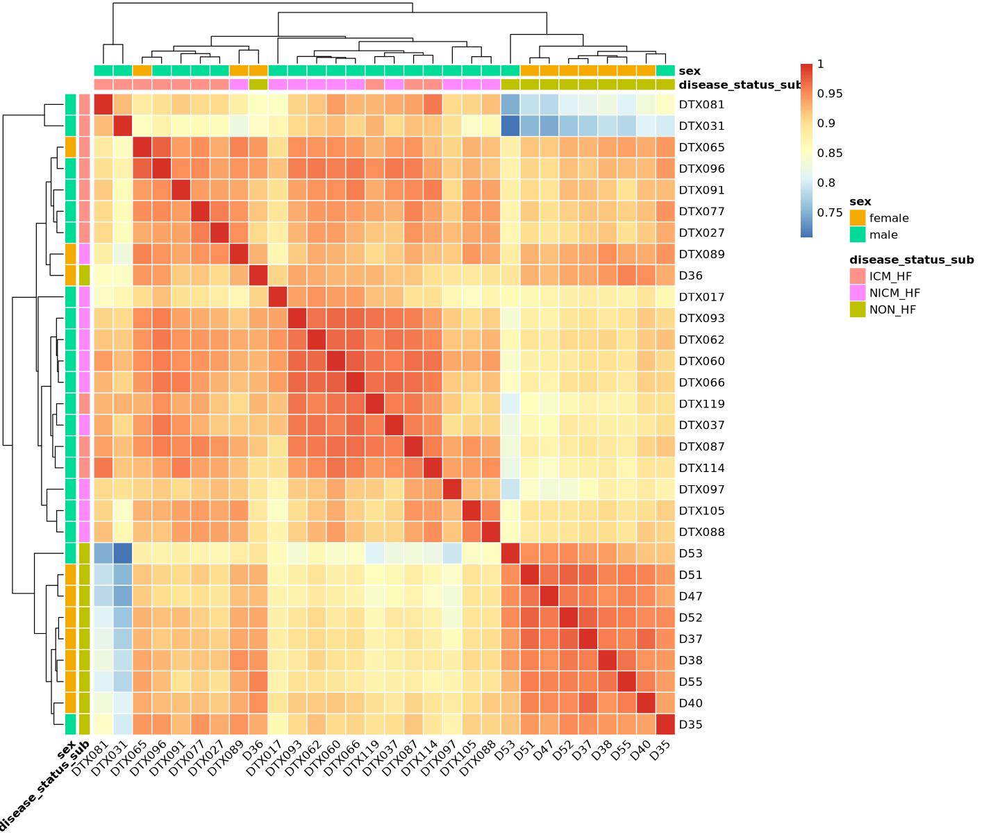

In [17]:
### check donor GEX!
# mtx <- mmg@assays$RNA@layers$counts
# colnames(mtx) <- colnames(mmg)
# rownames(mtx) <- rownames(mmg@assays$RNA@features)

# dpm <- ArcXPM2(mtx, meta = mmg@meta.data, method = "RPKM", 
#                 group.by = "Donor",
#                 gene_length = "/projects/ps-renlab/y2xie/projects/genome_ref/Paired-Tag/hg38/hg38.gcode.10X.bed")

options(repr.plot.width = 12, repr.plot.height = 10)

anno <- mmg@meta.data[,c("Donor", "disease_status_sub", "sex")] %>% distinct %>% arrange(disease_status_sub)
rownames(anno) <- anno$Donor
anno$Donor <- NULL

cor(dpm[VariableFeatures(mmg), rownames(anno)], method = "spearman", use = "complete.obs") %>%
pheatmap(scale = "none", cluster_rows = T, cluster_cols = T, angle_col = 45, 
         annotation_row = anno, annotation_col = anno,
         border_color = "white")

In [ ]:
mmg$disease.celltype <- paste0(mmg$predicted.celltype, "_", mmg$Description)
rpkm2 <- ArcXPM2(mmg[["RNA"]]@counts, meta = mmg@meta.data, method = "RPKM", 
                group.by = "Description", 
                gene_length = "/projects/ps-renlab/y2xie/projects/genome_ref/Paired-Tag/hg38/hg38.gcode.10X.bed")

In [962]:
# ref <- qs::qread("../reference/LV_RV_LA_RA.multiome.mrg.filt.MTless.silQC.curated.RNA.qs")
ref$condition <- paste0(ref$cell.major_types, "_", ref$chamber, "_", ref$disease_status_major)
rpkm <- ArcXPM(ref[["RNA"]]@counts, meta = ref@meta.data, method = "RPKM", 
                group.by = "condition", 
                gene_length = "/projects/ps-renlab2/y2xie/ps-renlab/y2xie/projects/genome_ref/Paired-Tag/hg38/hg38.gcode.10X.bed")
write.table(rpkm, "FNIH_Heart_signal/FNIH_Heart_pool.FNIH_celltype_chamber_HF.rpkm.txt", sep = "\t", quote = F, row.names = T, col.names = T)

sparsity: 0.640241154353726
coarse dgTMatrix into Matrix.
check readSums:  88 
check obj_mtx_collapse:  88 


## Plot UMAP

In [19]:
mmg$atac_bc <- mmg$dna_bc
mmg$dna_bc <- paste0(mmg$dna, ":", mmg$atac_bc)

### embed with only euchromsome bin
K27ac_umap <- read.csv("FNIH_Heart_pool.H3K27ac.umap.csv", row.names = 1)
K27me3_umap <- read.csv("FNIH_Heart_pool.H3K27me3.umap.csv", row.names = 1)
rownames(K27ac_umap) <- mmg@meta.data[match(rownames(K27ac_umap), mmg$dna_bc), ] %>% rownames
rownames(K27me3_umap) <- mmg@meta.data[match(rownames(K27me3_umap), mmg$dna_bc), ] %>% rownames
colnames(K27ac_umap) <- colnames(mmg@reductions$umap@cell.embeddings)
colnames(K27me3_umap) <- colnames(mmg@reductions$umap@cell.embeddings)

mmg <- subset(mmg, cells = c(rownames(K27ac_umap), rownames(K27me3_umap)))

### assign
mmg[["k27ac_umap"]] <- CreateDimReducObject(embeddings = as.matrix(K27ac_umap), key = "acUMAP_", assay = DefaultAssay(mmg))
mmg[["k27me3_umap"]] <- CreateDimReducObject(embeddings = as.matrix(K27me3_umap), key = "meUMAP_", assay = DefaultAssay(mmg))

mmg
dim(K27ac_umap)
dim(K27me3_umap)

An object of class Seurat 
70064 features across 131253 samples within 2 assays 
Active assay: SCT (33463 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: RNA
 5 dimensional reductions calculated: pca, harmony, umap, k27ac_umap, k27me3_umap

[1] 68325     2

[1] 62928     2

Warning message:
“Removed 62928 rows containing missing values or values outside the scale range (`geom_point()`).”
Warning message:
“Removed 68325 rows containing missing values or values outside the scale range (`geom_point()`).”


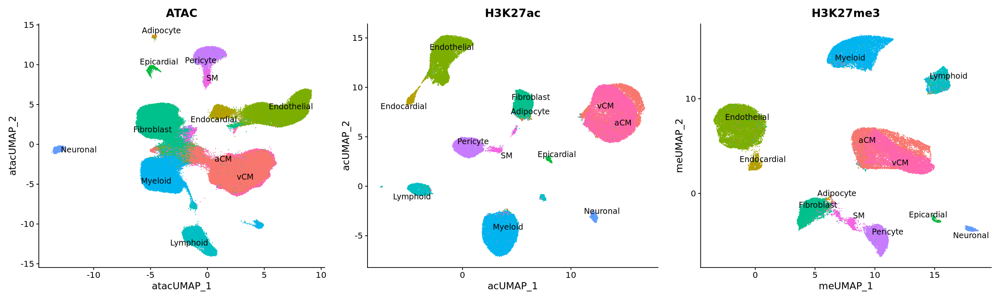

In [28]:
### also check ATAC
atac <- readRDS("../reference/LV_RV_LA_RA.multiome.mrg.filt.MTless.silQC.curated.peaks.rds")

options(repr.plot.width = 20, repr.plot.height = 6)
t1 <- DimPlot(atac, reduction = "umap.atac", group.by = "cell.major_types", 
        label = T, repel = T, raster = F) + NoLegend() + ggtitle("ATAC") #& scale_color_manual(values = celltype_colors)
t2 <- DimPlot(mmg, reduction = "k27ac_umap", group.by = "predicted.celltype", label = T, repel = T, raster = F) + NoLegend() + ggtitle("H3K27ac") #& scale_color_manual(values = celltype_colors) 
t3 <- DimPlot(mmg, reduction = "k27me3_umap", group.by = "predicted.celltype", label = T, repel = T, raster = F) + NoLegend() + ggtitle("H3K27me3") #& scale_color_manual(values = celltype_colors)

cowplot::plot_grid(t1, t2, t3, ncol = 3)

In [31]:
atac[["SCT"]] <- NULL
atac[["RNA"]] <- NULL
saveRDS(atac, "../reference/LV_RV_LA_RA.multiome.mrg.filt.MTless.silQC.curated.peaks.rds")

In [32]:
rm(atac); gc()

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,10040850,536.3,15643751,835.5,15643751,835.5
Vcells,10605063520,80910.3,16146521588,123188.2,10757210026,82071.0


Warning message:
“Removed 62928 rows containing missing values or values outside the scale range (`geom_point()`).”
Warning message:
“Removed 68325 rows containing missing values or values outside the scale range (`geom_point()`).”


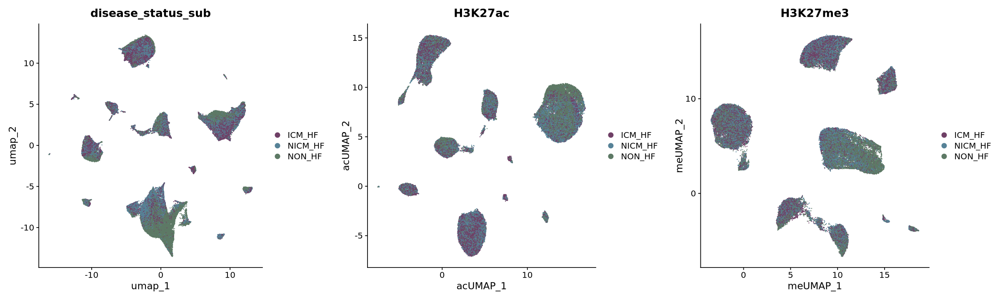

In [25]:
### Plot disease condition
# mmg@meta.data[, colnames(donor_info)] <- donor_info[match(mmg$Donor, donor_info$donor_demux), ]

options(repr.plot.width = 20, repr.plot.height = 6)
gtp <- "disease_status_sub"
t1 <- DimPlot(mmg, group.by = gtp, label = F, repel = T, raster = F) & scale_color_manual(values = colfunc(5))
t2 <- DimPlot(mmg, reduction = "k27ac_umap", group.by = gtp, label = F, repel = T, raster = F) + ggtitle("H3K27ac") & scale_color_manual(values = colfunc(5))
t3 <- DimPlot(mmg, reduction = "k27me3_umap", group.by = gtp, label = F, repel = T, raster = F) + ggtitle("H3K27me3") & scale_color_manual(values = colfunc(5))

cowplot::plot_grid(t1, t2, t3, ncol = 3)

Warning message:
“Removed 62928 rows containing missing values or values outside the scale range (`geom_point()`).”
Warning message:
“Removed 68325 rows containing missing values or values outside the scale range (`geom_point()`).”


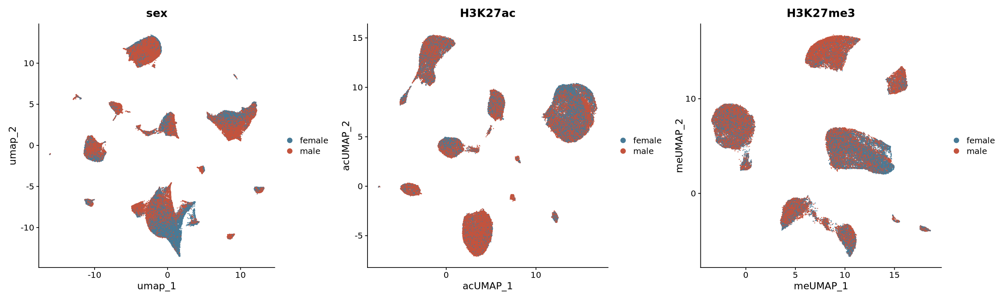

In [24]:
options(repr.plot.width = 20, repr.plot.height = 6)
gtp <- "sex"
t1 <- DimPlot(mmg, group.by = gtp, label = F, repel = T, raster = F) & scale_color_manual(values = colfunc2(5))
t2 <- DimPlot(mmg, reduction = "k27ac_umap", group.by = gtp, label = F, repel = T, raster = F) + ggtitle("H3K27ac") & scale_color_manual(values = colfunc2(5))
t3 <- DimPlot(mmg, reduction = "k27me3_umap", group.by = gtp, label = F, repel = T, raster = F) + ggtitle("H3K27me3") & scale_color_manual(values = colfunc2(5))

cowplot::plot_grid(t1, t2, t3, ncol = 3)

## H3K27me3

In [344]:
rmeta <- read.csv("integration/CAREHF_Multiome_DPT_RNA_int.meta.csv", row.names = 1)

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


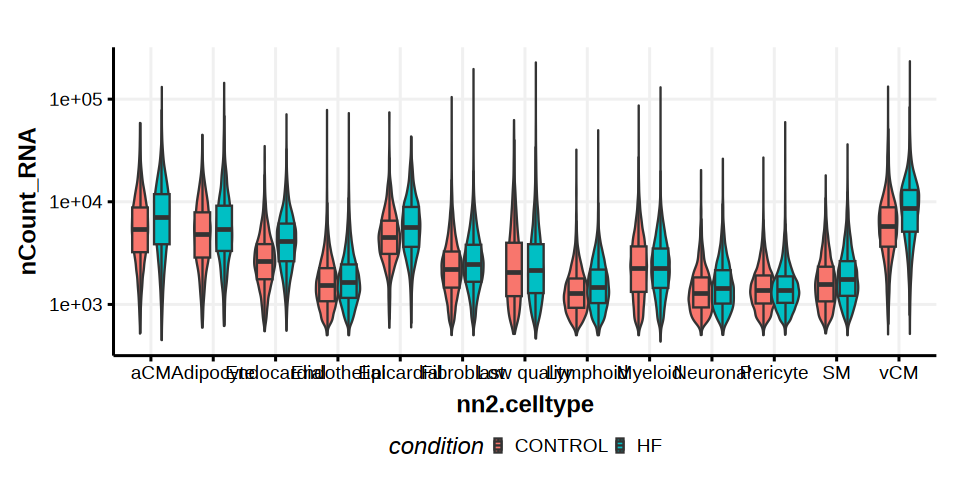

In [621]:
rmeta %>%
# filter(orig.ident == "DPT", Target == "H3K27me3") %>%
ggplot(aes(x = nn2.celltype, y = nCount_RNA, fill = condition)) + 
geom_violin(position = position_dodge(0.7)) + 
geom_boxplot(width = 0.5, position = position_dodge(0.7), coef = 2, outlier.shape = NA) +
scale_y_log10() + 
theme_Publication()

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“Removed 30 rows containing non-finite outside the scale range (`stat_ydensity()`).”
Warning message:
“Removed 30 rows containing non-finite outside the scale range (`stat_boxplot()`).”


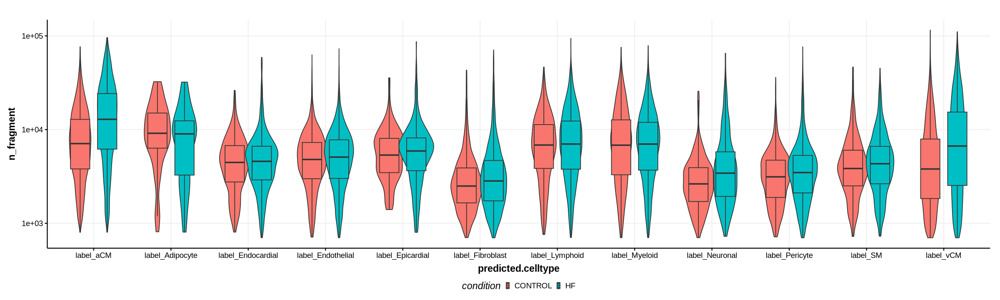

In [960]:
library(anndata)
# k27me3 <- read_h5ad("FNIH_Heart_cluster/FNIH_Heart_pool.H3K27me3.h5ad")
rmeta$n_fragment <- NA
rmeta$dna_bc <- paste0(rmeta$dna, ":", rmeta$dna_bc)
rmeta[match(k27me3$obs_names, rmeta$dna_bc), ]$n_fragment <- as.integer(as.character(k27me3$obs$n_fragment))

t1 <- rmeta %>%
filter(orig.ident == "DPT", Target == "H3K27me3") %>%
ggplot(aes(x = predicted.celltype, y = n_fragment, fill = condition)) + 
geom_violin(position = position_dodge(0.7)) + 
geom_boxplot(width = 0.5, position = position_dodge(0.7), coef = 2, outlier.shape = NA) +
scale_y_log10() + 
theme_Publication()

options(repr.plot.width = 20, repr.plot.height = 6)
t1

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“Removed 15 rows containing non-finite outside the scale range (`stat_ydensity()`).”
Warning message:
“Removed 15 rows containing non-finite outside the scale range (`stat_boxplot()`).”


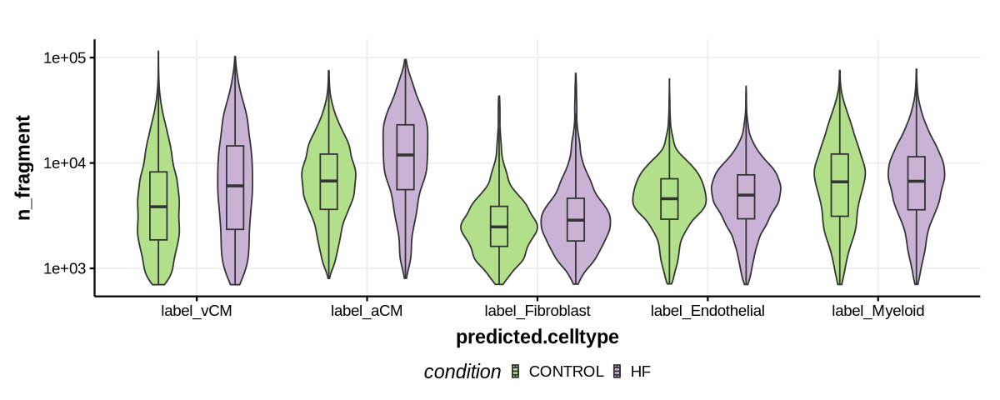

In [978]:
ydonor <- rmeta[rmeta$orig.ident == "MULTIOME" & rmeta$Age <= 60,] %>%
dplyr::select(donor) %>% unlist %>% unique

korder <- c('vCM','aCM','Fibroblast','Endothelial','Myeloid')

t1 <- rmeta %>%
filter(orig.ident == "DPT", Target == "H3K27me3") %>%
filter(predicted.celltype %in% paste0("label_", korder), Donor %in% ydonor) %>%
mutate(predicted.celltype = factor(predicted.celltype, levels = paste0("label_", korder))) %>%
ggplot(aes(x = predicted.celltype, y = n_fragment, fill = condition)) + 
geom_violin(position = position_dodge(0.9)) + 
geom_boxplot(width = 0.2, position = position_dodge(0.9), coef = 2, outlier.shape = NA) +
scale_y_log10() + 
theme_Publication() + 
scale_fill_manual(values = c("CONTROL" = '#B2DF8A',"HF" = '#CAB2D6'))

options(repr.plot.width = 10, repr.plot.height = 4)
t1

ggsave(t1, filename = "plot/FIG_HF_CONTROL_H3K27me3_young_donor.pdf",
       dpi = 300, height = 4, width = 8)

In [977]:
### sig test?
wilcox.test(t1$data[t1$data$predicted.celltype == "label_vCM" & t1$data$condition == "CONTROL",]$n_fragment,
            t1$data[t1$data$predicted.celltype == "label_vCM" & t1$data$condition == "HF",]$n_fragment)
wilcox.test(t1$data[t1$data$predicted.celltype == "label_aCM" & t1$data$condition == "CONTROL",]$n_fragment,
            t1$data[t1$data$predicted.celltype == "label_aCM" & t1$data$condition == "HF",]$n_fragment)
wilcox.test(t1$data[t1$data$predicted.celltype == "label_Fibroblast" & t1$data$condition == "CONTROL",]$n_fragment,
            t1$data[t1$data$predicted.celltype == "label_Fibroblast" & t1$data$condition == "HF",]$n_fragment)
wilcox.test(t1$data[t1$data$predicted.celltype == "label_Endothelial" & t1$data$condition == "CONTROL",]$n_fragment,
            t1$data[t1$data$predicted.celltype == "label_Endothelial" & t1$data$condition == "HF",]$n_fragment)
wilcox.test(t1$data[t1$data$predicted.celltype == "label_Myeloid" & t1$data$condition == "CONTROL",]$n_fragment,
            t1$data[t1$data$predicted.celltype == "label_Myeloid" & t1$data$condition == "HF",]$n_fragment)


	Wilcoxon rank sum test with continuity correction

data:  t1$data[t1$data$predicted.celltype == "label_vCM" & t1$data$condition == "CONTROL", ]$n_fragment and t1$data[t1$data$predicted.celltype == "label_vCM" & t1$data$condition == "HF", ]$n_fragment
W = 3228704, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0



	Wilcoxon rank sum test with continuity correction

data:  t1$data[t1$data$predicted.celltype == "label_aCM" & t1$data$condition == "CONTROL", ]$n_fragment and t1$data[t1$data$predicted.celltype == "label_aCM" & t1$data$condition == "HF", ]$n_fragment
W = 2440643, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0



	Wilcoxon rank sum test with continuity correction

data:  t1$data[t1$data$predicted.celltype == "label_Fibroblast" & t1$data$condition == "CONTROL", ]$n_fragment and t1$data[t1$data$predicted.celltype == "label_Fibroblast" & t1$data$condition == "HF", ]$n_fragment
W = 1649897, p-value = 2.534e-11
alternative hypothesis: true location shift is not equal to 0



	Wilcoxon rank sum test with continuity correction

data:  t1$data[t1$data$predicted.celltype == "label_Endothelial" & t1$data$condition == "CONTROL", ]$n_fragment and t1$data[t1$data$predicted.celltype == "label_Endothelial" & t1$data$condition == "HF", ]$n_fragment
W = 6912377, p-value = 0.0001113
alternative hypothesis: true location shift is not equal to 0



	Wilcoxon rank sum test with continuity correction

data:  t1$data[t1$data$predicted.celltype == "label_Myeloid" & t1$data$condition == "CONTROL", ]$n_fragment and t1$data[t1$data$predicted.celltype == "label_Myeloid" & t1$data$condition == "HF", ]$n_fragment
W = 2580605, p-value = 0.6311
alternative hypothesis: true location shift is not equal to 0


In [434]:
### upregulated H3K27me3 in HF 
de_list <- list()
for (f in list.files("../reference/Multiome_Downstream//15kb_BinnedCounts", pattern = ".dds.res$")){
    fname <- gsub("_H3K27me3_HF_vs_NON_HF.dds.res", "", f)
    de_list[[fname]] <- read.table(paste0("../reference/Multiome_Downstream//15kb_BinnedCounts/", f), header = T) %>%
    filter(padj < 0.05, abs(log2FoldChange) >= 0.5) %>% mutate(group = ifelse(log2FoldChange > 0, "up", "down")) %>%
    mutate(celltype = fname) %>%
    tibble::rownames_to_column("bin")
}

de_list <- do.call(rbind, de_list)

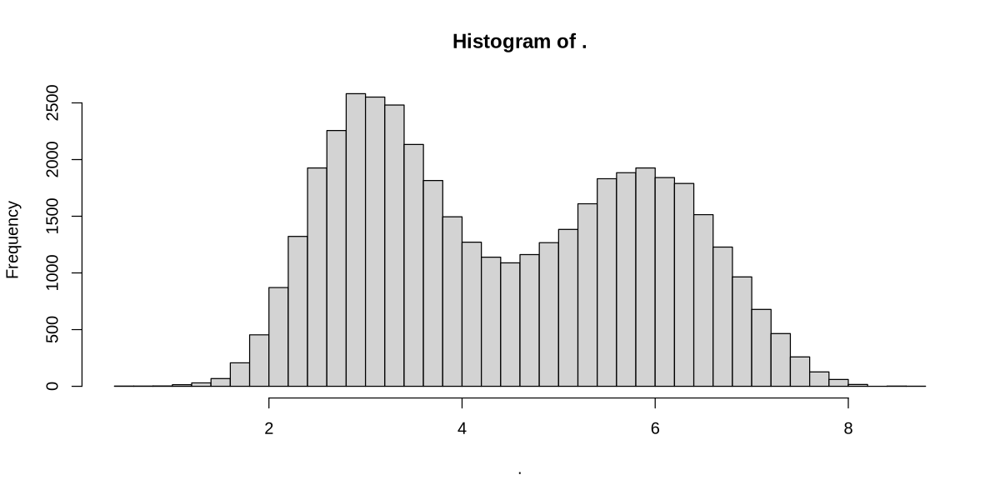

In [436]:
log2(de_list$baseMean+1) %>% 
hist(breaks = 50)

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


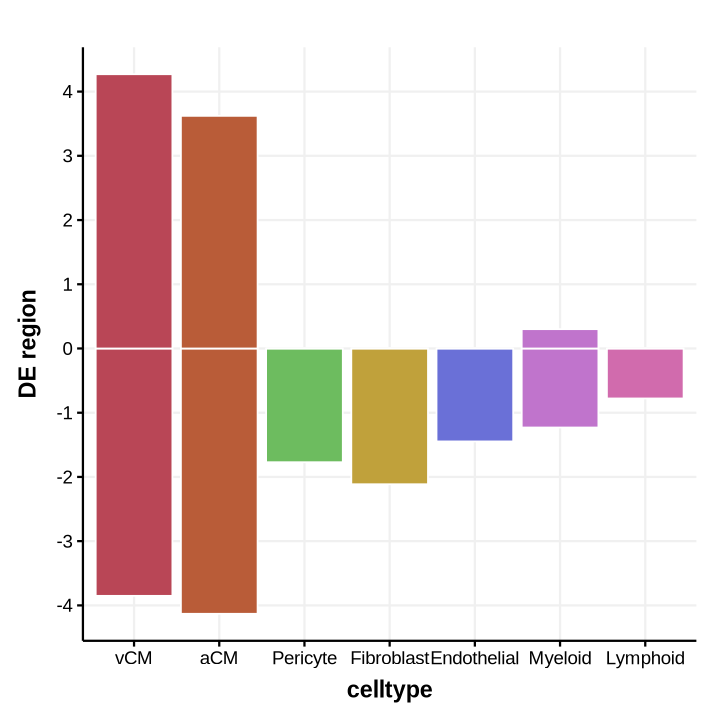

In [461]:
options(repr.plot.width = 6, repr.plot.height = 6)
t1 <- de_list %>% 
select(group, celltype) %>% table %>% 
as.data.frame %>%
mutate(padj = ifelse(group == "up", log10(Freq+1), -(log10(Freq+1)))) %>%
mutate(celltype = factor(celltype, levels = corder)) %>%
select(c(celltype, group, padj)) %>%
ggplot(aes(x = celltype, y = padj, fill = celltype)) + 
geom_col(position = "dodge", color = "white") + 
theme_Publication() + ylab("DE region") + 
scale_y_continuous(breaks = seq(-5,5,1)) + 
scale_fill_manual(values = celltype_colors) + NoLegend()

t1
ggsave(t1, filename = "plot/FIG_H3K27me3_DEbin15k_by_celltype.pdf", dpi = 300, height = 4, width = 6)

In [277]:
### Not confounded by cell number
d1 <- rmeta %>% filter(orig.ident == "DPT", Target == "H3K27me3") %>%
select(nn2.celltype) %>%
table %>% as.data.frame

d2 <- table(de_list$celltype) %>% as.data.frame %>% setNames(c("nn2.celltype", "degene"))
d3 <- merge(d1, d2, by = "nn2.celltype")

cor.test(d3$Freq, d3$degene, method = "spearman")


	Spearman's rank correlation rho

data:  d3$Freq and d3$degene
S = 20, p-value = 0.1389
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.6428571 


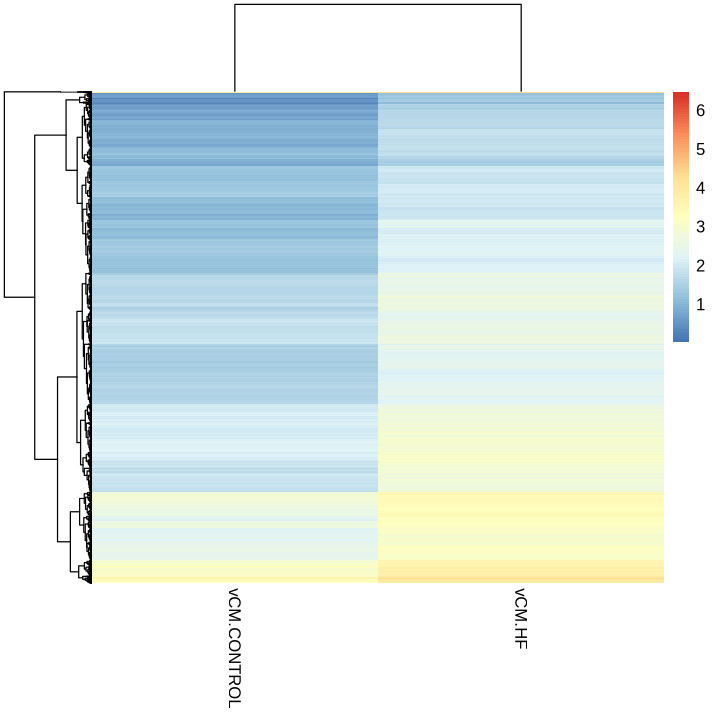

In [470]:
# k27me3 <- read.csv("FNIH_Heart_signal/FNIH_Heart_pool.celltype_disease.H3K27me3.15kb.cpm.csv", row.names = 1)
ct <- "vCM"
dexp <- de_list %>% 
filter(celltype == ct, log2FoldChange > 0) %>%
select(bin) %>% unlist
log2(k27me3[dexp, grep(ct, colnames(k27me3))]+1) %>%
pheatmap(show_rownames = F)

In [469]:
### overlap gene for GO

In [456]:
ct <- "aCM"
dexp <- de_list %>% 
filter(celltype == ct) %>%
filter(abs(log2FoldChange) >= 1)
dexp[,c("chrom", "start", "end")] <- stringr::str_split_fixed(dexp$bin, pattern = "[:-]", n = 3)

In [457]:
suppressPackageStartupMessages(library(GenomicRanges))
dexprange <- GRanges(dexp$chrom, ranges = IRanges(as.numeric(dexp$start), as.numeric(dexp$end)))
dexprange1 <- GRanges(dexp[dexp$group == "up",]$chrom, 
                      ranges = IRanges(as.numeric(dexp[dexp$group == "up",]$start), as.numeric(dexp[dexp$group == "up",]$end)))
dexprange2 <- GRanges(dexp[dexp$group == "down",]$chrom, 
                      ranges = IRanges(as.numeric(dexp[dexp$group == "down",]$start), as.numeric(dexp[dexp$group == "down",]$end)))
system("mkdir H3K27me3_DE")
write.table(as.data.frame(dexprange2), paste0("H3K27me3_DE/", ct, "_HF_down_k27me3_15kb.bed"), 
            sep = "\t", quote = F, row.names = F, col.names = F)
write.table(as.data.frame(dexprange1), paste0("H3K27me3_DE/", ct, "_HF_up_k27me3_15kb.bed"), 
            sep = "\t", quote = F, row.names = F, col.names = F)

In [471]:
### Find gene it covers?
hg38 <- read.table("/projects//ps-renlab2/y2xie/ps-renlab/y2xie/projects/genome_ref/Paired-Tag/hg38/hg38.gcode.10X.bed") %>% mutate(V7 = V6)
hg38r <- GRanges(hg38$V1, ranges = IRanges(as.numeric(hg38$V2), as.numeric(hg38$V3)))

upgene <- downgene <- list()
# for (f in c("vCM", "aCM")){
#     dege <- de_list %>% filter(celltype == f)
#     tmp <- dege %>% filter(group == "up")
#     tmp[,c("chrom", "start", "end")] <- stringr::str_split_fixed(tmp$bin, pattern = "[:-]", n = 3)

#     dexprange1 <- GRanges(tmp$chrom, ranges = IRanges(as.numeric(tmp$start), as.numeric(tmp$end)))
    qgene <- hg38[unique(subjectHits(findOverlaps(dexprange1, hg38r))),]$V7
    qtable <- enrichr(qgene, dbs)
    upgene <- qtable[[1]] %>% filter(Adjusted.P.value < 0.05)
    
#     tmp <- dege %>% filter(group == "down")
#     tmp[,c("chrom", "start", "end")] <- stringr::str_split_fixed(tmp$bin, pattern = "[:-]", n = 3)
#     dexprange2 <- GRanges(tmp$chrom, ranges = IRanges(as.numeric(tmp$start), as.numeric(tmp$end)))
    qgene <- hg38[unique(subjectHits(findOverlaps(dexprange2, hg38r))),]$V7
    qtable <- enrichr(qgene, dbs)
    downgene <- qtable[[1]] %>% filter(Adjusted.P.value < 0.05)
# }

lapply(upgene, dim) %>% as.data.frame
lapply(downgene, dim) %>% as.data.frame

Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2021... Done.
Parsing results... Done.
Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2021... Done.
Parsing results... Done.


<0 x 0 matrix>

<0 x 0 matrix>

In [481]:
### Dont overlap much
qgene1 <- hg38[unique(subjectHits(findOverlaps(dexprange1, hg38r))),]$V7
qgene1 %>% length

qgene2 <- genede[genede$celltype == ct & genede$log2FoldChange < 0,]$gene
qgene3 <- genede[genede$celltype == ct & genede$log2FoldChange > 0,]$gene
qgene2 %>% length
qgene3 %>% length

intersect(qgene1, qgene2) %>% length
intersect(qgene1, qgene3) %>% length

[1] 1015

[1] 2031

[1] 3184

[1] 85

[1] 151

In [477]:
head(genede)

,celltype,contrast,gene,log2FoldChange,stat,pvalue,padj
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
1,aCM,HF_vs_NON_HF,CA14,-2.533430,-7.931549,2.164298e-15,4.344828e-11
2,aCM,HF_vs_NON_HF,NR2F2,-1.064321,-6.622326,3.535890e-11,3.549150e-07
3,aCM,HF_vs_NON_HF,TBX20,-1.138230,-6.479178,9.222377e-11,6.171307e-07
4,aCM,HF_vs_NON_HF,SLC9B1,1.531537,6.348552,2.173513e-10,1.090832e-06
5,aCM,HF_vs_NON_HF,HIST2H2AC,-1.703462,-6.172303,6.730240e-10,2.702191e-06
6,aCM,HF_vs_NON_HF,UBE2O,-0.784047,-6.122639,9.203804e-10,3.079440e-06


Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


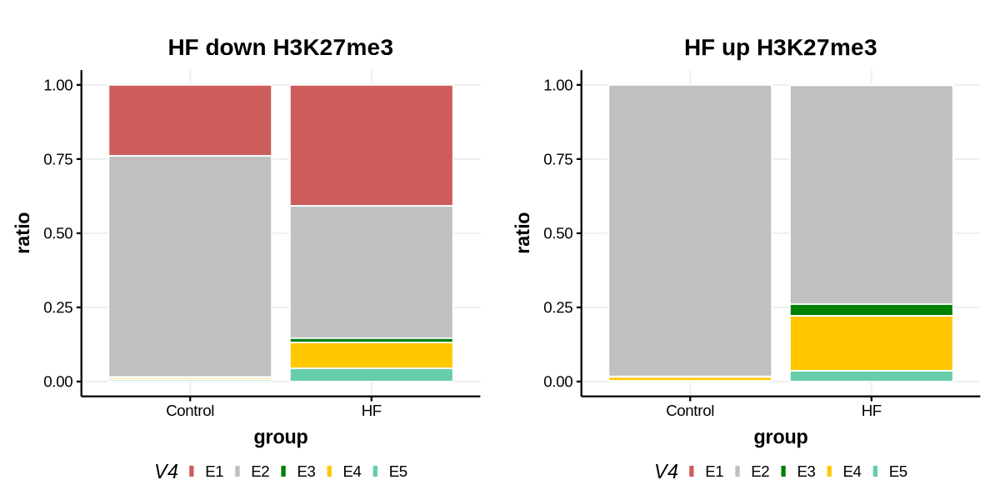

In [458]:
### Compare with chromatin states
ct <- "aCM"
t1 <- read.table(paste0("H3K27me3_DE/", ct, "_HF_down_chromhmm_", ct, "_HF.bed")) %>% 
filter(V5 != ".") %>%
mutate(llen = V10) %>%
group_by(V4) %>% summarise(Freq = sum(llen)) %>%
ungroup %>% 
mutate(ratio = Freq/sum(Freq)) %>% mutate(group = "HF")

t2 <- read.table(paste0("H3K27me3_DE/", ct, "_HF_down_chromhmm_", ct, "_CONTROL.bed")) %>% 
filter(V5 != ".") %>%
mutate(llen = V3 - V2) %>%
group_by(V4) %>% summarise(Freq = sum(llen)) %>%
ungroup %>% 
mutate(ratio = Freq/sum(Freq)) %>% mutate(group = "Control")

f1 <- rbind(t1, t2) %>%
ggplot(aes(x = group, y = ratio, fill = V4)) + 
geom_col(position = "fill", color = "white") + 
theme_Publication() + ggtitle("HF down H3K27me3") + 
scale_fill_manual(values = cols)

t1 <- read.table(paste0("H3K27me3_DE/", ct, "_HF_up_chromhmm_", ct, "_HF.bed")) %>% 
filter(V5 != ".") %>%
# filter(V4 != "E2") %>%
mutate(llen = V10) %>%
group_by(V4) %>% summarise(Freq = sum(llen)) %>%
ungroup %>% 
mutate(ratio = Freq/sum(Freq)) %>% mutate(group = "HF")

t2 <- read.table(paste0("H3K27me3_DE/", ct, "_HF_up_chromhmm_", ct, "_CONTROL.bed")) %>% 
filter(V5 != ".") %>%
# filter(V4 != "E2") %>%
mutate(llen = V3 - V2) %>%
group_by(V4) %>% summarise(Freq = sum(llen)) %>%
ungroup %>% 
mutate(ratio = Freq/sum(Freq)) %>% mutate(group = "Control")

f2 <- rbind(t1, t2) %>%
ggplot(aes(x = group, y = ratio, fill = V4)) + 
geom_col(position = "fill", color = "white") + 
theme_Publication() + ggtitle("HF up H3K27me3") + 
scale_fill_manual(values = cols)

options(repr.plot.width = 10, repr.plot.height = 5)
cowplot::plot_grid(f1, f2)

In [290]:
comp <- read.csv("../../87.FNIH_DHC_IGM_240925//04.matrices/comp/FNIH_heart_dhc_celltype_HF_comp.impute.csv", row.names = 1)
comp[,c("chrom", "start", "end")] <- stringr::str_split_fixed(rownames(comp), pattern = "-", n = 3)
compr <- GRanges(comp$chrom, ranges = IRanges(as.numeric(comp$start), as.numeric(comp$end)))

ab <- read.table("/projects/ps-renlab2/y2xie/projects/77.LC/87.FNIH_DHC_IGM_240925/04.matrices/comp/impute/disease/imputed_comp_AB.tsv",
                sep = "\t", header = T, row.names = 1)
ab[,c("chrom", "start", "end")] <- stringr::str_split_fixed(rownames(ab), pattern = "_", n = 3)
abr <- GRanges(ab$chrom, ranges = IRanges(as.numeric(ab$start), as.numeric(ab$end)))

`summarise()` has grouped output by 'V4'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'V4'. You can override using the `.groups` argument.


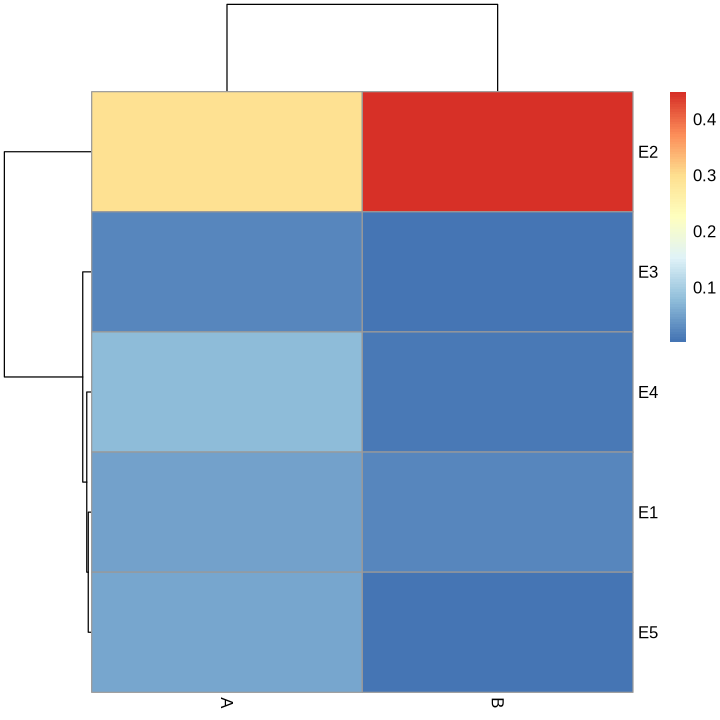

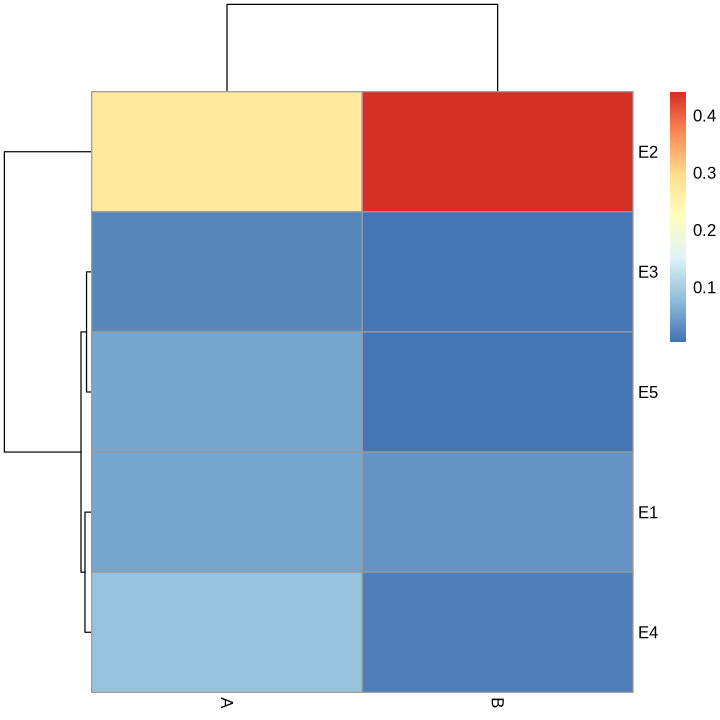

In [397]:
### Compare with compartment
read.table("H3K27me3_DE/vCM_CONTROL_compartment_states.bed") %>%
filter(V5 != ".") %>%
mutate(comp = ifelse(V8 > 0, "A", "B")) %>%
group_by(V4, comp) %>% summarise(Freq = sum(V9)) %>%
ungroup %>% 
mutate(ratio = Freq/sum(Freq)) %>%
reshape2::dcast(V4 ~ comp, value.var = "ratio") %>%
tibble::column_to_rownames("V4") %>%
pheatmap()
 
read.table("H3K27me3_DE/vCM_HF_compartment_states.bed") %>%
filter(V5 != ".") %>%
mutate(comp = ifelse(V8 > 0, "A", "B")) %>%
group_by(V4, comp) %>% summarise(Freq = sum(V9)) %>%
ungroup %>% 
mutate(ratio = Freq/sum(Freq)) %>%
reshape2::dcast(V4 ~ comp, value.var = "ratio") %>%
tibble::column_to_rownames("V4") %>%
pheatmap()

### ???

In [403]:
a2b <- comp %>%
filter(vCM_CONTROL > 0, vCM_HF < 0) %>%
select(c(chrom, start, end))

b2a <- comp %>%
filter(vCM_CONTROL < 0, vCM_HF > 0) %>%
select(c(chrom, start, end))

a2br <- GRanges(a2b$chrom, ranges = IRanges(as.numeric(a2b$start), as.numeric(a2b$end)))
b2ar <- GRanges(b2a$chrom, ranges = IRanges(as.numeric(b2a$start), as.numeric(b2a$end)))

a2b %>% nrow
b2a %>% nrow

[1] 954

[1] 672

In [404]:
unique(subjectHits(findOverlaps(dexprange1, a2br))) %>% length
unique(subjectHits(findOverlaps(dexprange2, a2br))) %>% length

unique(subjectHits(findOverlaps(dexprange1, b2ar))) %>% length
unique(subjectHits(findOverlaps(dexprange2, b2ar))) %>% length

# 954 a2b, 139/11314 overlap with k27me3 up, 2/202 overlap with k27me3 down
# 672 b2a, 147/11314 overlap with k27me3 up, 8/202 overlap with k27me3 down

[1] 139

[1] 2

[1] 147

[1] 8

In [405]:
ct <- "vCM"

comp[unique(subjectHits(findOverlaps(dexprange1, compr))), grep(ct, colnames(comp))] %>%
reshape2::melt() %>%
mutate(comp = ifelse(value > 0, "A", "B")) %>%
select(c(variable, comp)) %>%
table

comp[unique(subjectHits(findOverlaps(dexprange2, compr))), grep(ct, colnames(comp))] %>%
reshape2::melt() %>%
mutate(comp = ifelse(value > 0, "A", "B")) %>%
select(c(variable, comp)) %>%
table

No id variables; using all as measure variables



             comp
variable         A    B
  vCM_HF      1631 5447
  vCM_CONTROL 1623 5455

No id variables; using all as measure variables



             comp
variable        A   B
  vCM_HF      114  44
  vCM_CONTROL 108  50

In [442]:
### across all cell types
deup <- dedown <- list()
for (f in unique(de_list$celltype)){
    dexp <- de_list %>% filter(celltype == f) 
    dexp[,c("chrom", "start", "end")] <- stringr::str_split_fixed(dexp$bin, pattern = "[:-]", n = 3)
    dexprange <- GRanges(dexp$chrom, ranges = IRanges(as.numeric(dexp$start), as.numeric(dexp$end)))
    dexprange1 <- GRanges(dexp[dexp$group == "up",]$chrom, 
                          ranges = IRanges(as.numeric(dexp[dexp$group == "up",]$start), as.numeric(dexp[dexp$group == "up",]$end)))
    dexprange2 <- GRanges(dexp[dexp$group == "down",]$chrom, 
                          ranges = IRanges(as.numeric(dexp[dexp$group == "down",]$start), as.numeric(dexp[dexp$group == "down",]$end)))
    deup[[f]] <- comp[unique(subjectHits(findOverlaps(dexprange1, compr))), grep(f, colnames(comp))] %>% reshape2::melt()
    dedown[[f]] <- comp[unique(subjectHits(findOverlaps(dexprange2, compr))), grep(f, colnames(comp))] %>% reshape2::melt()
}

No id variables; using all as measure variables

No id variables; using all as measure variables

No id variables; using all as measure variables

No id variables; using all as measure variables

No id variables; using all as measure variables

No id variables; using all as measure variables

No id variables; using all as measure variables

No id variables; using all as measure variables

No id variables; using all as measure variables

No id variables; using all as measure variables

No id variables; using all as measure variables

No id variables; using all as measure variables

No id variables; using all as measure variables

No id variables; using all as measure variables



In [451]:
ctp <- do.call(rbind, deup)
ctp[,c("celltype", "group")] <- stringr::str_split_fixed(ctp$variable, pattern = "_", n = 2)
t1 <- ctp %>%
ggplot(aes(x = celltype, y = value, fill = group)) + 
geom_boxplot(width = 0.5, coef = 2, outlier.shape = NA) + xlab("") + 
ggtitle("HF up H3K27me3") + 
theme_Publication()

ctp <- do.call(rbind, dedown)
ctp[,c("celltype", "group")] <- stringr::str_split_fixed(ctp$variable, pattern = "_", n = 2)
t2 <- ctp %>%
ggplot(aes(x = celltype, y = value, fill = group)) + 
geom_boxplot(width = 0.5, coef = 2, outlier.shape = NA) + xlab("") + 
ggtitle("HF down H3K27me3") + 
theme_Publication()

options(repr.plot.width = 10, repr.plot.height = 5)
fig1 <- cowplot::plot_grid(t1, t2)
ggsave(fig1, filename = "plot/FIG_H3K27me3_DE_15kb_comp_score.pdf", dpi = 300, height = 8, width = 6)

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


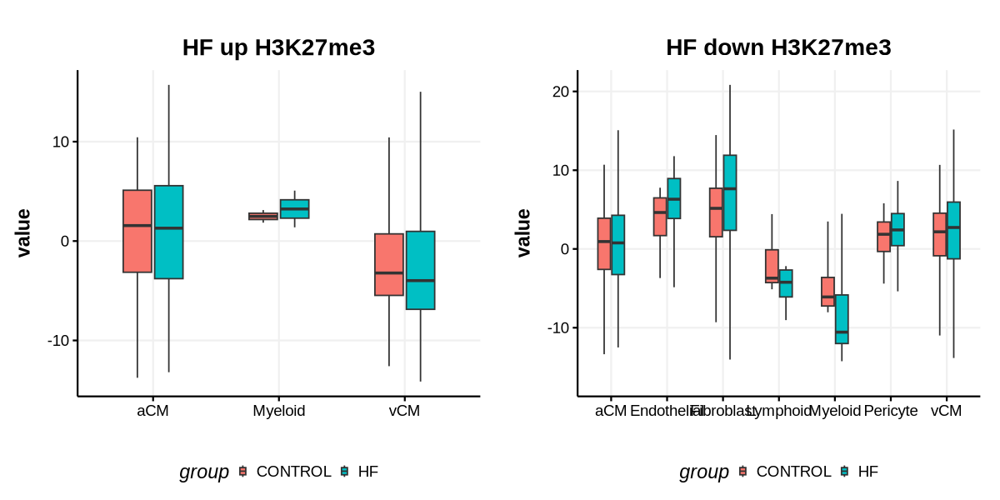

In [452]:
fig1

In [359]:
### GREAT analysis of H3K27me3 covered region
suppressPackageStartupMessages(library(rGREAT))

ct <- "vCM"
tmp <- de_list[de_list$group == "up" & de_list$celltype == ct & de_list$log2FoldChange >= 1,]
tmp[,c("chrom", "start", "end")] <- stringr::str_split_fixed(tmp$bin, pattern = "[:-]", n = 3)
bed.gr = GRanges(tmp$chrom, 
                 IRanges((as.integer(tmp$start) + as.integer(tmp$end))/2,
                         ((as.integer(tmp$start) + as.integer(tmp$end))/2)+1))
job = submitGreatJob(gr=bed.gr, species="hg38")
tb = getEnrichmentTables(job)

tb[["GO Biological Process"]] %>%
filter(Binom_Observed_Region_Hits < 1000) %>%
filter(Binom_Adjp_BH < 0.05 & Hyper_Adjp_BH < 0.05) %>%
slice_min(order_by = Binom_Adjp_BH, n = 10) %>%
select(name) %>% unlist

# tb = getEnrichmentTables(job, download_by = 'tsv')
# tb[["GO Cellular Component"]] %>%
# filter(ObsRegions < 1000) %>%
# filter(BinomFdrQ < 0.05 & HyperFdrQ < 0.05) %>%
# select(Ontology, ID, Desc, Genes) %>%
# head(10)

The default enrichment tables contain no associated genes for the input
regions.You can set `download_by = 'tsv'` to download the complete
table,but note only the top 500 regions can be retreived. See the
following link:

https://great-help.atlassian.net/wiki/spaces/GREAT/pages/655401/Export#Export-GlobalExport

or you can try the local GREAT analysis with the function `great()`.



name1 
                                                      "negative chemotaxis" 
                                                                      name2 
                                           "regulation of neuron migration" 
                                                                      name3 
                                           "adherens junction organization" 
                                                                      name4 
                                                       "neuron recognition" 
                                                                      name5 
                                                              "innervation" 
                                                                      name6 
                                                 "trans-synaptic signaling" 
                                                                      name7 
"adenylate cyclase-inhibiting G-protein coupled receptor signaling pathway" 
                                                                      name8 
                                     "cyclic-nucleotide-mediated signaling" 
                                                                      name9 
                                                    "forebrain development" 
                                                                     name10 
                                                           "adult behavior"

### Summarize all ATAC

In [101]:
atac <- read.table("../reference/ATAC_celltype.cpm.txt", header = T, row.names = 1)
k27ac <- read.csv("FNIH_Heart_signal/FNIH_Heart_pool.H3K27ac.HeartUnionPeak.cpm.csv", header = T, row.names = 1)

dim(atac)

[1] 285873     12

In [428]:
write.table(unique(gsub("([^.]+).([^.]+)", "\\1", colnames(k27ac))), "celltype.txt", sep = "\t", quote = F,
           row.names = F, col.names = F)

In [526]:
### read order: from NMF
tmp <- read.table("../reference/FNIH_peaks/NMF/res/FNIH_Heart_pool.ATAC_celltype.HeartUnionPeaks.r11n10.statW", skip = 1)
tmp$V1 <- sub("-", ":", tmp$V1)
table(tmp$V3)


    0     1     2     3     4     5     6     7     8     9    10 
11910 12459 74915 20316 20966 31545 20879 39208 21079 27311  5285 

In [527]:
system("mkdir ../reference/FNIH_peaks/NMF/ccre")

for (f in unique(tmp$V3)){
    qpeak <- tmp %>% filter(V3 == f) %>% dplyr::select(V1) %>% unlist
    qpeak <- stringr::str_split_fixed(qpeak, pattern = "[:-]", n = 3)
    write.table(qpeak, paste0("../reference/FNIH_peaks/NMF/ccre/M", f, ".bed"), 
                sep = "\t", quote = F, row.names = F, col.names = F)
}

In [105]:
eorder <- tmp %>% mutate(V3 = factor(V3, levels = c(0,2,6,9,4,8,7,3,10,5,1))) %>%# filter(V1 %in% share) %>% 
arrange(V3) %>% select(V1) %>% unlist

gapr <- tmp %>% mutate(V3 = factor(V3, levels = c(0,2,6,9,4,8,7,3,10,5,1))) %>%# filter(V1 %in% share) %>% 
arrange(V3) %>% select(V3) %>% table %>% cumsum %>% unlist

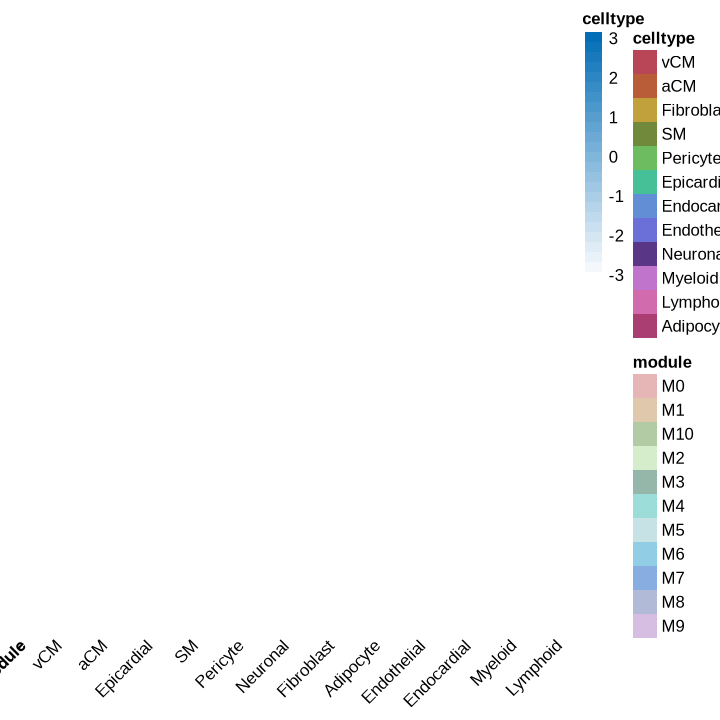

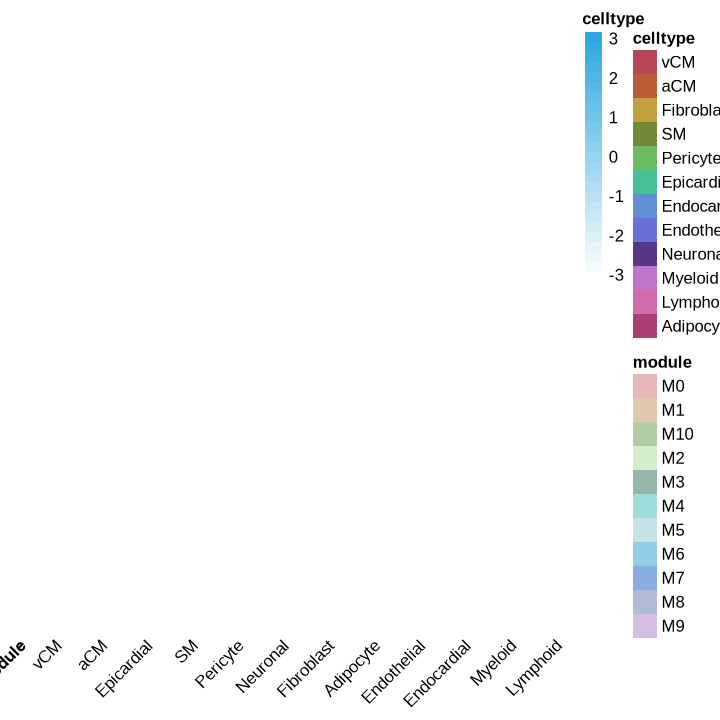

In [107]:
options(repr.plot.width = 6, repr.plot.height = 6)

rmat <- log2(atac[sub(":", "-", eorder), corder] + 1)
smat <- rmat #[permutation_vector, ]
smat[smat > 7] <- 7

ranno <- tmp %>% tibble::column_to_rownames("V1") %>% mutate(module = paste0("M", V3)) %>% select(module)
rownames(ranno) <- sub(":", "-", rownames(ranno))
colsn <- c("#e6b5b5",
"#dfc8ab",
"#b3cba5",
"#d6edcc",
"#94b7a9",
"#9dddd9",
"#c6e2e4",
"#91cee5",
"#88aee1",
"#b1bbd7",
"#d6bee2")
names(colsn) <- sort(unique(ranno$module))

canno <- tmp %>% tibble::column_to_rownames("V1") %>% mutate(celltype = rownames(.)) %>% select(celltype)
ccolor <- list(celltype = c(celltype_colors),
               module = colsn)

t1 <- smat %>%
pheatmap(scale = "row",cluster_rows = F, cluster_cols = F, angle_col = 45,
         annotation_colors = ccolor, gaps_row = gapr,
         show_rownames = F, annotation_row = ranno, 
         annotation_col = canno,
         border_color = NA, color = colorRampPalette(c("white", "#036EB8"))(25))

smat1 <- log2(k27ac[eorder, corder] + 1)
t2 <- smat1 %>%
pheatmap(scale = "row",cluster_rows = F, cluster_cols = F, angle_col = 45,
         annotation_colors = ccolor, gaps_row = gapr,
         show_rownames = F, annotation_row = ranno, 
         annotation_col = canno,
         border_color = NA, color = colorRampPalette(c("white", "#2EA7E0"))(25))

ggsave(t1, filename = "plot/FIG_ATAC_celltype_NMF_scaled.png", dpi = 300, height = 8, width = 6)
ggsave(t1, filename = "plot/FIG_ATAC_celltype_NMF_scaled.pdf", dpi = 300, height = 8, width = 6)

ggsave(t2, filename = "plot/FIG_K27ac_celltype_NMF_scaled.png", dpi = 300, height = 8, width = 6)
ggsave(t2, filename = "plot/FIG_K27ac_celltype_NMF_scaled.pdf", dpi = 300, height = 8, width = 6)

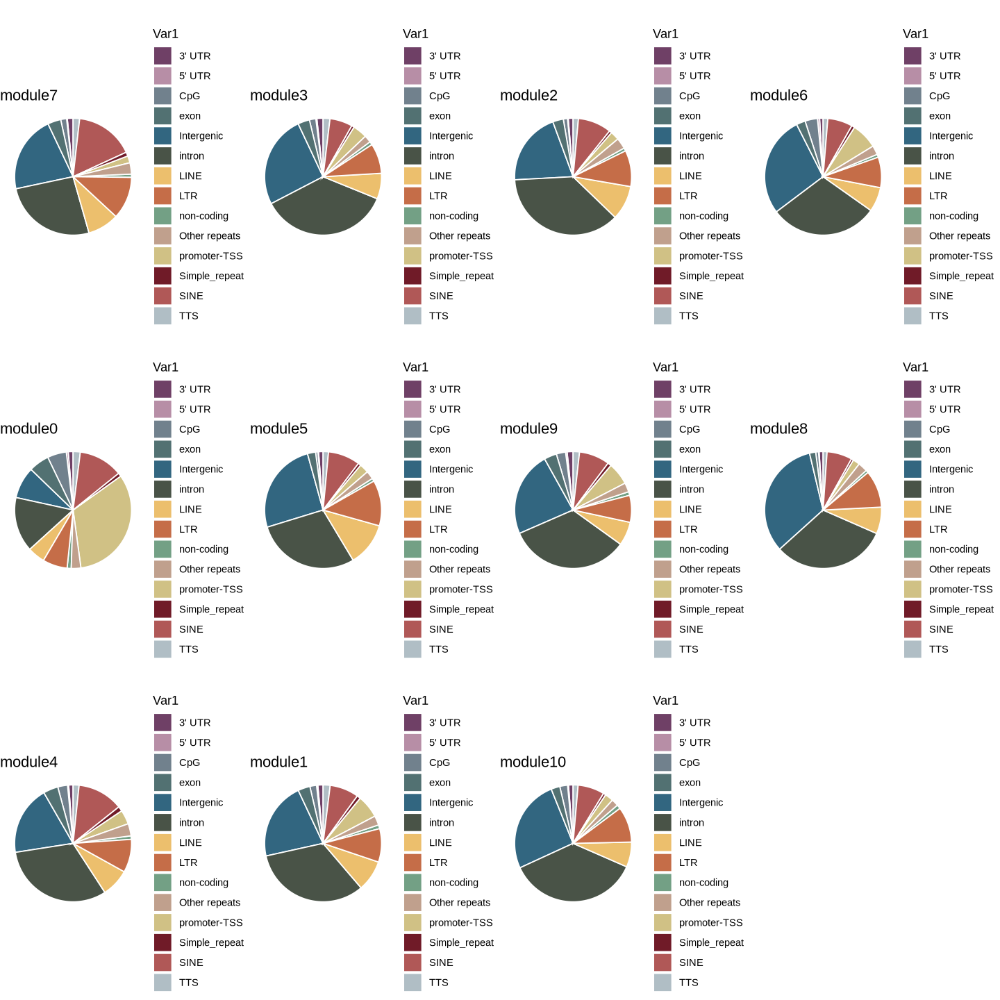

In [46]:
### annotate each modules
panno <- read.csv(paste0("../reference/FNIH_peaks/Heart_UnionPeak.anno"), sep = "\t") %>% 
mutate(ccre = paste0(Chr, ":", Start-1, "-", End))

qrange <- tmp %>% filter(V3 == 0) %>% select(V1) %>% unlist
t1 <- sum_detailed_anno(panno[panno$ccre %in% qrange, ]) %>% 
mutate(percentage = (Freq / sum(Freq)) * 100,
       label = paste0(round(percentage, 2), "%"),
       ypos = (cumsum(Freq) - Freq) / 2) %>%
ggplot(aes(x = "", y = Freq, fill = Var1)) +
geom_bar(width = 1, stat = "identity", color = "white") +
coord_polar(theta = "y") + 
theme_void() + ggtitle(paste0("module", f)) + 
scale_fill_manual(values = cols0)

}

options(repr.plot.width = 12, repr.plot.height = 12)
cowplot::plot_grid(plotlist = plist, ncol = 4)

## Compare to SCREEN, HEA and Jake's paper

In [140]:
suppressPackageStartupMessages(library(GenomicRanges))
screend <- read.table("/projects//ps-renlab2/y2xie/projects/genome_ref/SCREEN/GRCh38-cCREs.bed")
scsrange <- GRanges(screend$V1, ranges = IRanges(as.numeric(screend$V2), as.numeric(screend$V3)))

hed <- read.csv("/projects//ps-renlab2/y2xie/projects/public_data/Zhang2021_HumanAtlas/cCRE_hg38.tsv.gz", sep = '\t') %>% 
mutate(range = paste0(X.Chromosome, "-", hg38_Start, "-", hg38_End))

# tmp <- read.table("../reference/FNIH_peaks/NMF/res/FNIH_Heart_pool.ATAC_celltype.HeartUnionPeaks.r11n10.statW", skip = 1)
# tmp$V1 <- sub("-", ":", tmp$V1)
tmp[,c("chrom", "start", "end")] <- stringr::str_split_fixed(tmp$V1, pattern = "[:-]", n = 3)
trange <- GRanges(tmp$chrom, ranges = IRanges(as.numeric(tmp$start), as.numeric(tmp$end)))

heart <- read.csv("/projects//ps-renlab2/y2xie/projects/public_data/Hocker2021_HumanHeart//abf1444_table_s5.tsv", sep = '\t', skip = 2, header = F)
heartrange <- GRanges(heart$V1, ranges = IRanges(as.numeric(heart$V2), as.numeric(heart$V3)))

In [131]:
ctp <- readMM("/projects//ps-renlab2/y2xie/projects/public_data/Zhang2021_HumanAtlas/cCRE_by_cell_type/matrix.tsv.gz")
celltype <- read.table("/projects//ps-renlab2/y2xie/projects/public_data/Zhang2021_HumanAtlas/cCRE_by_cell_type/celltypes.txt.gz", sep = '\t')
peak <- read.table("/projects//ps-renlab2/y2xie/projects/public_data/Zhang2021_HumanAtlas/cCRE_by_cell_type/cCREs.bed.gz", sep = '\t') %>%
mutate(range = paste0(V1, "-", V2, "-", V3))
rownames(ctp) <- peak$range
colnames(ctp) <- celltype$V1

In [132]:
hemeta <- read.csv("/projects//ps-renlab2/y2xie/projects/public_data/Zhang2021_HumanAtlas/Cell_metadata.tsv.gz", sep = "\t")
ccount <- hemeta[grep('heart', hemeta$tissue), ]$cell.type %>% table %>% as.data.frame
qcelltype <- ccount %>% filter(Freq >= 20) %>% arrange(Freq) %>% select('.') %>% unlist %>% as.character

qcelltype %>% length
intersect(qcelltype, colnames(ctp)) %>% length

[1] 79

[1] 26

In [133]:
setdiff(qcelltype, colnames(ctp))
unmatch <- c("Fetal Macrophage Placental", "Fetal Alveolar Cap Endo", 'Fetal Fibro General 1', 'Fetal Fibro General 2', 'Fetal Fibro General 3',
 'Fetal Fibro General 4', 'Fetal Fibro GI', 'Fetal Fibro Muscle 1', 'Nerve Stromal', 'Fibro Nerve', 'Fibro General', 'Luteal', 'Naive T', 
  'Fetal Metanephric', 'Pericyte General 1','Pericyte General 2','Pericyte General 3','Pericyte Muscularis','Pericyte General 4',
  'Fetal Mesothelial', 'Fetal Endothelial Placental', 'Fetal Endothelial General 3', 'Fetal Endothelial General 1',
  'Endothelial General 1', 'Endothelial Myocardial', 'Endothelial General 2', 'Endothelial General 3', 'Plasma B',
  'Fetal Hematopoeitic Stem', 'Vasc Sm Muscle 1', 'Vasc Sm Muscle 2', 'Macrophage General', 'Endocardial', 'Fetal Endocardial',
  'Fetal Macrophage General 1', 'Fetal Macrophage General 2', 'Fetal Macrophage General 3', 'Fetal Macrophage General 4',
  'Natural Killer T', 'Fetal Schwann General', 'Fetal Alveolar Epithelial 1', 'Lymphatic', 'Fetal Lymphatic', 'Mast', 'Mesothelial',
  'Schwann General','V Cardiomyocyte', 'A Cardiomyocyte', 'Fetal V Cardiomyocyte', 'Fetal A Cardiomyocyte', 'Cardiac Fibroblas')

[1] "Fetal Placental Macrophage"                   
 [2] "Fetal Alveolar Endothelial Cell"              
 [3] "Fetal Fibroblast (Sk Muscle Associated) 1"    
 [4] "Peripheral Nerve Stromal"                     
 [5] "Fibroblast (Peripheral Nerve)"                
 [6] "Luteal Cell (Ovarian)"                        
 [7] "Naive T cell"                                 
 [8] "Fetal Metanephric Cell"                       
 [9] "Pericyte (General) 4"                         
[10] "Fetal Mesothelial Cell"                       
[11] "Fetal Placental Endothelial Cell"             
[12] "Pericyte (Esophageal Muscularis)"             
[13] "Fetal Macrophage (General) 4"                 
[14] "Fetal Endothelial (General) 3"                
[15] "Plasma Cell"                                  
[16] "Fetal Hematopoeitic Stem Cell"                
[17] "Vascular Smooth Muscle 2"                     
[18] "Fetal Placental Fibroblast 1"                 
[19] "Fetal Macrophage (General) 3"                 
[20] "Natural Killer T Cell"                        
[21] "Fetal Schwann Cell"                           
[22] "Fetal Broncial and Alveolar Epithelial Cell 1"
[23] "Pericyte (General) 3"                         
[24] "Fetal Lymphatic Endothelial Cell"             
[25] "Lymphatic Endothelial Cell"                   
[26] "Fetal Fibroblast (General) 4"                 
[27] "Pericyte (General) 2"                         
[28] "Mast Cell"                                    
[29] "Smooth Muscle (General)"                      
[30] "Vascular Smooth Muscle 1"                     
[31] "Fetal Macrophage(General) 2"                  
[32] "Fetal Fibroblast (General) 1"                 
[33] "Fetal Fibroblast (Gastrointestinal)"          
[34] "Pericyte (General) 1"                         
[35] "Fetal Macrophage (General) 1"                 
[36] "Macrophage (General,Alveolar)"                
[37] "Endothelial Cell (General) 2"                 
[38] "Endocardial Cell"                             
[39] "Fetal Fibroblast (General) 2"                 
[40] "Fetal Fibroblast (General) 3"                 
[41] "Mesothelial Cell"                             
[42] "Schwann Cell (General)"                       
[43] "Fetal Endocardial Cell"                       
[44] "Fibroblast (General)"                         
[45] "Fetal Endothelial (General) 1"                
[46] "Fetal Atrial Cardiomyocyte"                   
[47] "Endothelial Cell (General) 1"                 
[48] "Endothelial Cell (Myocardial)"                
[49] "Macrophage (General)"                         
[50] "Atrial Cardiomyocyte"                         
[51] "Ventricular Cardiomyocyte"                    
[52] "Cardiac Fibroblasts"                          
[53] "Fetal Ventricular Cardioyocyte"

In [134]:
intersect(c(qcelltype, unmatch), colnames(ctp)) %>% length
liv <- intersect(c(qcelltype, unmatch), colnames(ctp))

[1] 76

In [141]:
livpeak <- ctp[,liv] %>% rowSums %>% as.data.frame %>% setNames("count") %>% filter(count > 0) %>% rownames
tmp1 <- hed[hed[,5] == "yes" & hed[,6] == "no" & hed$range %in% livpeak,] # fetal only
tmp2 <- hed[hed[,5] == "no" & hed[,6] == "yes" & hed$range %in% livpeak,] # adult only
tmp3 <- hed[hed[,5] == "yes" & hed[,6] == "yes" & hed$range %in% livpeak,] # shared

hedrange <- GRanges(hed[hed$range %in% livpeak,1], 
                    ranges = IRanges(as.numeric(hed[hed$range %in% livpeak,2]), as.numeric(hed[hed$range %in% livpeak,3])))
hedrange1 <- GRanges(tmp1[,1], ranges = IRanges(as.numeric(tmp1[,2]), as.numeric(tmp1[,3])))
hedrange2 <- GRanges(tmp2[,1], ranges = IRanges(as.numeric(tmp2[,2]), as.numeric(tmp2[,3])))
hedrange3 <- GRanges(tmp3[,1], ranges = IRanges(as.numeric(tmp3[,2]), as.numeric(tmp3[,3])))

In [142]:
w1 <- queryHits(findOverlaps(trange, scsrange))
w2 <- queryHits(findOverlaps(trange, hedrange))
w3 <- queryHits(findOverlaps(trange, hedrange1)) ### fetal
w4 <- queryHits(findOverlaps(trange, hedrange2)) ### adult
w5 <- queryHits(findOverlaps(trange, hedrange3)) ### shared
w6 <- queryHits(findOverlaps(trange, heartrange))

tmp$V1 %>% unique %>% length
w1 %>% unique %>% length
w2 %>% unique %>% length
w3 %>% unique %>% length
w4 %>% unique %>% length
w5 %>% unique %>% length
w6 %>% unique %>% length

[1] 285873

[1] 176858

[1] 204202

[1] 12397

[1] 25616

[1] 169008

[1] 175761

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


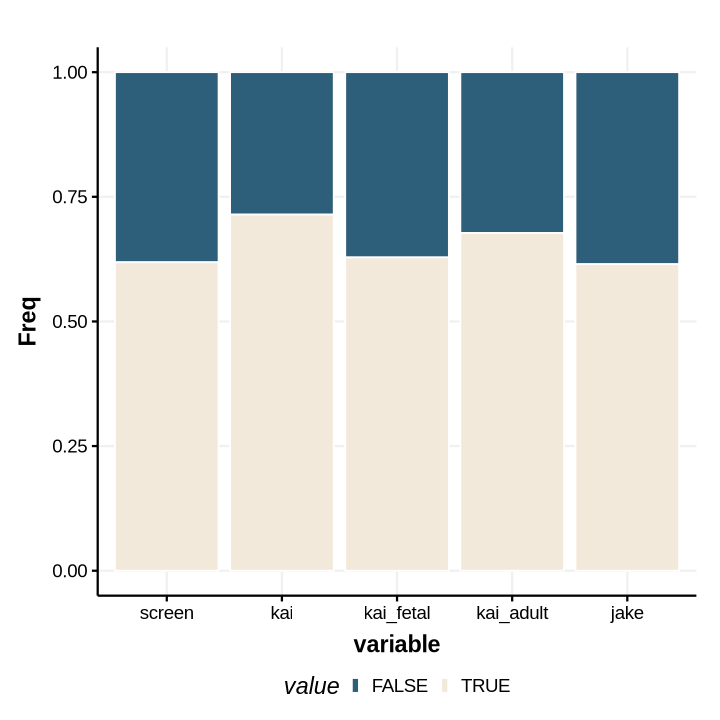

In [144]:
options(repr.plot.width = 6, repr.plot.height = 6)
t1 <- tmp$V1 %>%
as.data.frame %>% setNames("peaks") %>%
mutate(screen = ifelse(peaks %in% tmp$V1[w1], "TRUE", "FALSE")) %>%
mutate(kai = ifelse(peaks %in% tmp$V1[w2], "TRUE", "FALSE")) %>%
mutate(kai_fetal = ifelse(peaks %in% tmp$V1[unique(c(w3, w5))], "TRUE", "FALSE")) %>%
mutate(kai_adult = ifelse(peaks %in% tmp$V1[unique(c(w4, w5))], "TRUE", "FALSE")) %>%
mutate(jake = ifelse(peaks %in% tmp$V1[w6], "TRUE", "FALSE")) %>%
reshape2::melt(id.vars = "peaks") %>%
select(c(variable,value)) %>% table %>%
as.data.frame %>%
ggplot(aes(x = variable, y = Freq, fill = value)) + 
geom_col(position = "fill", color = "white") + 
theme_Publication() + 
scale_fill_manual(values = c("#2E5F7A", "#F2E9DA"))

t1

ggsave(t1, filename = "plot/FIG_cCRE_compare_SCREEN_HA.pdf", dpi = 300, height = 6, width = 6)

In [145]:
t1$data %>%
group_by(variable) %>%
mutate(ratio = Freq/sum(Freq))

variable,value,Freq,ratio
<fct>,<fct>,<int>,<dbl>
screen,FALSE,109015,0.3813407
kai,FALSE,81671,0.2856898
kai_fetal,FALSE,106237,0.3716231
kai_adult,FALSE,92215,0.3225733
jake,FALSE,110112,0.3851780
screen,TRUE,176858,0.6186593
kai,TRUE,204202,0.7143102
kai_fetal,TRUE,179636,0.6283769
kai_adult,TRUE,193658,0.6774267


In [157]:
### New elements: not in all others
tmp <- read.table("../reference/FNIH_peaks/NMF/res/FNIH_Heart_pool.ATAC_celltype.HeartUnionPeaks.r11n10.statW", skip = 1)
tmp$V1 <- sub("-", ":", tmp$V1)

nele <- tmp$V1 %>%
as.data.frame %>% setNames("peaks") %>%
mutate(screen = ifelse(peaks %in% tmp$V1[w1], "TRUE", "FALSE")) %>%
mutate(kai = ifelse(peaks %in% tmp$V1[w2], "TRUE", "FALSE")) %>%
mutate(jake = ifelse(peaks %in% tmp$V1[w6], "TRUE", "FALSE")) %>%
filter(screen == 'FALSE', kai == 'FALSE', jake == 'FALSE') 

neled <- stringr::str_split_fixed(nele$peaks, pattern = "[:-]", n = 3) %>% as.data.frame
write.table(neled, "../reference/FNIH_peaks/New_element_SCREEN_HEA.bed", sep = '\t', 
            quote = F, row.names = F, col.names = F)

In [163]:
49848/285873

[1] 0.1743711

In [160]:
neled <- stringr::str_split_fixed(setdiff(tmp$V1, nele$peaks), pattern = "[:-]", n = 3) %>% as.data.frame
write.table(neled, "../reference/FNIH_peaks/Old_element_SCREEN_HEA.bed", sep = '\t', 
            quote = F, row.names = F, col.names = F)

In [126]:
### How much of the genome covered?
tmp <- read.table("../reference/FNIH_peaks/Heart_UnionPeak.bed")
sum(tmp$V3-tmp$V2)/2913022398

[1] 0.02815441

### is it disease-specific?

Using sample as id variables



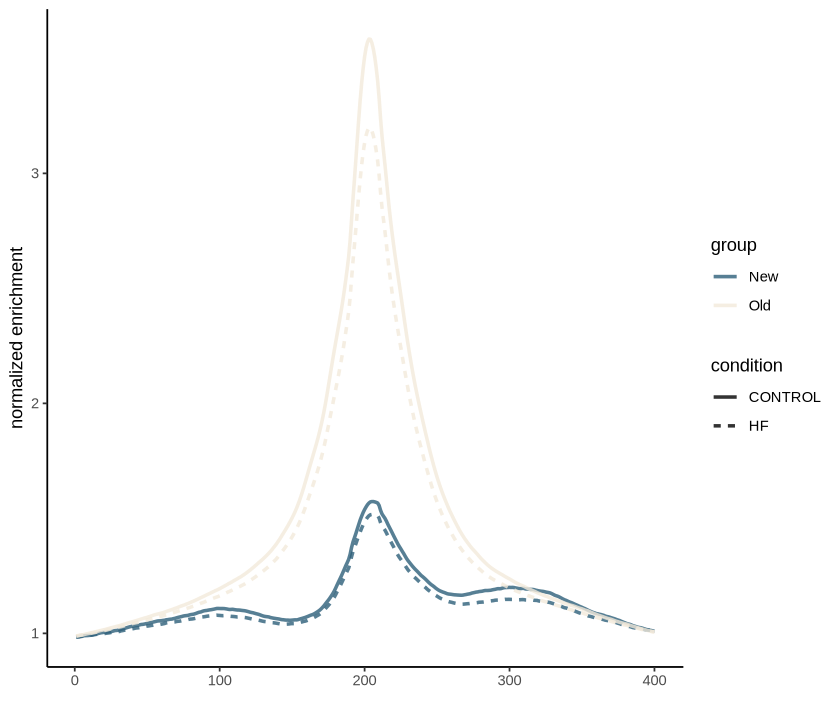

In [393]:
### Compute disease enrichment with deeptools
### coverage?
ataccov <- read.csv("../06.bw/ATAC_split_bam//FNIH_Heart.cluster_ATAC_enrich.profile.txt",
                      sep = "\t", skip = 1, header = T)
ataccov$X <- sub("_element_SCREEN_HEA.bed", "", ataccov$X)
ataccov$bins <- gsub("FNIH_Heart.cluster.([^.]+).ATAC", "\\1", ataccov$bins)

rownames(ataccov) <- paste0(ataccov$X, "_", ataccov$bins)
ataccov$X <- ataccov$bins <- NULL

bdg <- ataccov[,c(1:3, 397:400)] %>% rowMeans
tmp <- (ataccov[,c(1:400)]/bdg) %>% as.data.frame %>%
tibble::rownames_to_column('sample') %>%
reshape2::melt() %>%
mutate(variable = as.integer(gsub("X", "", variable))) 
tmp[,c("group", "condition")] <- stringr::str_split_fixed(tmp$sample, pattern = "_", n = 2)

options(repr.plot.width = 7, repr.plot.height = 6)
t1 <- tmp %>%
ggplot(aes(x = variable, y = value, color = group, linetype = condition)) + 
geom_line(alpha = 0.8, linewidth = 1) + 
theme_classic() + xlab("") + ylab("normalized enrichment") + 
scale_color_manual(values = c("#2E5F7A", "#F2E9DA")) #+ theme_Publication()

t1
# ggsave(t1, filename = "plot/FIG_cCRE_compare_enrichment.pdf", dpi = 300, height = 6, width = 6)

Warning message:
“package ‘ggthemes’ was built under R version 4.3.2”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


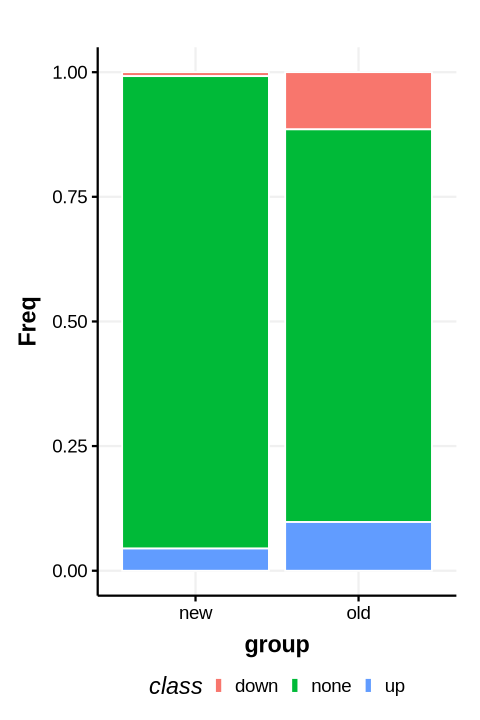

In [22]:
### read disease-up peaks:
atacde <- read.table("../reference/Multiome_Downstream/CHAMBER/4chambers_DESEQ2_ATAC.dds.res", header = T) %>%
filter(ATAC_Padj < 0.05) %>%
setNames(c("celltype", "contrast", "range", "log2FoldChange", "stat", "pvalue", "padj"))

new <- read.table("../reference/FNIH_peaks/New_element_SCREEN_HEA.bed") %>% mutate(range = paste0(V1, "-", V2, "-", V3)) %>% mutate(group = "new")
old <- read.table("../reference/FNIH_peaks/Old_element_SCREEN_HEA.bed") %>% mutate(range = paste0(V1, "-", V2, "-", V3)) %>% mutate(group = "old")

options(repr.plot.width = 4, repr.plot.height = 6)
rbind(new, old) %>%
mutate(class = ifelse(range %in% unique(atacde[atacde$log2FoldChange >= 0,]$range), "up", "none")) %>%
mutate(class = ifelse(range %in% unique(atacde[atacde$log2FoldChange <= -0,]$range), "down", class)) %>%
dplyr::select(group, class) %>%
table %>% as.data.frame %>%
ggplot(aes(x = group, y = Freq, fill = class)) + 
geom_col(color = "white", position = "fill") + 
theme_Publication()

## Are the new peaks specific to some donors?

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


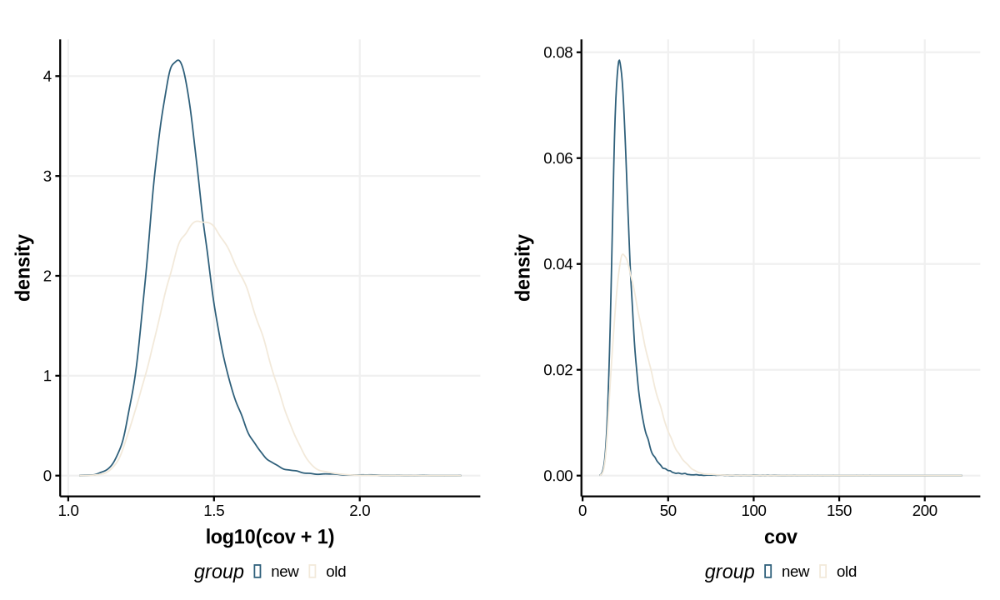

In [446]:
# gtable <- read.csv("FNIH_Heart_signal/FNIH_Heart_pool.ATAC.donor.cpm.csv", row.names = 1)
# donor_info <- read.table("../reference/Final_FNIH_Heart_10X.donor.xls") %>% dplyr::select(c(donor, disease_status_major)) %>% distinct
# rownames(donor_info) <- donor_info$donor

gvar <- gtable %>% apply(MARGIN = 1, function(x) 100*sd(x)/mean(x)) %>% as.data.frame %>% setNames("cov")
gvar <- gvar %>%
mutate(group = "none")
                         
gvar[sub("-", ":", new$range),]$group <- "new"
gvar[sub("-", ":", old$range),]$group <- "old"

t1 <- gvar %>%
ggplot(aes(x = log10(cov+1), color = group)) + 
geom_density() + 
theme_Publication() + 
scale_color_manual(values = c("#2E5F7A", "#F2E9DA"))

t2 <- gvar %>%
ggplot(aes(x = cov, color = group)) + 
geom_density() + 
theme_Publication() + 
scale_color_manual(values = c("#2E5F7A", "#F2E9DA"))
                         
options(repr.plot.width = 10, repr.plot.height = 6)
cowplot::plot_grid(t1, t2, ncol = 2)
                         
                         ### old elements are more variblae across donors...?

### Compare annotations of new peaks versus old peaks

In [43]:
nrow(new)
nrow(old)

[1] 49848

[1] 236025

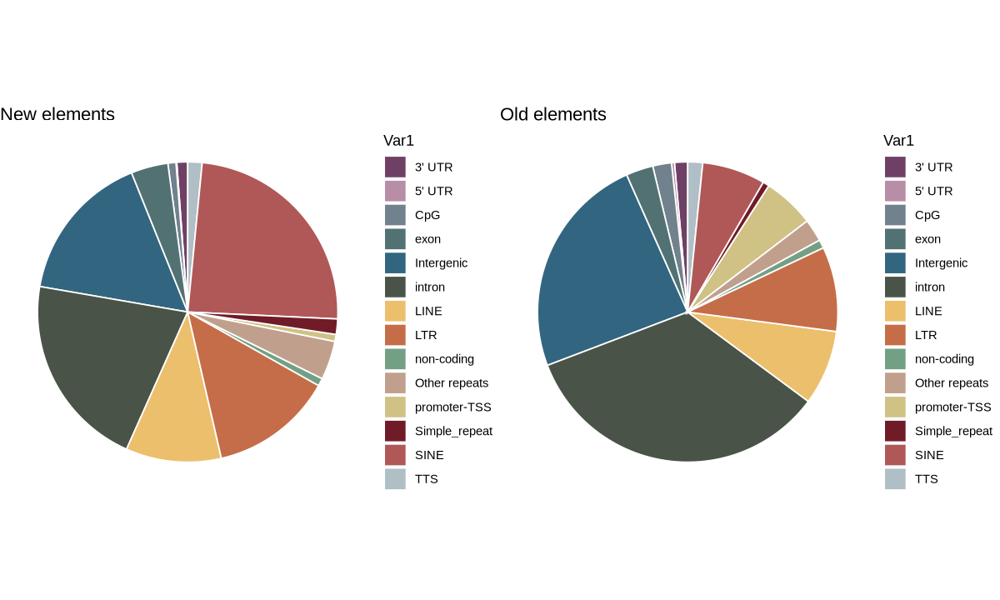

In [537]:
panno <- read.csv(paste0("../reference/FNIH_peaks/Heart_UnionPeak.anno"), sep = "\t") %>% 
mutate(ccre = paste0(Chr, ":", Start-1, "-", End))
t1 <- sum_detailed_anno(panno[panno$ccre %in% sub("-", ":", new$range), ]) %>% 
mutate(percentage = (Freq / sum(Freq)) * 100,
       label = paste0(round(percentage, 2), "%"),
       ypos = (cumsum(Freq) - Freq) / 2) %>%
ggplot(aes(x = "", y = Freq, fill = Var1)) +
geom_bar(width = 1, stat = "identity", color = "white") +
coord_polar(theta = "y") + 
theme_void() + ggtitle("New elements") + 
scale_fill_manual(values = cols0)

t2 <- sum_detailed_anno(panno[panno$ccre %in% sub("-", ":", old$range), ]) %>% 
mutate(percentage = (Freq / sum(Freq)) * 100,
       label = paste0(round(percentage, 2), "%"),
       ypos = (cumsum(Freq) - Freq) / 2) %>%
ggplot(aes(x = "", y = Freq, fill = Var1)) +
geom_bar(width = 1, stat = "identity", color = "white") +
coord_polar(theta = "y") + 
theme_void() + ggtitle("Old elements") + 
scale_fill_manual(values = cols0)

options(repr.plot.width = 10, repr.plot.height = 6)
fig1 <- cowplot::plot_grid(t1, t2, ncol = 2)
fig1

ggsave(fig1, filename = "plot/FIG_new_old_cCRE_annotation.pdf", dpi = 300, height = 6, width = 10)

## Split fragments file for chromhmm

In [15]:
system("mkdir -p chromhmm/disease_bed")

rmeta <- read.csv("integration/CAREHF_Multiome_DPT_RNA_int.meta.csv", row.names = 1)
mts <- rmeta %>% filter(orig.ident == "DPT" & integrated_majortype == "1") %>%
mutate(cluster = paste0(nn2.celltype, "_",  condition, "_", Target)) %>%
select(c(dna, dna_bc, cluster)) %>%
setNames(c("library", "barcode", "cluster")) %>%
mutate(sample = paste0(library, "_fragments.tsv.gz"))

write.table(mts, "chromhmm/disease_bed/fragment.cluster_info.txt", sep = "\t", quote = F, row.names = F, col.names = T)

In [149]:
mts <- rmeta %>% filter(orig.ident == "MULTIOME") %>% 
mutate(sample = "merged.atac_fragments.tsv.gz") %>% 
mutate(cluster = paste0(nn2.celltype, "_",  condition, "_ATAC")) %>%
select(c(library, barcode, cluster, sample)) %>%
setNames(c("library", "barcode", "cluster", "sample")) 

mts$barcode <- rownames(mts)
write.table(mts, "chromhmm/disease_bed/atac_fragment.cluster_info.txt", sep = "\t", quote = F, row.names = F, col.names = T)

### Split complicated conditions for makesegments

In [351]:
fclus <- rmeta %>% filter(orig.ident == "DPT") %>% 
mutate(cluster = paste0(chamber, "_", nn2.celltype, "_",  condition, "_", Target)) %>%
select(cluster)

unique(fclus$cluster) %>% length
table(fclus$cluster) %>% as.data.frame %>% filter(Freq >= 100) %>% dim

[1] 200

[1] 133   2

In [352]:
fclusc <- table(fclus$cluster) %>% as.data.frame %>% filter(Freq >= 100) %>%
mutate(cluster = gsub("([^_H3])_H3.*", "\\1", Var1)) %>%
group_by(cluster) %>% summarise(cellcount = length(cluster)) %>%
filter(cellcount == 2) %>% 
select(cluster) %>% unique %>% unlist

fclusc %>% length

[1] 64

In [360]:
fclus <- rmeta %>% filter(orig.ident == "MULTIOME") %>% 
mutate(cluster = paste0(chamber, "_", nn2.celltype, "_",  condition)) %>%
select(cluster)

unique(fclus$cluster) %>% length
table(fclus$cluster) %>% as.data.frame %>% filter(Freq >= 30) %>% dim

fclusc2 <- table(fclus$cluster) %>% as.data.frame %>% filter(Freq >= 30) %>% select(Var1) %>% unlist
intersect(fclusc, fclusc2) %>% length

validc <- intersect(fclusc, fclusc2)

[1] 88

[1] 83  2

[1] 48

In [1827]:
rmeta %>% filter(orig.ident == "DPT" & integrated_majortype == "1") %>%
select(chamber) %>% table

chamber
   LA    LV    RA   RVF 
34594 31519 29392 34138 

In [1829]:
mts <- rmeta %>% filter(orig.ident == "DPT" & integrated_majortype == "1") %>%
mutate(chamber = ifelse(chamber == "RVF", "RV", chamber)) %>%
mutate(cluster = paste0(chamber, "_", nn2.celltype, "_",  condition)) %>%
# filter(cluster %in% validc) %>%
mutate(cluster = paste0(chamber, "_", nn2.celltype, "_",  condition, "_", Target)) %>%
select(c(dna, dna_bc, cluster)) %>%
setNames(c("library", "barcode", "cluster")) %>%
mutate(sample = paste0(library, "_fragments.tsv.gz"))

write.table(mts, "chromhmm/chamber_disease_celltype/bed/fragment.cluster_info.txt", 
            sep = "\t", quote = F, row.names = F, col.names = T)

mts <- rmeta %>% filter(orig.ident == "MULTIOME") %>% 
mutate(sample = "merged.atac_fragments.tsv.gz") %>% 
mutate(cluster = paste0(chamber, "_", nn2.celltype, "_",  condition)) %>%
# filter(cluster %in% validc) %>%
mutate(cluster = paste0(chamber, "_", nn2.celltype, "_",  condition, "_ATAC")) %>%
select(c(library, barcode, cluster, sample)) %>%
setNames(c("library", "barcode", "cluster", "sample")) 

mts$barcode <- rownames(mts)
write.table(mts, "chromhmm/chamber_disease_celltype/bed/atac_fragment.cluster_info.txt", 
            sep = "\t", quote = F, row.names = F, col.names = T)

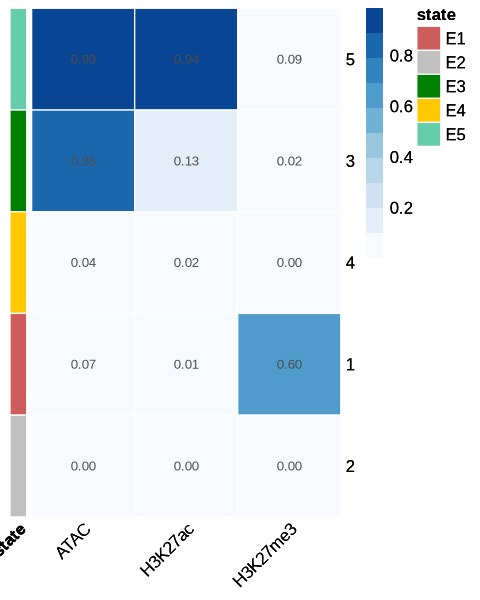

In [34]:
chmstate <- read.table("chromhmm/disease_output/bin200_5_new//emissions_5.txt", sep = "\t", header = T, row.names = 1)

canno <- data.frame(state = paste0("E", 1:5))
rownames(canno) <- rownames(chmstate)
cols <- c("#cd5c5c","#c0c0c0","#008000", "#ffc800", '#66cdaa')
names(cols) <- c("E1", "E2", "E3", "E4", "E5")

options(repr.plot.width = 4, repr.plot.height = 5)
t1 <- chmstate[c(5,3,4,1,2),] %>% 
pheatmap(cluster_rows = F, cluster_cols = F, scale = "none", angle_col = 45, display_numbers = T,
         annotation_row = canno, annotation_colors = list(state = cols),
         border_color = "white", show_rownames = T, show_colnames = T,
         color = colorRampPalette(brewer.pal(n = 8, name = "Blues"))(10))

t1
ggsave(t1, filename = "plot/FIG_ChromHMM_5_states_new.pdf", dpi = 300, height = 5, width = 4)

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


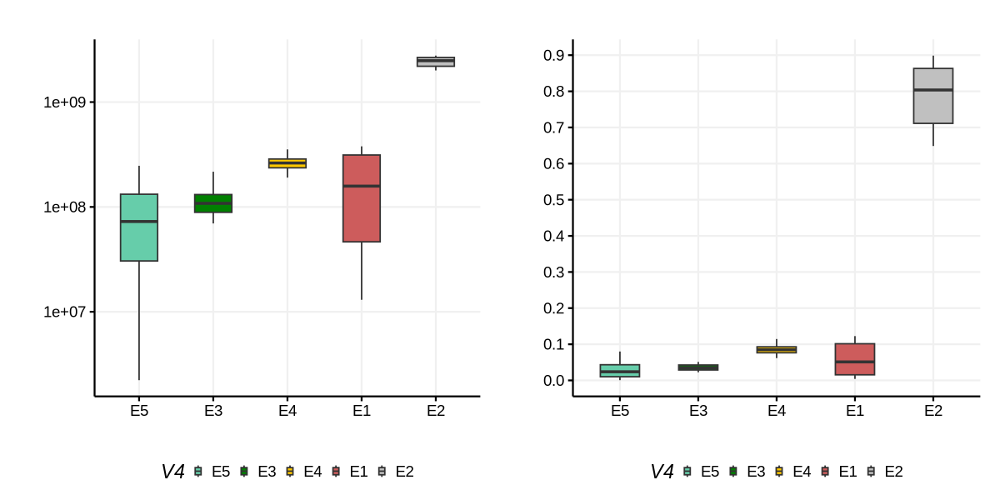

In [1098]:
### Genome coverage?
chmm <- list()
for (f in list.files("chromhmm/celltype/output/", pattern = ".*_5_segments.bed")){
    fname = gsub("_5_segments.bed", "", f)
    chmm[[f]] <- read.table(paste0("chromhmm/celltype/output/", f)) %>% 
    mutate(length = V3 - V2) %>%
    group_by(V4) %>%
    summarise(size = sum(length)) %>%
    ungroup() %>%
    mutate(celltype = fname)
}

library(ggbreak)

t1 <- do.call(rbind, chmm) %>%
mutate(V4 = factor(as.character(V4), levels = c("E5", "E3", "E4", "E1", "E2"))) %>%
ggplot(aes(x = V4, y = size, fill = V4)) + 
# stat_boxplot(geom ='errorbar') + 
geom_boxplot(width = 0.5, position = position_dodge(0.7), coef = 2, outlier.shape = NA) +
theme_Publication() + scale_y_log10() + 
scale_fill_manual(values = cols) +
xlab("") + ylab("")

t2 <- do.call(rbind, chmm) %>% group_by(celltype) %>%
mutate(ratio = size / sum(size)) %>%
mutate(V4 = factor(as.character(V4), levels = c("E5", "E3", "E4", "E1", "E2"))) %>%
ggplot(aes(x = V4, y = ratio, fill = V4)) + 
# stat_boxplot(geom ='errorbar') + 
geom_boxplot(width = 0.5, position = position_dodge(0.7), coef = 2, outlier.shape = NA) +
theme_Publication() +
scale_y_continuous(breaks = seq(0,1,0.1)) + 
scale_fill_manual(values = cols) +
xlab("") + ylab("")

fig1 <- cowplot::plot_grid(t1, t2, ncol = 2)

options(repr.plot.width = 10, repr.plot.height = 5)
fig1

ggsave(fig1, filename = "plot/FIG_chromhmm_coverage.pdf", dpi = 300, height = 4, width = 8)
ggsave(t2, filename = "plot/FIG_chromhmm_coverage_ratio.pdf", dpi = 300, height = 4, width = 5)

In [1125]:
t1$data %>% group_by(variable) %>%
mutate(ratio = value / sum(value)) %>%
filter(V4 == "E1") %>% summary

  V4           variable     value           ratio        
 E5: 0   vCM       :1   Min.   : 5391   Min.   :0.01886  
 E3: 0   aCM       :1   1st Qu.:14860   1st Qu.:0.05198  
 E4: 0   Epicardial:1   Median :33913   Median :0.11863  
 E1:12   SM        :1   Mean   :33989   Mean   :0.11890  
 E2: 0   Pericyte  :1   3rd Qu.:50558   3rd Qu.:0.17686  
         Neuronal  :1   Max.   :65480   Max.   :0.22905  
         (Other)   :6                                    

Using V4 as id variables

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


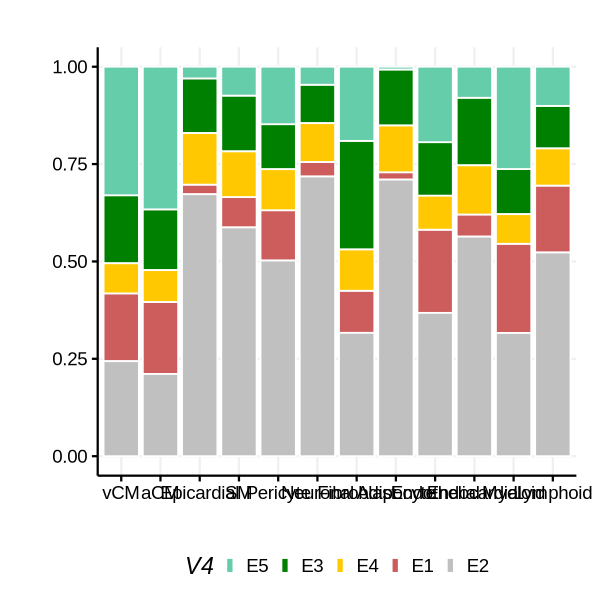

In [1108]:
chmm <- read.table('chromhmm/celltype/annotate/Heart_UnionPeak_by_celltype.xls', header = T)

t1 <- apply(chmm, MARGIN = 2, table) %>%
as.data.frame %>% tibble::rownames_to_column("V4") %>%
reshape2::melt() %>%
mutate(V4 = factor(as.character(V4), levels = c("E5", "E3", "E4", "E1", "E2"))) %>%
mutate(variable = factor(variable, levels = corder)) %>%
ggplot(aes(x = variable, y = value, fill = V4)) + 
# stat_boxplot(geom ='errorbar') + 
geom_col(color = "white", position = "fill") +
theme_Publication() + 
scale_fill_manual(values = cols) +
xlab("") + ylab("")

options(repr.plot.width = 5, repr.plot.height = 5)
t1

ggsave(t1, filename = "plot/FIG_chromhmm_ccre_coverage_ratio.pdf", dpi = 300, height = 4, width = 5)

In [94]:
### variation in chromatin states
### using vCM as a reference
cstate <- list()
for (file in list.files("chromhmm/celltype//output/overlap_w_vCM/")){
    fname <- gsub("_w_vCM.bed", "", file)
    scomp <- read.table(paste0("chromhmm/celltype//output/overlap_w_vCM/", fname, "_w_vCM.bed"))
    ### variable states in each 
    cstate[[fname]] <- scomp[,c("V4", "V8", "V9")] %>%
    group_by(V4, V8) %>%
    summarise(leng = sum(V9)) %>%
    filter(V8 != ".") %>%
    ungroup() %>% group_by(V4) %>%
    summarise(variable = sum(leng[V4 == V8], na.rm = TRUE),
             constant = sum(leng[V4 != V8], na.rm = TRUE)) %>%
    mutate(celltype = fname)
}

cstate <- do.call(rbind, cstate) %>%
mutate(ratio = variable/(variable + constant)) %>%
reshape2::dcast(celltype ~ V4) %>%
tibble::column_to_rownames("celltype")

cstate %>% head

`summarise()` has grouped output by 'V4'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'V4'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'V4'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'V4'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'V4'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'V4'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'V4'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'V4'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'V4'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'V4'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'V4'. You can override using the `.groups` argument.
`summarise()` has gro

,E1,E2,E3,E4,E5
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
aCM,0.927703277,0.9606393,0.50153668,0.7314801,0.9219035404
Adipocyte,0.002954943,0.9922799,0.03851232,0.1526508,0.0006416866
Endocardial,0.057652346,0.9876092,0.10431686,0.2370108,0.0914363463
Endothelial,0.774374623,0.9619348,0.20654879,0.2891044,0.3445107537
Epicardial,0.007710355,0.9907681,0.03703986,0.1471514,0.0123139928
Fibroblast,0.413914272,0.9727214,0.33603361,0.3823543,0.3105998219


Using celltype as id variables



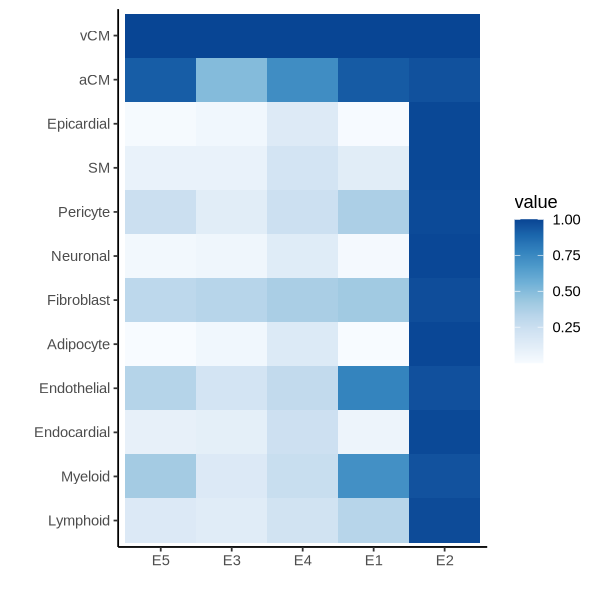

In [104]:
t1 <- cstate %>% tibble::rownames_to_column("celltype") %>%
reshape2::melt() %>%
mutate(variable = factor(as.character(variable), levels = c("E5", "E3", "E4", "E1", "E2"))) %>%
mutate(celltype = factor(celltype, levels = rev(corder))) %>%
ggplot(aes(y = celltype, x = variable, fill = value)) + 
geom_tile() + ylab("") + xlab("")+
theme_classic() + 
scale_fill_gradientn(colours = colorRampPalette(brewer.pal(n = 8, name = "Blues"))(10))

options(repr.plot.width = 5, repr.plot.height = 5)
t1

ggsave(t1, filename = "plot/FIG_chromhmm_variable_base_ratio_vs_vCM.pdf", dpi = 300, height = 6, width = 4)

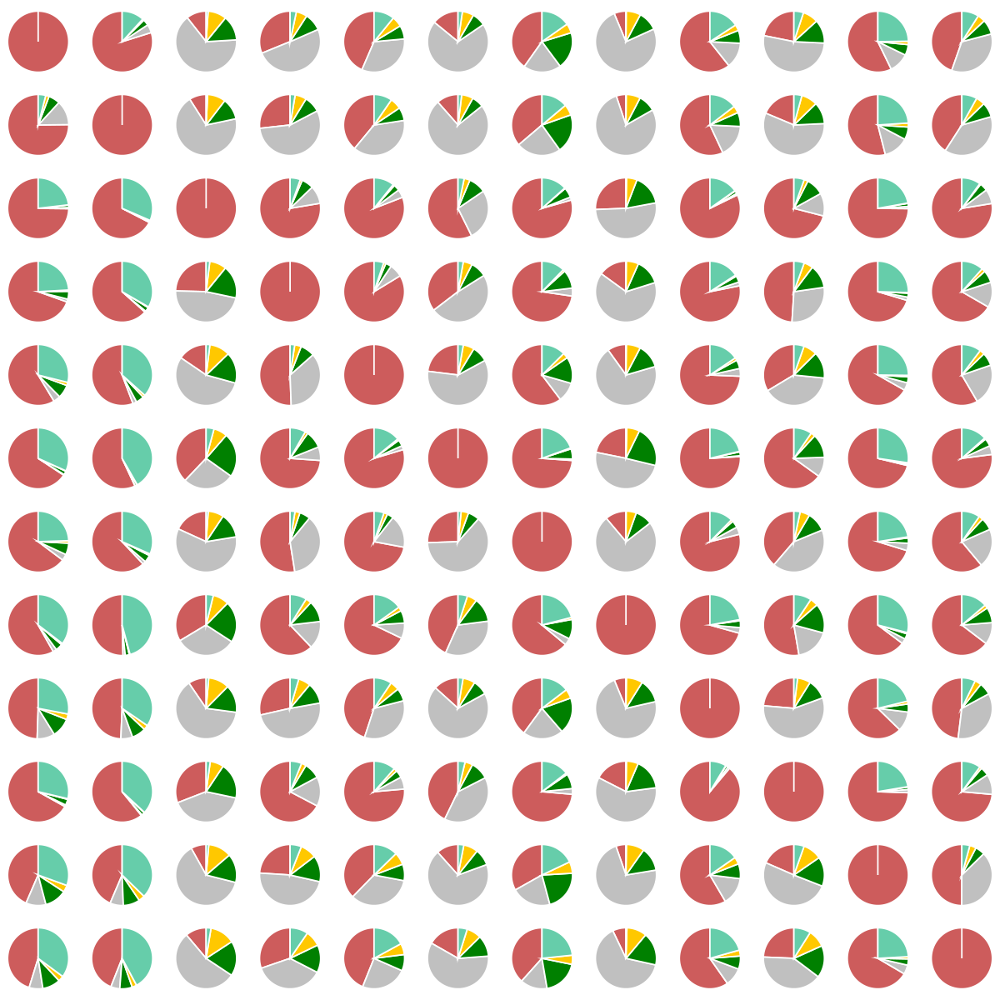

In [105]:
### dynamics of repressive elements
plist <- list()
for (f in colnames(chmm)){
    qrange = chmm[chmm[, f] == "E1",] %>% rownames
    tmp <- chmm[qrange, ] %>% apply(MARGIN = 2, function(x) as.data.frame(table(x)))

    plist[[f]] <- do.call(rbind, tmp) %>%
    mutate(celltype = stringr::str_split_fixed(rownames(.), pattern = "\\.", n = 2)[,1]) %>%
    mutate(celltype = factor(celltype, levels = corder)) %>% 
    ggplot(aes(x = ".", y = Freq, fill = x)) +
    geom_bar(width = 1, stat = "identity", color = "white") +
    coord_polar(theta = "y") + 
    theme_void() + facet_grid(. ~ celltype) +
    theme(strip.text = element_blank()) + 
    scale_fill_manual(values = cols) + NoLegend()
}
          
options(repr.plot.width = 10, repr.plot.height = 10)
fig1 <- cowplot::plot_grid(plotlist = plist, nrow = length(plist))
                                    
fig1
                                    
ggsave(fig1, filename = "plot/FIG_chromhmm_E1_in_other_ct.pdf", dpi = 300, height = 8, width = 8)

In [437]:
head(chmm)

,aCM_CONTROL,aCM_HF,Adipocyte_CONTROL,Adipocyte_HF,Endocardial_CONTROL,Endocardial_HF,Endothelial_CONTROL,Endothelial_HF,Epicardial_CONTROL,Epicardial_HF,⋯,Myeloid_CONTROL,Myeloid_HF,Neuronal_CONTROL,Neuronal_HF,Pericyte_CONTROL,Pericyte_HF,SM_CONTROL,SM_HF,vCM_CONTROL,vCM_HF
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
chr10:100006284-100006584,E4,E4,E2,E2,E3,E3,E3,E5,E3,E3,⋯,E5,E5,E4,E3,E5,E5,E4,E3,E3,E4
chr10:10001292-10001592,E2,E2,E2,E2,E2,E2,E2,E2,E2,E2,⋯,E2,E2,E2,E2,E2,E2,E2,E2,E2,E3
chr10:100020786-100021081,E1,E1,E2,E2,E2,E2,E2,E2,E2,E2,⋯,E2,E1,E2,E2,E2,E2,E2,E2,E1,E1
chr10:100038502-100038802,E1,E1,E2,E2,E3,E2,E5,E5,E2,E2,⋯,E2,E1,E2,E2,E3,E3,E1,E2,E1,E1
chr10:100043798-100044098,E1,E1,E2,E2,E3,E3,E5,E5,E2,E3,⋯,E4,E5,E2,E2,E5,E5,E3,E3,E2,E1
chr10:100115013-100115313,E1,E1,E2,E2,E2,E2,E2,E1,E2,E2,⋯,E2,E1,E2,E2,E1,E1,E2,E2,E1,E1


In [440]:
### use vCM as reference: element with at least one E5 in other cell types
# repressive states, with at lease one E3 or E5 in other cell types

# chmm <- read.table('chromhmm/celltype/annotate/Heart_UnionPeak_by_celltype.xls', header = T)
chmm %>% 
rowwise() %>%
mutate(open = sum(c_across(-vCM) %in% c("E5", "E3"))) %>%
mutate(variable = open > 0) %>%
dplyr::select(variable, vCM) %>%
table

        vCM
variable    E1    E2    E3    E4    E5
   FALSE 12881 15068  6105  4653  1337
   TRUE  36908 54642 43838 17419 93022

In [452]:
clist <- list()
for (f in corder){
    clist[[f]] <- chmm %>%
    mutate(open = rowSums(across(-all_of(f), ~ . %in% c("E3", "E5"))), variable = open > 0) %>%
    dplyr::select(vCM, variable) %>%
    table() %>%
    as.data.frame() %>% 
    setNames(c("state", "change", "Freq")) %>% 
    mutate(celltype = f)
}
t1 <- do.call(rbind, clist) %>%
group_by(celltype, state) %>%
mutate(ratio = Freq/sum(Freq)) %>%
filter(change == "TRUE") %>%
ggplot(aes(x = state, y = ratio)) + 
geom_boxplot() + 
theme_Publication()

t1$data %>%
head

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


state,change,Freq,celltype,ratio,.group
<fct>,<fct>,<int>,<chr>,<dbl>,<int>
E1,TRUE,36908,vCM,0.7412882,56
E2,TRUE,54642,vCM,0.7838474,57
E3,TRUE,43838,vCM,0.8777606,58
E4,TRUE,17419,vCM,0.7891899,59
E5,TRUE,93022,vCM,0.9858307,60
E1,TRUE,34931,aCM,0.7015807,51


In [454]:
t1$data %>%
filter(state == "E2", change == "TRUE") %>%
summary

 state     change        Freq         celltype             ratio       
 E1: 0   FALSE: 0   Min.   :45372   Length:12          Min.   :0.6509  
 E2:12   TRUE :12   1st Qu.:51687   Class :character   1st Qu.:0.7415  
 E3: 0              Median :54151   Mode  :character   Median :0.7768  
 E4: 0              Mean   :52353                      Mean   :0.7510  
 E5: 0              3rd Qu.:54488                      3rd Qu.:0.7816  
                    Max.   :54642                      Max.   :0.7838  
     .group     
 Min.   : 2.00  
 1st Qu.:15.75  
 Median :29.50  
 Mean   :29.50  
 3rd Qu.:43.25  
 Max.   :57.00  

Using V4 as id variables

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


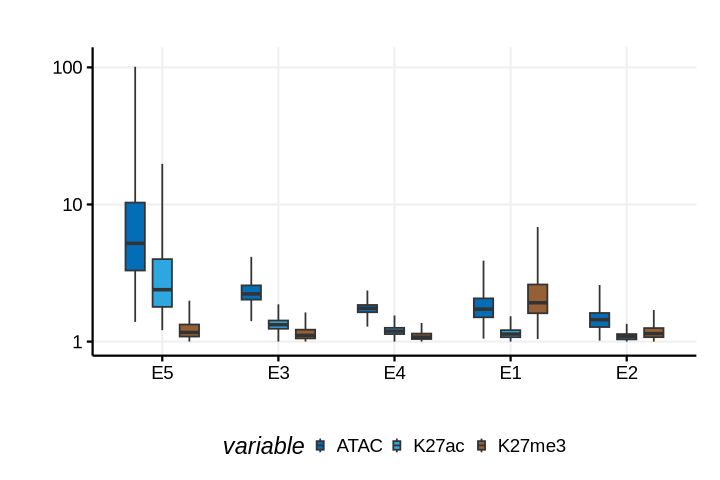

In [36]:
### Plot epigenetic signal
atac <- read.table("../reference/ATAC_celltype.cpm.txt")
k27ac <- read.csv("FNIH_Heart_signal/FNIH_Heart_pool.H3K27ac.HeartUnionPeak.cpm.csv", row.names = 1)
k27me3 <- read.csv("FNIH_Heart_signal/FNIH_Heart_pool.H3K27me3.HeartUnionPeak.cpm.csv", row.names = 1)


options(repr.plot.width = 6, repr.plot.height = 4)
ct <- "vCM"
qchmm <- read.table(paste0("chromhmm/celltype/annotate/Heart_UnionPeak_", ct, "_annotate.bed")) %>% 
mutate(bin = paste0(V1, ":", V2, "-", V3))
qchmm$ATAC <- atac[gsub(":", "-", qchmm$bin), ct]
qchmm$K27ac <- k27ac[qchmm$bin, ct]
qchmm$K27me3 <- k27me3[qchmm$bin, ct]
t1 <- qchmm %>% 
select(c(V4, ATAC, K27ac, K27me3)) %>%
reshape2::melt() %>%
mutate(V4 = factor(as.character(V4), levels = c("E5", "E3", "E4", "E1", "E2"))) %>%
ggplot(aes(x = V4, y = value+1, fill = variable)) + 
geom_boxplot(width = 0.5, position = position_dodge(0.7), coef = 2, outlier.shape = NA) +
theme_Publication() + scale_y_log10() + 
scale_fill_manual(values = c("#036EB8", "#2EA7E0", "#956134")) +
xlab("") + ylab("")

t1
ggsave(t1, filename = "plot/FIG_vCM_chromhmm_epig_siganl.pdf", dpi = 300, height = 4, width = 6)

`summarise()` has grouped output by 'V4'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'V4'. You can override using the `.groups` argument.


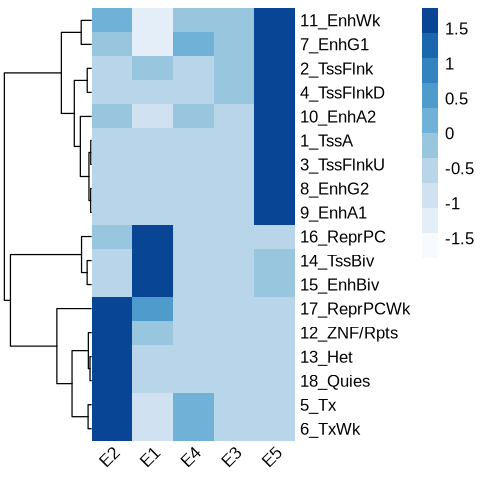

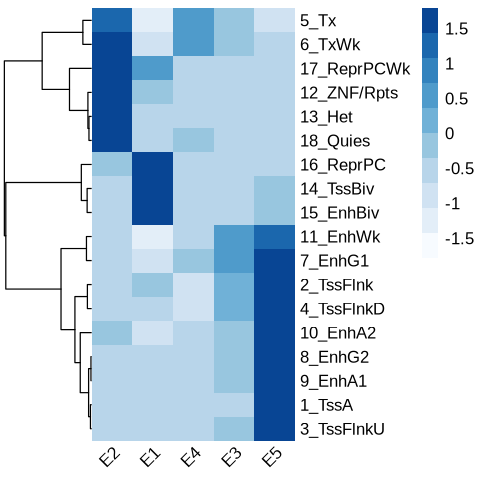

In [90]:
### Compare with epigenome roadmap?
# bedtools intersect -wao -a output/vCM_5_segments.bed -b /projects/ps-renlab2/y2xie/projects/public_data/17.Epigenome_roadmap/mnemonics/E095_18_core_K27ac_mnemonics.hg38.bed > vCM_5_segments_ovlp_095_18_core_K27ac_mnemonics.hg38.bed
scomp <- read.table("/projects/ps-renlab2/y2xie/projects/77.LC/81.FNIH_DPT_IGM_240827/05.R/chromhmm/bulk/vCM_5_segments_ovlp_095_18_core_K27ac_mnemonics.hg38.bed")

scompp <- scomp[,c("V4", "V8", "V9")] %>%
group_by(V4, V8) %>%
summarise(leng = sum(V9)) %>%
filter(V8 != ".") %>%
reshape2::dcast(V4 ~ V8, value.var = "leng") %>%
tibble::column_to_rownames("V4")

scompp[is.na(scompp)] <- 0
rmat <- t(scompp[c("E2", "E1", "E4", "E3", "E5"),])
max_indices <- max.col(rmat)
permutation_vector <- order(max_indices)
smat <- rmat[(permutation_vector),]

smat %>%
pheatmap(scale = "row", cluster_rows = T, cluster_cols = F, angle_col = 45,
         show_rownames = T, show_colnames = T, border_color = NA, 
         color = colorRampPalette(brewer.pal(n = 8, name = "Blues"))(10))

scomp <- read.table("/projects/ps-renlab2/y2xie/projects/77.LC/81.FNIH_DPT_IGM_240827/05.R/chromhmm/bulk/vCM_5_new_segments_ovlp_095_18_core_K27ac_mnemonics.hg38.bed")

scompp <- scomp[,c("V4", "V8", "V9")] %>%
group_by(V4, V8) %>%
summarise(leng = sum(V9)) %>%
filter(V8 != ".") %>%
reshape2::dcast(V4 ~ V8, value.var = "leng") %>%
tibble::column_to_rownames("V4")

scompp[is.na(scompp)] <- 0
rmat <- t(scompp[c("E2", "E1", "E4", "E3", "E5"),])
max_indices <- max.col(rmat)
permutation_vector <- order(max_indices)
smat <- rmat[(permutation_vector),]

t1 <- smat %>%
pheatmap(scale = "row", cluster_rows = T, cluster_cols = F, angle_col = 45,
         show_rownames = T, show_colnames = T, border_color = NA, 
         color = colorRampPalette(brewer.pal(n = 8, name = "Blues"))(10))

`summarise()` has grouped output by 'V4'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'V4'. You can override using the `.groups` argument.


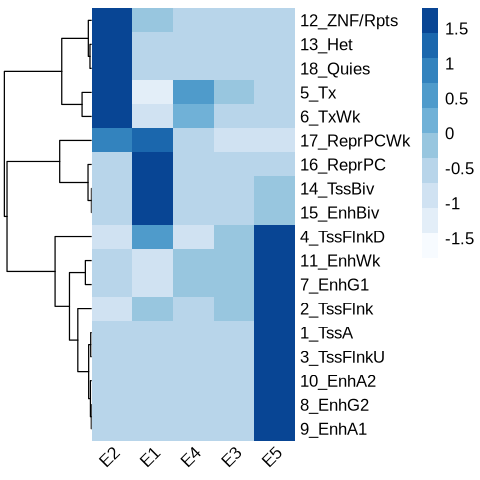

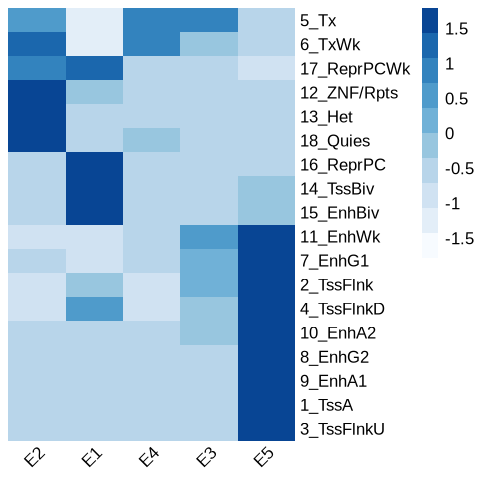

In [94]:
scomp <- read.table("/projects/ps-renlab2/y2xie/projects/77.LC/81.FNIH_DPT_IGM_240827/05.R/chromhmm/bulk/vCM_5_segments_ovlp_105_18_core_K27ac_mnemonics.hg38.bed")

scompp <- scomp[,c("V4", "V8", "V9")] %>%
group_by(V4, V8) %>%
summarise(leng = sum(V9)) %>%
filter(V8 != ".") %>%
reshape2::dcast(V4 ~ V8, value.var = "leng") %>%
tibble::column_to_rownames("V4")

scompp[is.na(scompp)] <- 0
rmat <- t(scompp[c("E2", "E1", "E4", "E3", "E5"),])
max_indices <- max.col(rmat)
permutation_vector <- order(max_indices)
smat <- rmat[(permutation_vector),]

options(repr.plot.width = 4, repr.plot.height = 4)
smat %>%
pheatmap(scale = "row", cluster_rows = T, cluster_cols = F, angle_col = 45,
         show_rownames = T, show_colnames = T, border_color = NA, 
         color = colorRampPalette(brewer.pal(n = 8, name = "Blues"))(10))

scomp <- read.table("/projects/ps-renlab2/y2xie/projects/77.LC/81.FNIH_DPT_IGM_240827/05.R/chromhmm/bulk/vCM_5_new_segments_ovlp_105_18_core_K27ac_mnemonics.hg38.bed")

scompp <- scomp[,c("V4", "V8", "V9")] %>%
group_by(V4, V8) %>%
summarise(leng = sum(V9)) %>%
filter(V8 != ".") %>%
reshape2::dcast(V4 ~ V8, value.var = "leng") %>%
tibble::column_to_rownames("V4")

scompp[is.na(scompp)] <- 0
rmat <- t(scompp[c("E2", "E1", "E4", "E3", "E5"),])
max_indices <- max.col(rmat)
permutation_vector <- order(max_indices)
smat <- rmat[(permutation_vector),]

t2 <- smat[t1$tree_row$labels[t1$tree_row$order],] %>%
pheatmap(scale = "row", cluster_rows = F, cluster_cols = F, angle_col = 45,
         show_rownames = T, show_colnames = T, border_color = NA, 
         color = colorRampPalette(brewer.pal(n = 8, name = "Blues"))(10))

In [95]:
ggsave(t1, filename = "plot/FIG_vCM_chromhmm_new_overlap_w_roadmap_95.pdf", dpi = 300, height = 7, width = 4)
ggsave(t2, filename = "plot/FIG_vCM_chromhmm_new_overlap_w_roadmap_105.pdf", dpi = 300, height = 7, width = 4)

In [134]:
### Run GREAT of E2 element
suppressPackageStartupMessages(library(rGREAT))
options(warn = 0)

qpeak <- chmm %>% filter(vCM == "E1") %>% rownames

tmp <- stringr::str_split_fixed(qpeak, pattern = "[:-]", n = 3) %>% as.data.frame
bed.gr = GRanges(tmp$V1, IRanges(as.integer(tmp$V2),as.integer(tmp$V3)))
job = submitGreatJob(gr=bed.gr, species="hg38")
tb = getEnrichmentTables(job)

tb[["GO Biological Process"]] %>%
filter(Binom_Observed_Region_Hits < 1000) %>%
filter(Binom_Adjp_BH < 0.05 & Hyper_Adjp_BH < 0.05) %>%
slice_min(order_by = Binom_Adjp_BH, n = 10) %>%
head

# qgene <- read.table("chromhmm/celltype//tss_annotate/tss_vCM_annotate.bed") %>%
# filter(V5 == "E1") %>%
# dplyr::select(V4) %>% unlist %>% unique

# qtable <- enrichGO(gene = qgene,
#                 OrgDb = org.Hs.eg.db,
#                 keyType = 'SYMBOL',
#                 ont = "BP", # biological process
#                 pAdjustMethod = "BH", 
#                 pvalueCutoff = 0.05, 
#                 qvalueCutoff = 0.05, 
#                 readable = TRUE)

Warning message in submitGreatJob(gr = bed.gr, species = "hg38"):
“GREAT gives a warning:
Your set hits a large fraction of the genes in the genome, which often
does not work well with the GREAT Significant by Both view due to a
saturation of the gene-based hypergeometric test.

See our tips for handling large datasets or try the Significant By
Region-based Binomial view.”
The default enrichment tables contain no associated genes for the input
regions.You can set `download_by = 'tsv'` to download the complete
table,but note only the top 500 regions can be retreived. See the
following link:

https://great-help.atlassian.net/wiki/spaces/GREAT/pages/655401/Export#Export-GlobalExport

or you can try the local GREAT analysis with the function `great()`.



,ID,name,Binom_Genome_Fraction,Binom_Expected,Binom_Observed_Region_Hits,Binom_Fold_Enrichment,Binom_Region_Set_Coverage,Binom_Raw_PValue,Binom_Adjp_BH,Hyper_Total_Genes,Hyper_Expected,Hyper_Observed_Gene_Hits,Hyper_Fold_Enrichment,Hyper_Gene_Set_Coverage,Hyper_Term_Gene_Coverage,Hyper_Raw_PValue,Hyper_Adjp_BH
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,GO:0070098,chemokine-mediated signaling pathway,0.003648669,181.6636,619,3.407398,0.01243247,7.585540e-143,9.416804e-141,74,36.89556,59,1.599108,0.006302072,0.7972973,1.068511e-07,4.718301e-06
2,GO:0045682,regulation of epidermis development,0.009865211,491.1790,990,2.015559,0.01988391,3.836907e-88,2.427397e-86,78,38.88992,51,1.311394,0.005447554,0.6538462,4.011423e-03,4.993975e-02
3,GO:0048333,mesodermal cell differentiation,0.004337024,215.9361,563,2.607253,0.01130772,2.106093e-86,1.295050e-84,26,12.96331,21,1.619957,0.002243110,0.8076923,1.182171e-03,1.906396e-02
4,GO:0014015,positive regulation of gliogenesis,0.006070654,302.2518,680,2.249780,0.01365764,2.572471e-78,1.416366e-76,50,24.92943,35,1.403963,0.003738517,0.7000000,3.074250e-03,4.114143e-02
5,GO:0042446,hormone biosynthetic process,0.004803786,239.1757,579,2.420814,0.01162907,1.634438e-77,8.814578e-76,52,25.92661,37,1.427105,0.003952147,0.7115385,1.472276e-03,2.275219e-02
6,GO:0045685,regulation of glial cell differentiation,0.009674071,481.6623,936,1.943270,0.01879933,5.827068e-76,3.030766e-74,58,28.91814,45,1.556116,0.004806665,0.7758621,1.335606e-05,3.976298e-04


In [150]:
options(repr.plot.width = 7, repr.plot.height = 8)
t1 <- tb[["GO Biological Process"]] %>%
filter(Binom_Observed_Region_Hits < 1000) %>%
filter(Binom_Adjp_BH < 0.05, Hyper_Adjp_BH < 0.05) %>%
arrange(Binom_Adjp_BH) %>% 
mutate(name = factor(name, levels = rev(name))) %>%
slice_min(order_by = Binom_Adjp_BH, n = 10) %>%
ggplot(aes(x = -log10(Binom_Adjp_BH), y = name)) + 
geom_point(aes(size = Binom_Fold_Enrichment)) + 
scale_size(range = c(2, 10)) + ylab("") + 
theme_Publication()

ggsave(t1, filename = "plot/FIG_vCM_E1_rGREAT.pdf", dpi = 300, height = 8, width = 7)

write.table(tb[["GO Biological Process"]], "plot/FIG_vCM_E1_rGREAT.tsv", 
            sep = "\t", quote = F, row.names = T, col.names = T)

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


### annotate all cCREs with chromatin states

In [140]:
suppressPackageStartupMessages(library(ggalluvial))

chmm <- list()
for (fname in corder){# list.files("chromhmm/celltype/annotate/", pattern = "^Heart_UnionPeak.*")){
    f <- paste0("Heart_UnionPeak_", fname, "_annotate.bed")
    chmm[[fname]] <- read.table(paste0("chromhmm/celltype/annotate/", f)) %>% 
    mutate(range = paste0(V1, ":", V2, "-", V3)) %>%
    select(c(range, V4)) %>% 
    group_by(range) %>%
    slice_sample(n = 1) %>%
    ungroup() %>%
    tibble::column_to_rownames("range") %>% setNames(fname)
}
commonf <- Reduce(intersect, lapply(chmm, rownames))
for (f in names(chmm)){
    chmm[[f]] <- chmm[[f]][commonf, , drop = F]
}
chmm <- Reduce(cbind, chmm[-1], chmm[[1]]) ### dont use do.call for cbind

In [144]:
# write.table(chmm, "chromhmm/celltype/annotate/Heart_UnionPeak_by_celltype.xls", sep = "\t", quote = F, row.names = T, col.names = T)
chmm <- read.table('chromhmm/celltype/annotate/Heart_UnionPeak_by_celltype.xls', header = T)

In [23]:
tmp <- read.table("../reference/FNIH_peaks/NMF/res/FNIH_Heart_pool.ATAC_celltype.HeartUnionPeaks.r11n10.statW", skip = 1)
tmp$V1 <- sub("-", ":", tmp$V1)

smodule <- list() 
for (f in unique(tmp$V3)){
    qpeak <- tmp %>% filter(V3 == f) %>% select(V1) %>% unlist %>% as.character
    smodule[[paste0(f)]] <- chmm[qpeak,] %>% 
    tibble::rownames_to_column("peak") %>%
    reshape2::melt(id.vars = 'peak') %>%
    select(variable, value) %>% table %>%
    as.data.frame %>% mutate(module = f)
}

smodule <- do.call(rbind, smodule)

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


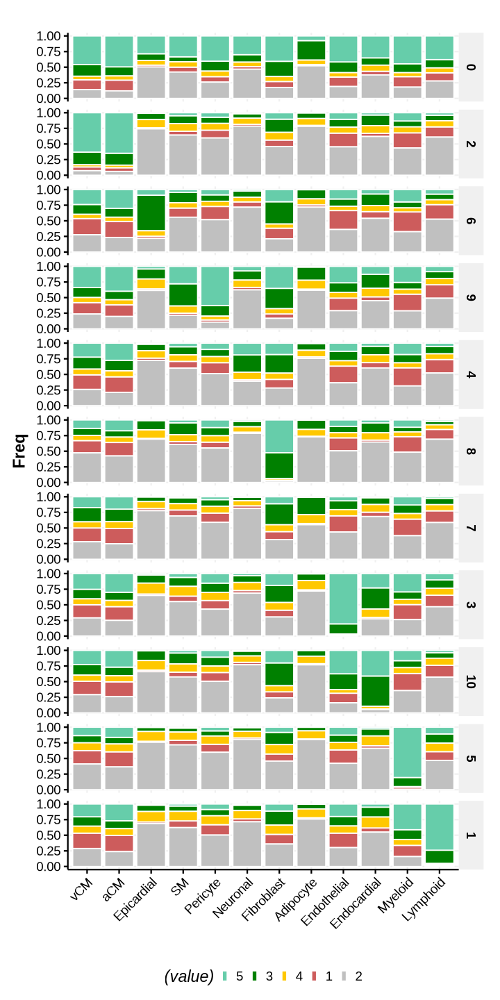

In [25]:
options(repr.plot.width = 6, repr.plot.height = 12)
t1 <- smodule %>%
mutate(variable = factor(variable, levels = corder)) %>% #arrange(variable) %>%
mutate(module = factor(module, levels = c(0,2,6,9,4,8,7,3,10,5,1))) %>%
mutate(value = as.integer(gsub("E", "", value))) %>%
mutate(value = factor(as.character(value), levels = c(5,3,4,1,2))) %>%
ggplot(aes(x = variable, y = Freq, fill = (value))) + 
geom_col(position = "fill", color = "white") + 
theme_Publication() + xlab("") + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + 
scale_fill_manual(values = c('#66cdaa', "#008000", "#ffc800","#cd5c5c","#c0c0c0")) + 
facet_grid(module ~ .)
t1

ggsave(t1, filename = "plot/FIG_celltype_module_statse.pdf", dpi = 150, height = 12, width = 6)

In [28]:
### Read all unfiltereed peaks...
smodule <- list() 
for (file in list.files("chromhmm/unfilter_peaks_annotate/", pattern = ".bed")){
    f <- gsub("_annotate.bed", "", file)
    smodule[[f]] <- read.table(paste0("chromhmm/unfilter_peaks_annotate/", file)) %>% select(V4) %>% 
    reshape2::melt() %>% table %>%
    as.data.frame %>% mutate(celltype = f)
}

smodule <- do.call(rbind, smodule)

Using V4 as id variables

Using V4 as id variables

Using V4 as id variables

Using V4 as id variables

Using V4 as id variables

Using V4 as id variables

Using V4 as id variables

Using V4 as id variables

Using V4 as id variables

Using V4 as id variables

Using V4 as id variables

Using V4 as id variables



Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


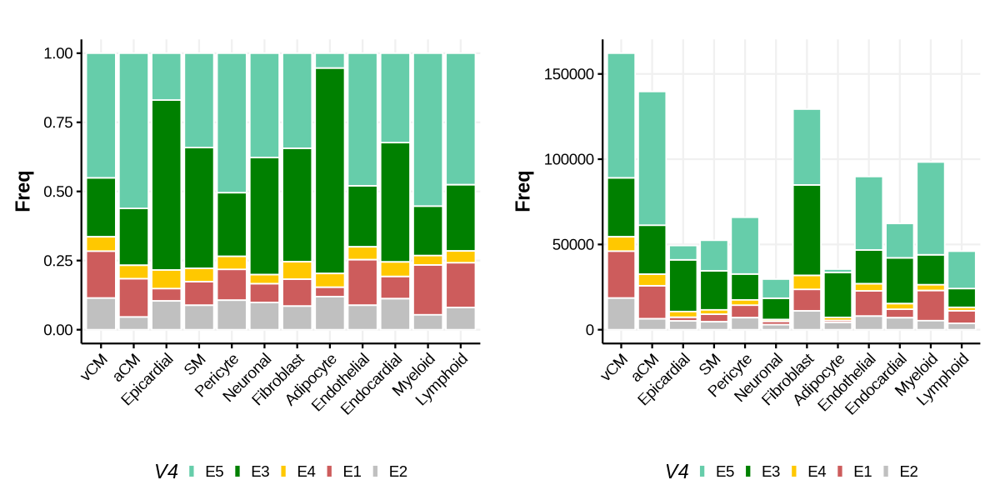

In [31]:
t1 <- smodule %>% filter(V4 != ".") %>%
mutate(celltype = factor(celltype, levels = corder)) %>%
mutate(V4 = factor(as.character(V4), levels = paste0("E", c(5,3,4,1,2)))) %>%
ggplot(aes(x = celltype, y = Freq, fill = V4)) + 
geom_col(position = "fill", color = "white") + 
theme_Publication() + xlab("") + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + 
scale_fill_manual(values = c('#66cdaa', "#008000", "#ffc800","#cd5c5c","#c0c0c0"))

t2 <- smodule %>% filter(V4 != ".") %>%
mutate(celltype = factor(celltype, levels = corder)) %>%
mutate(V4 = factor(as.character(V4), levels = paste0("E", c(5,3,4,1,2)))) %>%
ggplot(aes(x = celltype, y = Freq, fill = V4)) + 
geom_col(color = "white") + 
theme_Publication() + xlab("") + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + 
scale_fill_manual(values = c('#66cdaa', "#008000", "#ffc800","#cd5c5c","#c0c0c0"))

options(repr.plot.width = 10, repr.plot.height = 5)
fig1 <- cowplot::plot_grid(t1, t2)
fig1

ggsave(fig1, filename = "plot/FIG_celltype_rawpeaks_states.pdf", dpi = 300, height = 6, width = 12)

### Plot example ChromHMM states in vCM

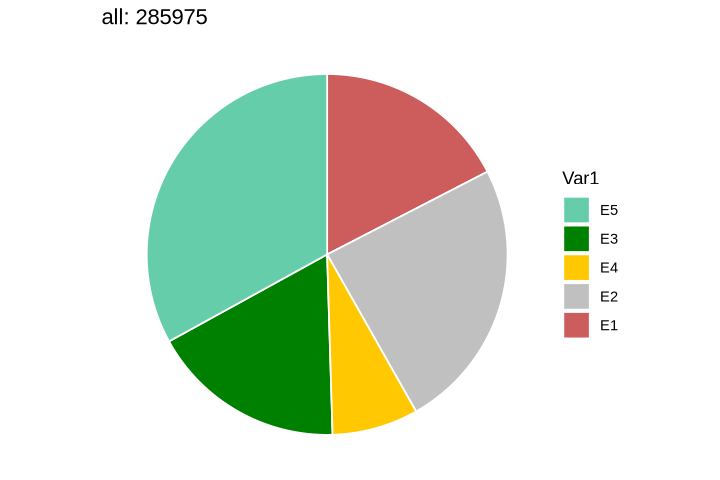

In [38]:
suppressPackageStartupMessages(library(ggalluvial))
chmm <- read.table("chromhmm/celltype/annotate/Heart_UnionPeak_vCM_annotate.bed") %>% mutate(range = paste0(V1, "-", V2, "-", V3))
fig1 <- table(chmm[, 'V4']) %>%
as.data.frame %>% setNames(c("Var1", "ct")) %>% filter(Var1 != ".") %>%
mutate(Var1 = factor(as.character(Var1), levels = c("E5", "E3", "E4", "E2", "E1"))) %>%
ggplot(aes(x = "", y = ct, fill = Var1)) + 
geom_bar(stat = "identity", position = position_fill(), color = "white") + 
coord_polar(theta = "y") + theme_void() + 
scale_fill_manual(values = cols) + 
ggtitle(paste0("all: ", nrow(chmm)))

fig1
ggsave(fig1, filename = "plot/FIG_vCM_chromhmm_elements.pdf", dpi = 300, height = 4, width = 4)

In [42]:
fig1$data %>% mutate(freq = 100*ct/sum(ct))

Var1,ct,freq
<fct>,<int>,<dbl>
E1,49799,17.413760
E2,69725,24.381502
E3,49986,17.479150
E4,22086,7.723053
E5,94379,33.002535


V4,size,freq
<chr>,<int>,<dbl>
E1,302040200,9.780248
E2,2080937200,67.382028
E3,158430200,5.130067
E4,320605600,10.381407
E5,226254200,7.326250


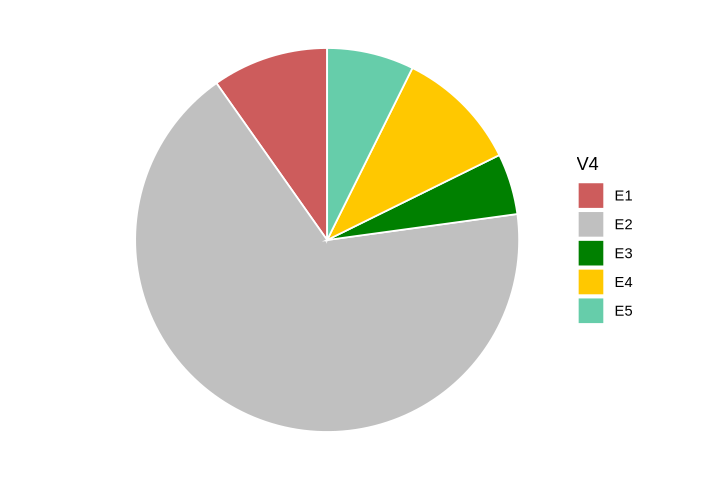

In [50]:
### Plot exmaple: vCM
t1 <- read.table("chromhmm/celltype/output/vCM_5_segments.bed") %>% mutate(size = V3 - V2) %>%
group_by(V4) %>% summarise(size = sum(size)) %>%
ggplot(aes(x = "", y = size, fill = V4)) +
geom_bar(width = 1, stat = "identity", color = "white") +
coord_polar(theta = "y") + 
theme_void() + 
scale_fill_manual(values = cols)

t1
ggsave(t1, filename = "plot/FIG_vCM_chromhmm_genome_coverage.pdf", dpi = 300, height = 4, width = 4)

t1$data %>% mutate(freq = 100*size/sum(size))

In [120]:
### Color chromatin states
ccolor = data.frame(color = c("#cd5c5c", "#c0c0c0", "#008000", "#ffc800", '#66cdaa'), 
                    state = paste0('E', 1:5))
ccolor$color <- apply(col2rgb(ccolor$color), 2, function(x) paste0(x, collapse = ","))
system("mkdir chromhmm/disease_output/chromhmm_segment")
for (f in list.files("chromhmm/disease_output/bin200_5_new/", pattern = '.*_5_segments.bed.gz')){
    fname = gsub("_5_segments.bed.gz", "", f)
    tmp <- read.table(paste0("chromhmm/disease_output/bin200_5_new/", f)) %>%
    mutate(V5 = 0) %>%
    mutate(V6 = "*") %>%
    mutate(V7 = V2) %>%
    mutate(V8 = V3)
    tmp <- merge(tmp, ccolor, by.x = "V4", by.y = "state")
    write.table(tmp[,c("V1", "V2", "V3", "V4", "V5", "V6", "V7", "V8", "color")],
                paste0("chromhmm/disease_output/chromhmm_segment/", fname, "_5_segments.bed"),
               sep = "\t", quote = F, row.names = F, col.names = F)
}

In [121]:
### celltype level
system("mkdir chromhmm/celltype/output/chromhmm_segment")
for (f in list.files("chromhmm/celltype/output/", pattern = '.*_5_segments.bed')){
    fname = gsub("_5_segments.bed", "", f)
    tmp <- read.table(paste0("chromhmm/celltype/output/", f)) %>%
    mutate(V5 = 0) %>%
    mutate(V6 = "*") %>%
    mutate(V7 = V2) %>%
    mutate(V8 = V3)
    tmp <- merge(tmp, ccolor, by.x = "V4", by.y = "state")
    write.table(tmp[,c("V1", "V2", "V3", "V4", "V5", "V6", "V7", "V8", "color")],
                paste0("chromhmm/celltype/output/chromhmm_segment/", fname, "_5_segments.bed"),
               sep = "\t", quote = F, row.names = F, col.names = F)
}

## Prepare data for ABC model: celltype and disease

In [629]:
### K27ac and ATAC signal files
k27ac <- read.csv("FNIH_Heart_signal/FNIH_Heart_pool.H3K27ac.HeartUnionPeak.cpm.csv", row.names = 1) ### FNIH
for (f in colnames(k27ac)){
    tmp <- k27ac[, f, drop = F]
    tmp[,c("chr", "start", "end")] <- stringr::str_split_fixed(rownames(tmp), pattern = "[:-]", n = 3)
    write.table(tmp[,c("chr", "start", "end", f)], paste0("../../87.FNIH_DHC_IGM_240925/05.R/abc//celltype/", f, "_H3K27ac.cpm"),
                row.names = F, col.names = F, sep = "\t", quote = F)
}

In [71]:
### ATAC signal
# atac <- read.table("../reference/ATAC_celltype.cpm.txt", row.names = 1) ### FNIH
for (f in colnames(atac)){
    tmp <- atac[, f, drop = F]
    tmp[,c("chr", "start", "end")] <- stringr::str_split_fixed(rownames(tmp), pattern = "[:-]", n = 3)
    write.table(tmp[,c("chr", "start", "end", f)], paste0("../../87.FNIH_DHC_IGM_240925/05.R/atac_abc/celltype/", f, "_atac.cpm"),
                row.names = F, col.names = F, sep = "\t", quote = F)
}

In [129]:
### RNA expression with annotation
### FNIH + CAREHF
### "chr", "start", "end", "name" "signal" "strand"
rpkm <- read.table("integration/FNIH_Heart_pool.int.rpkm.txt", row.names = 1, header = T)
hg38 <- read.table("/projects//ps-renlab/y2xie/projects/genome_ref/Paired-Tag/hg38/hg38.gcode.10X.bed")
for (f in colnames(rpkm)){
    tmp <- merge(hg38, rpkm, by.x = "V6", by.y = 0) %>% select(c(V1, V2, V3, V6, all_of(f), V4))
    tmp$V6 <- make.unique(tmp$V6, sep = "..") ### prevent gene name duplication and we can rescue later
    write.table(tmp, paste0("../../87.FNIH_DHC_IGM_240925/05.R/abc//celltype/", f, "_gex.rpkm"),
                row.names = F, col.names = F, sep = "\t", quote = F)
}

In [630]:
### For disease
k27ac <- read.csv("FNIH_Heart_signal/FNIH_Heart_pool.H3K27ac.disease.HeartUnionPeak.cpm.csv", row.names = 1) ### FNIH
for (f in colnames(k27ac)){
    tmp <- k27ac[, f, drop = F]
    tmp[,c("chr", "start", "end")] <- stringr::str_split_fixed(rownames(tmp), pattern = "[:-]", n = 3)
    write.table(tmp[,c("chr", "start", "end", f)], paste0("../../87.FNIH_DHC_IGM_240925/05.R/abc/disease/", f, "_H3K27ac.cpm"),
                row.names = F, col.names = F, sep = "\t", quote = F)
}

## Check ABC results

In [385]:
aabc <- list()
for (f in corder){
    tmp <- read.table(paste0("../../87.FNIH_DHC_IGM_240925/05.R/atac_abc/celltype/output/", f, "/EnhancerPredictions.txt"), sep = "\t", header = T) #%>% filter(abs(((start+end)/2) - TargetGeneTSS) >= 10000) ### long range only?
    gex <- read.table(paste0("../../87.FNIH_DHC_IGM_240925/05.R/atac_abc/celltype/", f, "_gex.rpkm"), header = F, sep = "\t")
    ac <- read.table(paste0("../../87.FNIH_DHC_IGM_240925/05.R/atac_abc/celltype/", f, "_atac.cpm"), header = F, sep = "\t")
    gex <- gex %>%
    mutate(start = ifelse(V6 == "+", V2, V3-1)) %>%
    mutate(end = ifelse(V6 == "+", V2+1, V3)) %>%
    dplyr::select(c(V1, start, end, V4, V5)) %>% 
    setNames(c("chrom", "start", "end", "TargetGene", "RPKM"))
    tmp <- tmp %>% mutate(range = paste0(chr, ":", start, "-", end))
    ac <- ac %>% setNames(c("chrom", "start", "end", "CPM")) %>% mutate(range = paste0(chrom, ":", start, "-", end))
    
    tmp$CellType <- f
    tmp <- merge(tmp, gex, by = "TargetGene")
    aabc[[f]] <- merge(tmp, ac, by = "range") %>% 
    dplyr::select(c(chr, start.x, end.x,range, name, CPM, chrom.x, start.y, end.y, TargetGene, RPKM, CellType, ABC.Score))
    
}
aabc <- do.call(rbind, aabc)
aabc$TargetGene <- gsub("\\.\\..*", "", aabc$TargetGene)
write.table(aabc, "../../87.FNIH_DHC_IGM_240925/05.R/atac_abc/FNIH_heart_celltype_abc_links.txt", 
           sep = "\t", quote = F, row.names = F, col.names = T)

system("mkdir ../../87.FNIH_DHC_IGM_240925/05.R/atac_abc/celltype/output/abc_bedpe")
aabc <- aabc %>% filter(abs(((start.x+start.x)/2) - start.y) >= 10000)
write.table(aabc, "../../87.FNIH_DHC_IGM_240925/05.R/atac_abc/celltype/output/abc_bedpe/abc_lite_distalpairs.tsv", 
           sep = "\t", quote = F, row.names = F, col.names = T)

In [386]:
dim(aabc)
table(aabc$CellType)

[1] 71824    13


        aCM   Adipocyte Endocardial Endothelial  Epicardial  Fibroblast 
       4217        5223        6035        7696        4892        4813 
   Lymphoid     Myeloid    Neuronal    Pericyte          SM         vCM 
       8989        6306        7096        7342        5239        3976 

In [389]:
abc <- read.table("../../87.FNIH_DHC_IGM_240925/05.R/abc/celltype/output/abc_bedpe/abc_lite_distalpairs.tsv", header = T)
table(abc$CellType)


        aCM   Adipocyte Endocardial Endothelial  Epicardial  Fibroblast 
       4951       11200        8144       10126        5739        4658 
   Lymphoid     Myeloid    Neuronal    Pericyte          SM         vCM 
       9598        7243        8053        8720        6181        5216 

In [100]:
### Output ABC links in diseases
abc <- list()
for (f in corder){
    tmp <- read.table(paste0("../../87.FNIH_DHC_IGM_240925/05.R/abc/celltype/output/", f, "/EnhancerPredictions.txt"), sep = "\t", header = T) #%>% filter(abs(((start+end)/2) - TargetGeneTSS) >= 10000) ### long range only?
    gex <- read.table(paste0("../../87.FNIH_DHC_IGM_240925/05.R/abc/celltype/", f, "_gex.rpkm"), header = F, sep = "\t")
    ac <- read.table(paste0("../../87.FNIH_DHC_IGM_240925/05.R/abc/celltype/", f, "_H3K27ac.cpm"), header = F, sep = "\t")
    gex <- gex %>%
    mutate(start = ifelse(V6 == "+", V2, V3-1)) %>%
    mutate(end = ifelse(V6 == "+", V2+1, V3)) %>%
    select(c(V1, start, end, V4, V5)) %>% setNames(c("chrom", "start", "end", "TargetGene", "RPKM"))
    tmp <- tmp %>% mutate(range = paste0(chr, ":", start, "-", end))
    ac <- ac %>% setNames(c("chrom", "start", "end", "CPM")) %>% mutate(range = paste0(chrom, ":", start, "-", end))
    
    tmp$CellType <- f
    tmp <- merge(tmp, gex, by = "TargetGene")
    abc[[f]] <- merge(tmp, ac, by = "range") %>% select(c(chr, start.x, end.x,range, name, CPM, chrom.x, start.y, end.y, TargetGene, RPKM, CellType, ABC.Score))
    
}
abc <- do.call(rbind, abc)
abc$TargetGene <- gsub("\\.\\..*", "", abc$TargetGene)
write.table(abc, "../../87.FNIH_DHC_IGM_240925/05.R/abc/FNIH_heart_celltype_abc_links.txt", 
           sep = "\t", quote = F, row.names = F, col.names = T)

abc <- abc %>% filter(abs(((start.x+start.x)/2) - start.y) >= 10000)
write.table(abc, "../../87.FNIH_DHC_IGM_240925/05.R/abc/celltype/output/abc_bedpe/abc_lite_distalpairs.tsv", 
           sep = "\t", quote = F, row.names = F, col.names = T)

# for (f in unique(abc$CellType)){
#     tmp <- abc %>% filter(CellType == f) %>% 
#     select(c(chr, start.x, end.x, chrom.x, start.y, end.y, range, TargetGene, CPM, RPKM, ABC.Score))
#     write.table(tmp, paste0("../../87.FNIH_DHC_IGM_240925/05.R/abc/disease/output/abc_bedpe/", f, ".bedpe"),
#                sep = "\t", quote = F, row.names = F, col.names = F)
# }

# write.table(colnames(tmp), "../../87.FNIH_DHC_IGM_240925/05.R/abc/disease/output/abc_bedpe/bedpe_header", 
#            sep = "\t", quote = F, row.names = F, col.names = T)

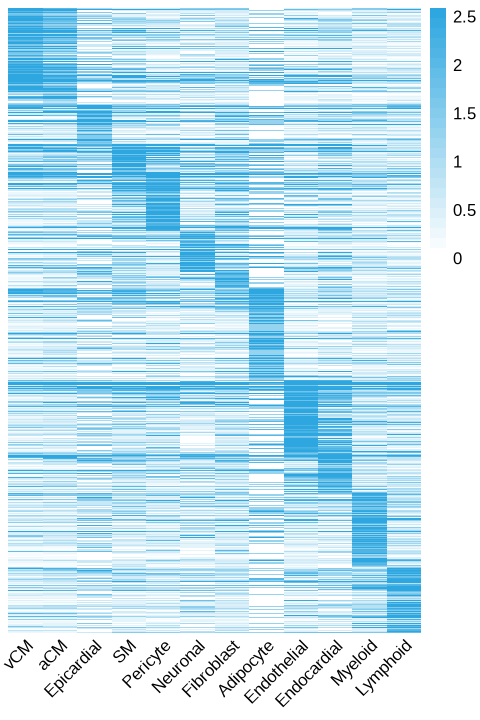

In [196]:
### Create heatmap: all links
options(repr.plot.width = 4, repr.plot.height = 6)

k27ac <- read.csv("FNIH_Heart_signal/FNIH_Heart_pool.H3K27ac.HeartUnionPeak.cpm.csv", row.names = 1) ### FNIH
rmat <- k27ac[sub("-", ":", unique(abc$range)), corder]
max_indices <- max.col(rmat)
permutation_vector <- order(max_indices)
smat <- rmat[permutation_vector, ]
smat[smat>5] <- 5

options(repr.plot.width = 4, repr.plot.height = 6)
t1 <- log2(smat + 1) %>%
pheatmap(scale = "none", cluster_rows = F, cluster_cols = F, angle_col = 45, #gaps_row = unlist(gaprow),
         show_rownames = F, # annotation_colors = ccolor, annotation_row = ranno, 
         border_color = NA, color = colorRampPalette(c("white", "#2EA7E0"))(25))

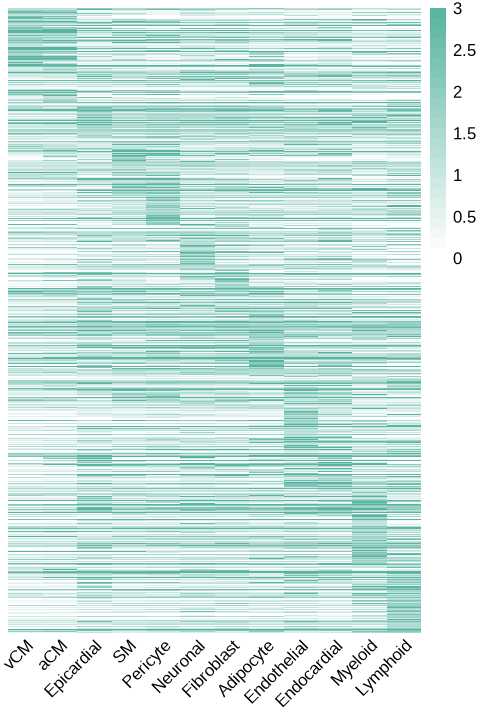

In [200]:
rpkm <- read.table("integration/FNIH_Heart_pool.int.rpkm.txt", row.names = 1, header = T)
ssmat <- log2(rpkm[abc[match(rownames(smat), sub("-", ":", abc$range)),]$TargetGene, corder] + 1)
ssmat[ssmat > 3] <- 3

t2 <- ssmat %>%
pheatmap(scale = "none", cluster_rows = F, cluster_cols = F, angle_col = 45, #gaps_row = unlist(gaprow),
         show_rownames = F, # annotation_colors = ccolor, annotation_row = ranno, 
         border_color = NA, color = colorRampPalette(c("white", "#59b4a2"))(25))

In [201]:
ggsave(t1, filename = "plot/FIG_ABC_K27ac_CPM.pdf", dpi = 300, height = 8, width = 5)
ggsave(t2, filename = "plot/FIG_ABC_RNA_RPKM.pdf", dpi = 300, height = 8, width = 5)

## Cell type specific cCREs

In [625]:
### Read in celltype specific peaks
### lr <- read.csv("../reference/FNIH_peaks/snapatac2_LR_test.csv")
### Rscript ~/scripts/DPT/snapATAC2.JSStest.R -i ../../ATAC_processed_peaks.h5ad -a cell.major_types -l snapatac2_LR_test.csv --path_to_peak ../ -o FNIH_Heart
jssdf <- data.table::fread("../reference/FNIH_peaks/LR/FNIH_Heart.JSStest.out.tsv")

jssdf %>% filter(group == "diff") %>% dplyr::select(attr) %>% table
jssdf %>% filter(group == "diff" & passJSS == "yes") %>% dplyr::select(attr) %>% table

attr
        aCM   Adipocyte Endocardial Endothelial  Epicardial  Fibroblast 
      19045        4844        3650        5343        7974        2933 
   Lymphoid     Myeloid    Neuronal    Pericyte          SM         vCM 
       5086        2822        3456        4795        3791       19055 

attr
        aCM   Adipocyte Endocardial Endothelial  Epicardial  Fibroblast 
       9244        2383        1129        1317        3538         777 
   Lymphoid     Myeloid    Neuronal    Pericyte          SM         vCM 
       1254        1275        1391        1102        1268       10269 

In [627]:
### Find peaks specific to some or one cell types
cts <- jssdf %>% filter(passJSS == "yes" & group == "diff") %>% 
dplyr::select(c(peaks, attr)) %>% table %>%
as.data.frame %>% filter(Freq > 0) %>%
group_by(peaks) %>% summarise(celltype = paste0(attr, collapse = "|")) %>%
ungroup
# write.table(cts, "../reference/FNIH_peaks/LR/FNIH_Heart.celltype_specific_peaks.txt", 
#             sep = "\t", quote = F, row.names = F, col.names = F)

In [628]:
ctp <- cts[grep("\\|", cts$celltype, invert = T), ] %>%
mutate(celltype = factor(celltype, levels = corder)) %>% 
arrange(celltype)
dim(ctp)
dim(cts)

[1] 20267     2

[1] 27524     2

Warning message in gaprow$SM <- NULL:
“Coercing LHS to a list”


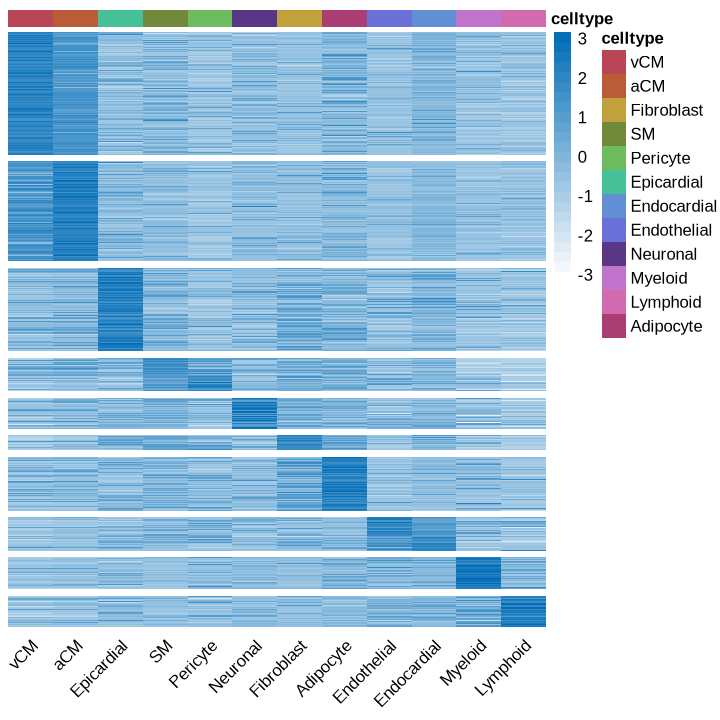

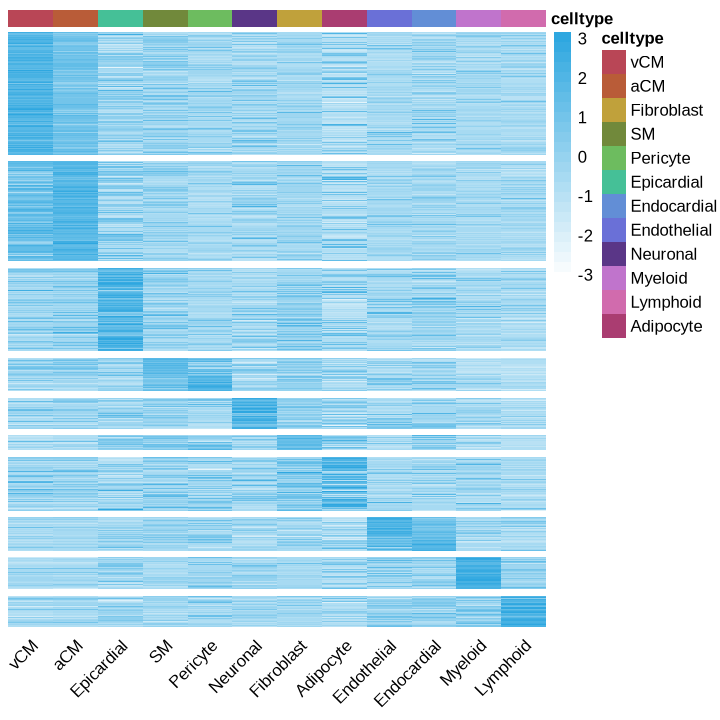

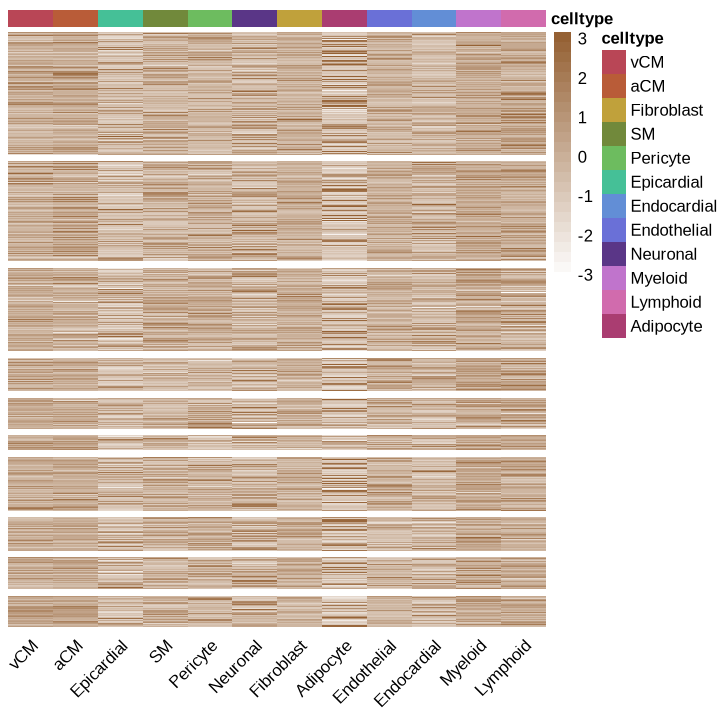

In [1313]:
atac <- read.table("../reference/ATAC_celltype.cpm.txt")
k27ac <- read.csv("FNIH_Heart_signal/FNIH_Heart_pool.H3K27ac.HeartUnionPeak.cpm.csv", row.names = 1)
k27me3 <- read.csv("FNIH_Heart_signal/FNIH_Heart_pool.H3K27me3.HeartUnionPeak.cpm.csv", row.names = 1)

rmat <- atac[sub(":", "-", as.character(ctp$peaks)), corder]
max_indices <- max.col(rmat)
permutation_vector <- order(max_indices)
smat <- rmat #[permutation_vector, ]

smat[smat > 32] <- 32
canno <- data.frame(colnames(atac)) %>% setNames("celltype")
rownames(canno) <- canno$celltype
ccolor <- list(celltype = c(celltype_colors))

gaprow <- cumsum(table(ctp$celltype))
gaprow$SM <- NULL
gaprow$Endothelial <- NULL

options(repr.plot.width = 6, repr.plot.height = 6)
t1 <- log2(smat + 1) %>%
pheatmap(scale = "row",cluster_rows = F, cluster_cols = F, angle_col = 45, gaps_row = unlist(gaprow),
         show_rownames = F, annotation_colors = ccolor, #annotation_row = ranno, 
         annotation_col = canno,
         border_color = NA, color = colorRampPalette(c("white", "#036EB8"))(25))

smat1 <- log2(k27ac[sub("-", ":", rownames(smat)), colnames(smat)] + 1)
smat1[smat1 > 5] <- 5
t2 <- smat1 %>%
pheatmap(scale = "row",cluster_rows = F, cluster_cols = F, angle_col = 45, gaps_row = unlist(gaprow),
         show_rownames = F, annotation_colors = ccolor, #annotation_row = ranno, 
         annotation_col = canno,
         border_color = NA, color = colorRampPalette(c("white", "#2EA7E0"))(25))

smat2 <- log2(k27me3[sub("-", ":", rownames(smat)), colnames(smat)] + 1)
smat2[smat2 > 2] <- 2
t3 <- smat2 %>%
pheatmap(scale = "row",cluster_rows = F, cluster_cols = F, angle_col = 45, gaps_row = unlist(gaprow),
         show_rownames = F, annotation_colors = ccolor, #annotation_row = ranno, 
         annotation_col = canno,
         border_color = NA, color = colorRampPalette(c("white", "#956134"))(25))

In [1316]:
ggsave(t1, filename = "plot/FIG_ctsATACpeak_ATAC_CPM_rownorm.pdf", dpi = 150, height = 8, width = 5)
ggsave(t2, filename = "plot/FIG_ctsATACpeak_K27ac_CPM_rownorm.pdf", dpi = 150, height = 8, width = 5)
ggsave(t3, filename = "plot/FIG_ctsATACpeak_K27me3_CPM_rownorm.pdf", dpi = 150, height = 8, width = 5)

In [631]:
### chromhmm?
chmm <- read.table("chromhmm/celltype/annotate/Heart_UnionPeak_by_celltype.xls", row.names = 1, header = T)
smodule <- list() 
for (f in unique(ctp$celltype)){
    qpeak <- ctp %>% filter(celltype == f) %>% dplyr::select(peaks) %>% unlist %>% as.character()
    smodule[[paste0(f)]] <- chmm[qpeak,] %>% 
    tibble::rownames_to_column("peak") %>%
    reshape2::melt(id.vars = 'peak') %>%
    dplyr::select(variable, value) %>% table %>%
    as.data.frame %>% mutate(module = f)
}

smodule <- do.call(rbind, smodule)

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


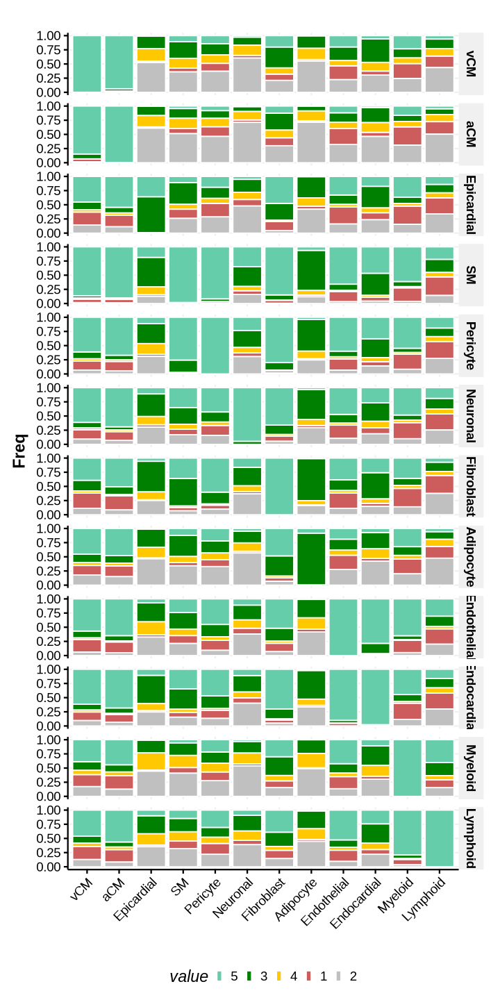

In [55]:
options(repr.plot.width = 6, repr.plot.height = 12)
t1 <- smodule %>%
mutate(variable = factor(as.character(variable), levels = corder)) %>% #arrange(variable) %>%
mutate(module = factor(as.character(module), levels = corder)) %>%
mutate(value = factor(as.integer(value), levels = c(5,3,4,1,2))) %>%
ggplot(aes(x = variable, y = Freq, fill = value)) + 
geom_col(position = "fill", color = "white") + 
theme_Publication() + xlab("") + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + 
scale_fill_manual(values = c('#66cdaa', "#008000", "#ffc800","#cd5c5c","#c0c0c0")) + 
facet_grid(module ~ .)
t1

# ggsave(t1, filename = "plot/FIG_celltype_module_statse.pdf", dpi = 150, height = 12, width = 6)

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


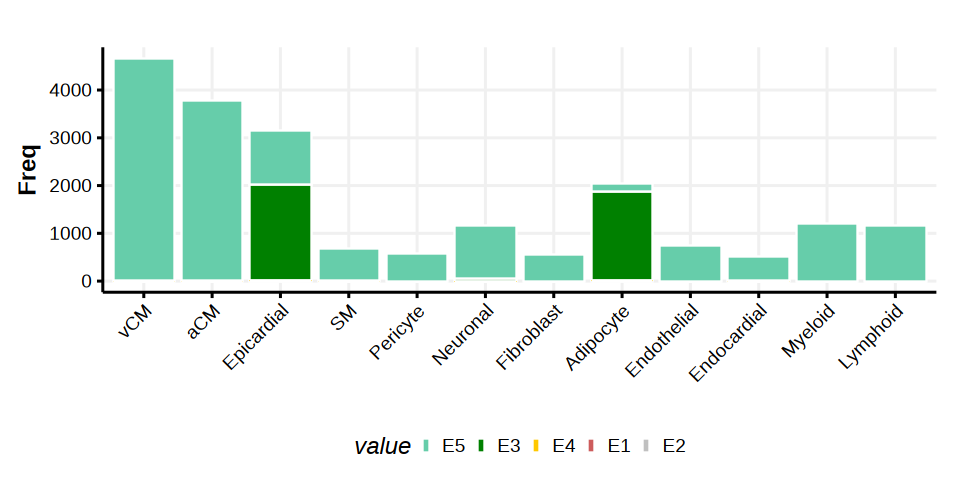

In [632]:
options(repr.plot.width = 8, repr.plot.height = 4)
t1 <- smodule %>%
filter(variable == module) %>%
mutate(variable = factor(as.character(variable), levels = corder)) %>% #arrange(variable) %>%
mutate(value = factor(as.character(value), levels = paste0("E", c(5,3,4,1,2)))) %>%
ggplot(aes(x = variable, y = Freq, fill = value)) + 
geom_col(position = "fill", color = "white") + theme_Publication() + 
# coord_polar(theta = "y") + theme_void() +
xlab("") + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + 
scale_fill_manual(values = c('#66cdaa', "#008000", "#ffc800","#cd5c5c","#c0c0c0")) # + facet_grid(variable ~ .)

t1

ggsave(t1, filename = "plot/FIG_celltype_module_statse.pdf", dpi = 150, height = 4, width = 8)

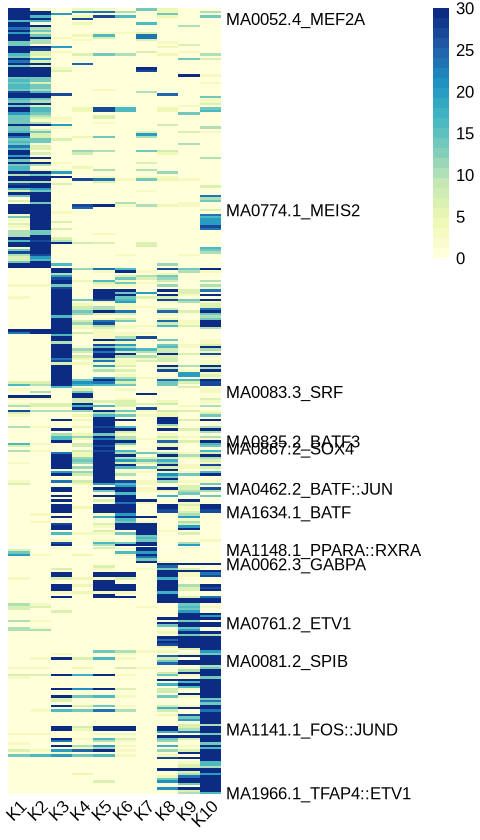

In [334]:
### cts motif
motif <- read.csv(paste0("motif/cts_cCRE_motif_LT_250130.txt"), sep = "\t") %>%
setNames(c('motif', 'Consensus', 'p_value', 'Log_Pvalue', 'fdr', "target_num", "target_pct", "bgd_num", "bgd_pct", 
           'FoldEnrichment','celltype','Motif_ID','ID','group','x_labels'))

vmotif <- motif %>% group_by(motif) %>% 
filter(min(fdr) < 0.05) %>% ungroup() %>%
select(motif) %>% unlist %>% unique

motif <- motif %>%
filter(motif %in% vmotif) %>%
reshape2::dcast(group ~ motif, value.var = "p_value", fun.aggregate = mean) %>%
tibble::column_to_rownames("group") %>% t
motif[is.na(motif)] <- 1
motif <- -log2(motif)
motif[motif > 30] <- 30

rmat <- motif[, paste0("K", 1:10)]
max_indices <- max.col(rmat)
permutation_vector <- order(max_indices)
smat <- rmat[permutation_vector, ]

### Only label max score
llabel <- c("MEF2A", "MEIS2", "PPARA", "SRF", "SOX4", 
            "BATF", "FOS::JUND", "GABPA", "SPIB", "ETV1")
llabel <- grep(paste0(llabel, collapse = "|"), rownames(smat), value = T)
labs.row <- rownames(smat)
labs.row[!(labs.row %in% llabel)] <- ""

t1 <- smat %>%
pheatmap(scale = "none", cluster_rows = F, cluster_cols = F, angle_col = 45, border_color = "black",
         show_rownames = T, labels_row = labs.row,
         color = colorRampPalette(brewer.pal(n = 8, name = "YlGnBu"))(25))

# ggsave(t1, filename = "plot/FIG_ABC_ctsATACpeak_motif_heatmap.pdf", dpi = 300, height = 20, width = 8)

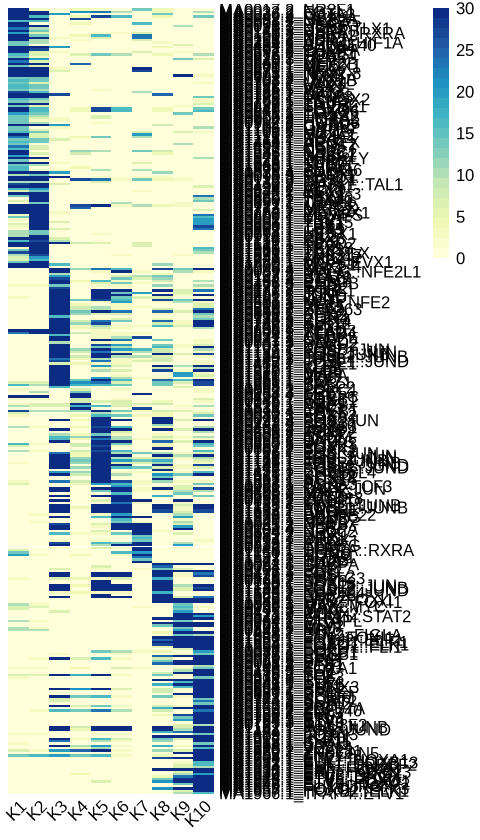

In [335]:
t1 <- smat %>%
pheatmap(scale = "none", cluster_rows = F, cluster_cols = F, angle_col = 45, border_color = "black",
         show_rownames = T,
         color = colorRampPalette(brewer.pal(n = 8, name = "YlGnBu"))(25))

ggsave(t1, filename = "plot/FIG_ABC_ctsATACpeak_motif_heatmap.pdf", dpi = 300, height = 25, width = 10)

## Cell type specific ABC links

In [12]:
abc <- read.table("../../87.FNIH_DHC_IGM_240925/05.R/abc/FNIH_heart_celltype_abc_links.txt", header = T)
dim(abc)

[1] 121473     13

In [15]:
distinct(abc[,c(4,10)]) %>% dim

[1] 66317     2

In [62]:
### Celltype specific links: those overlap celltype specific elements
abc_unique <- merge(abc[,c("range", "TargetGene", "CellType")], cts[cts$peaks %in% ctp$peaks,], by.x = "range", by.y = "peaks") %>%
filter(CellType == celltype) %>%
mutate(CellType = factor(CellType, levels = corder)) %>%
arrange(CellType) %>% distinct

nrow(abc_unique)
nrow(distinct(abc_unique[,1:2]))

[1] 11936

[1] 11936

In [69]:
head(abc_unique)
# write.table(tmp, "../../87.FNIH_DHC_IGM_240925/05.R/abc/celltype/FNIH_Heart.celltype_specific_abclinks_w_score.txt", 
#             sep = "\t", quote = F, row.names = F, col.names = T)

,range,TargetGene,CellType,celltype
,<chr>,<chr>,<fct>,<chr>
1,chr1:100187977-100188277,LRRC39,vCM,vCM
2,chr1:100188571-100188871,LRRC39,vCM,vCM
3,chr1:100188571-100188871,AC104506.1,vCM,vCM
4,chr1:100188571-100188871,RNPC3,vCM,vCM
5,chr1:10818629-10818929,CASZ1,vCM,vCM
6,chr1:109761121-109761421,AHCYL1,vCM,vCM


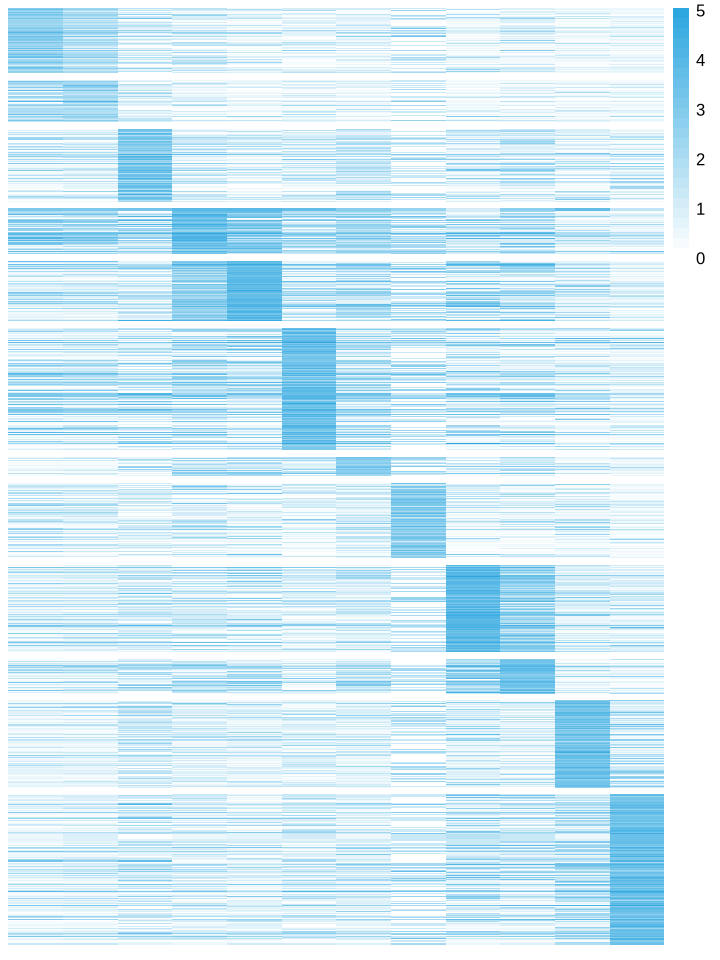

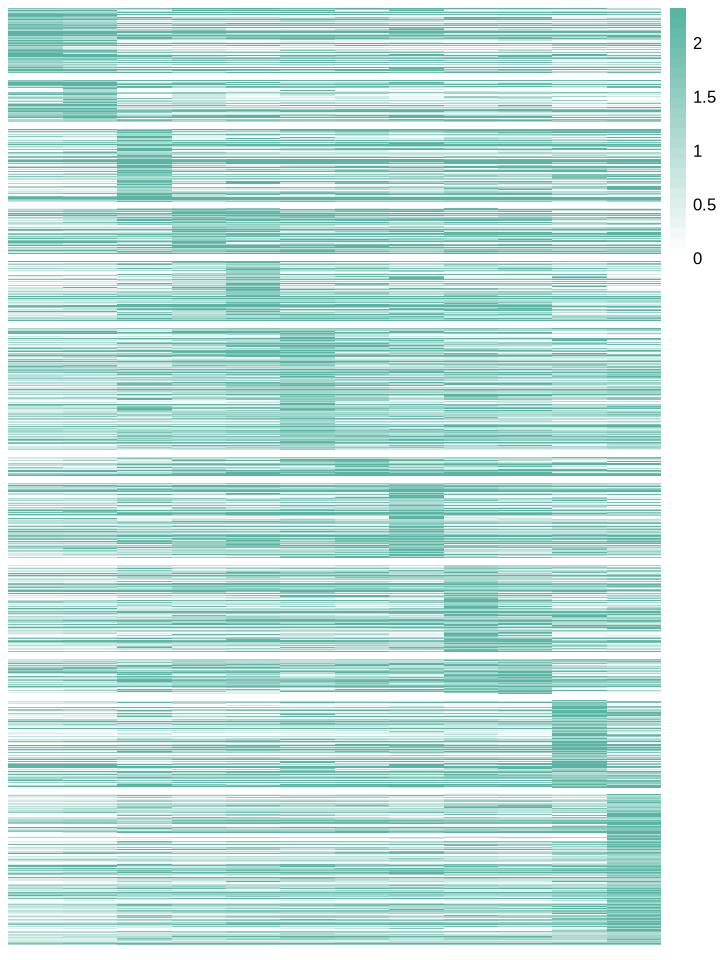

In [67]:
options(repr.plot.width = 6, repr.plot.height = 8)
smat <- k27ac[abc_unique$range, corder]
smat[smat > 32] <- 32
t1 <- log2(smat + 1) %>%
pheatmap(cluster_rows = F, cluster_cols = F, border_color = NA, 
         gaps_row = cumsum(table(abc_unique$CellType)),
         scale = "none", angle_col = 45, 
         show_rownames = F, show_colnames = F,
         color = colorRampPalette(c("white", "#2EA7E0"))(25))

ssmat <- rpkm[abc_unique$TargetGene, corder]
ssmat[ssmat > 4] <- 4
t2 <- log2(ssmat + 1) %>%
pheatmap(cluster_rows = F, cluster_cols = F, border_color = NA,
         gaps_row = cumsum(table(abc_unique$CellType)),
         scale = "none", angle_col = 45, 
         show_rownames = F, show_colnames = F,
         color = colorRampPalette(c("white", "#59b4a2"))(25))

In [73]:
ggsave(t1, filename = "plot/FIG_ABC_ctsATACpeak_K27ac_CPM.pdf", dpi = 150, height = 6, width = 4)
ggsave(t2, filename = "plot/FIG_ABC_ctsATACpeak_targetGene_RPKM.pdf", dpi = 150, height = 6, width = 4)

In [71]:
ppp <- abc %>% filter(range %in% unique(abc_unique$range)) %>%
mutate(CellType = factor(CellType, levels = corder)) %>%
arrange(CellType) %>%
select(c(range, TargetGene, CellType))

write.table(ppp, "../../87.FNIH_DHC_IGM_240925/05.R/abc/celltype/FNIH_Heart.celltype_specific_abclinks.txt", 
            sep = "\t", quote = F, row.names = F, col.names = T)

In [205]:
### color celltype links
hg38 <- read.table("/projects//ps-renlab/y2xie/projects/genome_ref/refdata-cellranger-arc-GRCh38-2020-A-2.0.0/regions/tss_1500bp.bed")
ppp <- read.table("../../87.FNIH_DHC_IGM_240925/05.R/abc/celltype/FNIH_Heart.celltype_specific_abclinks.txt", header = T)
# ppp[,c('chrom', 'start', 'end')] <- stringr::str_split_fixed(ppp$range, pattern = "[-:]", n = 3)
qpair <- merge(ppp, hg38, by.x = "TargetGene", by.y = "V7") %>%
select(c(chrom, start, end, V1, V2, V3, CellType)) %>%
distinct
qpair <- qpair %>% 
setNames(c('chr1', 'x1', 'x2', 'chrom2', 'start2', 'end2', 'name')) %>%
mutate(score = 1000, strand1 = '*', strand2 = '*')
ccolor <- lapply(celltype_colors, function(x) paste(as.vector(col2rgb(x)),collapse = ",")) %>%
as.data.frame %>% t %>% as.data.frame %>% setNames("color")

qpair <- merge(qpair, ccolor, by.x = 'name', by.y = 0)
write.table(qpair[,c('chr1', 'x1', 'x2', 'chrom2', 'start2', 'end2', 'name', 'color')], 
            "../../87.FNIH_DHC_IGM_240925/05.R/abc/celltype_specific_links.bedpe", sep = "\t", quote = F, row.names = F, col.names = T)

In [112]:
dim(abc_unique)
distinct(abc_unique[,1:2]) %>% dim
unique(abc_unique$range) %>% length
unique(abc_unique$TargetGene) %>% length

[1] 11936     4

[1] 11936     2

[1] 5192

[1] 6154

In [686]:
# calculate APA on unique links
tmp <- abc[abc$range %in% abc_unique$range, ]
for (f in unique(abc$CellType)){
    write.table(tmp[tmp$CellType == f, c("chr","start.x","end.x","chrom.x","start.y","end.y")],
               paste0("../../87.FNIH_DHC_IGM_240925/05.R/abc/celltype/output/APA/", f, ".peaks"), 
               sep = "\t", quote = F, row.names = F, col.names = F)
}

In [697]:
# Read APA
plist <- list()
for (file in list.files("../../87.FNIH_DHC_IGM_240925/05.R/abc/celltype/output/APA/", pattern = ".peaks$")){
    f <- gsub(".peaks", "", file)
    for (ffile in list.files(paste0("../../87.FNIH_DHC_IGM_240925/05.R/abc/celltype/output/APA/", f))){
        tmp <- read.csv(paste0("../../87.FNIH_DHC_IGM_240925/05.R/abc/celltype/output/APA/", f, "/", ffile, "/10000/gw/APA.txt"), header = F)
        tmp$V1 <- gsub("\\[", "", tmp$V1) %>% as.numeric
        tmp$V21 <- gsub("\\]", "", tmp$V21) %>% as.numeric
        plist[[ffile]] <- tmp
    }
}

porder <- list()
i = 1
for (f in corder){
    porder[[i]] <- paste0(f, "_", corder)
    i = i + 1
}
porder <- unlist(porder)

In [728]:
pplist <- list()
for (i in 1:length(porder)){
    ttt <- porder[i]
    name <- stringr::str_split_fixed(ttt, pattern = "_", n = 2)
    pplist[[i]] <- plist[[ttt]] %>% mutate(id = colnames(.)) %>%
    reshape2::melt() %>% 
    mutate(id = as.integer(gsub("V", "", id))) %>% arrange(id) %>% 
    mutate(variable = as.integer(gsub("V", "", variable))) %>% arrange(variable) %>% 
    ggplot(aes(x = -id, y = variable, fill = value)) + 
    geom_tile() + NoLegend() + 
    xlab(name[1]) + ylab(name[2]) + 
    theme_void() + 
    scale_fill_gradientn(colours = c("white", "red"), breaks = c(0, 0.1))
}

fig1 <- cowplot::plot_grid(plotlist = pplist, ncol = 12)
ggsave(fig1, filename = "plot/FIG_ABC_ctsATACpeak_pairs_impute10k_APA.pdf", dpi = 300, height = 8, width = 8)

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as 

In [171]:
### Only plot score?
plist <- list()
for (file in list.files("../../87.FNIH_DHC_IGM_240925/05.R/abc/celltype/output/APA/", pattern = ".peaks$")){
    f <- gsub(".peaks", "", file)
    for (ffile in list.files(paste0("../../87.FNIH_DHC_IGM_240925/05.R/abc/celltype/output/APA/", f))){
        tmp <- read.csv(paste0("../../87.FNIH_DHC_IGM_240925/05.R/abc/celltype/output/APA/", f, "/", ffile, "/10000/gw/measures.txt"), header = F, sep = "\t") %>%
        mutate(condition = ffile)
        plist[[ffile]] <- tmp
    }
}
plist <- do.call(rbind,plist)
plist[,c("loop", "peak")] <- stringr::str_split_fixed(plist$condition, pattern = "_", n = 2)
plist <- plist %>%
filter(V1 == "P2LL") %>%
select(c(V2, loop, peak)) %>%
reshape2::dcast(loop ~ peak, value.var = "V2") %>%
tibble::column_to_rownames("loop")

fig1 <- plist[corder, corder] %>% 
tibble::rownames_to_column('id') %>%
reshape2::melt() %>%
mutate(group = ifelse(id == variable, "hit", "nonhit")) %>%
ggplot(aes(x = group, y = value)) + 
geom_boxplot(width = 0.5, coef = 2, outlier.shape = NA, position = position_dodge(width = 0.7)) +
geom_jitter(width = 0.2, color = "grey", alpha = 0.5, ) + 
ylab("APA") + xlab('') + 
theme_Publication()

ggsave(fig1, filename = "plot/FIG_ABC_ctsATACpeak_pairs_impute10k_APA_score_boxplot.pdf", 
       dpi = 300, height = 6, width = 4)

Using id as id variables

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


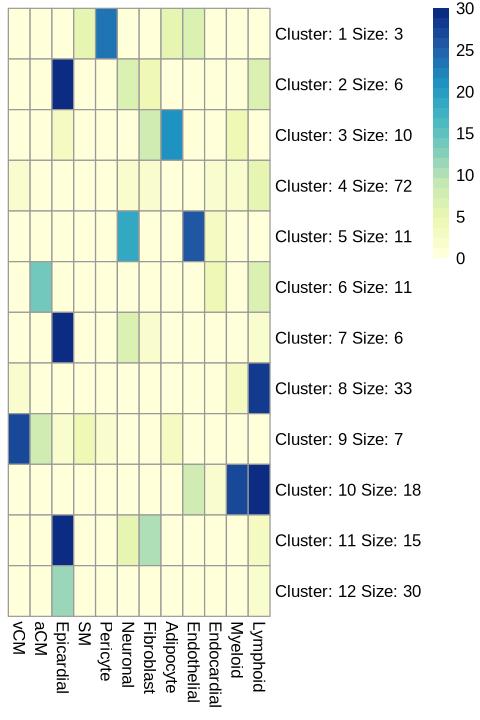

In [303]:
### Read motif from Luca
motif <- list()
for (f in corder){
    motif[[f]] <- read.csv(paste0("../../87.FNIH_DHC_IGM_240925/05.R/abc/CellTypeSpecific_Enhancer_Motifs/knownResults_", f, ".txt"), sep = "\t", row.names = 1) %>%
    setNames(c("consensus", "p_value", "log_p_value", "fdr", "tgt_num", "tgt_pct", "bgd_num", "bgd_pct")) %>%
    tibble::rownames_to_column("motif") %>% mutate(celltype = f)
}
vmotif <- do.call(rbind, motif) %>% group_by(motif) %>% 
filter(min(fdr) < 0.05) %>% ungroup() %>%
select(motif) %>% unlist %>% unique

motif <- do.call(rbind, motif) %>%
filter(motif %in% vmotif) %>%
reshape2::dcast(celltype ~ motif, value.var = "p_value") %>%
tibble::column_to_rownames("celltype") %>% t
motif[is.na(motif)] <- 1
motif <- -log2(motif)
motif[motif > 30] <- 30

rmat <- motif[, corder]
max_indices <- max.col(rmat)
permutation_vector <- order(max_indices)
smat <- rmat[permutation_vector, ]

rmat <- motif[, corder]
max_indices <- max.col(rmat)
permutation_vector <- order(max_indices)
smat <- rmat[permutation_vector, ]

set.seed(921)
f1 <- smat %>%
pheatmap(scale = "none", cluster_rows = F, cluster_cols = F, kmeans_k = length(corder), 
         color = colorRampPalette(brewer.pal(n = 8, name = "YlGnBu"))(25))

In [304]:
rorder <- f1$kmeans$cluster %>% as.data.frame %>% setNames("cluster") %>%
mutate(cluster = factor(cluster, levels = c(9,1,5,2,7,12,11,4,8,3,6,10))) %>%
arrange(cluster)

ttp <- smat[rownames(rorder),] %>% t %>% as.data.frame %>% 
tibble::rownames_to_column("celltype") %>%
reshape2::melt() %>%
mutate(celltype = factor(celltype, levels = rev(corder))) %>%
mutate(variable = factor(variable, levels = rownames(rorder)))

vltp <- table(rorder$cluster) %>%
as.data.frame %>%
select(Freq) %>% unlist %>% cumsum

Using celltype as id variables



Adding missing grouping variables: `cluster`


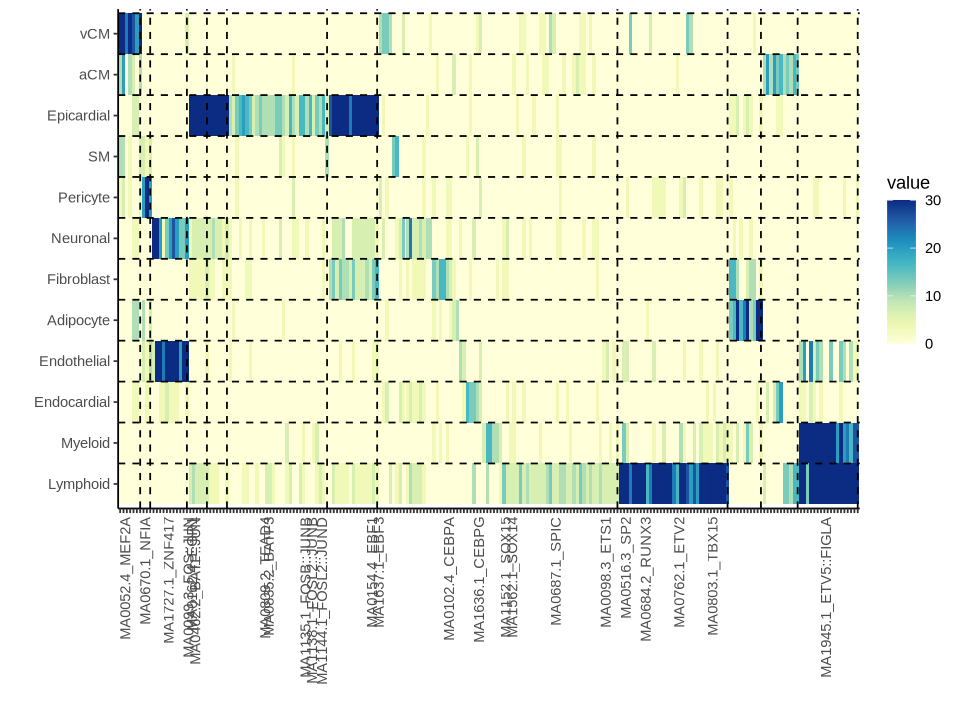

In [305]:
### Only label max score
# llabel <- c("MEF2C", "MEF2D", "KLF1", "KLF10", "GATA6", "TBX4", "NFIA", "TWIST1", 
#             "NFIL3", "SPIC", "EHF", "SOX18", "FOSL1", "FOS", "SPIB", 
#             "IKZF1", "ERF", "GABPA", "SOX9", "SOX15", "ETV1")
# llabel <- grep(paste0(llabel, collapse = "|"), rownames(smat), value = T)
llabel <- f1$kmeans$cluster %>% as.data.frame %>% setNames("cluster") %>%
tibble::rownames_to_column("motif") %>%
group_by(cluster) %>%
slice_sample(n = 2) %>% select(motif) %>% unlist

labs.row <- rownames(smat)
labs.row[!(labs.row %in% llabel)] <- ""

options(repr.plot.width = 8, repr.plot.height = 6)

t1 <- ttp %>%
ggplot(aes(x = variable, y = celltype, fill = value)) + 
geom_tile() + ylab("") + xlab("") + 
geom_hline(yintercept = seq(1.5, length(unique(ttp$celltype)) + 0.5, by = 1),  # Add lines between rows
           linetype = "dashed", color = "black") +
geom_vline(xintercept = vltp, linetype = "dashed", color = "black") +
theme_classic() + 
scale_x_discrete(labels = labs.row) + 
theme(axis.text.x = element_text(angle = 90, hjust = 1)) + 
scale_fill_gradientn(colours = colorRampPalette(brewer.pal(n = 8, name = "YlGnBu"))(25))

t1

ggsave(t1, filename = "plot/FIG_ABC_ctsATACpeak_pairs_motif_heatmap.pdf", dpi = 300, height = 6, width = 10)
write.table(t1$data, "plot/FIG_ABC_ctsATACpeak_pairs_motif_heatmap.txt", sep = "\t", quote = F,
           row.names = T, col.names = T)

In [107]:
smat[rownames(rorder),] %>% dim

[1] 222  12

In [105]:
t1 <- ttp %>%
ggplot(aes(x = variable, y = celltype, fill = value)) + 
geom_tile() + ylab("") + xlab("") + 
geom_hline(yintercept = seq(1.5, length(unique(ttp$celltype)) + 0.5, by = 1),  # Add lines between rows
           linetype = "dashed", color = "black") +
geom_vline(xintercept = vltp, linetype = "dashed", color = "black") +
theme_classic() + 
theme(axis.text.x = element_text(angle = 90, hjust = 1)) + 
scale_fill_gradientn(colours = colorRampPalette(brewer.pal(n = 8, name = "YlGnBu"))(25))

ggsave(t1, filename = "plot/FIG_ABC_ctsATACpeak_pairs_motif_heatmap_all.pdf", dpi = 300, height = 8, width = 20)

In [ ]:
# Read pathway from Luca
suppressPackageStartupMessages(library(data.table))

pw <- list()
for (f in colnames(atac)){
    file_path <- paste0("../../87.FNIH_DHC_IGM_240925/05.R/abc/CellTypeSpecific_TargetGenes/GSEA_Results/", f, "_overlap.tsv")
    line_number <- grep("Gene/Gene Set Overlap Matrix", readLines(file_path), fixed = TRUE)[1]
    pw[[f]] <- fread(file_path, skip = 9, nrows = line_number-13, sep = "\t", header = T) %>%
    filter(`FDR q-value` < 0.05 & `# Genes in Gene Set (K)` <= 500) %>%
    slice_min(order_by = `FDR q-value`, n = 10) %>% mutate(celltype = f)
}
pw <- do.call(rbind, pw)

In [171]:
suppressPackageStartupMessages(library(ggtext))
pdata <- pw %>% filter(-log10(`p-value`) <= 25) %>% group_by(celltype) %>% 
slice_min(order_by = `FDR q-value`, n = 2) %>%
ungroup %>%
mutate(Term = gsub("^[^_]*_", "", `Gene Set Name`)) %>%
mutate(Term = gsub("_", " ", Term)) %>%
mutate(database = gsub("([^_]+)_.*", "\\1", `Gene Set Name`)) %>%
mutate(celltype = factor(celltype, levels = corder)) %>% arrange(celltype)

pdata$color <- '#66C2A5'
pdata[pdata$database == "REACTOME",]$color <- '#FC8D62'
pdata[pdata$database == "KEGG",]$color <- '#8DA0CB'

pdata$Termw <- paste0("<span style=\"color: ", pdata$color, "\">", pdata$Term, "</span>")
pdata <- pdata %>% mutate(Termw = paste0(celltype, " ", database, " ", Term))
t1 <- pdata %>%
mutate(Termw = factor(Termw, levels = rev(unique(pdata$Termw)))) %>%
arrange((Termw)) %>%
ggplot(aes(y = Termw, x = -log10(`p-value`))) + 
geom_point(aes(size = `k/K`)) + 
theme_classic() + xlim(c(5, 20)) + ylab("") + 
scale_y_discrete(labels = label_wrap(30))
options(repr.plot.width = 10, repr.plot.height = 9)

ggsave(t1, filename = "plot/FIG_ABC_ctsATACpeak_pairs_pathway.pdf", dpi = 300, height = 8, width = 6)

## DE genes in disease

Using celltype as id variables

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


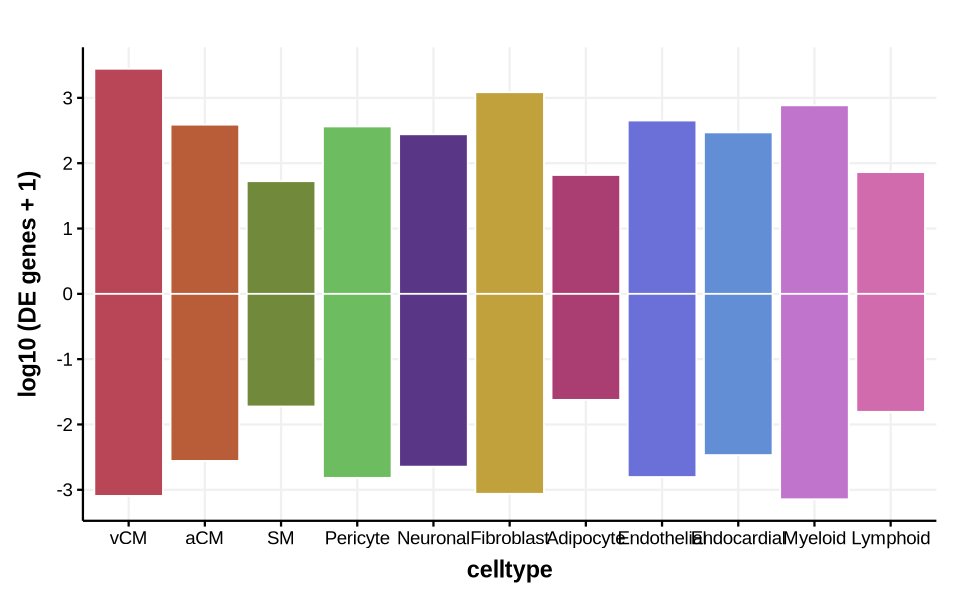

In [33]:
genede <- read.table("../reference/Multiome_Downstream/CHAMBER/4chambers_DESEQ2_RNA.dds.res", header = T) %>%
filter(RNA_Padj < 0.05) %>%
setNames(c("celltype", "contrast", "gene", "log2FoldChange", "stat", "pvalue", "padj"))

options(repr.plot.width = 8, repr.plot.height = 5)
t1 <- genede %>%
group_by(celltype) %>%
summarise(up_padj = log10(sum(log2FoldChange >= 0.5)+1), down_padj = -log10(sum(log2FoldChange <= -0.5)+1)) %>%
ungroup %>%
select(c(celltype, up_padj, down_padj)) %>%
reshape2::melt() %>% mutate(celltype = factor(celltype, levels = corder)) %>%
ggplot(aes(x = celltype, y = value, fill = celltype)) + 
geom_col(position = "dodge", color = "white") + 
theme_Publication() + ylab("log10 (DE genes + 1)") + 
scale_y_continuous(breaks = seq(-4, 4,1)) + 
scale_fill_manual(values = celltype_colors) + NoLegend()

t1
# ggsave(t1, filename = "plot/FIG_RNA_DEgene_by_celltype.pdf", dpi = 300, height = 4, width = 6)

Using celltype as id variables

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


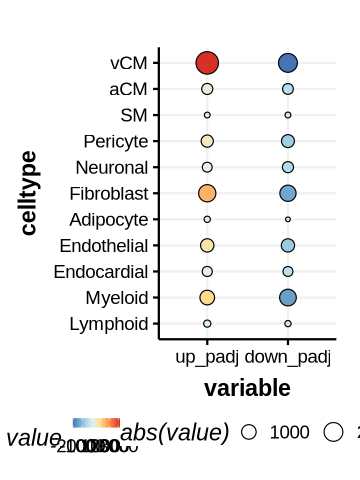

In [409]:
options(repr.plot.width = 3, repr.plot.height = 4)
t1 <- genede %>%
group_by(celltype) %>%
summarise(up_padj = (sum(log2FoldChange > 0)), down_padj = -(sum(log2FoldChange < -0))) %>%
ungroup %>%
dplyr::select(c(celltype, up_padj, down_padj)) %>%
reshape2::melt() %>% mutate(celltype = factor(celltype, levels = rev(corder))) %>%
ggplot(aes(x = variable, y = celltype, size = abs(value), fill = value)) + 
geom_point(color = "black", stroke = 0.5, shape = 21) + 
theme_Publication() + 
scale_fill_gradientn(colours = rev(colorRampPalette(brewer.pal(n = 8, name = "RdYlBu"))(20)))

t1

ggsave(t1, filename = "plot/FIG_GEX_DEgenes_by_celltype_dot.pdf", dpi = 300, height = 4, width = 3)

In [485]:
genede %>% filter(log2FoldChange >= 0) %>% dplyr::select(celltype) %>% table
genede %>% filter(log2FoldChange <= 0) %>% dplyr::select(celltype) %>% table


celltype
        aCM   Adipocyte Endocardial Endothelial  Fibroblast    Lymphoid 
        443          65         320         780        1603         100 
    Myeloid    Neuronal    Pericyte          SM         vCM 
       1021         296         597          52        3184 

celltype
        aCM   Adipocyte Endocardial Endothelial  Fibroblast    Lymphoid 
        399          41         300         767        1358          64 
    Myeloid    Neuronal    Pericyte          SM         vCM 
       1469         445         713          54        2031 

In [483]:
### GO terms of targeted genes
clist11 <- clist22 <- list()
for (f in unique(genede$celltype)){
    qgene <- genede %>% filter(celltype == f) %>% filter(log2FoldChange > 0.5) %>% dplyr::select(gene) %>% unlist
    qtable <- enrichGO(gene = qgene,
                OrgDb = org.Hs.eg.db,
                keyType = 'SYMBOL',
                ont = "BP", # biological process
                pAdjustMethod = "BH", 
                pvalueCutoff = 0.05, 
                qvalueCutoff = 0.05, 
                readable = TRUE)
    clist11[[f]] <- qtable@result %>% filter(p.adjust < 0.05) %>% mutate(celltype = f, group = "up")
    
    qgene <- genede %>% filter(celltype == f) %>% filter(log2FoldChange < -0.5) %>% dplyr::select(gene) %>% unlist
    qtable <- enrichGO(gene = qgene,
                OrgDb = org.Hs.eg.db,
                keyType = 'SYMBOL',
                ont = "BP", # biological process
                pAdjustMethod = "BH", 
                pvalueCutoff = 0.05, 
                qvalueCutoff = 0.05, 
                readable = TRUE)
    clist22[[f]] <- qtable@result %>% filter(p.adjust < 0.05) %>% mutate(celltype = f, group = "down")
}

lapply(clist11, nrow) %>% as.data.frame
lapply(clist22, nrow) %>% as.data.frame

aCM,Adipocyte,Endocardial,Endothelial,Fibroblast,Lymphoid,Myeloid,Neuronal,Pericyte,SM,vCM
<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
0,0,213,0,130,36,32,57,5,0,461


aCM,Adipocyte,Endocardial,Endothelial,Fibroblast,Lymphoid,Myeloid,Neuronal,Pericyte,SM,vCM
<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
209,99,122,167,320,0,504,143,367,3,95


In [488]:
### GO terms of targeted genes
clist1 <- clist2 <- list()
for (f in unique(genede$celltype)){
#     print(f)
    qgene <- genede %>% filter(celltype == f) %>% filter(log2FoldChange > 0) %>% dplyr::select(gene) %>% unlist
    qtable <- enrichGO(gene = qgene,
                OrgDb = org.Hs.eg.db,
                keyType = 'SYMBOL',
                ont = "BP", # biological process
                pAdjustMethod = "BH", 
                pvalueCutoff = 0.05, 
                qvalueCutoff = 0.05, 
                readable = TRUE)
    clist1[[f]] <- qtable@result %>% mutate(celltype = f, group = "up")
#     qtable <- enrichr(unique(qgene), dbs)
#     clist1[[f]] <- qtable[[1]] %>% filter(Adjusted.P.value < 0.05) %>% mutate(celltype = f, group = "up")
    
    qgene <- genede %>% filter(celltype == f) %>% filter(log2FoldChange < 0) %>% dplyr::select(gene) %>% unlist
    qtable <- enrichGO(gene = qgene,
                OrgDb = org.Hs.eg.db,
                keyType = 'SYMBOL',
                ont = "BP", # biological process
                pAdjustMethod = "BH", 
                pvalueCutoff = 0.05, 
                qvalueCutoff = 0.05, 
                readable = TRUE)
    clist2[[f]] <- qtable@result %>% mutate(celltype = f, group = "down")
#     qtable <- enrichr(unique(qgene), dbs)
#     clist2[[f]] <- qtable[[1]] %>% filter(Adjusted.P.value < 0.05) %>% mutate(celltype = f, group = "down")
}

lapply(clist1, nrow) %>% as.data.frame
lapply(clist2, nrow) %>% as.data.frame

aCM,Adipocyte,Endocardial,Endothelial,Fibroblast,Lymphoid,Myeloid,Neuronal,Pericyte,SM,vCM
<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
3431,1473,3872,4687,5326,1985,4559,3223,4353,1634,5884


aCM,Adipocyte,Endocardial,Endothelial,Fibroblast,Lymphoid,Myeloid,Neuronal,Pericyte,SM,vCM
<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
3671,1176,2510,4300,5470,1273,5418,3935,4920,1011,5763


In [489]:
tmp1 <- do.call(rbind, clist1)
tmp2 <- do.call(rbind, clist2)

tmp1 %>% filter(p.adjust < 0.05) %>% dplyr::select(celltype) %>% table
tmp2 %>% filter(p.adjust < 0.05) %>% dplyr::select(celltype) %>% table

celltype
Endocardial Endothelial  Fibroblast    Lymphoid     Myeloid    Neuronal 
        249          22         132          56          23          46 
   Pericyte         vCM 
         38         292 

celltype
        aCM   Adipocyte Endocardial Endothelial  Fibroblast     Myeloid 
        175          99         116         177         309         499 
   Neuronal    Pericyte          SM         vCM 
        135         347           3          96 

In [412]:
write.table(tmp1, "GENE_DE_up_enrichGO_log2FC0_results.tsv", row.names = T, col.names = T, sep = "\t", quote = F)
write.table(tmp2, "GENE_DE_down_enrichGO_log2FC0_results.tsv", row.names = T, col.names = T, sep = "\t", quote = F)

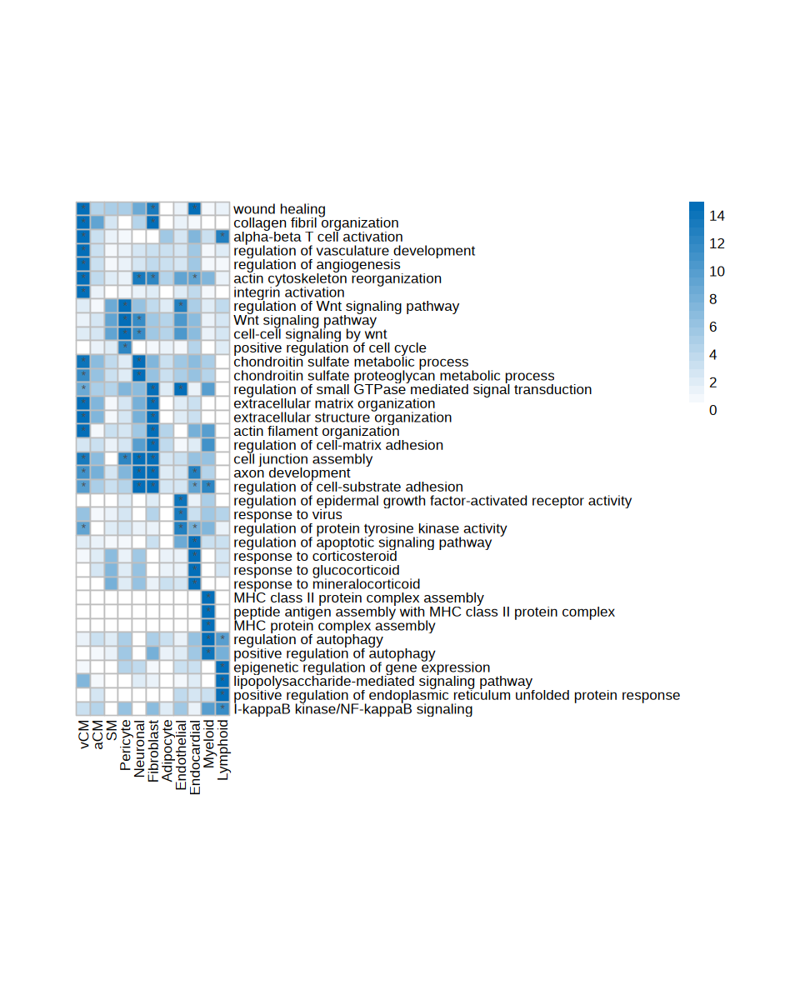

In [510]:
### Load GO term from Elie for plotting
term1 <- read.table("DEgene_up_enrichGO_term_EF.txt", sep = "\t")
tmp <- tmp1 %>% 
reshape2::dcast(Description ~ celltype, value.var = "pvalue", fun.aggregate = mean) %>%
tibble::column_to_rownames("Description")
tmp[is.na(tmp)] <- 1
tmp <- -log2(tmp)

ttp <- tmp[unique(term1$V1), intersect(corder, unique(tmp1$celltype))]
ttp[ttp > 15] <- 15
max_indices <- max.col(ttp)
permutation_vector <- order(max_indices)
smat <- ttp[permutation_vector, ]

lmat <- tmp1 %>% 
mutate(value = p.adjust) %>%
reshape2::dcast(Description ~ celltype, value.var = "value", fun.aggregate = mean) %>%
tibble::column_to_rownames("Description") 

lmat[is.na(lmat)] <- 1
lmat <- ifelse(lmat < 0.05, "*", "")

options(repr.plot.width = 8, repr.plot.height = 10)
t1 <- smat %>%
pheatmap(cluster_cols = F, cluster_rows = F, border_color = "gray", angle_col = 90, cellwidth = 10, cellheight = 10,
         display_numbers = lmat[rownames(smat), colnames(smat)], # breaks = seq(-4,4,0.4),
         color = colorRampPalette(c("white", "#036EB8"))(25))

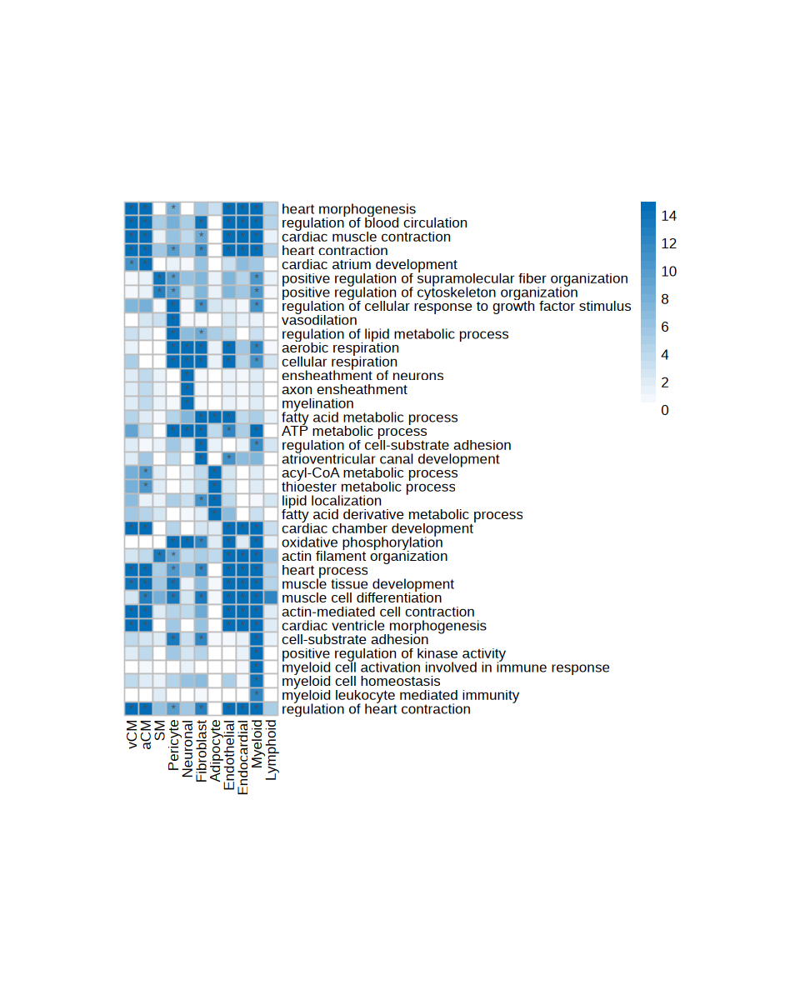

In [517]:
term2 <- read.table("DEgene_down_enrichGO_term_EF.txt", sep = "\t")
tmp <- tmp2 %>% 
reshape2::dcast(Description ~ celltype, value.var = "pvalue", fun.aggregate = mean) %>%
tibble::column_to_rownames("Description")
tmp[is.na(tmp)] <- 1
tmp <- -log2(tmp)

ttp <- tmp[unique(term2$V1), intersect(corder, unique(tmp2$celltype))]
ttp[ttp > 15] <- 15
max_indices <- max.col(ttp)
permutation_vector <- order(max_indices)
smat <- ttp[permutation_vector, ]

lmat <- tmp2 %>% 
mutate(value = p.adjust) %>%
reshape2::dcast(Description ~ celltype, value.var = "value", fun.aggregate = mean) %>%
tibble::column_to_rownames("Description") 

lmat[is.na(lmat)] <- 1
lmat <- ifelse(lmat < 0.05, "*", "")

options(repr.plot.width = 8, repr.plot.height = 10)
t2 <- smat %>%
pheatmap(cluster_cols = F, cluster_rows = F, border_color = "gray", angle_col = 90, cellwidth = 10, cellheight = 10,
         display_numbers = lmat[rownames(smat), colnames(smat)], # breaks = seq(-4,4,0.4),
         color = colorRampPalette(c("white", "#036EB8"))(25))

In [518]:
ggsave(t1, filename = "plot/FIG_RNA_DEgene_up_GO.pdf", dpi = 300, height = 10, width = 8)
ggsave(t2, filename = "plot/FIG_RNA_DEgene_down_GO.pdf", dpi = 300, height = 10, width = 8)

In [229]:
### Use fGSEA to calculate enrichment of TF in HF vs CONTROL
fgsea_results <- list()
for (f in list.files("GRN/scenicplus/")){
    ct <- grep(f, corder, value = T)[1]
    elist <- read.csv(paste0("GRN/scenicplus/", f, "/edges_R2G.csv")) %>% filter(is_extended == "False")
    tfr <- stringr::str_split_fixed(elist$Consensus_name, pattern = "_", n = 3)[,1] %>% unique
    grnlist <- list()
    for (tf in tfr){
        grnlist[[tf]] <- elist %>% filter(Consensus_name == paste0(tf, "_+_+")) %>% dplyr::select(Gene) %>% unlist %>% unique
    }
    ranked_genes <- read.table("../reference/Multiome_Downstream/CHAMBER/4chambers_DESEQ2_RNA.dds.res", header = T) %>%
    setNames(c("celltype", "contrast", "gene", "log2FoldChange", "stat", "pvalue", "padj")) %>% 
    filter(celltype == ct) %>% arrange(desc(stat)) %>% 
    dplyr::select(gene, stat) %>% tibble::deframe()
    
    fgsea_results[[ct]] <- fgsea(pathways = grnlist, stats = ranked_genes, nperm = 10000)
    fgsea_results[[ct]]$celltype <- ct
}

Warning message in fgsea(pathways = grnlist, stats = ranked_genes, nperm = 10000):
“You are trying to run fgseaSimple. It is recommended to use fgseaMultilevel. To run fgseaMultilevel, you need to remove the nperm argument in the fgsea function call.”
Warning message in fgsea(pathways = grnlist, stats = ranked_genes, nperm = 10000):
“You are trying to run fgseaSimple. It is recommended to use fgseaMultilevel. To run fgseaMultilevel, you need to remove the nperm argument in the fgsea function call.”
Warning message in fgsea(pathways = grnlist, stats = ranked_genes, nperm = 10000):
“You are trying to run fgseaSimple. It is recommended to use fgseaMultilevel. To run fgseaMultilevel, you need to remove the nperm argument in the fgsea function call.”
Warning message in fgsea(pathways = grnlist, stats = ranked_genes, nperm = 10000):
“You are trying to run fgseaSimple. It is recommended to use fgseaMultilevel. To run fgseaMultilevel, you need to remove the nperm argument in the fgsea function

In [ ]:
rmat <- do.call(rbind, fgsea_results) %>%
filter(padj < 0.05) %>%
mutate(value = NES) %>%
reshape2::dcast(celltype ~ pathway, value.var = "value") %>%
tibble::column_to_rownames("celltype") 

rmat <- rmat[c('vCM','aCM','Fibroblast','Endothelial','Myeloid'),] %>% t
rmat[is.na(rmat)] <- 0
rmat <- rmat[apply(rmat, 1, function(x) max(abs(x)) >= 2),] ### retain high ES



Registered S3 method overwritten by 'gclus':
  method         from     
  reorder.hclust seriation

Registering new seriation method ‘DendSer’ for ‘dist’register_DendSer()

Registering new seriation method ‘DendSer_BAR’ for ‘dist’register_DendSer()

Registering new seriation method ‘DendSer_PL’ for ‘dist’register_DendSer()

Registering new seriation method ‘DendSer_LPL’ for ‘dist’register_DendSer()

Registering new seriation method ‘DendSer_ARc’ for ‘dist’register_DendSer()

Registering new seriation criteron ‘ARc’ for ‘dist’ using register_DendSer()



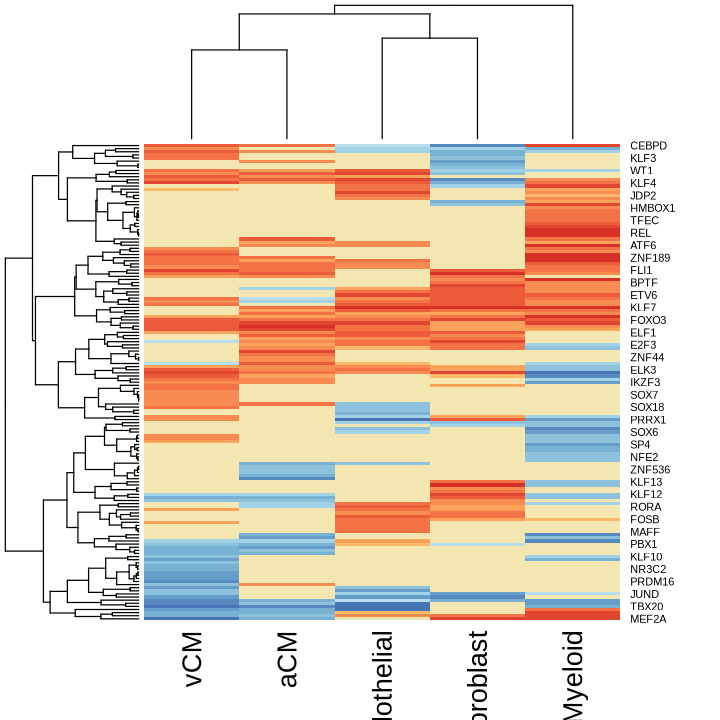

In [12]:
library(seriation)
suppressWarnings(register_DendSer())
set.seed(921)
options(repr.plot.width = 6, repr.plot.height = 6)
t1 <- hmap(rmat, method = "DendSer_BAR", 
           col = rev(colorRampPalette(brewer.pal(n = 8, name = "RdYlBu"))(20)))

### TSS states

In [111]:
tchmm <- list()
for (f in list.files("chromhmm/disease_tss/", pattern = "*.bed$")){
    fname = gsub("_annotate.bed", "", f)
    tchmm[[f]] <- read.table(paste0("chromhmm/disease_tss/", f)) %>% 
    dplyr::select(c(V4, V5)) %>% 
    filter(V5 != ".") %>%
    group_by(V4) %>%
    slice_sample(n = 1) %>%
    ungroup() %>%
    tibble::column_to_rownames("V4") %>% setNames(fname)
}
commonf <- Reduce(intersect, lapply(tchmm, rownames))
for (f in names(tchmm)){
    tchmm[[f]] <- tchmm[[f]][commonf, , drop = F]
}
tchmm <- Reduce(cbind, tchmm[-1], tchmm[[1]]) ### dont use do.call for cbind

In [114]:
write.table(tchmm, "chromhmm/disease_tss/FNIH_Heart_celltype_disease_tss.state.txt", 
            sep = "\t", quote = F, row.names = T, col.names = T)

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


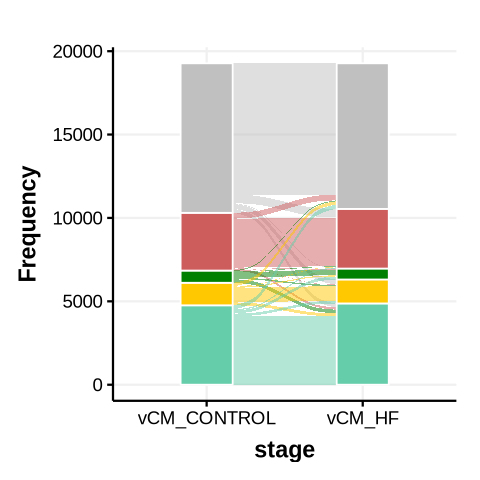

In [112]:
f <- 'vCM'
t1 <- tchmm[, grep(f, colnames(tchmm))] %>%
count(across(everything())) %>%
mutate(id = 1:nrow(.)) %>%
tidyr::pivot_longer(cols = starts_with(f), names_to = "stage", values_to = "state") %>%
mutate(state = factor(state, levels = c("E2", "E1", "E3", "E4", "E5"))) %>%
ggplot(aes(x = stage, stratum = state, alluvium = id, y = n, fill = state)) +
geom_flow() + ylab("Frequency") + 
geom_stratum(color = "white") +
NoLegend() + theme_Publication() + 
scale_fill_manual(values = cols) + NoLegend()

options(repr.plot.width = 4, repr.plot.height = 4)
t1

In [122]:
### primed TSS?
### are these genes identified as DE?
g1 <- genede %>% filter(celltype == "vCM") %>% filter(log2FoldChange >= 0.5) %>% dplyr::select(gene) %>% unlist
g2 <- genede %>% filter(celltype == "vCM") %>% filter(log2FoldChange <= -0.5) %>% dplyr::select(gene) %>% unlist

tchmm[, grep(f, colnames(tchmm))] %>%
setNames(c('CONTROL', 'HF')) %>%
filter(CONTROL != HF) %>%
filter(CONTROL == "E1") %>%
mutate(class = ifelse(rownames(.) %in% g1, "up", "none")) %>%
mutate(class = ifelse(rownames(.) %in% g2, "down", class)) %>%
dplyr::select(HF, class) %>%
table

    class
HF   down none  up
  E2    5  288  55
  E3    0   25   8
  E4    0   18   2
  E5    5   94  34

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


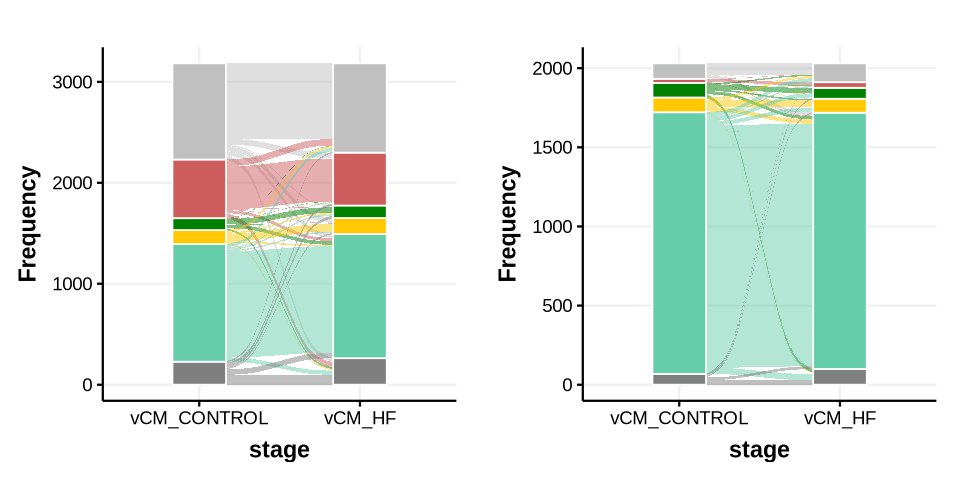

In [99]:
f <- 'vCM'
gtp1 <- genede %>% filter(padj < 0.05, celltype == "vCM", log2FoldChange >= 0.5) %>% dplyr::select(gene) %>% unlist
gtp2 <- genede %>% filter(padj < 0.05, celltype == "vCM", log2FoldChange <= -0.5) %>% dplyr::select(gene) %>% unlist

t1 <- tchmm[gtp1, grep(f, colnames(tchmm))] %>%
count(across(everything())) %>%
mutate(id = 1:nrow(.)) %>%
tidyr::pivot_longer(cols = starts_with(f), names_to = "stage", values_to = "state") %>%
mutate(state = factor(state, levels = c("E2", "E1", "E3", "E4", "E5"))) %>%
ggplot(aes(x = stage, stratum = state, alluvium = id, y = n, fill = state)) +
geom_flow() + ylab("Frequency") + 
geom_stratum(color = "white") +
NoLegend() + theme_Publication() + 
scale_fill_manual(values = cols) + NoLegend()

t2 <- tchmm[gtp2, grep(f, colnames(tchmm))] %>%
count(across(everything())) %>%
mutate(id = 1:nrow(.)) %>%
tidyr::pivot_longer(cols = starts_with(f), names_to = "stage", values_to = "state") %>%
mutate(state = factor(state, levels = c("E2", "E1", "E3", "E4", "E5"))) %>%
ggplot(aes(x = stage, stratum = state, alluvium = id, y = n, fill = state)) +
geom_flow() + ylab("Frequency") + 
geom_stratum(color = "white") +
NoLegend() + theme_Publication() + 
scale_fill_manual(values = cols) + NoLegend()

options(repr.plot.width = 8, repr.plot.height = 4)
cowplot::plot_grid(t1, t2)

## Differential cCREs in disease

In [ ]:
## Plot chromhmm shift flow chart
chmm <- list()
for (f in list.files("chromhmm/disease_annotate/", pattern = "^Heart_UnionPeak.*")){
    fname = gsub("_annotate.bed", "", f)
    chmm[[f]] <- read.table(paste0("chromhmm/disease_annotate/", f)) %>% 
    mutate(range = paste0(V1, ":", V2, "-", V3)) %>%
    dplyr::select(c(range, V4)) %>% 
    group_by(range) %>%
    slice_sample(n = 1) %>%
    ungroup() %>%
    tibble::column_to_rownames("range") %>% setNames(fname)
}
commonf <- Reduce(intersect, lapply(chmm, rownames))
for (f in names(chmm)){
    chmm[[f]] <- chmm[[f]][commonf, , drop = F]
}
chmm <- Reduce(cbind, chmm[-1], chmm[[1]]) ### dont use do.call for cbind

In [670]:
# write.table(chmm, "/projects//ps-renlab2/y2xie/projects/77.LC/81.FNIH_DPT_IGM_240827/05.R/chromhmm/disease_celltype_cCRE.txt",
#            sep = "\t", quote = F, row.names = T, col.names = T)

chmm <- read.table("chromhmm/disease_celltype_cCRE.txt", sep = "\t", header = T)
colnames(chmm) <- gsub("Heart_UnionPeak_", "", colnames(chmm))

In [9]:
atac <- read.table("../reference/ATAC_celltype_HF.cpm.txt")
k27ac <- read.csv("FNIH_Heart_signal/FNIH_Heart_pool.H3K27ac.disease.HeartUnionPeak.cpm.csv", row.names = 1)
k27me3 <- read.csv("FNIH_Heart_signal/FNIH_Heart_pool.H3K27me3.disease.HeartUnionPeak.cpm.csv", row.names = 1)
colnames(atac) <- gsub("NON.HF", "CONTROL", colnames(atac))

rpkm <- read.table("integration/FNIH_Heart_pool.int.disease.rpkm.txt")

abc <- read.table("../../87.FNIH_DHC_IGM_240925/05.R/abc/FNIH_heart_celltype_abc_links.txt", header = T)

atacde <- read.table("../reference/Multiome_Downstream/CHAMBER/4chambers_DESEQ2_ATAC.dds.res", header = T) %>%
filter(ATAC_Padj < 0.05) %>%
setNames(c("celltype", "contrast", "range", "log2FoldChange", "stat", "pvalue", "padj"))

In [508]:
f1 <- atacde$celltype %>% table %>% as.data.frame
f2 <- rmeta %>% filter(orig.ident == "MULTIOME") %>% dplyr::select(nn2.celltype) %>% table %>% as.data.frame 
f1 <- merge(f1, f2, by.x = ".", by.y = "nn2.celltype")
cor.test(f1$Freq.x, f1$Freq.y, method = "spearman")


	Spearman's rank correlation rho

data:  f1$Freq.x and f1$Freq.y
S = 22, p-value = 0.002681
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.8666667 


In [192]:
atacde %>% filter(log2FoldChange > 0) %>% dplyr::select(celltype) %>% table
atacde %>% filter(log2FoldChange < 0) %>% dplyr::select(celltype) %>% table

celltype
        aCM Endocardial Endothelial  Fibroblast     Myeloid    Neuronal 
       2561         101        1814        8566        2161          72 
   Pericyte          SM         vCM 
        718          37       13163 

celltype
        aCM Endocardial Endothelial  Fibroblast    Lymphoid     Myeloid 
       1812          25         840        9726           1        1960 
   Neuronal    Pericyte          SM         vCM 
         37         732          25       15394 

In [233]:
### Check correlation of ATAC DA with gene expression DE
### signal over tss:
suppressPackageStartupMessages(library(GenomicRanges))
tss <- read.table("/projects/ps-renlab2/y2xie/ps-renlab/y2xie/projects/genome_ref/refdata-cellranger-arc-GRCh38-2020-A-2.0.0/regions/tss_1500bp.bed")
tsrange <- GenomicRanges::GRanges(tss$V1, IRanges::IRanges(tss$V2, tss$V3))
atrange <- stringr::str_split_fixed(atacde$range, pattern = "[-:]", n = 3)
atrange <- GenomicRanges::GRanges(atrange[,1], IRanges::IRanges(as.integer(atrange[,2]), as.integer(atrange[,3])))

ppeak <- atacde$range[queryHits(findOverlaps(atrange, tsrange))] %>% unique

In [237]:
tdata <- atacde[queryHits(findOverlaps(atrange, tsrange)),]
tdata$tss <- tss[subjectHits(findOverlaps(atrange, tsrange)),]$V7
unique(tdata$range) %>% length
unique(tdata$tss) %>% length

[1] 8471

[1] 8707

In [241]:
table(tdata$celltype)


        aCM Endocardial Endothelial  Fibroblast     Myeloid    Neuronal 
       1293          45         741        2957        1310          31 
   Pericyte          SM         vCM 
        599          22       16271 

In [240]:
atacder <- read.table("../reference/Multiome_Downstream/CHAMBER/4chambers_DESEQ2_ATAC.dds.res", header = T) %>%
setNames(c("celltype", "contrast", "range", "log2FoldChange", "stat", "pvalue", "padj"))

geneder <- read.table("../reference/Multiome_Downstream/CHAMBER/4chambers_DESEQ2_RNA.dds.res", header = T) %>%
setNames(c("celltype", "contrast", "gene", "log2FoldChange", "stat", "pvalue", "padj"))

Using celltype as id variables

Warning message:
“Removed 10 rows containing missing values or values outside the scale range (`geom_point()`).”


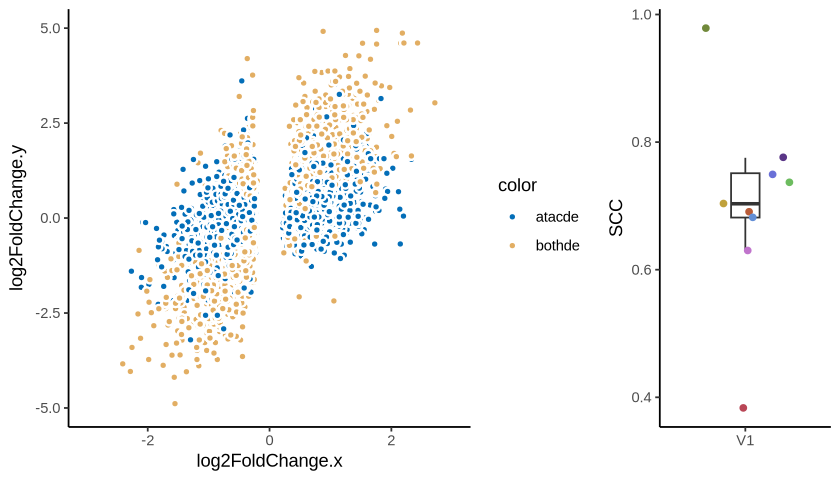

In [268]:
flist <- list()
for (f in unique(tdata$celltype)){
    qqq <- tdata %>% filter(celltype == f)
    qgene <- geneder %>% filter(celltype == f)
    qqq <- merge(qqq, qgene, by.x = "tss", by.y = "gene")
    flist[[f]] <- qqq %>%
    mutate(color = ifelse(padj.y < 0.05, "bothde", "atacde"))
}
t1 <- do.call(rbind, flist) %>%
ggplot(aes(x = log2FoldChange.x, y = log2FoldChange.y, fill = color)) + 
geom_point(color = "white", stroke = 1, shape = 21) + 
theme_classic() + xlim(-3, 3) + ylim(-5, 5) + #ggtitle("all pairs") + 
scale_fill_manual(values = c("#036EB8", "#E2AE63"))

t2 <- flist %>%
lapply(function(x) cor(x$log2FoldChange.x, x$log2FoldChange.y, method = "spearman")) %>%
as.data.frame %>% t %>% as.data.frame %>% tibble::rownames_to_column("celltype") %>%
reshape2::melt() %>%
ggplot(aes(x = variable, y = value)) + 
geom_boxplot(width = 0.2, fill = "white", coef = 2, outlier.shape = NA) + 
geom_jitter(aes(color = celltype)) + 
theme_classic() + xlab("") + ylab("SCC") + 
scale_color_manual(values = celltype_colors) + 
NoLegend()

options(repr.plot.width = 7, repr.plot.height = 4)
fig1 <- cowplot::plot_grid(t1, t2, rel_widths = c(1, 0.4))
       
fig1
ggsave(fig1, filename = "plot/FIG_ATACDE_ovlp_TSS_GENEDE.pdf", dpi = 300, height = 4, width = 7)
write.table(do.call(rbind, flist), "plot/FIG_ATACDE_ovlp_TSS_GENEDE.txt", 
       sep = "\t", quote = F, row.names = T, col.names = T)

In [521]:
data <- read.table("plot/FIG_ATACDE_ovlp_TSS_GENEDE.txt", sep = "\t", header = T)
cor.test(data$log2FoldChange.x, data$log2FoldChange.y)


	Pearson's product-moment correlation

data:  data$log2FoldChange.x and data$log2FoldChange.y
t = 122.61, df = 21249, p-value < 2.2e-16
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.6357540 0.6515035
sample estimates:
      cor 
0.6436969 


In [852]:
### plot all modalities together

# de_list <- list()
# for (f in list.files("../reference/Multiome_Downstream//15kb_BinnedCounts", pattern = ".dds.res$")){
#     fname <- gsub("_H3K27me3_HF_vs_NON_HF.dds.res", "", f)
#     de_list[[fname]] <- read.table(paste0("../reference/Multiome_Downstream//15kb_BinnedCounts/", f), header = T) %>%
#     filter(padj < 0.05, abs(log2FoldChange) >= 0.5) %>% mutate(group = ifelse(log2FoldChange > 0, "up", "down")) %>%
#     mutate(celltype = fname) %>%
#     tibble::rownames_to_column("bin")
# }

# de_list <- do.call(rbind, de_list)

f1 <- atacde %>%
group_by(celltype) %>%
summarise(up_padj = log10(sum(log2FoldChange > 0)+1), down_padj = -log10(sum(log2FoldChange < -0)+1)) %>%
ungroup %>% mutate(mod = "ATAC")

f2 <- genede %>%
group_by(celltype) %>%
summarise(up_padj = log10(sum(log2FoldChange > 0)+1), down_padj = -log10(sum(log2FoldChange < -0)+1)) %>%
ungroup %>% mutate(mod = "RNA")

f3 <- read.table("../reference/4Chambers_Ac_ATACpeaks/HFnonHF_ResultsSummaries.tsv") %>%
mutate(celltype = gsub("([^_]+)_([^_]+)", "\\1", celltype)) %>%
mutate(up_padj = log10(up_padj + 1), down_padj = -log10(down_padj + 1)) %>%
dplyr::select(celltype, up_padj, down_padj) %>% mutate(mod = "H3K27ac")

f4 <- de_list %>%
group_by(celltype) %>%
summarise(up_padj = log10(sum(log2FoldChange > 0)+1), down_padj = -log10(sum(log2FoldChange < -0)+1)) %>%
ungroup %>% mutate(mod = "H3K27me3")

Using celltype, mod as id variables

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


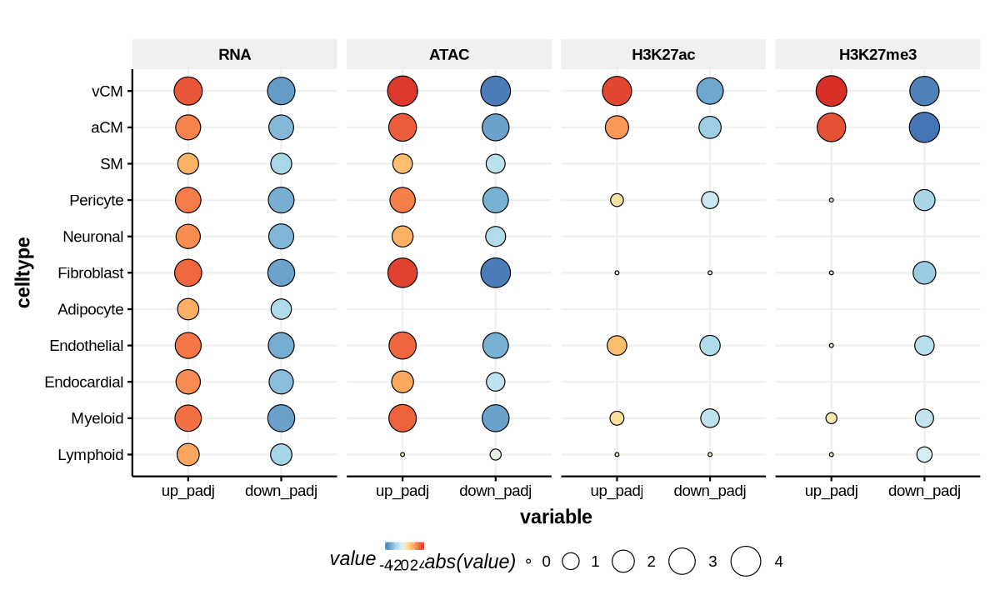

In [857]:
options(repr.plot.width = 10, repr.plot.height = 6)

t1 <- do.call(rbind, list(f1, f2, f3, f4)) %>%
reshape2::melt() %>% 
mutate(celltype = factor(celltype, levels = rev(corder))) %>%
mutate(mod = factor(mod, levels = c("RNA", "ATAC", "H3K27ac", "H3K27me3"))) %>%
ggplot(aes(x = variable, y = celltype, size = abs(value), fill = value)) + 
geom_point(color = "black", stroke = 0.5, shape = 21) + 
theme_Publication() + 
scale_size(range = c(1, 10)) + 
scale_fill_gradientn(colours = rev(colorRampPalette(brewer.pal(n = 8, name = "RdYlBu"))(20))) + 
facet_grid(. ~ mod)

t1
ggsave(t1, filename = "plot/FIG_All_mod_DESeq2_by_celltype_dot.pdf", dpi = 300, height = 6, width = 10)

In [522]:
### How many of the ATAC DA peaks are distal?
atacde %>% filter(log2FoldChange >= 0, !(range %in% ppeak)) %>% dplyr::select(celltype) %>% table
atacde %>% filter(log2FoldChange <= 0, !(range %in% ppeak)) %>% dplyr::select(celltype) %>% table

celltype
        aCM Endocardial Endothelial  Fibroblast     Myeloid    Neuronal 
       2382          85        1666        7849        1992          57 
   Pericyte          SM         vCM 
        549          29       12369 

celltype
        aCM Endocardial Endothelial  Fibroblast    Lymphoid     Myeloid 
       1393          18         628        8860           1        1454 
   Neuronal    Pericyte          SM         vCM 
         34         631          22        9677 

In [523]:
atacde <- atacde %>% filter(!(range %in% ppeak)) ### distal only

### Output distal peaks for motif

In [525]:
for (f in unique(atacde$celltype)){
    tmp <- atacde %>% filter(log2FoldChange > 0, celltype == f) %>% dplyr::select(range) %>% unlist
    tmp <- stringr::str_split_fixed(tmp, pattern = "-", n = 3)
    write.table(tmp, paste0("ATAC_DE/", f, "_up.bed"), sep = "\t", quote = F, row.names = F, col.names = F)
    
    tmp <- atacde %>% filter(log2FoldChange < 0, celltype == f) %>% dplyr::select(range) %>% unlist
    tmp <- stringr::str_split_fixed(tmp, pattern = "-", n = 3)
    write.table(tmp, paste0("ATAC_DE/", f, "_down.bed"), sep = "\t", quote = F, row.names = F, col.names = F)
}

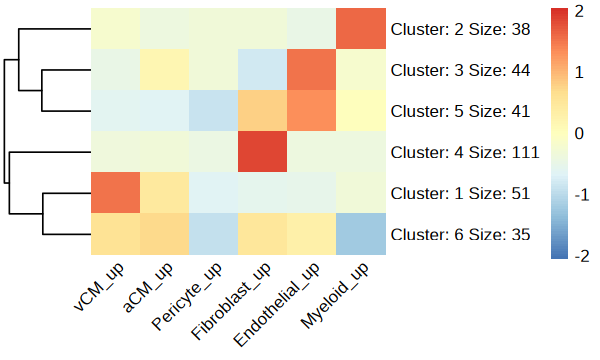

In [538]:
korder <- c("aCM","Endothelial","Fibroblast","Myeloid", "Pericyte","vCM")

motif <- list()
for (file in list.files("motif/", pattern  = paste0(korder, ".*_up", collapse = "|"))){
    motif[[file]] <- read.csv(paste0("motif/", file, "/knownResults.txt"), header = T, sep = "\t") %>%
    setNames(c("motif", "consensus", "p_value", "log_p_value", "fdr", "tgt_num", "tgt_pct", "bgd_num", "bgd_pct")) %>%
    mutate(cond = file)
}

vmotif <- do.call(rbind, motif) %>% group_by(motif) %>% 
filter(min(fdr) < 0.05) %>% ungroup() %>%
dplyr::select(motif) %>% unlist %>% unique

motif <- do.call(rbind, motif) %>%
filter(motif %in% vmotif) %>%
reshape2::dcast(cond ~ motif, value.var = "p_value") %>%
tibble::column_to_rownames("cond") %>% t
motif[is.na(motif)] <- 1
motif <- -log2(motif)
motif[motif > 30] <- 30

options(repr.plot.width = 5, repr.plot.height = 3)
set.seed(921)
f1 <- motif[,paste0(c('vCM','aCM','Pericyte','Fibroblast','Endothelial','Myeloid'), "_up")] %>%
pheatmap(scale = "row", cluster_rows = T, 
         cluster_cols = F, border_color = NA, 
         kmeans_k = 6, show_rownames = T, angle_col = 45)

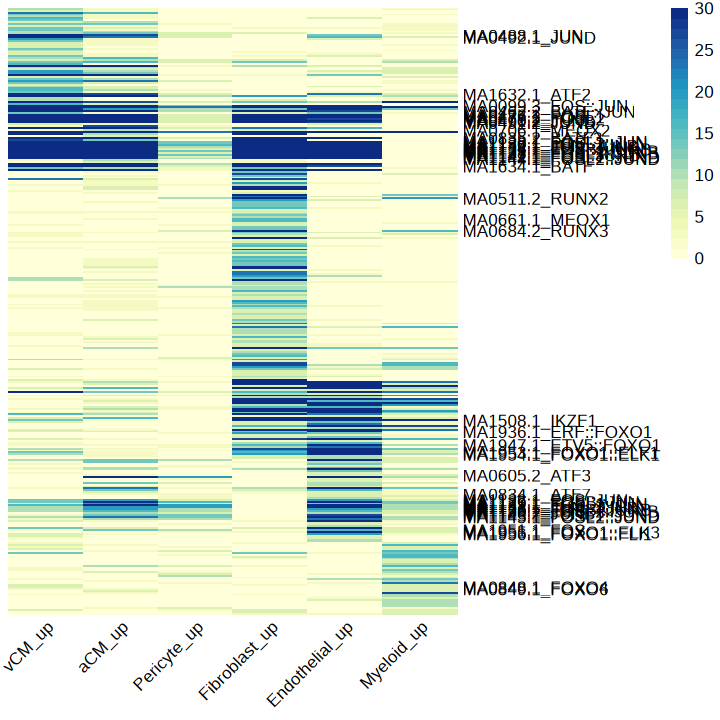

In [546]:
rorder <- f1$kmeans$cluster %>% as.data.frame %>% setNames("cluster") %>%
mutate(cluster = factor(cluster, levels = c(1,6,4,5,3,2))) %>% 
arrange(cluster)

mat1 <- motif[rownames(rorder),paste0(c('vCM','aCM','Pericyte','Fibroblast','Endothelial','Myeloid'), "_up")]
llabel <- c("ATF", "MEOX", 'RUNX', 'FOXO', 'IKZF1', 'FOS', 'JUN')
llabel <- grep(paste0(llabel, collapse = "|"), rownames(mat1), value = T)
labs.row <- rownames(mat1)
labs.row[!(labs.row %in% llabel)] <- ""

options(repr.plot.width = 6, repr.plot.height = 6)

t0 <- mat1 %>%
pheatmap(scale = "none", cluster_rows = F, cluster_cols = F, show_rownames = T, 
         angle_col = 45, labels_row = labs.row,
         border_color = NA, 
         color = colorRampPalette(brewer.pal(n = 8, name = "YlGnBu"))(25))

In [547]:
ggsave(t0, filename = "plot/FIG_celltypes_depeaks_up_motif.pdf", dpi = 300, height = 6, width = 5)
write.table(mat1, "plot/FIG_celltypes_depeaks_up_motif.txt", sep = "\t", quote = F, row.names = T, col.names = T)

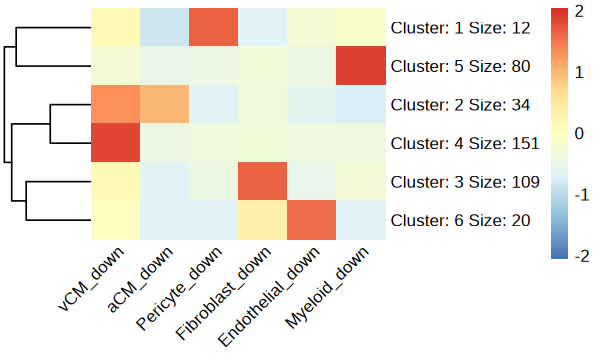

In [548]:
motif <- list()
for (file in list.files("motif/", pattern  = paste0(korder, ".*_down", collapse = "|"))){
    motif[[file]] <- read.csv(paste0("motif/", file, "/knownResults.txt"), header = T, sep = "\t") %>%
    setNames(c("motif", "consensus", "p_value", "log_p_value", "fdr", "tgt_num", "tgt_pct", "bgd_num", "bgd_pct")) %>%
    mutate(cond = file)
}

vmotif <- do.call(rbind, motif) %>% group_by(motif) %>% 
filter(min(fdr) < 0.05) %>% ungroup() %>%
dplyr::select(motif) %>% unlist %>% unique

motif <- do.call(rbind, motif) %>%
filter(motif %in% vmotif) %>%
reshape2::dcast(cond ~ motif, value.var = "p_value") %>%
tibble::column_to_rownames("cond") %>% t
motif[is.na(motif)] <- 1
motif <- -log2(motif)
motif[motif > 30] <- 30

set.seed(921)
options(repr.plot.width = 5, repr.plot.height = 3)
f2 <- motif[,paste0(c('vCM','aCM','Pericyte','Fibroblast','Endothelial','Myeloid'), "_down")] %>%
pheatmap(scale = "row", cluster_rows = T, 
         cluster_cols = F, border_color = NA, 
         kmeans_k = 6, show_rownames = T, angle_col = 45)

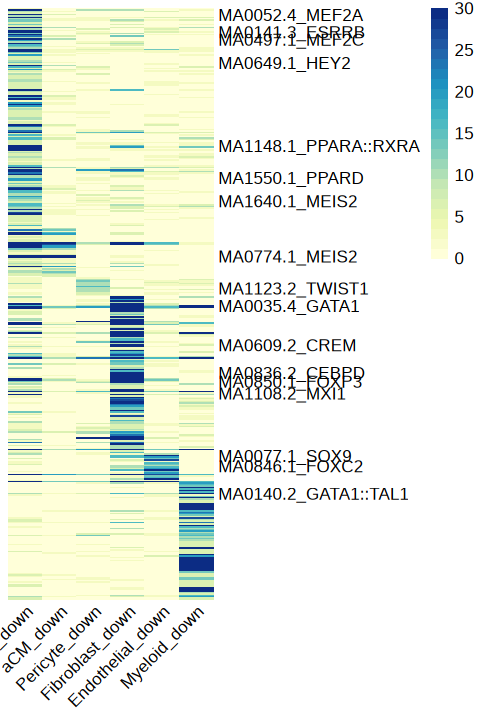

In [551]:
rorder <- f2$kmeans$cluster %>% as.data.frame %>% setNames("cluster") %>%
mutate(cluster = factor(cluster, levels = c(4,2,1,3,6,5))) %>% 
arrange(cluster)

options(repr.plot.width = 4, repr.plot.height = 6)
mat2 <- motif[rownames(rorder),paste0(c('vCM','aCM','Pericyte','Fibroblast','Endothelial','Myeloid'), "_down")]
llabel <- c('GATA1', 'FOXC2', 'SOX9', 'TWIST1','MXI1', 'FOXP3', 
            'CEBPD', 'CREM','PPARD', 'MEIS2', 'HEY2', 'MEF2C', 
            'ESRRB', 'NKX2−5', 'MEF2A', 'PPARA')
llabel <- grep(paste0(llabel, collapse = "|"), rownames(mat2), value = T)
labs.row <- rownames(mat2)
labs.row[!(labs.row %in% llabel)] <- ""

t0 <- mat2 %>%
pheatmap(scale = "none", cluster_rows = F, cluster_cols = F, 
         show_rownames = T, angle_col = 45, labels_row = labs.row,
         border_color = NA, 
         color = colorRampPalette(brewer.pal(n = 8, name = "YlGnBu"))(25))

ggsave(t0, filename = "plot/FIG_celltypes_depeaks_down_motif.pdf", dpi = 300, height = 6, width = 5)
write.table(mat2, "plot/FIG_celltypes_depeaks_down_motif.txt", sep = "\t", quote = F, row.names = T, col.names = T)

### Check shift in chromatin states

In [473]:
chmm <- read.table("/projects//ps-renlab2/y2xie/projects/77.LC/81.FNIH_DPT_IGM_240827/05.R/chromhmm/disease_celltype_cCRE.txt",
                   sep = "\t", header = T, row.names = 1)
colnames(chmm) <- gsub("Heart_UnionPeak_", "", colnames(chmm))

In [405]:
plist <- list()
for (f in setdiff(unique(atacde$celltype), "Lymphoid")){
    tde <- atacde %>% filter(celltype == f)
    qpeak <- sub("-", ":", tde[tde$log2FoldChange > 1,]$range)
    data <- chmm[qpeak, ] %>% count(across(everything()))
    t1 <- data %>%
    mutate(id = 1:nrow(.)) %>%
    tidyr::pivot_longer(cols = starts_with(f), names_to = "stage", values_to = "state") %>%
    mutate(state = factor(state, levels = c("E2", "E1", "E3", "E4", "E5"))) %>%
    ggplot(aes(x = stage, stratum = state, alluvium = id, y = n, fill = state)) +
    geom_flow() + ylab("Frequency") + 
    geom_stratum(color = "white") +
    theme_Publication() + ggtitle(paste0(f, ", log2FoldChange > 1")) + 
    NoLegend() + 
    scale_fill_manual(values = cols)

    qpeak <- sub("-", ":", tde[tde$log2FoldChange < -1,]$range)
    data <- chmm[qpeak, ] %>% count(across(everything()))
    t2 <- data %>%
    mutate(id = 1:nrow(.)) %>%
    tidyr::pivot_longer(cols = starts_with(f), names_to = "stage", values_to = "state") %>%
    mutate(state = factor(state, levels = c("E2", "E1", "E3", "E4", "E5"))) %>%
    ggplot(aes(x = stage, stratum = state, alluvium = id, y = n, fill = state)) +
    geom_flow() + ylab("Frequency") + 
    geom_stratum(color = "white") +
    theme_Publication() + ggtitle(paste0(f, ", log2FoldChange < -1")) + 
    NoLegend() + 
    scale_fill_manual(values = cols)
    
    plist[[f]] <- cowplot::plot_grid(t1, t2, ncol = 2)
}

fig1 <- cowplot::plot_grid(plotlist = plist, nrow = length(plist))
ggsave(fig1, filename = "plot/FIG_DEpeaks_HF_chromhmm_shift_log2FC1.pdf", dpi = 300, height = 32, width = 10)

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behav

In [474]:
# upregulation was associated with chromatin states switching from open to active 
### percentage of all shift (25 combination) for all DE peaks across all cell types
tde <- atacde %>% filter(celltype == f)
qpeak <- sub("-", ":", tde[tde$log2FoldChange > 0,]$range)
data <- chmm[qpeak, grep(f, colnames(chmm), value = T)] %>% count(across(everything()))
data %>%
mutate(id = 1:nrow(.)) %>%
tidyr::pivot_longer(cols = starts_with(f), names_to = "stage", values_to = "state") %>%
mutate(state = factor(state, levels = c("E2", "E1", "E3", "E4", "E5"))) %>%
dim

[1] 44  4

In [475]:
plist2 <- plist1 <- list()
for (f in setdiff(unique(atacde$celltype), "Lymphoid")){
    tde <- atacde %>% filter(celltype == f)
    qpeak <- sub("-", ":", tde[tde$log2FoldChange > 0,]$range)
    plist1[[f]] <- (100*table(chmm[qpeak, grep(f, colnames(chmm), value = T)])/length(qpeak)) %>%
    as.data.frame %>% setNames(c("CONTROL", "HF", "Freq")) %>% mutate(celltype = f)
    
    qpeak <- sub("-", ":", tde[tde$log2FoldChange < 0,]$range)
    plist2[[f]] <- (100*table(chmm[qpeak, grep(f, colnames(chmm), value = T)])/length(qpeak)) %>%
    as.data.frame %>% setNames(c("CONTROL", "HF", "Freq")) %>% mutate(celltype = f)
}

`summarise()` has grouped output by 'CONTROL'. You can override using the `.groups` argument.
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
`summarise()` has grouped output by 'CONTROL'. You can override using the `.groups` argument.
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


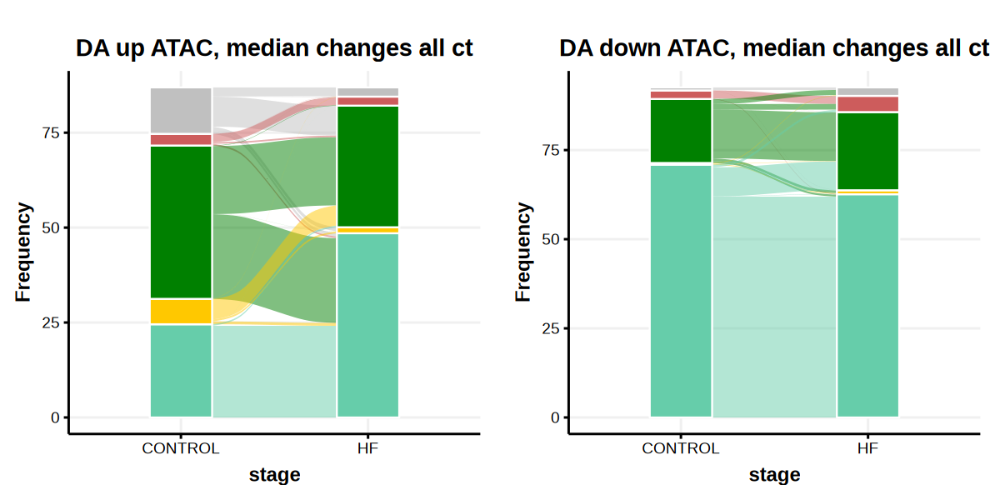

In [477]:
t1 <- do.call(rbind, plist1) %>%
group_by(CONTROL, HF) %>%
summarise(ratio = median(Freq)) %>%
ungroup %>%
count(across(everything())) %>%
mutate(id = 1:nrow(.)) %>%
tidyr::pivot_longer(cols = c(CONTROL, HF), names_to = "stage", values_to = "state") %>%
mutate(state = factor(state, levels = c("E2", "E1", "E3", "E4", "E5"))) %>%
ggplot(aes(x = stage, stratum = state, alluvium = id, y = ratio, fill = state)) +
geom_flow() + ylab("Frequency") + 
geom_stratum(color = "white") +
theme_Publication() + ggtitle("DA up ATAC, median changes all ct") + 
NoLegend() + 
scale_fill_manual(values = cols)

t2 <- do.call(rbind, plist2) %>%
group_by(CONTROL, HF) %>%
summarise(ratio = median(Freq)) %>%
ungroup %>%
count(across(everything())) %>%
mutate(id = 1:nrow(.)) %>%
tidyr::pivot_longer(cols = c(CONTROL, HF), names_to = "stage", values_to = "state") %>%
mutate(state = factor(state, levels = c("E2", "E1", "E3", "E4", "E5"))) %>%
ggplot(aes(x = stage, stratum = state, alluvium = id, y = ratio, fill = state)) +
geom_flow() + ylab("Frequency") + 
geom_stratum(color = "white") +
theme_Publication() + ggtitle("DA down ATAC, median changes all ct") + 
NoLegend() + 
scale_fill_manual(values = cols)

fig1 <- cowplot::plot_grid(t1, t2, ncol = 2)

fig1
# ggsave(fig1, filename = "plot/FIG_DEpeaks_HF_distal_chromhmm_shift_median.pdf", dpi = 300, height = 5, width = 10)

In [479]:
do.call(rbind, plist1) %>%
group_by(CONTROL, HF) %>%
summarise(ratio = median(Freq))

`summarise()` has grouped output by 'CONTROL'. You can override using the `.groups` argument.


CONTROL,HF,ratio
<fct>,<fct>,<dbl>
E1,E1,2.122983425
E1,E2,0.041981528
E1,E3,0.432480000
E1,E4,0.000000000
E1,E5,0.474027257
E2,E1,0.120048019
E2,E2,2.308984047
E2,E3,7.895490690
E2,E4,1.054959057


Using celltype as id variables

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


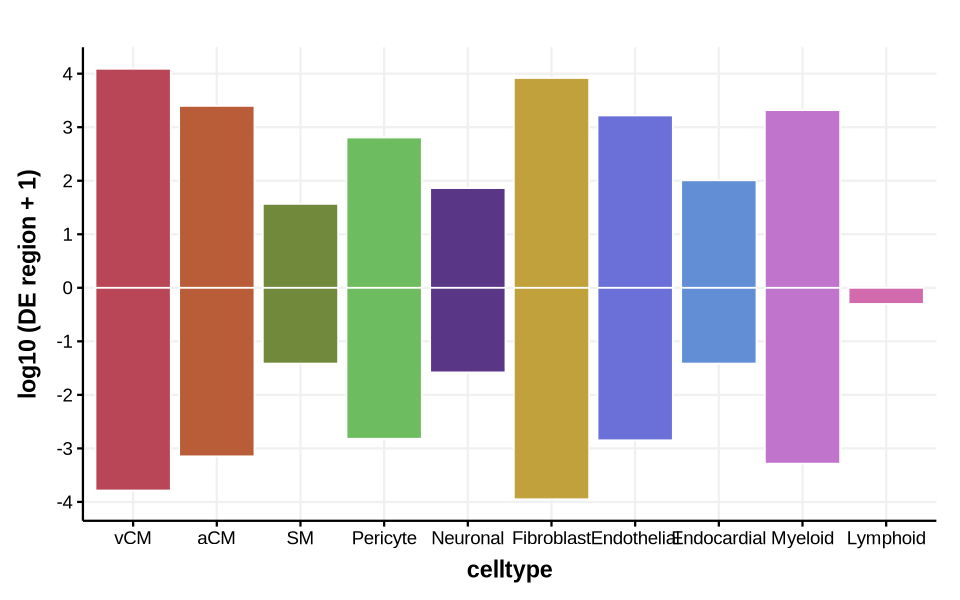

In [520]:
options(repr.plot.width = 8, repr.plot.height = 5)
t1 <- atacde %>%
group_by(celltype) %>%
summarise(up_padj = log10(sum(log2FoldChange >= 0.5)+1), down_padj = -log10(sum(log2FoldChange <= -0.5)+1)) %>%
ungroup %>%
dplyr::select(c(celltype, up_padj, down_padj)) %>%
reshape2::melt() %>% mutate(celltype = factor(celltype, levels = corder)) %>%
ggplot(aes(x = celltype, y = value, fill = celltype)) + 
geom_col(position = "dodge", color = "white") + 
theme_Publication() + ylab("log10 (DE region + 1)") + 
scale_y_continuous(breaks = seq(-5, 5,1)) + 
scale_fill_manual(values = celltype_colors) + NoLegend()

t1
ggsave(t1, filename = "plot/FIG_ATAC_distal_DEpeak_by_celltype.pdf", dpi = 300, height = 4, width = 6)

In [863]:
atacde %>% dplyr::select(range) %>% distinct %>% dim

atacder %>% filter(padj < 0.05) %>% dplyr::select(range) %>% distinct %>% dim

[1] 44267     1

[1] 52738     1

In [195]:
de_list <- list()
for (f in list.files("../reference/4Chambers_Ac_ATACpeaks/", pattern = ".dds.res$")){
    fname <- gsub("_H3k27ac_HF_vs_NON_HF.dds.res", "", f)
    de_list[[fname]] <- read.table(paste0("../reference/4Chambers_Ac_ATACpeaks/", f), header = T) %>%
    filter(padj < 0.05) %>% mutate(group = ifelse(log2FoldChange > 0, "up", "down")) %>%
    mutate(celltype = fname) %>%
    tibble::rownames_to_column("bin")
}

de_list <- do.call(rbind, de_list)
head(de_list)

,bin,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,group,celltype
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
aCM.1,chr3:14460638-14460938,5.872797,1.971632,0.3389645,5.816631,6.004556e-09,0.0004583518,up,aCM
aCM.2,chr21:46347849-46348149,13.904093,1.474885,0.2733919,5.394764,6.861385e-08,0.0021335607,up,aCM
aCM.3,chr3:14268019-14268319,4.114506,2.143232,0.3999583,5.358639,8.385100e-08,0.0021335607,up,aCM
aCM.4,chr14:94936630-94936930,8.222940,-1.466153,0.2832839,-5.175562,2.272264e-07,0.0034690198,down,aCM
aCM.5,chr2:71618288-71618588,14.618585,1.098696,0.2120460,5.181406,2.202190e-07,0.0034690198,up,aCM
aCM.6,chr2:71685514-71685814,15.298451,1.148560,0.2245010,5.116057,3.119894e-07,0.0039692327,up,aCM


In [211]:
table(de_list$group, de_list$celltype)

      
        aCM Endothelial Myeloid Pericyte  vCM
  down   24          14       6        4  554
  up     57          10       1        1 3116

In [215]:
### Compare overlap with ATACDA
f1 <- de_list[de_list$group == "up" & de_list$celltype == "vCM",]$bin
f2 <- de_list[de_list$group == "down" & de_list$celltype == "vCM",]$bin
f3 <- atacde[atacde$log2FoldChange > 0 & atacde$celltype == "vCM",]$range
f4 <- atacde[atacde$log2FoldChange < 0 & atacde$celltype == "vCM",]$range

length(f1); length(f2)
length(f3); length(f4)
length(intersect(f1, sub("-", ":", f3)))
length(intersect(f2, sub("-", ":", f4)))

[1] 3116

[1] 554

[1] 13163

[1] 15394

[1] 1486

[1] 505

In [223]:
1486/3116

[1] 0.4768935

In [221]:
### compare shift in chromatin states

,vCM_CONTROL,vCM_HF
,<chr>,<chr>
chr10:100006284-100006584,E3,E4
chr10:10001292-10001592,E2,E3
chr10:100020786-100021081,E1,E1
chr10:100038502-100038802,E1,E1
chr10:100043798-100044098,E2,E1
chr10:100115013-100115313,E1,E1


In [369]:
unique(atacde[atacde$log2FoldChange < 0, ]$range) %>% length
atacde[atacde$log2FoldChange < 0, ]$range %>% length
unique(atacde[atacde$log2FoldChange > 0, ]$range) %>% length
atacde[atacde$log2FoldChange > 0, ]$range %>% length

[1] 20701

[1] 22718

[1] 24304

[1] 26978

In [343]:
upd <- unique(atacde[atacde$log2FoldChange > 0,]$range)
downd <- unique(atacde[atacde$log2FoldChange < 0,]$range)

tm1 <- atac[upd, sort(grep("HF", colnames(atac), value = T))]
tm2 <- atac[upd, sort(grep("CONTROL", colnames(atac), value = T))]

qmat <- (tm1+0.001)/(tm2+0.001)
qmat[is.na(qmat)] <- 0
qmat[is.na(qmat)] <- 0
write.table(qmat, sep = "\t", row.names = T, col.names = T, quote = F,
            "/projects/ps-renlab2/y2xie/projects/77.LC/81.FNIH_DPT_IGM_240827/reference/Multiome_Downstream/ATAC/NMF/ATAC_DE_up_FC.tsv")

tm1 <- atac[downd, sort(grep("HF", colnames(atac), value = T))]
tm2 <- atac[downd, sort(grep("CONTROL", colnames(atac), value = T))]

qmat <- (tm1+0.001)/(tm2+0.001)
qmat[is.na(qmat)] <- 0
qmat[is.na(qmat)] <- 0
write.table(qmat, sep = "\t", row.names = T, col.names = T, quote = F,
            "/projects/ps-renlab2/y2xie/projects/77.LC/81.FNIH_DPT_IGM_240827/reference/Multiome_Downstream/ATAC/NMF/ATAC_DE_down_FC.tsv")

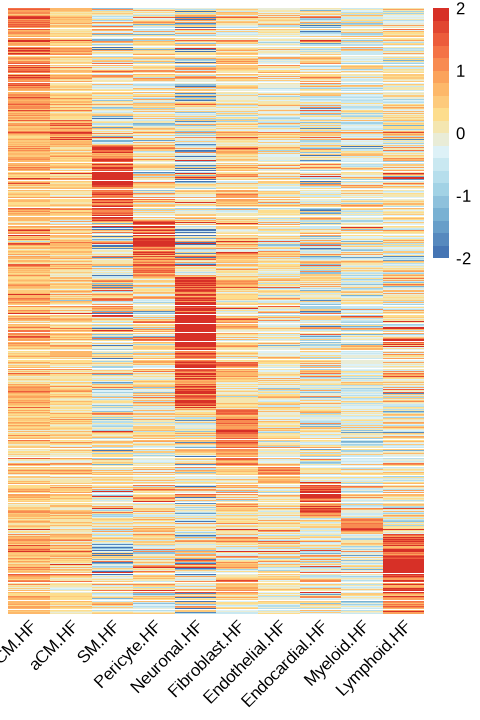

In [397]:
### Plot up and down separately
tm1 <- atac[upd, sort(grep("HF", colnames(atac), value = T))]
tm2 <- atac[upd, sort(grep("CONTROL", colnames(atac), value = T))]

qmat <- (tm1+0.001)/(tm2+0.001)
qmat[is.na(qmat)] <- 0
qmat[is.na(qmat)] <- 0

rmat <- log2(qmat[, paste0(qorder, ".HF")])
max_indices <- max.col(rmat)
permutation_vector <- order(max_indices)
smat <- rmat[(permutation_vector),]

options(repr.plot.width = 4, repr.plot.height = 6)
smat %>%
pheatmap(scale = "none",cluster_rows = F, cluster_cols = F, angle_col = 45, breaks = seq(-2, 2, 0.2),
#          gaps_row = gapr, 
         show_rownames = F, # annotation_colors = ccolor, 
         # annotation_row = ranno, annotation_col = canno,
         border_color = NA, color = rev(colorRampPalette(brewer.pal(n = 8, name = "RdYlBu"))(20)))

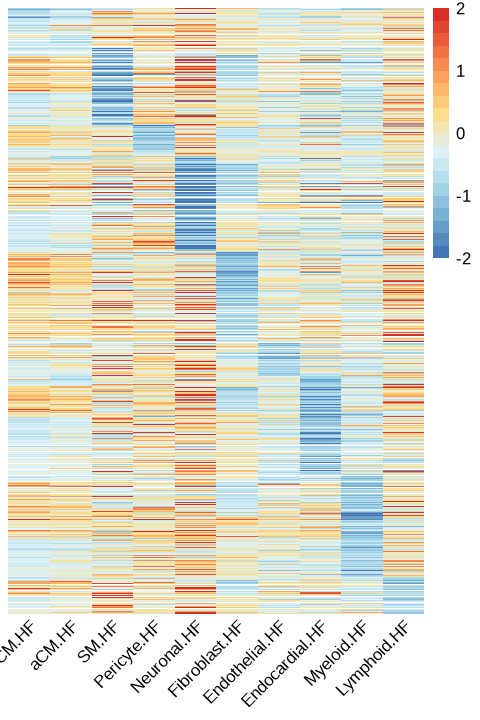

In [396]:
tm1 <- atac[downd, sort(grep("HF", colnames(atac), value = T))]
tm2 <- atac[downd, sort(grep("CONTROL", colnames(atac), value = T))]

qmat <- (tm1+0.001)/(tm2+0.001)
qmat[is.na(qmat)] <- 0
qmat[is.na(qmat)] <- 0

rmat <- log2(qmat[, paste0(qorder, ".HF")])
max_indices <- max.col(-rmat)
permutation_vector <- order(max_indices)
smat <- rmat[(permutation_vector),]
smat %>%
pheatmap(scale = "none",cluster_rows = F, cluster_cols = F, angle_col = 45, breaks = seq(-2, 2, 0.2),
#          gaps_row = gapr, 
         show_rownames = F, # annotation_colors = ccolor, 
         # annotation_row = ranno, annotation_col = canno,
         border_color = NA, color = rev(colorRampPalette(brewer.pal(n = 8, name = "RdYlBu"))(20)))

### Target genes of DA cCRE?

In [349]:
### Compare targeting genes for diff ATAC peaks
abc <- abc %>% mutate(range = sub(":", "-", range))

atacde$celltype %>% table

merge(atacde, abc, by = "range") %>%
filter(celltype == CellType) %>%
dplyr::select(celltype) %>% table

merge(atacde, abc, by = "range") %>%
filter(celltype == CellType) %>%
filter(abs(log2FoldChange) >= 0.5) %>%
dplyr::select(celltype) %>% table

.
        aCM Endocardial Endothelial  Fibroblast    Lymphoid     Myeloid 
       3775         103        2294       16709           1        3446 
   Neuronal    Pericyte          SM         vCM 
         91        1180          51       22046 

celltype
        aCM Endocardial Endothelial  Fibroblast     Myeloid    Neuronal 
        224          72         858        1040         985          69 
   Pericyte          SM         vCM 
        551          26        1505 

celltype
        aCM Endocardial Endothelial  Fibroblast     Myeloid    Neuronal 
        189          72         635         810         871          69 
   Pericyte          SM         vCM 
        410          26         440 

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


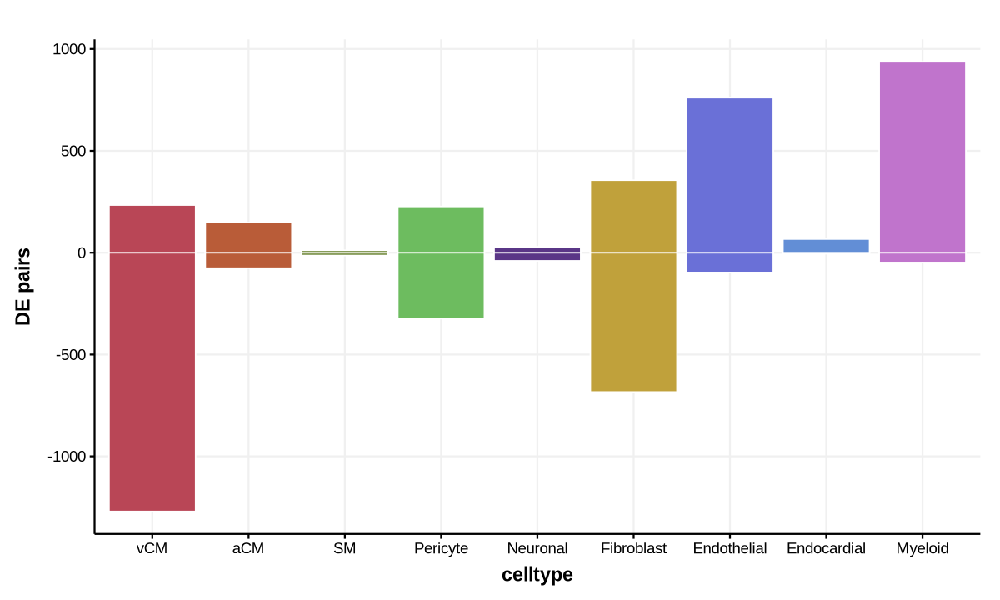

In [496]:
t1 <- merge(atacde, abc, by = "range") %>%
filter(celltype == CellType) %>%
mutate(direction = ifelse(log2FoldChange > 0, "up", "down")) %>%
dplyr::select(celltype, direction) %>% 
table %>%
as.data.frame %>%
mutate(value = ifelse(direction == "up", Freq, -Freq)) %>%
mutate(celltype = factor(celltype, levels = corder)) %>%
ggplot(aes(x = celltype, y = value, fill = celltype)) + 
geom_col(position = "dodge", color = "white") + 
theme_Publication() + ylab("DE pairs") + 
# scale_y_continuous(breaks = seq(-5, 5,1)) + 
scale_fill_manual(values = celltype_colors) + NoLegend()

t1
ggsave(t1, filename = "plot/FIG_ATAC_distal_DEpeak_targeted_gene_abc_by_celltype.pdf", dpi = 300, height = 4, width = 6)

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


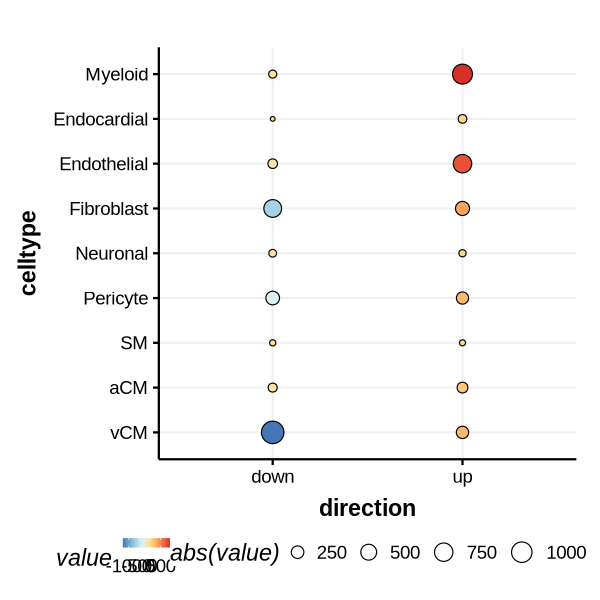

In [753]:
options(repr.plot.width = 5, repr.plot.height = 5)
t1 <- merge(atacde, abc, by = "range") %>%
filter(celltype == CellType) %>%
mutate(direction = ifelse(log2FoldChange > 0, "up", "down")) %>%
dplyr::select(celltype, direction) %>% 
table %>%
as.data.frame %>%
mutate(value = ifelse(direction == "up", Freq, -Freq)) %>%
mutate(celltype = factor(celltype, levels = corder)) %>%
ggplot(aes(x = direction, y = celltype, size = abs(value), fill = value)) + 
geom_point(color = "black", stroke = 0.5, shape = 21) + 
theme_Publication() + 
scale_fill_gradientn(colours = rev(colorRampPalette(brewer.pal(n = 8, name = "RdYlBu"))(20)))

t1

ggsave(t1, filename = "plot/FIG_ATAC_distal_DEpeak_targeted_gene_abc_by_celltype_dot.pdf", dpi = 300, height = 4, width = 3)

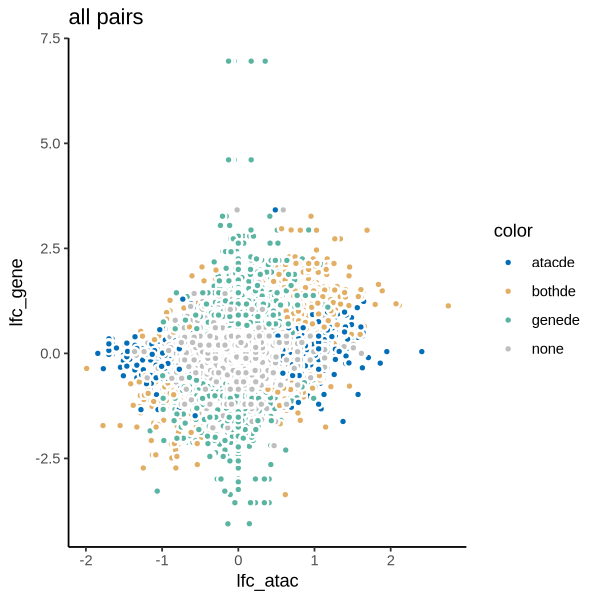

In [777]:
### Differential links: overlap with either differential peaks or genes
flist <- list()
for (f in unique(abc$CellType)){
    qqq <- abc %>% filter(CellType == f)
    qregion <- atacde %>% filter(celltype == f) %>% dplyr::select(range) %>% unlist
    qgene <- genede %>% filter(celltype == f) %>% dplyr::select(gene) %>% unlist

    qgeneder <- geneder %>% filter(celltype == f)
    qatacder <- atacder %>% filter(celltype == f)
    qqq$lfc_gene <- qgeneder[match(qqq$TargetGene, qgeneder$gene),]$log2FoldChange
    qqq$lfc_atac <- qatacder[match(qqq$range, qatacder$range),]$log2FoldChange
    qqq$lfc_gene[is.na(qqq$lfc_gene)] <- 0
    qqq$lfc_atac[is.na(qqq$lfc_atac)] <- 0
    
    flist[[f]] <- qqq %>%
    mutate(color = ifelse(TargetGene %in% qgene, "genede", "none")) %>%
    mutate(color = ifelse(range %in% qregion, "atacde", color)) %>%
    mutate(color = ifelse((range %in% qregion) & (TargetGene %in% qgene), "bothde", color))
}

do.call(rbind, flist) %>%
filter(CellType %in% korder) %>%
ggplot(aes(x = lfc_atac, y = lfc_gene, fill = color)) + 
geom_point(color = "white", stroke = 1, shape = 21) + 
theme_classic() + ggtitle("all pairs") + 
scale_fill_manual(values = c("#036EB8", "#E2AE63", "#59b4a2", "grey"))

t1 <- do.call(rbind, flist) %>%
filter(CellType %in% korder, color != "none") %>%
ggplot(aes(x = lfc_atac, y = lfc_gene, fill = color)) + 
geom_point(color = "white", stroke = 1, shape = 21) + 
theme_classic() + ggtitle("all pairs") + 
scale_fill_manual(values = c("#036EB8", "#E2AE63", "#59b4a2", "grey"))

ggsave(t1, filename = "plot/FIG_abc_ovlp_DEgenes_DApeaks.pdf", dpi = 300, height = 5.5, width = 6)
write.table(t1$data, "plot/FIG_abc_ovlp_DEgenes_DApeaks.txt", sep = "\t", quote = F)

In [780]:
cor.test(t1$data$lfc_gene, t1$data$lfc_atac)


	Pearson's product-moment correlation

data:  t1$data$lfc_gene and t1$data$lfc_atac
t = 41.85, df = 13741, p-value < 2.2e-16
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.3213202 0.3509791
sample estimates:
     cor 
0.336233 


In [604]:
### Changes in chromatin states over diff links
f <- "vCM"
tmp <- read.table("plot/FIG_abc_ovlp_DEgenes_DApeaks.txt") %>%
filter(CellType == f) %>% 
mutate(genedir = ifelse(lfc_atac > 0, "up", "down")) 
tmp$range <- sub("-", ":", tmp$range)
tmp2 <- chmm[,grep(f, colnames(chmm))] %>% setNames(c('CONTROL', 'HF'))

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


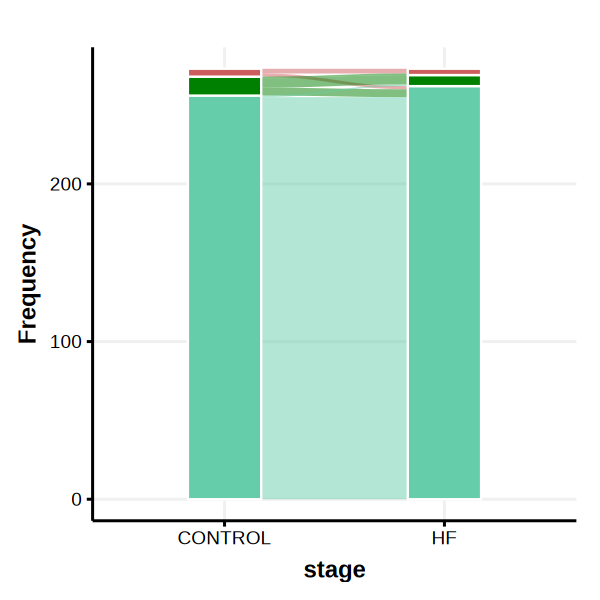

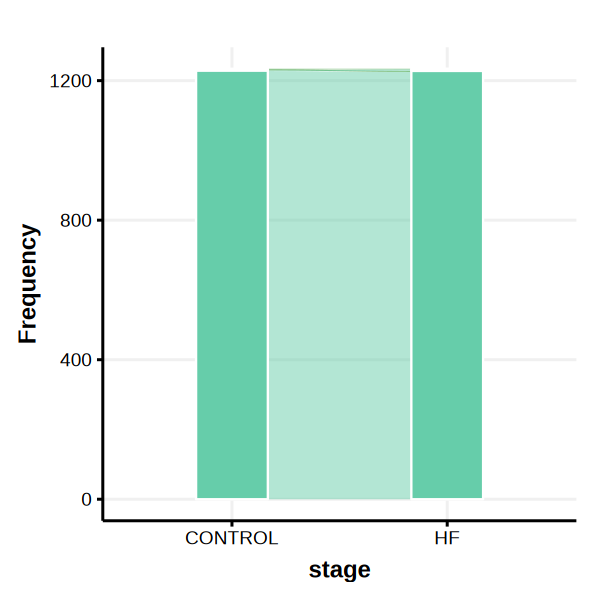

In [605]:
options(repr.plot.width = 5, repr.plot.height = 5)

merge(tmp, tmp2, by.x = "range", by.y = 0) %>%
filter(lfc_gene > 0, lfc_atac * lfc_gene > 0) %>%
# filter(genedir == "up") %>% 
dplyr::select(c(range, CONTROL, HF)) %>% 
distinct %>% dplyr::select(c(CONTROL, HF)) %>% 
count(across(everything())) %>%
mutate(id = 1:nrow(.)) %>%
tidyr::pivot_longer(cols = c(CONTROL, HF), names_to = "stage", values_to = "state") %>%
mutate(state = factor(state, levels = c("E2", "E1", "E3", "E4", "E5"))) %>%
ggplot(aes(x = stage, stratum = state, alluvium = id, y = n, fill = state)) +
geom_flow() + ylab("Frequency") + 
geom_stratum(color = "white") +
theme_Publication() + 
NoLegend() + 
scale_fill_manual(values = cols)

merge(tmp, tmp2, by.x = "range", by.y = 0) %>%
filter(lfc_gene < 0, lfc_atac * lfc_gene > 0) %>%
# filter(genedir == "down") %>% 
dplyr::select(c(range, CONTROL, HF)) %>% 
distinct %>% dplyr::select(c(CONTROL, HF)) %>% 
count(across(everything())) %>%
mutate(id = 1:nrow(.)) %>%
tidyr::pivot_longer(cols = c(CONTROL, HF), names_to = "stage", values_to = "state") %>%
mutate(state = factor(state, levels = c("E2", "E1", "E3", "E4", "E5"))) %>%
ggplot(aes(x = stage, stratum = state, alluvium = id, y = n, fill = state)) +
geom_flow() + ylab("Frequency") + 
geom_stratum(color = "white") +
theme_Publication() + 
NoLegend() + 
scale_fill_manual(values = cols)

In [1061]:
qgene <- c('ACTN2', 'BAG3', 'CAMKD2', 'CAND2','FLNC','HSPB7', 'NKX2-5', 
           'STRN24', 'PITX2', 'KLF12', 'ATP1B1', 'LDLR28', 'LPL29', 'ABCG5',
           'NPPA', 'NPPB', 'ACE2', 'KIF13A', 'MYH6', 'ADRB2', 'CKM') ### CM
qgene <- c('CCL3', 'NLRP3', 'NFKB2', 'EGR1', 'VSIG4', 'LYVE1', 'FMN1', 'CD163') ### Myeloid
qgene <- c('POSTN', 'MEOX1', 'TLL1', 'EDNRA', 'SVEP1', 'FRZB', 'APOD', 'NPPC', 'ANGPTL1', 'FIGF', 'ACE2') ### Fibro

t1$data %>%
filter(color == "bothde") %>%
# filter(TargetGene %in% qgene) %>%
filter(CellType == 'Fibroblast') # %>%
# dplyr::select(TargetGene) %>%
# unlist %>% unique # table

,chr,start.x,end.x,range,name,CPM,chrom.x,start.y,end.y,TargetGene,RPKM,CellType,ABC.Score,lfc_gene,lfc_atac,color
,<chr>,<int>,<int>,<chr>,<chr>,<dbl>,<chr>,<int>,<int>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<chr>
Fibroblast.16,chr1,109877480,109877780,chr1-109877480-109877780,intergenic|chr1:109877480-109877780,9.376717,chr1,109910242,109910243,CSF1,1.192124,Fibroblast,0.025846,-0.9455433,-0.4766944,bothde
Fibroblast.18,chr1,109914474,109914774,chr1-109914474-109914774,genic|chr1:109914474-109914774,3.429447,chr1,109910242,109910243,CSF1,1.192124,Fibroblast,0.044651,-0.9455433,-1.1440634,bothde
Fibroblast.24,chr1,115330507,115330807,chr1-115330507-115330807,genic|chr1:115330507-115330807,3.168983,chr1,115338235,115338236,NGF,2.210036,Fibroblast,0.030093,-1.4175426,0.7828731,bothde
Fibroblast.47,chr1,12595826,12596126,chr1-12595826-12596126,genic|chr1:12595826-12596126,11.156557,chr1,12618209,12618210,DHRS3,1.510563,Fibroblast,0.058471,-1.5732142,-0.3360791,bothde
Fibroblast.50,chr1,12602673,12602973,chr1-12602673-12602973,genic|chr1:12602673-12602973,3.820144,chr1,12618209,12618210,DHRS3,1.510563,Fibroblast,0.031076,-1.5732142,-0.5614887,bothde
Fibroblast.114,chr1,145985768,145986068,chr1-145985768-145986068,intergenic|chr1:145985768-145986068,2.604644,chr1,145824094,145824095,RNF115,2.861074,Fibroblast,0.024475,1.0805063,-0.7139849,bothde
Fibroblast.140,chr1,150534861,150535161,chr1-150534861-150535161,intergenic|chr1:150534861-150535161,3.906965,chr1,150549369,150549370,ADAMTSL4,2.519269,Fibroblast,0.042045,-1.2610645,-1.1309060,bothde
Fibroblast.167,chr1,150881579,150881879,chr1-150881579-150881879,intergenic|chr1:150881579-150881879,1.519375,chr1,150876707,150876708,ARNT,1.976712,Fibroblast,0.023581,-0.3306306,-0.9517086,bothde
Fibroblast.216,chr1,156709819,156710119,chr1-156709819-156710119,intergenic|chr1:156709819-156710119,2.821697,chr1,156728442,156728443,RRNAD1,1.450023,Fibroblast,0.020841,-0.4288170,-0.4234547,bothde


In [1058]:
t1$data %>%
filter(color == "bothde") %>%
# filter(TargetGene %in% qgene) %>%
filter(TargetGene == 'ZNF189')

,chr,start.x,end.x,range,name,CPM,chrom.x,start.y,end.y,TargetGene,RPKM,CellType,ABC.Score,lfc_gene,lfc_atac,color
,<chr>,<int>,<int>,<chr>,<chr>,<dbl>,<chr>,<int>,<int>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<chr>
vCM.6950,chr9,101400101,101400401,chr9-101400101-101400401,genic|chr9:101400101-101400401,1.690951,chr9,101398873,101398874,ZNF189,5.874148,vCM,0.030846,1.1386741,1.451131,bothde
vCM.6952,chr9,101486281,101486581,chr9-101486281-101486581,genic|chr9:101486281-101486581,8.290492,chr9,101398873,101398874,ZNF189,5.874148,vCM,0.020875,1.1386741,-0.316888,bothde
aCM.7111,chr9,101400101,101400401,chr9-101400101-101400401,genic|chr9:101400101-101400401,1.557712,chr9,101398873,101398874,ZNF189,6.883591,aCM,0.041190,0.9530386,1.216344,bothde
Endothelial.11430,chr9,101400101,101400401,chr9-101400101-101400401,genic|chr9:101400101-101400401,2.027026,chr9,101398873,101398874,ZNF189,3.783032,Endothelial,0.043858,1.0559745,1.131088,bothde
Myeloid.9250,chr9,101400101,101400401,chr9-101400101-101400401,genic|chr9:101400101-101400401,1.707221,chr9,101398873,101398874,ZNF189,7.055487,Myeloid,0.038725,1.6422483,1.839158,bothde


In [789]:
do.call(rbind, flist) %>%
filter(CellType %in% korder, color != "none") %>%
filter(lfc_atac > 0, lfc_atac * lfc_gene > 0) %>%
dplyr::select(CellType) %>%
table

do.call(rbind, flist) %>%
filter(CellType %in% korder, color != "none") %>%
filter(lfc_atac < 0, lfc_atac * lfc_gene > 0) %>%
dplyr::select(CellType) %>%
table

CellType
        aCM Endothelial  Fibroblast     Myeloid    Pericyte         vCM 
        239        1008         500        1546         392         303 

CellType
        aCM Endothelial  Fibroblast     Myeloid    Pericyte         vCM 
        250         369         888         278         931        1503 

In [797]:
### how many 10k bins?
do.call(rbind, flist) %>%
filter(CellType %in% korder, color != "none") %>%
filter(lfc_atac < 0, lfc_atac * lfc_gene > 0) %>%
filter(abs(floor(start.x/10000) - floor(start.y/10000)) >= 10) %>% ### separated by 100k
dplyr::select(CellType) %>%
table

do.call(rbind, flist) %>%
filter(CellType %in% korder, color != "none") %>%
filter(lfc_atac > 0, lfc_atac * lfc_gene > 0) %>%
filter(abs(floor(start.x/10000) - floor(start.y/10000)) >= 10) %>% ### separated by 100k
dplyr::select(CellType) %>%
table

### run APA use -n 15: 15*(10000/sqrt(2)) = 106k

CellType
        aCM Endothelial  Fibroblast     Myeloid    Pericyte         vCM 
         14          97         174          38         226         294 

CellType
        aCM Endothelial  Fibroblast     Myeloid    Pericyte         vCM 
         34         402          93         343         162          56 

In [935]:
do.call(rbind, flist) %>%
filter(CellType %in% c("Fibroblast"), color %in% c("bothde")) %>%
# filter(lfc_atac > 1, lfc_gene > 1) %>% dplyr::select(TargetGene) %>% unlist %>% unique
# filter(TargetGene == "LAMB1")

chr,start.x,end.x,range,name,CPM,chrom.x,start.y,end.y,TargetGene,RPKM,CellType,ABC.Score,lfc_gene,lfc_atac,color
<chr>,<int>,<int>,<chr>,<chr>,<dbl>,<chr>,<int>,<int>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<chr>


In [928]:
do.call(rbind, flist) %>%
filter(CellType %in% c("Fibroblast"), color %in% c("bothde")) %>%
filter(lfc_atac > 0, lfc_atac * lfc_gene > 0) %>%
dplyr::select(TargetGene) %>% unlist %>% unique

[1] "MAP3K6"      "AZIN2"       "MACF1"       "HEYL"        "NEXN"       
 [6] "IFI44L"      "SSX2IP"      "WBP1L"       "AP002989.1"  "PHLDB1"     
[11] "TM7SF3"      "FMNL3"       "STAT2"       "DYRK2"       "PHLDA1"     
[16] "DUSP6"       "LINC00377"   "AC013451.1"  "ATP10A"      "TPM1"       
[21] "LOXL1"       "TMEM204"     "AP005131.7"  "AP005131.6"  "AP000915.2" 
[26] "SMCHD1"      "COLEC12"     "COMP"        "SLC20A1"     "AC011246.1" 
[31] "RND3"        "FAP"         "PXDN"        "COL4A4"      "COL6A3"     
[36] "CYP1B1"      "CYP1B1-AS1"  "MAP4K3"      "MTHFD2"      "IFNAR2"     
[41] "CCDC80"      "PLSCR4"      "ARHGAP10"    "GASK1B"      "FAM198B-AS1"
[46] "AC098679.6"  "ACSL1"       "AC084871.1"  "PDLIM3"      "ATP10D"     
[51] "CHIC2"       "ANKH"        "ARRDC3"      "SMOC2"       "CARMIL1"    
[56] "SERPINE1"    "DLD"         "LAMB1"       "CALD1"       "AEBP1"      
[61] "ASAP1"       "KIF13B"      "PPP2CB"      "PLEKHA2"     "PENK"       
[66] "GLIS3"       "ASPN"        "BGN"

In [804]:
### diff abc and Hi-C support
system("mkdir -p ../../87.FNIH_DHC_IGM_240925/05.R/APA/diff_abc")
tmp <- do.call(rbind, flist) %>%
filter(CellType %in% korder, color != "none") 

for (f in korder){
    utmp <- tmp %>% filter(CellType == f) %>% 
    filter(lfc_atac > 0, lfc_atac * lfc_gene > 0) %>%
    dplyr::select(chr, start.x, end.x, chrom.x, start.y, end.y)
    dtmp <- tmp %>% filter(CellType == f) %>% 
    filter(lfc_atac < 0, lfc_atac * lfc_gene > 0) %>%
    dplyr::select(chr, start.x, end.x, chrom.x, start.y, end.y)
    system(paste0("mkdir -p ../../87.FNIH_DHC_IGM_240925/05.R/APA/diff_abc/", f, "_up"))
    write.table(utmp, paste0("../../87.FNIH_DHC_IGM_240925/05.R/APA/diff_abc/", f, "_up/peaks.bedpe"),
                sep = "\t", quote = F, row.names = F, col.names = F)
    system(paste0("mkdir -p ../../87.FNIH_DHC_IGM_240925/05.R/APA/diff_abc/", f, "_down"))
    write.table(dtmp, paste0("../../87.FNIH_DHC_IGM_240925/05.R/APA/diff_abc/", f, "_down/peaks.bedpe"),
                sep = "\t", quote = F, row.names = F, col.names = F)
}

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables



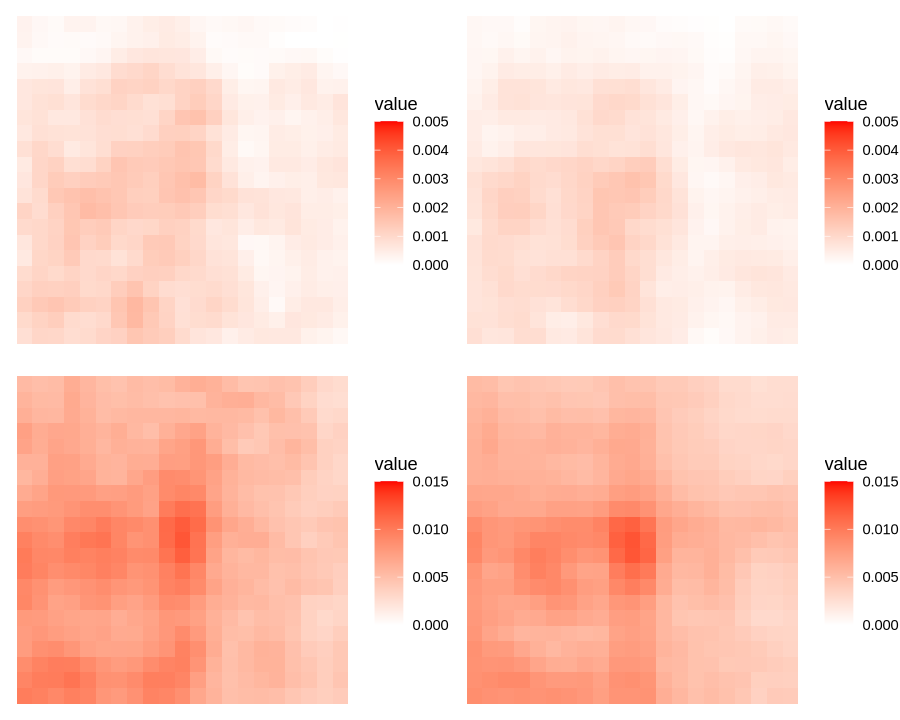

In [836]:
### Read and plot APA to see whether signal changes
plist <- list()
ct <- 'Myeloid'
for (file in list.files("../../87.FNIH_DHC_IGM_240925/05.R/APA/diff_abc/", pattern = paste0("^", ct))){
    for (ffile in list.files(paste0("../../87.FNIH_DHC_IGM_240925/05.R/APA/diff_abc/", file), pattern = paste0("^", ct))){
        tmp <- read.csv(paste0("../../87.FNIH_DHC_IGM_240925/05.R/APA/diff_abc/", file, "/", ffile, "/10000/gw/APA.txt"), header = F)
        tmp$V1 <- gsub("\\[", "", tmp$V1) %>% as.numeric
        tmp$V21 <- gsub("\\]", "", tmp$V21) %>% as.numeric
        plist[[paste0(file, ":", ffile)]] <- tmp
    }
}

pplist <- list()
for (i in 1:length(plist)){
    name <- stringr::str_split_fixed(names(plist)[i], pattern = ":", n = 2)
    pplist[[i]] <- plist[[i]] %>% mutate(id = colnames(.)) %>%
    reshape2::melt() %>% 
    mutate(id = as.integer(gsub("V", "", id))) %>% arrange(id) %>% 
    mutate(variable = as.integer(gsub("V", "", variable))) %>% arrange(variable) %>% 
    ggplot(aes(x = variable, y = -id, fill = value)) + 
    geom_tile() + NoLegend() + theme_void() + 
    xlab(name[1]) + ylab(name[2]) #+ scale_fill_gradientn(colours = c("white", "red"), limits = c(0, 0.015))
}

options(repr.plot.width = 7.5, repr.plot.height = 6)
t1 <- cowplot::plot_grid(plotlist = lapply(pplist[1:2], function(x) x + scale_fill_gradientn(colours = c("white", "red"), limits = c(0, 0.005))), 
                   ncol = 2)

t2 <- cowplot::plot_grid(plotlist = lapply(pplist[3:4], function(x) x + scale_fill_gradientn(colours = c("white", "red"), limits = c(0, 0.015))), 
                   ncol = 2)

fig1 <- cowplot::plot_grid(t1, t2, nrow = 2)
                         
fig1
ggsave(fig1, filename = paste0("plot/FIG_", ct, "_up_down_ATAC_abc_APA.pdf"), 
       dpi = 300, height = 3, width = 7)

Warning message in geom_point(position = position_jitterdodge(), width = 0.1, color = "grey", :
“Ignoring unknown parameters: `width`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


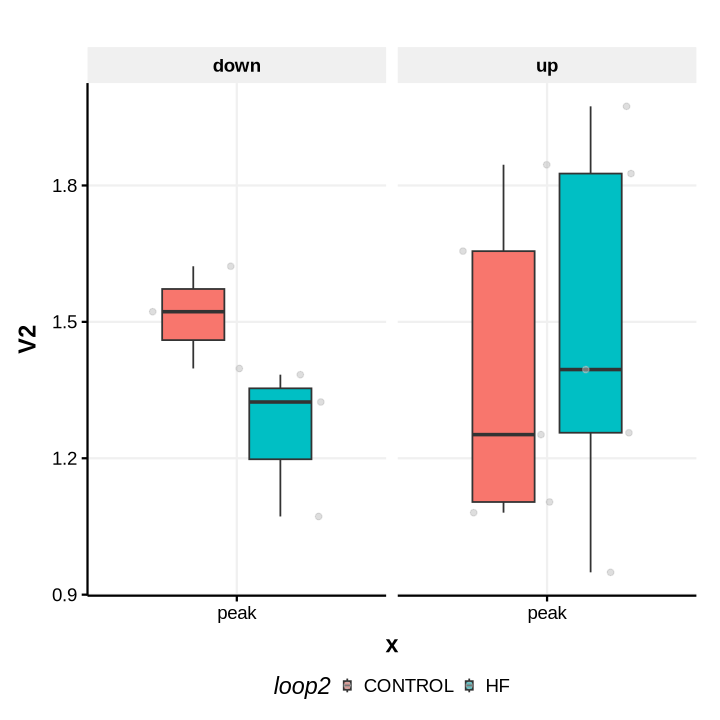

In [734]:
### Only plot score?
plist <- list()
for (file in list.files("../../87.FNIH_DHC_IGM_240925/05.R/APA/diff_abc/")){
    f <- gsub("^([^_]+)_([^_]+)$", "\\1", file)
    for (ffile in list.files(paste0("../../87.FNIH_DHC_IGM_240925/05.R/APA/diff_abc/", file), pattern = paste0("^", f))){
        tryCatch({
            tmp <- read.csv(paste0("../../87.FNIH_DHC_IGM_240925/05.R/APA/diff_abc/", file, "/", ffile, "/10000/gw/measures.txt"), header = F, sep = "\t") %>%
            mutate(loop = ffile, peak = file)
            plist[[paste0(file, ":", ffile)]] <- tmp
        }, error = function(e) {
            NULL  
        })
    }
}
plist <- do.call(rbind,plist)

validf <- merge(atacde, abc, by = "range") %>%
filter(celltype == CellType) %>%
mutate(direction = ifelse(log2FoldChange > 0, "up", "down")) %>%
dplyr::select(celltype, direction) %>% 
table %>%
as.data.frame %>%
mutate(value = ifelse(direction == "up", Freq, -Freq)) %>%
filter(Freq >= 150) %>%
mutate(class = paste0(celltype, "_", direction)) %>%
dplyr::select(class) %>% unlist %>% as.character

# length(validf)

options(repr.plot.width = 6, repr.plot.height = 6)
t1 <- plist %>% filter(peak %in% validf) %>%
filter(V1 == "P2LL") %>%
mutate(peak2 = gsub("([^_]+)_([^_]+)", "\\2", peak)) %>%
mutate(loop2 = gsub("([^_]+)_([^_]+)", "\\2", loop)) %>%
ggplot(aes(x = "peak", y = V2, fill = loop2)) +
geom_boxplot(width = 0.5, coef = 2, outlier.shape = NA, position = position_dodge(width = 0.7)) +
geom_point(position = position_jitterdodge(), width = 0.1, color = "grey", alpha = 0.5) + 
# geom_jitter(aes(group = loop2), color = "grey", alpha = 0.5) + 
theme_Publication() + 
facet_grid(. ~ peak2)

t1

ggsave(t1, filename = paste0("plot/FIG_DA_ATAC_abc_APA.pdf"), 
       dpi = 300, height = 6, width = 6) ### Too few points!!!

In [1013]:
### Target genes of the up- and down-pairs
clist1 <- clist2 <- list()
for (f in korder){ #unique(diffpair1$celltype.x)
    print(f)
    qgene <- do.call(rbind, flist) %>%
    filter(CellType %in% c(f), color %in% c("atacde", "bothde")) %>%
    filter(lfc_atac > 0) %>%
    dplyr::select(TargetGene) %>% unlist %>% unique
    
    print(length(qgene))
    
    qtable <- enrichGO(gene = qgene,
                OrgDb = org.Hs.eg.db,
                keyType = 'SYMBOL',
                ont = "BP", # biological process
                pAdjustMethod = "BH", 
                pvalueCutoff = 0.05, 
                qvalueCutoff = 0.05, 
                readable = TRUE)
    clist1[[f]] <- qtable@result %>% mutate(celltype = f, group = "up")
    
    qgene <- do.call(rbind, flist) %>%
    filter(CellType %in% c(f), color %in% c("atacde", "bothde")) %>%
    filter(lfc_atac < 0) %>% #, lfc_atac * lfc_gene > 0
    dplyr::select(TargetGene) %>% unlist %>% unique
    
    print(length(qgene))

    qtable <- enrichGO(gene = qgene,
                OrgDb = org.Hs.eg.db,
                keyType = 'SYMBOL',
                ont = "BP", # biological process
                pAdjustMethod = "BH", 
                pvalueCutoff = 0.05, 
                qvalueCutoff = 0.05, 
                readable = TRUE)
    clist2[[f]] <- qtable@result %>% mutate(celltype = f, group = "down")
}

[1] "vCM"
[1] 207
[1] 893
[1] "aCM"
[1] 127
[1] 72
[1] "Fibroblast"
[1] 287
[1] 524
[1] "Endothelial"
[1] 641
[1] 90
[1] "Myeloid"
[1] 674
[1] 45


In [1017]:
do.call(rbind, clist1) %>% filter(p.adjust < 0.05) %>% dplyr::select(celltype) %>% table
do.call(rbind, clist2) %>% filter(p.adjust < 0.05) %>% dplyr::select(celltype) %>% table

lapply(clist1, nrow) %>% as.data.frame
lapply(clist2, nrow) %>% as.data.frame

celltype
        aCM Endothelial  Fibroblast     Myeloid         vCM 
          1           1           7         235          28 

celltype
Fibroblast        vCM 
        33        162 

vCM,aCM,Fibroblast,Endothelial,Myeloid
<int>,<int>,<int>,<int>,<int>
1941,1691,2963,4255,4632


vCM,aCM,Fibroblast,Endothelial,Myeloid
<int>,<int>,<int>,<int>,<int>
4494,1169,4256,1505,1177


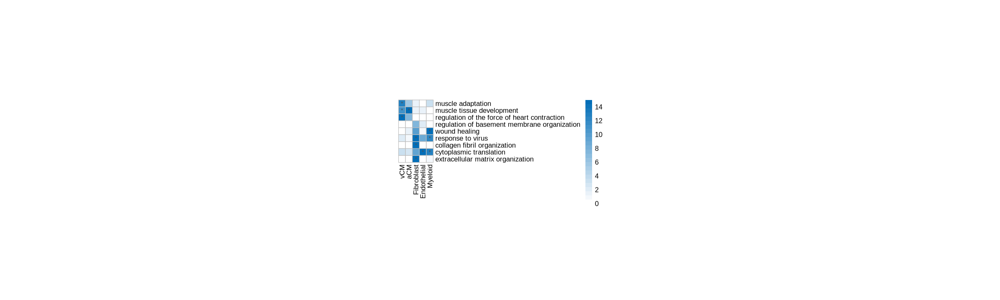

In [1021]:
order <- c('vCM', 'aCM', 'Pericyte', 'Fibroblast', 'Endothelial', 'Myeloid')
# qterm1 <- do.call(rbind, clist1) %>% filter(p.adjust < 0.05) %>%
# group_by(celltype) %>%
# slice_max(order_by = -log10(pvalue), n = 5) %>% ungroup %>%
# dplyr::select(Description) %>% unlist %>% as.character %>% unique

qterm1 <- c("muscle adaptation", "muscle tissue development", "regulation of the force of heart contraction",
            "regulation of basement membrane organization", "wound healing", "response to virus", "collagen fibril organization",
            "cytoplasmic translation", "extracellular matrix organization")

tmp <- do.call(rbind, clist1) %>% 
reshape2::dcast(Description ~ celltype, value.var = "pvalue", fun.aggregate = mean) %>%
tibble::column_to_rownames("Description")
tmp[is.na(tmp)] <- 1
tmp <- -log2(tmp)

ttp <- tmp[c(qterm1), korder]
ttp[ttp > 15] <- 15

lmat <- do.call(rbind, clist1) %>% 
mutate(value = p.adjust) %>%
reshape2::dcast(Description ~ celltype, value.var = "value", fun.aggregate = mean) %>%
tibble::column_to_rownames("Description") 

lmat[is.na(lmat)] <- 1
lmat <- ifelse(lmat < 0.05, "*", "")

t1 <- ttp %>%
pheatmap(cluster_cols = F, cluster_rows = F, border_color = "gray", angle_col = 90, cellwidth = 10, cellheight = 10,
         display_numbers = lmat[rownames(ttp), colnames(ttp)], # breaks = seq(-4,4,0.4),
         color = colorRampPalette(c("white", "#036EB8"))(25))

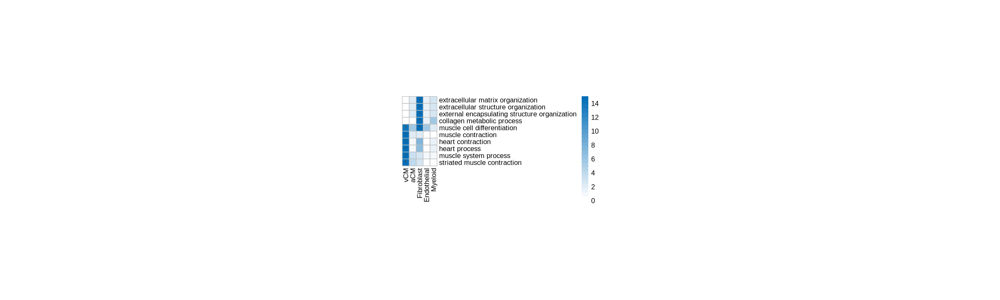

In [1022]:
order <- c('vCM', 'aCM', 'Pericyte', 'Fibroblast', 'Endothelial', 'Myeloid')
qterm1 <- do.call(rbind, clist2) %>% filter(p.adjust < 0.05) %>%
group_by(celltype) %>%
slice_max(order_by = -log10(pvalue), n = 5) %>% ungroup %>%
dplyr::select(Description) %>% unlist %>% as.character %>% unique

tmp <- do.call(rbind, clist2) %>% 
reshape2::dcast(Description ~ celltype, value.var = "pvalue", fun.aggregate = mean) %>%
tibble::column_to_rownames("Description")
tmp[is.na(tmp)] <- 1
tmp <- -log2(tmp)

ttp <- tmp[c(qterm1), korder]
ttp[ttp > 15] <- 15

lmat <- do.call(rbind, clist2) %>% 
mutate(value = p.adjust) %>%
reshape2::dcast(Description ~ celltype, value.var = "value", fun.aggregate = mean) %>%
tibble::column_to_rownames("Description") 

lmat[is.na(lmat)] <- 1
lmat <- ifelse(lmat < 0.05, "*", "")

t2 <- ttp %>%
pheatmap(cluster_cols = F, cluster_rows = F, border_color = "gray", angle_col = 90, cellwidth = 10, cellheight = 10,
         display_numbers = lmat[rownames(ttp), colnames(ttp)], # breaks = seq(-4,4,0.4),
         color = colorRampPalette(c("white", "#036EB8"))(25))

In [1023]:
ggsave(t1, filename = paste0("plot/FIG_DA_ATAC_abc_target_gene_up_enrichGO.pdf"), dpi = 300, height = 10, width = 7)
ggsave(t2, filename = paste0("plot/FIG_DA_ATAC_abc_target_gene_down_enrichGO.pdf"), dpi = 300, height = 10, width = 7)

# ggsave(t1, filename = paste0("plot/FIG_DA_ATAC_abc_target_gene_up_enrichGO_complete.pdf"), dpi = 300, height = 10, width = 10)
# ggsave(t2, filename = paste0("plot/FIG_DA_ATAC_abc_target_gene_down_enrichGO_complete.pdf"), dpi = 300, height = 10, width = 10)

Using celltype as id variables

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Using celltype as id variables

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


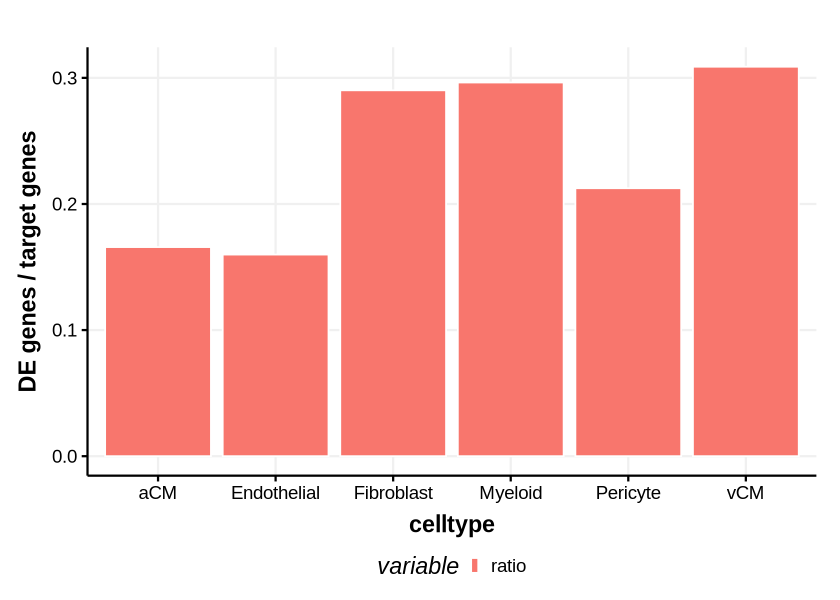

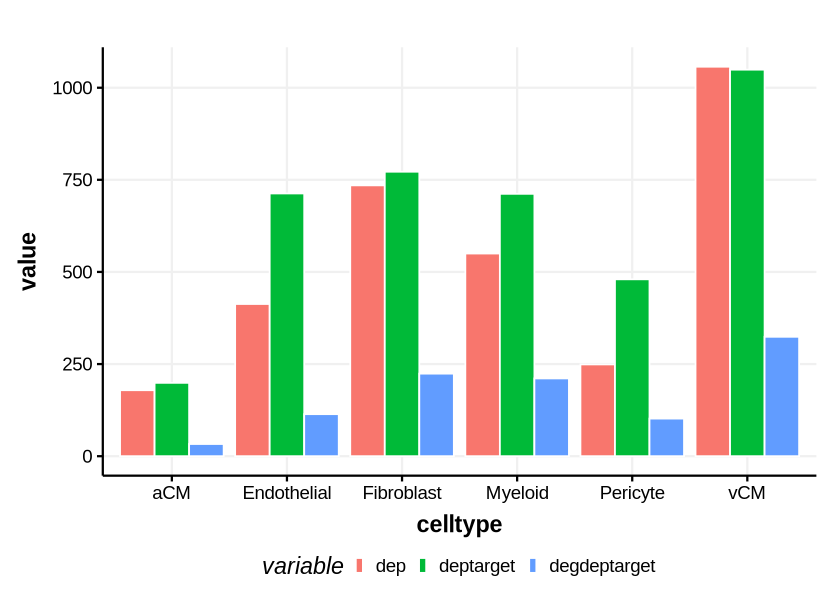

In [434]:
### How many targeting genes of DA peaks are DE?
korder <- c("aCM","Endothelial","Fibroblast","Myeloid", "Pericyte","vCM")

lsumm <- list()
for (f in korder){ #unique(diffpair1$celltype.x)
#     print(f)
    qregion <- atacde %>% filter(celltype == f) %>% dplyr::select(range) %>% unlist
    qgene <- genede %>% filter(celltype == f) %>% dplyr::select(gene) %>% unlist
    qabc <- abc %>% filter(CellType == f)
    tpair <- merge(atacde, abc, by = "range") %>%
    filter(CellType == f, celltype == f) %>% dplyr::select(range, TargetGene) %>% distinct
    lsumm[[f]] <- data.frame(dep = length(unique(tpair$range)), deptarget = length(unique(tpair$TargetGene)),
                             degdeptarget = length(intersect(qgene, unique(tpair$TargetGene))), celltype = f)
}

options(repr.plot.width = 7, repr.plot.height = 5)
do.call(rbind, lsumm) %>%
mutate(ratio = degdeptarget/deptarget) %>%
reshape2::melt() %>%
filter(variable == 'ratio') %>%
ggplot(aes(x = celltype, y = value, fill = variable)) +
geom_col(position = "dodge", color = "white") + 
theme_Publication() + ylab("DE genes / target genes")

do.call(rbind, lsumm) %>%
mutate(ratio = degdeptarget/deptarget) %>%
reshape2::melt() %>%
filter(variable != 'ratio') %>%
ggplot(aes(x = celltype, y = value, fill = variable)) +
geom_col(position = "dodge", color = "white") + 
theme_Publication()

In [ ]:
atacder <- read.table("../reference/Multiome_Downstream/CHAMBER/4chambers_DESEQ2_ATAC.dds.res", header = T) %>%
setNames(c("celltype", "contrast", "range", "log2FoldChange", "stat", "pvalue", "padj"))

geneder <- read.table("../reference/Multiome_Downstream/CHAMBER/4chambers_DESEQ2_RNA.dds.res", header = T) %>%
setNames(c("celltype", "contrast", "gene", "log2FoldChange", "stat", "pvalue", "padj"))

plist <- list()
for (f in korder){
    qqq <- abc %>% filter(CellType == f)
    qregion <- atacde %>% filter(celltype == f) %>% filter(abs(log2FoldChange) > 0) %>% dplyr::select(range) %>% unlist
    qgene <- genede %>% filter(celltype == f) %>% filter(abs(log2FoldChange) > 0) %>% dplyr::select(gene) %>% unlist

    qgeneder <- geneder %>% filter(celltype == f)
    qatacder <- atacder %>% filter(celltype == f)
    qqq$lfc_gene <- qgeneder[match(qqq$TargetGene, qgeneder$gene),]$log2FoldChange
    qqq$lfc_atac <- qatacder[match(qqq$range, qatacder$range),]$log2FoldChange

    options(repr.plot.width = 7, repr.plot.height = 5)
    t1 <- qqq %>% 
    mutate(color = ifelse(TargetGene %in% qgene, "genede", "none")) %>%
    mutate(color = ifelse(range %in% qregion, "atacde", color)) %>%
    mutate(color = ifelse((range %in% qregion) & (TargetGene %in% qgene), "bothde", color)) %>%
    ggplot(aes(x = lfc_atac, y = lfc_gene, fill = color)) + 
    geom_point(color = "white", stroke = 1, shape = 21) + 
    theme_Publication() + ggtitle(f) + 
    scale_fill_manual(values = c("#036EB8", "#3636CC", "#59b4a2", "grey"))

    print(f)
    print(cor.test(qqq$lfc_atac, qqq$lfc_gene, method = "spearman"))
    
    qregion1 <- atacde %>% filter(celltype == f) %>% filter(log2FoldChange > 0) %>% dplyr::select(range) %>% unlist
    qregion2 <- atacde %>% filter(celltype == f) %>% filter(log2FoldChange < 0) %>% dplyr::select(range) %>% unlist
    t2 <- qqq %>%
    mutate(class = ifelse(range %in% qregion1, "up", "none")) %>%
    mutate(class = ifelse(range %in% qregion2, "down", class)) %>%
    ggplot(aes(x = class, y = lfc_gene, fill = class)) + 
    geom_violin() + 
    geom_boxplot(fill = "white", width = 0.2, coef = 2, 
                 outlier.shape = NA, alpha = 0.8) +
    theme_Publication() + ylab("GEX log2FC") + ggtitle(f) + 
    scale_fill_manual(values = c("#258DB7", "grey", "#32748E")) 
    
    plist[[f]] <- cowplot::plot_grid(t1, t2, ncol = 2)
}

fig <- cowplot::plot_grid(plotlist = plist, nrow = length(plist))
ggsave(fig, filename = "plot/FIG_abc_DEatac_DEgene_relationship_log2FC0.pdf", dpi = 300, height = 24, width = 8)

In [172]:
### are DE genes more likely to be target of DE peaks?
plist <- list()
for (f in korder){
    qregion <- atacde %>% filter(celltype == f) %>% filter(abs(log2FoldChange) >= 0.5) %>% dplyr::select(range) %>% unlist
    qgene <- genede %>% filter(celltype == f) %>% filter(abs(log2FoldChange) >= 0.5) %>% dplyr::select(gene) %>% unlist
    qabc <- abc %>% filter(CellType == f)
    cst <- qabc %>%  ›
    mutate(derange = ifelse(range %in% qregion, "TRUE", "FALSE")) %>%
    mutate(degene = ifelse(TargetGene %in% qgene, "TRUE", "FALSE")) %>%
    dplyr::select(derange, degene) %>% table %>% chisq.test
    plist[[f]] <- data.frame(celltype = f, pvalue = cst$p.value, 
                             degene = length(qgene), depeak = length(qregion))
}

do.call(rbind, plist)

,celltype,pvalue,degene,depeak
,<chr>,<dbl>,<int>,<int>
vCM,vCM,3.011724e-07,4028,16927
aCM,aCM,7.862184e-09,748,3530
Pericyte,Pericyte,8.409271e-05,1019,1114
Fibroblast,Fibroblast,2.199935e-14,2370,16043
Endothelial,Endothelial,2.154879e-06,1085,2125
Myeloid,Myeloid,4.129617e-37,2162,3379


Using celltype as id variables

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“Removed 1 row containing missing values or values outside the scale range (`geom_col()`).”
Using celltype as id variables

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


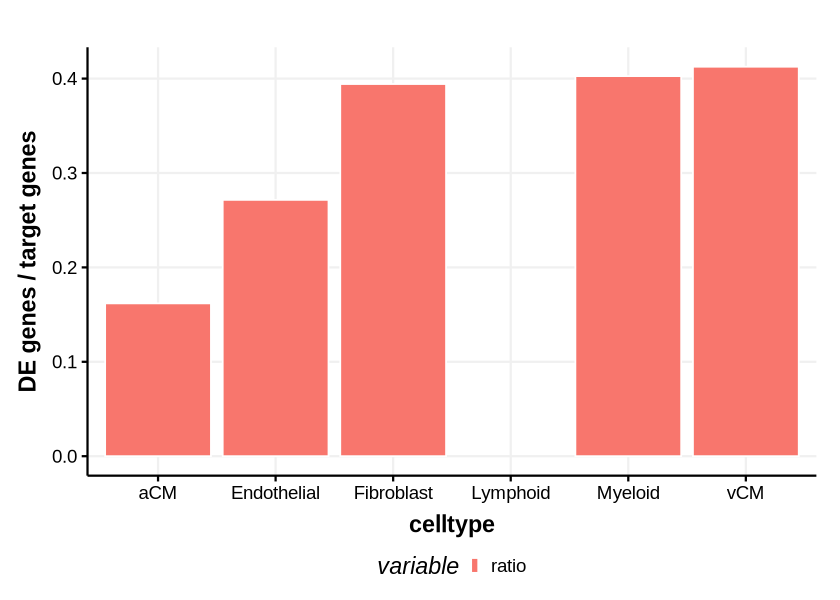

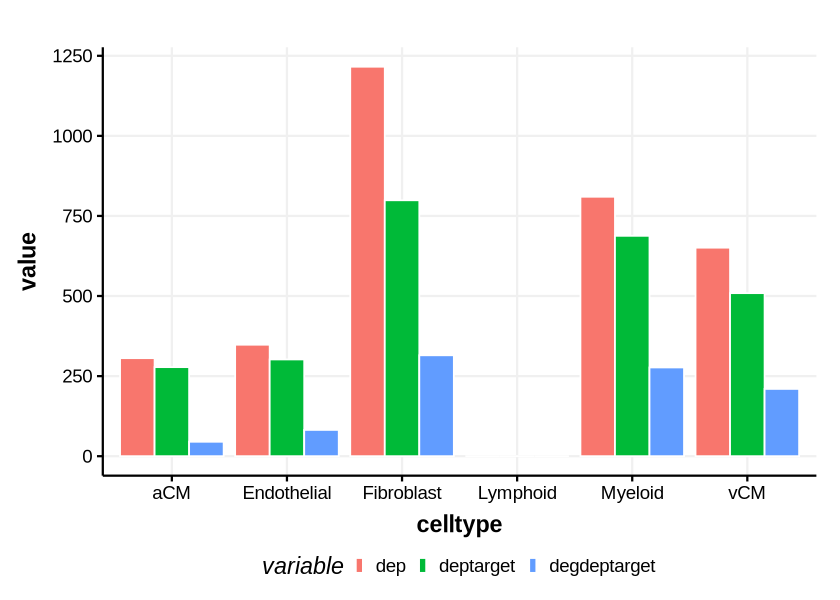

In [74]:
### Compare DE peaks targeting genes to SCENIC+?
### How many targeting genes of DA peaks are DE?
lsumm <- list()
for (f in list.files("GRN/scenicplus/")){
    ct <- grep(f, corder, value = T)[1]
    elist <- read.csv(paste0("GRN/scenicplus/", f, "/edges_R2G.csv")) %>% filter(is_extended == "False")
    qregion <- atacde %>% filter(celltype == ct) %>% filter(abs(log2FoldChange) >= 0.5) %>% select(range) %>% unlist
    qgene <- genede %>% filter(celltype == ct) %>% filter(abs(log2FoldChange) >= 0.5) %>% select(gene) %>% unlist
    tpair <- elist %>% filter(Region %in% sub("-", ":", qregion)) %>% select(Region,Gene) %>% distinct
    lsumm[[f]] <- data.frame(dep = length(unique(tpair$Region)), deptarget = length(unique(tpair$Gene)),
                             degdeptarget = length(intersect(qgene, unique(tpair$Gene))), celltype = ct)
}

options(repr.plot.width = 7, repr.plot.height = 5)
do.call(rbind, lsumm) %>%
mutate(ratio = degdeptarget/deptarget) %>%
reshape2::melt() %>%
filter(variable == 'ratio') %>%
ggplot(aes(x = celltype, y = value, fill = variable)) +
geom_col(position = "dodge", color = "white") + 
theme_Publication() + ylab("DE genes / target genes")

do.call(rbind, lsumm) %>%
mutate(ratio = degdeptarget/deptarget) %>%
reshape2::melt() %>%
filter(variable != 'ratio') %>%
ggplot(aes(x = celltype, y = value, fill = variable)) +
geom_col(position = "dodge", color = "white") + 
theme_Publication()

In [232]:
lsumm <- list()
for (f in list.files("GRN/scenicplus/")){
    ct <- grep(f, corder, value = T)[1]
    elist <- read.csv(paste0("GRN/scenicplus/", f, "/edges_R2G.csv")) %>% filter(is_extended == "False")
    qregion <- atacde %>% filter(celltype == ct) %>% filter(abs(log2FoldChange) >= 0.5) %>% dplyr::select(range) %>% unlist
    tpair <- elist %>% filter(Region %in% sub("-", ":", qregion)) %>% dplyr::select(Region,Gene) %>% distinct
    tpair2 <- abc %>% filter(CellType == ct) %>% filter(range %in% qregion) %>%
    dplyr::select(range, TargetGene) %>% distinct %>% 
    mutate(range = sub("-", ":", range))
    lsumm[[f]] <- data.frame(scenicpeak = length(unique(tpair$Region)), abcpeak = length(unique(tpair2$range)),
                             sharepeak = length(intersect(unique(tpair$Region),unique(tpair2$range))), 
                             celltype = ct)
}

In [233]:
do.call(rbind, lsumm)

,scenicpeak,abcpeak,sharepeak,celltype
,<int>,<int>,<int>,<chr>
aCM,306,154,31,aCM
Endo,348,332,96,Endothelial
Fibro,1216,608,146,Fibroblast
Lymphoid,0,0,0,Lymphoid
Myeloid,810,510,234,Myeloid
vCM,651,345,42,vCM


In [75]:
### What are the DA peaks targeting genes? abc & scenic+
glist1 <- glist2 <- clist1 <- clist2 <- list()
for (ct in list.files("GRN/scenicplus/")){ #unique(diffpair1$celltype.x)
    f <- grep(ct, corder, value = T)[1]
    if (f == "Lymphoid"){
        next
    }
    print(f)
    elist <- read.csv(paste0("GRN/scenicplus/", ct, "/edges_R2G.csv")) %>% filter(is_extended == "False")
    qregion <- atacde %>% filter(celltype == f) %>% filter((log2FoldChange) >= 0.5) %>% dplyr::select(range) %>% unlist
    tpair <- abc %>% filter(celltype == f, range %in% qregion) %>% dplyr::select(range, gene) %>% distinct
    tpair2 <- elist %>% filter(Region %in% sub("-", ":", qregion)) %>% dplyr::select(Region, Gene) %>% distinct
    qgene <- intersect(unique(tpair$gene), unique(tpair2$Gene))
#     print(length(qgene))
    qtable <- enrichr(unique(tpair2$Gene), dbs)
    clist1[[f]] <- qtable[[1]] %>% filter(Adjusted.P.value < 0.05) %>% mutate(celltype = f, group = "up")
    glist1[[f]] <- qgene
    qregion <- atacde %>% filter(celltype == f) %>% filter(log2FoldChange <= -0.5) %>% dplyr::select(range) %>% unlist
    tpair <- abc %>% filter(celltype == f, range %in% qregion) %>% dplyr::select(range, gene) %>% distinct
    tpair2 <- elist %>% filter(Region %in% sub("-", ":", qregion)) %>% dplyr::select(Region, Gene) %>% distinct
    qgene <- intersect(unique(tpair$gene), unique(tpair2$Gene))
#     print(length(qgene))
    qtable <- enrichr(unique(tpair2$Gene), dbs)
    clist2[[f]] <- qtable[[1]] %>% filter(Adjusted.P.value < 0.05) %>% mutate(celltype = f, group = "down")
    glist2[[f]] <- qgene
}

lapply(clist1, nrow) %>% as.data.frame
lapply(clist2, nrow) %>% as.data.frame

[1] "aCM"
Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2021... Done.
Parsing results... Done.
Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2021... Done.
Parsing results... Done.
[1] "Endothelial"
Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2021... Done.
Parsing results... Done.
Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2021... Done.
Parsing results... Done.
[1] "Fibroblast"
Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2021... Done.
Parsing results... Done.
Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2021... Done.
Parsing results... Done.
[1] "Myeloid"
Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2021... Done.
Parsing results... Done.
Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2021... Done.
Parsing results... Done.
[1] "vCM"
Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2021...

aCM,Endothelial,Fibroblast,Myeloid,vCM
<int>,<int>,<int>,<int>,<int>
14,75,136,143,97


aCM,Endothelial,Fibroblast,Myeloid,vCM
<int>,<int>,<int>,<int>,<int>
0,38,77,16,14


Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


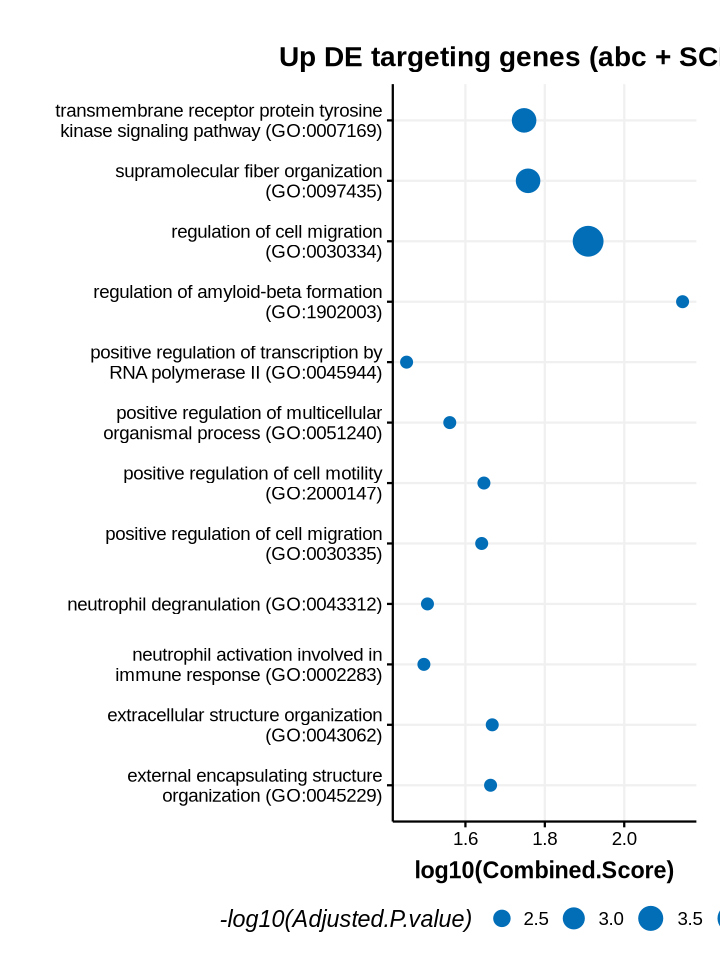

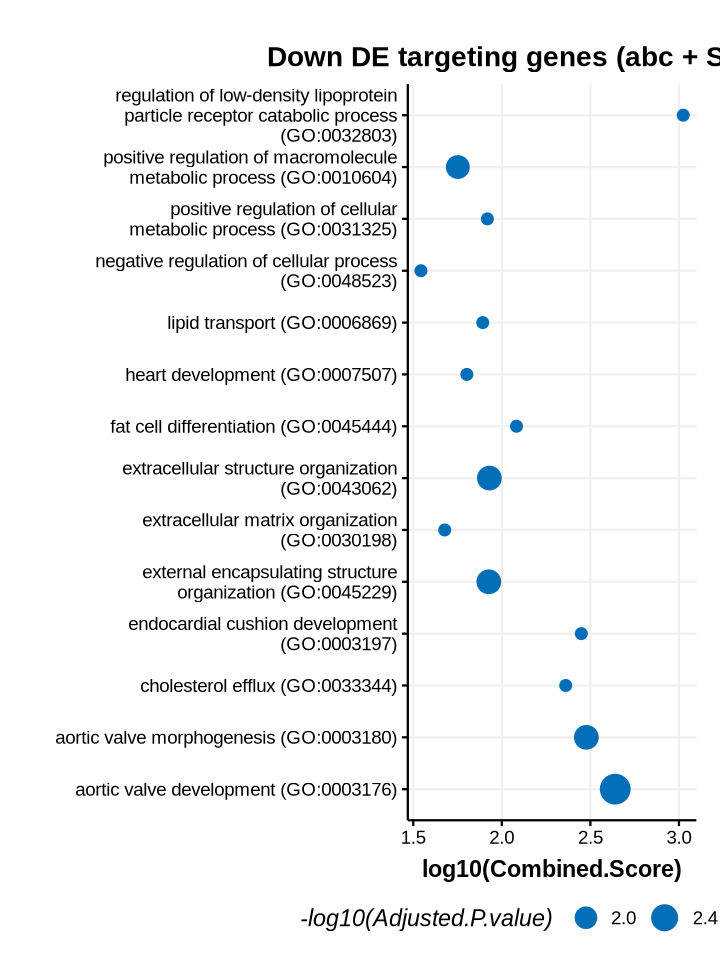

In [271]:
options(repr.plot.width = 6, repr.plot.height = 8)
upda %>% 
slice_max(order_by = -log10(Adjusted.P.value), n = 10) %>%
# mutate(Term = factor(Term, levels = rev(torder))) %>%
ggplot(aes(y = Term, x = log10(Combined.Score))) + 
geom_point(aes(size = -log10(Adjusted.P.value)), color = "#036EB8") + 
scale_size(range = c(3, 8)) + 
theme_Publication() + ylab("") + ggtitle("Up DE targeting genes (abc + SCENIC+)") + 
scale_y_discrete(labels = label_wrap(40))

downda %>% 
slice_max(order_by = -log10(Adjusted.P.value), n = 10) %>%
# mutate(Term = factor(Term, levels = rev(torder))) %>%
ggplot(aes(y = Term, x = log10(Combined.Score))) + 
geom_point(aes(size = -log10(Adjusted.P.value)), color = "#036EB8") + 
scale_size(range = c(3, 8)) + 
theme_Publication() + ylab("") + ggtitle("Down DE targeting genes (abc + SCENIC+)") + 
scale_y_discrete(labels = label_wrap(40))

## HF-associated TF from SCENIC+

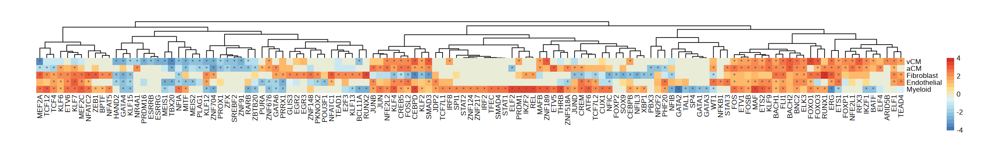

In [1067]:
### fGSEA of SCENIC+ peaks in HF versus CONTROL
# fgsea_results <- list()
# for (f in list.files("GRN/scenicplus/")){
#     ct <- grep(f, corder, value = T)[1]
#     elist <- read.csv(paste0("GRN/scenicplus/", f, "/edges_R2G.csv")) %>% filter(is_extended == "False")
#     rpeak <- read.table(paste0("../reference/FNIH_peaks/unified_peaks/", ct, "_UnifiedFiltVariable.bed")) %>%
#     mutate(range = paste0(V1, ":", V2, "-", V3))
#     elist <- elist %>% filter(Region %in% rpeak$range) ### retain peaks within that celltype
#     tfr <- stringr::str_split_fixed(elist$Consensus_name, pattern = "_", n = 3)[,1] %>% unique
#     grnlist <- list()
#     for (tf in tfr){
#         grnlist[[tf]] <- elist %>% filter(Consensus_name == paste0(tf, "_+_+")) %>% dplyr::select(Region) %>% unlist %>% unique
#     }
#     ranked_genes <- read.table("../reference/Multiome_Downstream/CHAMBER/4chambers_DESEQ2_ATAC.dds.res", header = T) %>%
#     setNames(c("celltype", "contrast", "range", "log2FoldChange", "stat", "pvalue", "padj")) %>% 
#     filter(celltype == ct) %>% arrange(desc(stat)) %>%
#     mutate(range = sub("-", ":", range)) %>%
#     dplyr::select(range, stat) %>% tibble::deframe()
    
#     fgsea_results[[ct]] <- fgsea(pathways = grnlist, stats = ranked_genes, nperm = 10000)
#     fgsea_results[[ct]]$celltype <- ct
# }

qpathway <- do.call(rbind, fgsea_results) %>%
group_by(pathway) %>%
filter(min(padj) < 0.05) %>%
ungroup() %>%
dplyr::select(pathway) %>% unlist %>% unique

rmat <- do.call(rbind, fgsea_results) %>%
filter(pathway %in% qpathway) %>%
mutate(value = NES) %>%
reshape2::dcast(celltype ~ pathway, value.var = "value") %>%
tibble::column_to_rownames("celltype") 

rmat <- rmat[c('vCM','aCM','Fibroblast','Endothelial','Myeloid'),] %>% t
rmat[is.na(rmat)] <- 0

lmat <- do.call(rbind, fgsea_results) %>%
filter(padj < 0.05) %>%
mutate(value = padj) %>%
reshape2::dcast(celltype ~ pathway, value.var = "value") %>%
tibble::column_to_rownames("celltype") 

lmat <- lmat[c('vCM','aCM','Fibroblast','Endothelial','Myeloid'),]
lmat[is.na(lmat)] <- 1
lmat <- ifelse(lmat < 0.05, "*", "")

options(repr.plot.width = 20, repr.plot.height = 3)
rmat <- rmat[apply(rmat, 1, function(x) max(abs(x)) >= 2),] %>% t
                   
t1 <- rmat %>%
pheatmap(cluster_rows = F, border_color = NA, angle_col = 90, cellwidth = 10, cellheight = 10,
         display_numbers = lmat[,colnames(rmat)], breaks = seq(-4,4,0.4),
         color = rev(colorRampPalette(brewer.pal(n = 8, name = "RdYlBu"))(20)))
                   
# ggsave(t1, filename = "plot/FIG_SCENIC_HF_vs_CONTROL_fgsea_absNES2_heatmap.pdf", dpi = 300, height = 3, width = 20)
# write.table(rmat, "plot/FIG_SCENIC_HF_vs_CONTROL_fgsea_absNES2_heatmap.txt", sep = "\t", quote = F, row.names = T, col.names = T)

In [634]:
# rmat <- read.table("plot/FIG_SCENIC_HF_vs_CONTROL_fgsea_absNES2_heatmap.txt", header = T, row.names = 1)

In [1068]:
### check GRN associated peaks / GEX
atacder <- read.table("../reference/Multiome_Downstream/CHAMBER/4chambers_DESEQ2_ATAC.dds.res", header = T) %>%
setNames(c("celltype", "contrast", "range", "log2FoldChange", "stat", "pvalue", "padj"))

geneder <- read.table("../reference/Multiome_Downstream/CHAMBER/4chambers_DESEQ2_RNA.dds.res", header = T) %>%
setNames(c("celltype", "contrast", "gene", "log2FoldChange", "stat", "pvalue", "padj"))

grnglist <- grnplist <- list()
for (f in list.files("GRN/scenicplus/")){
    ct <- grep(f, corder, value = T)[1]
    elist <- read.csv(paste0("GRN/scenicplus/", f, "/edges_R2G.csv")) %>% filter(is_extended == "False")
    rpeak <- read.table(paste0("../reference/FNIH_peaks/unified_peaks/", ct, "_UnifiedFiltVariable.bed")) %>%
    mutate(range = paste0(V1, ":", V2, "-", V3))
    elist <- elist %>% filter(Region %in% rpeak$range) ### retain peaks within that celltype
    tfr <- stringr::str_split_fixed(elist$Consensus_name, pattern = "_", n = 3)[,1] %>% unique
    
    glist <- plist <- list()
    for (tf in tfr){
        qregion <- elist %>% filter(Consensus_name == paste0(tf, "_+_+")) %>% dplyr::select(Region) %>% unlist %>% unique
        qgene <- elist %>% filter(Consensus_name == paste0(tf, "_+_+")) %>% dplyr::select(Gene) %>% unlist %>% unique
        plist[[tf]] <- atacder %>% filter(celltype == ct) %>% mutate(range = sub("-", ":", range)) %>%
        filter(range %in% qregion) %>% dplyr::select(log2FoldChange) %>% 
        summarise(medianl = median(log2FoldChange), meanl = mean(log2FoldChange))
        glist[[tf]] <- geneder %>% filter(celltype == ct) %>% 
        filter(gene %in% qgene) %>% dplyr::select(log2FoldChange) %>% 
        summarise(medianl = median(log2FoldChange), meanl = mean(log2FoldChange))
    }
    grnglist[[ct]] <- do.call(rbind, plist) %>% mutate(celltype = ct)
    grnplist[[ct]] <- do.call(rbind, glist) %>% mutate(celltype = ct)
}

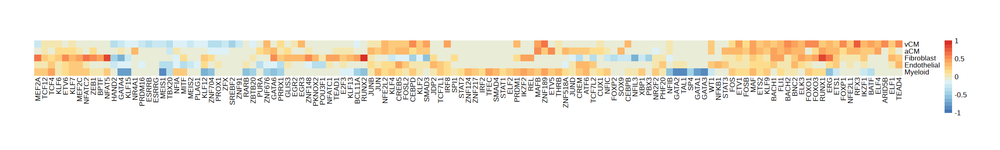

In [1071]:
tmat <- do.call(rbind, lapply(grnglist, function(x) x %>% tibble::rownames_to_column("pathway"))) %>%
mutate(value = meanl) %>%
reshape2::dcast(celltype ~ pathway, value.var = "value") %>%
tibble::column_to_rownames("celltype") 

tmat[is.na(tmat)] <- 0

options(repr.plot.width = 20, repr.plot.height = 3)
t2 <- tmat[rownames(rmat), t1$tree_col$labels[t1$tree_col$order]] %>%
pheatmap(cluster_rows = F, cluster_cols = F, breaks = seq(-1,1,0.1),
         border_color = NA, angle_col = 90, cellwidth = 10, cellheight = 10,
         color = rev(colorRampPalette(brewer.pal(n = 8, name = "RdYlBu"))(20)))
ggsave(t2, filename = "plot/FIG_SCENIC_HF_vs_CONTROL_fgsea_absNES2_TargetGene_FC_heatmap.pdf", dpi = 300, height = 3, width = 20)
write.table(tmat[rownames(rmat), t1$tree_col$labels[t1$tree_col$order]], 
            "plot/FIG_SCENIC_HF_vs_CONTROL_fgsea_absNES2_TargetGene_FC_heatmap.txt", sep = "\t", quote = F, row.names = T, col.names = T)

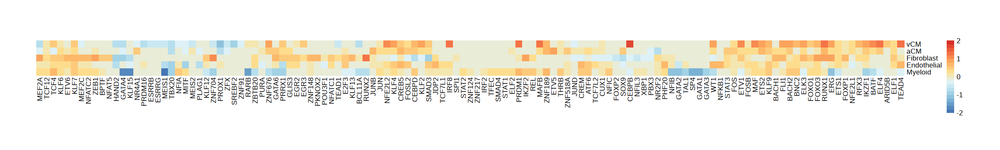

In [1072]:
tmat <- do.call(rbind, lapply(grnplist, function(x) x %>% tibble::rownames_to_column("pathway"))) %>%
mutate(value = meanl) %>%
reshape2::dcast(celltype ~ pathway, value.var = "value") %>%
tibble::column_to_rownames("celltype") 

tmat[is.na(tmat)] <- 0

options(repr.plot.width = 20, repr.plot.height = 3)
t3 <- tmat[rownames(rmat), t1$tree_col$labels[t1$tree_col$order]] %>%
pheatmap(cluster_rows = F, cluster_cols = F, breaks = seq(-2,2,0.2),
         border_color = NA, angle_col = 90, cellwidth = 10, cellheight = 10,
         color = rev(colorRampPalette(brewer.pal(n = 8, name = "RdYlBu"))(20)))
ggsave(t3, filename = "plot/FIG_SCENIC_HF_vs_CONTROL_fgsea_absNES2_TargetPeak_FC_heatmap.pdf", dpi = 300, height = 3, width = 20)
write.table(tmat[rownames(rmat), t1$tree_col$labels[t1$tree_col$order]], 
            "plot/FIG_SCENIC_HF_vs_CONTROL_fgsea_absNES2_TargetPeak_FC_heatmap.txt", sep = "\t", quote = F, row.names = T, col.names = T)

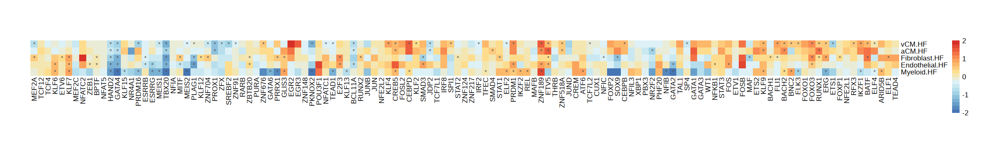

In [1073]:
### check GRN associated TFs
tflist <- list()
for (f in t1$tree_col$labels[t1$tree_col$order]){
    tflist[[f]] <- geneder %>% filter(gene == f) %>% filter(celltype %in% rownames(rmat)) %>% 
    dplyr::select(celltype, gene, log2FoldChange, padj)
}

m1 <- log2(rpkm[t1$tree_col$labels[t1$tree_col$order], paste0(rownames(rmat), ".HF")]/rpkm[t1$tree_col$labels[t1$tree_col$order], paste0(rownames(rmat), ".CONTROL")]) %>%
t %>% as.data.frame

lmat <- do.call(rbind, tflist) %>%
mutate(value = padj) %>%
reshape2::dcast(celltype ~ gene, value.var = "value") %>%
tibble::column_to_rownames("celltype") 

lmat[,setdiff(colnames(m1), colnames(lmat))] <- 1
lmat <- lmat[rownames(rmat),t1$tree_col$labels[t1$tree_col$order]]
lmat[is.na(lmat)] <- 1
lmat <- ifelse(lmat < 0.05, "*", "")

t4 <- m1 %>%
pheatmap(cluster_rows = F, cluster_cols = F, display_numbers = lmat, breaks = seq(-2,2,0.2),
         border_color = NA, angle_col = 90, cellwidth = 10, cellheight = 10,
         color = rev(colorRampPalette(brewer.pal(n = 8, name = "RdYlBu"))(20)))

ggsave(t4, filename = "plot/FIG_SCENIC_HF_vs_CONTROL_fgsea_absNES2_TF_FC_heatmap.pdf", dpi = 300, height = 3, width = 20)
write.table(m1, "plot/FIG_SCENIC_HF_vs_CONTROL_fgsea_absNES2_TF_FC_heatmap.txt", 
            sep = "\t", quote = F, row.names = T, col.names = T)

Using gene as id variables

Using gene as id variables

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


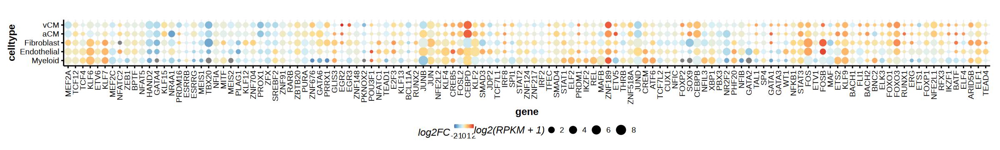

In [1074]:
m1 <- log2(rpkm[t1$tree_col$labels[t1$tree_col$order], paste0(rownames(rmat), ".HF")]/rpkm[t1$tree_col$labels[t1$tree_col$order], paste0(rownames(rmat), ".CONTROL")]) %>%
as.data.frame %>% tibble::rownames_to_column("gene") %>%
reshape2::melt() %>% mutate(variable = gsub(".HF", "", variable))

m2 <- rpkm[t1$tree_col$labels[t1$tree_col$order], paste0(rownames(rmat), ".CONTROL")] %>%
tibble::rownames_to_column("gene") %>%
reshape2::melt() %>% mutate(variable = gsub(".CONTROL", "", variable))

t5 <- merge(m1, m2, by = c("gene", "variable")) %>%
setNames(c("gene", "celltype", "log2FC", "RPKM")) %>%
mutate(celltype = factor(celltype, levels = rev(rownames(rmat)))) %>%
mutate(gene = factor(gene, levels = t1$tree_col$labels[t1$tree_col$order])) %>%
ggplot(aes(x = gene, y = celltype, size = log2(RPKM+1), color = log2FC)) + 
geom_point() + 
theme_Publication() + 
theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1)) + 
scale_color_gradientn(colors = rev(colorRampPalette(brewer.pal(n = 8, name = "RdYlBu"))(20)), 
                     limits = c(-2, 2))

t5
ggsave(t5, filename = "plot/FIG_SCENIC_HF_vs_CONTROL_fgsea_absNES2_TF_FC_dotmap.pdf", dpi = 300, height = 3.5, width = 21)
write.table(t5$data, "plot/FIG_SCENIC_HF_vs_CONTROL_fgsea_absNES2_TF_FC_dotmap.txt", 
            sep = "\t", quote = F, row.names = T, col.names = T)

In [1075]:
### Which TF show diff expression and also with TF/Control enriched targets?
f1 <- do.call(rbind, fgsea_results) %>%
filter(padj < 0.05) %>%
dplyr::select(c(pathway, NES, celltype)) %>%
setNames(c("gene", "NES", "celltype"))

f2 <- do.call(rbind, tflist) %>%
filter(padj < 0.05) %>%
dplyr::select(c(gene, log2FoldChange, celltype))

merge(f1, f2, by = c("gene", "celltype")) %>% head
merge(f1, f2, by = c("gene", "celltype")) %>% dim

gene,celltype,NES,log2FoldChange
<chr>,<chr>,<dbl>,<dbl>
ATF6,Myeloid,2.814263,0.8893278
BACH1,Fibroblast,2.788580,0.4076840
BACH2,aCM,3.143135,1.3221522
BACH2,vCM,3.134032,1.0826266
BATF,vCM,1.608295,1.5083377
BCL11A,vCM,-2.033817,-0.8797314


[1] 95  4

In [1076]:
merge(f1, f2, by = c("gene", "celltype")) %>%
mutate(pathway = ifelse(NES > 0, "up", "down")) %>%
mutate(TF = ifelse(log2FoldChange > 0, "up", "down")) %>%
dplyr::select(c(pathway, TF)) %>%
table

merge(f1, f2, by = c("gene", "celltype")) %>%
mutate(pathway = ifelse(NES > 0, "up", "down")) %>%
mutate(TF = ifelse(log2FoldChange > 0, "up", "down")) %>%
filter(pathway != TF)

### concordant changes of TF expression and TF activity

       TF
pathway down up
   down   36  0
   up      1 58

gene,celltype,NES,log2FoldChange,pathway,TF
<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>
ETS1,vCM,1.673301,-0.8128338,up,down


In [1077]:
upGRN <- merge(f1, f2, by = c("gene", "celltype")) %>%
mutate(pathway = ifelse(NES > 0, "up", "down")) %>%
mutate(TF = ifelse(log2FoldChange > 0, "up", "down")) %>%
filter(pathway == "up", TF == "up")

downGRN <- merge(f1, f2, by = c("gene", "celltype")) %>%
mutate(pathway = ifelse(NES > 0, "up", "down")) %>%
mutate(TF = ifelse(log2FoldChange > 0, "up", "down")) %>%
filter(pathway == "down", TF == "down")

table(upGRN$celltype)
table(downGRN$celltype)


        aCM Endothelial  Fibroblast     Myeloid         vCM 
          6           5          16          13          18 


        aCM Endothelial  Fibroblast     Myeloid         vCM 
          3           4           5          10          14 

In [1262]:
### classify: cell type specific TF? common TF?
tfclass <- rbind(downGRN, upGRN)[,c("gene", "celltype")] %>% 
distinct %>% 
group_by(gene) %>% 
summarise(freq = length(celltype)) %>%
mutate(class = ifelse(freq > 1, "shared", "specific")) 

In [1264]:
table(tfclass$class)
dual


  shared specific 
      23       41 

[1] "ERG"    "IKZF1"  "MEF2A"  "PRRX1"  "SMAD3"  "ZNF704"

In [1078]:
elist <- list()
for (f in list.files("GRN/scenicplus/")){
    ct <- grep(f, corder, value = T)[1]
    tmp <- read.csv(paste0("GRN/scenicplus/", f, "/edges_R2G.csv")) %>% 
    filter(is_extended == "False") %>% mutate(celltype = ct)
    rpeak <- read.table(paste0("../reference/FNIH_peaks/unified_peaks/", ct, "_UnifiedFiltVariable.bed")) %>%
    mutate(range = paste0(V1, ":", V2, "-", V3))
    elist[[ct]] <- tmp %>% filter(Region %in% rpeak$range) ### retain peaks within that celltype
}
elist <- do.call(rbind, elist)

tmp <- rbind(upGRN, downGRN)
tmp$Consensus_name <- paste0(tmp$gene, "_+_+")
tmp <- merge(elist, tmp, by = c("Consensus_name", "celltype")) %>%
dplyr::select(-X, -is_extended) 

write.table(tmp, "GRN/HF_associated_TF_GRN.tsv", 
            row.names = F, col.names = T, sep = "\t", quote = F)
write.table(upGRN, "GRN/HF_associated_upGRN.tsv", 
            row.names = F, col.names = T, sep = "\t", quote = F)
write.table(downGRN, "GRN/HF_associated_downGRN.tsv", 
            row.names = F, col.names = T, sep = "\t", quote = F)

In [635]:
# tmp <- read.table("GRN/HF_associated_TF_GRN.tsv", header = T)
# upGRN <- tmp %>% filter(pathway == "up", TF == "up")
# downGRN <- tmp %>% filter(pathway == "down", TF == "down")

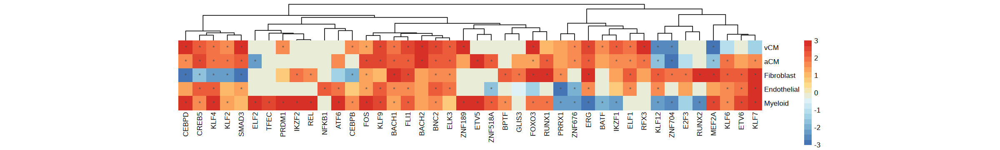

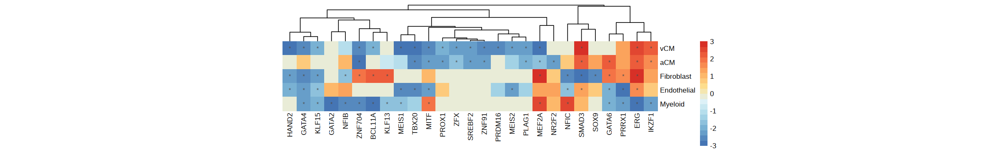

In [1261]:
options(repr.plot.width = 20, repr.plot.height = 3)

### add significance
lmat <- do.call(rbind, fgsea_results) %>%
filter(padj < 0.05) %>%
mutate(value = padj) %>%
reshape2::dcast(celltype ~ pathway, value.var = "value") %>%
tibble::column_to_rownames("celltype") 

lmat <- lmat[c('vCM','aCM','Fibroblast','Endothelial','Myeloid'),]
lmat[is.na(lmat)] <- 1
lmat <- ifelse(lmat < 0.05, "*", "")

t1 <- rmat[,unique(upGRN$gene)] %>% 
pheatmap(cluster_rows = F, cluster_cols = T, display_numbers = lmat[,unique(upGRN$gene)], breaks = seq(-3,3,0.3),
         border_color = NA, angle_col = 90, cellwidth = 20, cellheight = 20,
         color = rev(colorRampPalette(brewer.pal(n = 8, name = "RdYlBu"))(20)))

options(repr.plot.width = 20, repr.plot.height = 3)
t2 <- rmat[,unique(downGRN$gene)] %>% 
pheatmap(cluster_rows = F, cluster_cols = T, display_numbers = lmat[,unique(downGRN$gene)], breaks = seq(-3,3,0.3),
         border_color = NA, angle_col = 90, cellwidth = 20, cellheight = 20,
         color = rev(colorRampPalette(brewer.pal(n = 8, name = "RdYlBu"))(20)))

ggsave(t1, filename = "plot/FIG_SCENIC_HF_vs_CONTROL_fgsea_absNES2_upGRN.pdf", dpi = 300, height = 3, width = 20)
ggsave(t2, filename = "plot/FIG_SCENIC_HF_vs_CONTROL_fgsea_absNES2_downGRN.pdf", dpi = 300, height = 3, width = 20)

[1] "BACH2" "CREB5" "KLF9"

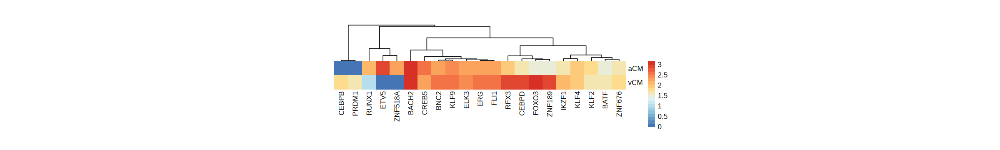

In [1143]:
### unique to aCM or vCM:
vtf <- upGRN %>% filter(celltype == "vCM") %>% dplyr::select(gene) %>% unlist %>% unique
atf <- upGRN %>% filter(celltype == "aCM") %>% dplyr::select(gene) %>% unlist %>% unique
intersect(vtf, atf)# %>% length
t1 <- rmat[c("aCM", "vCM"), unique(c(vtf, atf))]  %>% 
pheatmap(cluster_rows = F, cluster_cols = T, # breaks = seq(-3,3,0.3),
         border_color = NA, angle_col = 90, cellwidth = 20, cellheight = 20,
         color = rev(colorRampPalette(brewer.pal(n = 8, name = "RdYlBu"))(20)))

In [1122]:
# chmm2 <- read.table("chromhmm/celltype/annotate/Heart_UnionPeak_by_celltype.xls", row.names = 1, header = T)
### Calculate proportion of elements become activated
rratio <- list()
for (qtf in setdiff(atf, vtf)){
    qqpeak <- elist %>% filter(celltype == "aCM") %>% 
    filter(Consensus_name == paste0(qtf, "_+_+")) %>% dplyr::select(Region) %>% unlist %>% unique
    qchmm <- chmm[qqpeak, grep("aCM", colnames(chmm), value = T)] %>% 
    count(across(everything())) %>%
    setNames(c("CONTROL", "HF", "n"))
    acont = qchmm %>% filter(HF == "E5", CONTROL != "E5") %>% dplyr::select(n) %>% sum
    
    qchmm <- chmm[qqpeak, grep("vCM", colnames(chmm), value = T)] %>% 
    count(across(everything())) %>%
    setNames(c("CONTROL", "HF", "n"))
    vcont = qchmm %>% filter(HF == "E5", CONTROL != "E5") %>% dplyr::select(n) %>% sum
    rratio[[qtf]] <- data.frame(tf = qtf, aratio = acont / length(qqpeak), vratio = vcont / length(qqpeak), class = "aCM")
}

for (qtf in setdiff(vtf, atf)){
    qqpeak <- elist %>% filter(celltype == "vCM") %>% 
    filter(Consensus_name == paste0(qtf, "_+_+")) %>% dplyr::select(Region) %>% unlist %>% unique
    qchmm <- chmm[qqpeak, grep("aCM", colnames(chmm), value = T)] %>% 
    count(across(everything())) %>%
    setNames(c("CONTROL", "HF", "n"))
    acont = qchmm %>% filter(HF == "E5", CONTROL != "E5") %>% dplyr::select(n) %>% sum
    
    qchmm <- chmm[qqpeak, grep("vCM", colnames(chmm), value = T)] %>% 
    count(across(everything())) %>%
    setNames(c("CONTROL", "HF", "n"))
    vcont = qchmm %>% filter(HF == "E5", CONTROL != "E5") %>% dplyr::select(n) %>% sum
    rratio[[qtf]] <- data.frame(tf = qtf, aratio = acont / length(qqpeak), vratio = vcont / length(qqpeak), class = "vCM")
}

for (qtf in intersect(vtf, atf)){
    qqpeak <- elist %>% filter(celltype %in% c("vCM", "aCM")) %>% 
    filter(Consensus_name == paste0(qtf, "_+_+")) %>% dplyr::select(Region) %>% unlist %>% unique
    qchmm <- chmm[qqpeak, grep("aCM", colnames(chmm), value = T)] %>% 
    count(across(everything())) %>%
    setNames(c("CONTROL", "HF", "n"))
    acont = qchmm %>% filter(HF == "E5", CONTROL != "E5") %>% dplyr::select(n) %>% sum
    
    qchmm <- chmm[qqpeak, grep("vCM", colnames(chmm), value = T)] %>% 
    count(across(everything())) %>%
    setNames(c("CONTROL", "HF", "n"))
    vcont = qchmm %>% filter(HF == "E5", CONTROL != "E5") %>% dplyr::select(n) %>% sum
    rratio[[qtf]] <- data.frame(tf = qtf, aratio = acont / length(qqpeak), vratio = vcont / length(qqpeak), class = "shared")
}

do.call(rbind, rratio) %>%
head

,tf,aratio,vratio,class
,<chr>,<dbl>,<dbl>,<chr>
ETV5,ETV5,0.15517241,0.06896552,aCM
RUNX1,RUNX1,0.16666667,0.00000000,aCM
ZNF518A,ZNF518A,0.10000000,0.00000000,aCM
BATF,BATF,0.00000000,0.42857143,vCM
BNC2,BNC2,0.09210526,0.21052632,vCM
CEBPB,CEBPB,0.00000000,0.10000000,vCM


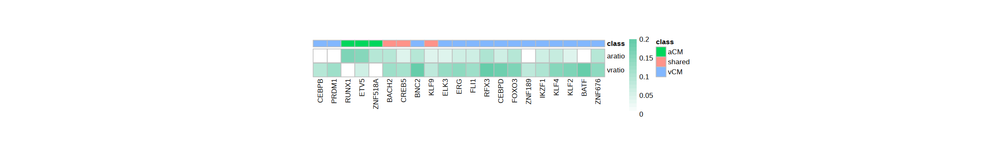

In [1147]:
options(repr.plot.width = 20, repr.plot.height = 3)

tmp <- do.call(rbind, rratio)
canno <- tmp %>% dplyr::select(class) 
tmp <- tmp %>% dplyr::select(aratio, vratio) %>% t 
tmp[tmp > 0.2] <- 0.2
t2 <- tmp[, t1$tree_col$labels[t1$tree_col$order]] %>%
pheatmap(cluster_rows = F, cluster_cols = F, annotation_col = canno,
         border_color = "gray", angle_col = 90, cellwidth = 20, cellheight = 20,
         color = colorRampPalette(colors = c("white", "#66cdaa"))(20)) 

In [1148]:
ggsave(t1, filename = "plot/FIG_SCENIC_HF_vs_CONTROL_vCM_aCM_upGRN_compare.pdf", dpi = 300, height = 3, width = 20)
ggsave(t2, filename = "plot/FIG_SCENIC_HF_vs_CONTROL_vCM_aCM_upGRN_regions_E5ratio.pdf", dpi = 300, height = 3, width = 20)

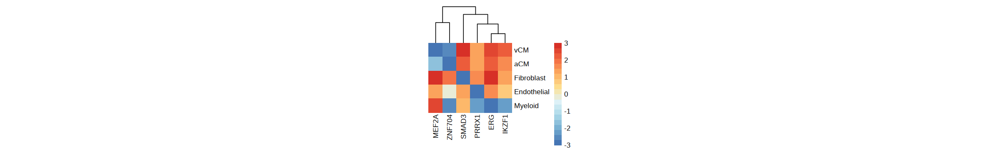

In [1130]:
### dual factor
dual <- intersect(unique(upGRN$gene), unique(downGRN$gene))

options(repr.plot.width = 20, repr.plot.height = 3)
t1 <- rmat[,dual] %>% 
pheatmap(cluster_rows = F, cluster_cols = T, breaks = seq(-3,3,0.3),
         border_color = NA, angle_col = 90, cellwidth = 20, cellheight = 20,
         color = rev(colorRampPalette(brewer.pal(n = 8, name = "RdYlBu"))(20)))
ggsave(t1, filename = "plot/FIG_SCENIC_HF_vs_CONTROL_fgsea_absNES2_upGRN.pdf", dpi = 300, height = 3, width = 20)

In [995]:
### Analyze dual factors:
# 1. Compare target regions / target genes
# 2. Target gene GO
# 3. target gene activities
suppressPackageStartupMessages(library(ggVennDiagram))

# elist <- list()
# for (f in list.files("GRN/scenicplus/")){
#     ct <- grep(f, corder, value = T)[1]
#     tmp <- read.csv(paste0("GRN/scenicplus/", f, "/edges_R2G.csv")) %>% 
#     filter(is_extended == "False") %>% 
#     mutate(gene = stringr::str_split_fixed(Consensus_name, pattern = "_", n = 3)[,1])
#     rpeak <- read.table(paste0("../reference/FNIH_peaks/unified_peaks/", ct, "_UnifiedFiltVariable.bed")) %>%
#     mutate(range = paste0(V1, ":", V2, "-", V3))
#     tmp <- tmp %>% filter(Region %in% rpeak$range)
#     elist[[ct]] <- tmp
# } 

chmm <- read.table("chromhmm/disease_celltype_cCRE.txt", sep = "\t", header = T)
colnames(chmm) <- gsub("Heart_UnionPeak_", "", colnames(chmm))

rpkm <- read.table("integration/FNIH_Heart_pool.int.disease.rpkm.txt", header = T, row.names = 1)
atac <- read.csv("FNIH_Heart_signal/FNIH_Heart_pool.H3K27ac.disease.HeartUnionPeak.cpm.csv", row.names = 1)

dual

[1] "ERG"    "IKZF1"  "MEF2A"  "PRRX1"  "SMAD3"  "ZNF704"

Using gene as id variables

Using region as id variables

Using gene as id variables

Using region as id variables

Using gene as id variables

Using region as id variables

Using gene as id variables

Using region as id variables

Using gene as id variables

Using region as id variables

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Using gene as id variables

Using region as id variables

Using gene as id variables

Using region as id variables

Using gene as id variables

Using region as id variables

Using gene as id variables

Using region as id variables

Using gene as id variables

Using region as id variables

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the

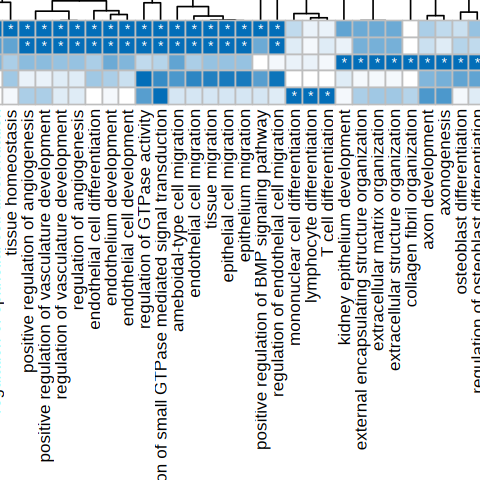

Using gene as id variables

Using region as id variables

Using gene as id variables

Using region as id variables

Using gene as id variables

Using region as id variables

Using gene as id variables

Using region as id variables

Using gene as id variables

Using region as id variables

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


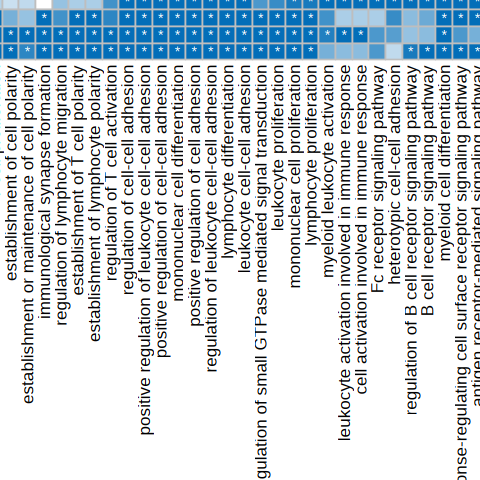

Using gene as id variables

Using region as id variables

Using gene as id variables

Using region as id variables

Using gene as id variables

Using region as id variables

Using gene as id variables

Using region as id variables

Using gene as id variables

Using region as id variables

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


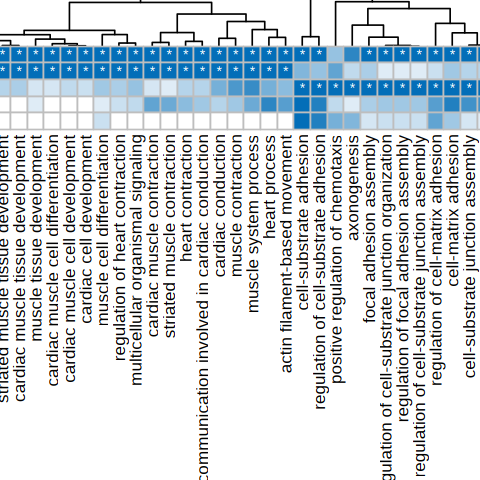

Using gene as id variables

Using region as id variables

Using gene as id variables

Using region as id variables

Using gene as id variables

Using region as id variables

Using gene as id variables

Using region as id variables

Using gene as id variables

Using region as id variables

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


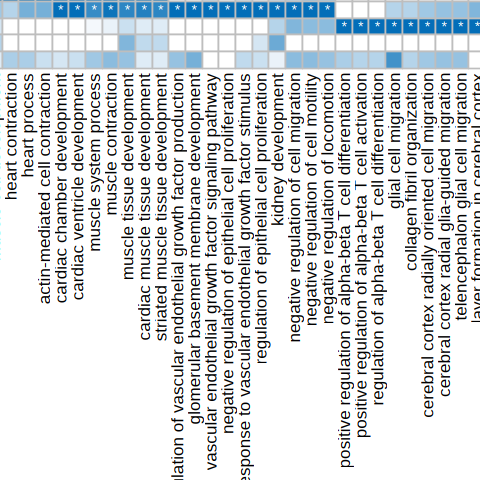

Using gene as id variables

Using region as id variables

Using gene as id variables

Using region as id variables

Using gene as id variables

Using region as id variables

Using gene as id variables

Using region as id variables

--> No gene can be mapped....

--> Expected input gene ID: ENDOU,SLC19A1,PSAPL1,OR10J1,GATA3,FANCC

--> return NULL...



ERROR: Error in mutate(., celltype = f): trying to get slot "result" from an object of a basic class ("NULL") with no slots


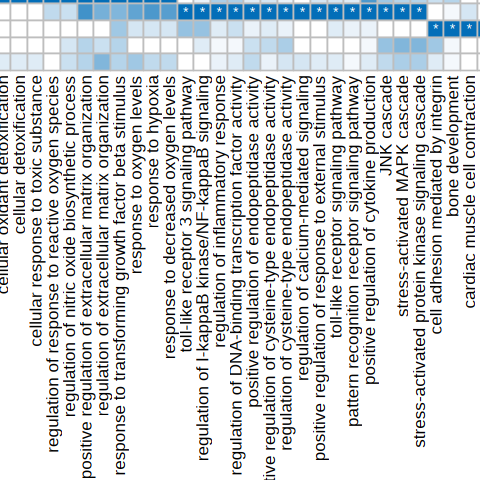

In [1236]:
for (tf in dual){    
    #### enrich GO
    clist <- glist <- atlist <- list()
    for (f in c("vCM", "aCM", "Fibroblast", "Endothelial", "Myeloid")){ 
        qregion <- elist %>% filter(celltype == f, Consensus_name == paste0(tf, "_+_+")) %>% dplyr::select(Region) %>% unlist %>% unique
        qgene <- elist %>% filter(celltype == f, Consensus_name == paste0(tf, "_+_+")) %>% dplyr::select(Gene) %>% unlist %>% unique
        
        glist[[f]] <- rpkm[qgene, grep(f, colnames(rpkm))] %>% tibble::rownames_to_column("gene") %>%
        reshape2::melt() %>% mutate(celltype = f)
        
        atlist[[f]] <- atac[qregion, grep(f, colnames(atac))] %>% tibble::rownames_to_column("region") %>%
        reshape2::melt() %>% mutate(celltype = f)
        
        qtable <- enrichGO(gene = qgene,
                    OrgDb = org.Hs.eg.db,
                    keyType = 'SYMBOL',
                    ont = "BP", # biological process
                    pAdjustMethod = "BH", 
                    pvalueCutoff = 0.05, 
                    qvalueCutoff = 0.05, 
                    readable = TRUE)
        clist[[f]] <- qtable@result %>% mutate(celltype = f)
    }
    
    t3 <- do.call(rbind, glist) %>%
    ggplot(aes(x = variable, y = value+1)) + 
    geom_boxplot(width = 0.2, coef = 2, outlier.shape = NA, alpha = 0.8) +
    theme_Publication() + ggtitle("Genes") + 
    scale_y_log10()
    
    t4 <- do.call(rbind, atlist) %>%
    ggplot(aes(x = variable, y = value+1)) + 
    geom_boxplot(width = 0.2, coef = 2, outlier.shape = NA, alpha = 0.8) +
    theme_Publication() + ggtitle("Region") + 
    scale_y_log10()
    
    fig1 <- cowplot::plot_grid(t3, t4, ncol = 2)
    ggsave(fig1, filename = paste0("plot/FIG_SCENIC_HF_vCM_", tf, "_targets_activity.pdf"), dpi = 300, height = 4, width = 12)
    
    qterm1 <- do.call(rbind, clist) %>% 
    filter(p.adjust < 0.05) %>% 
    group_by(celltype) %>%
    slice_max(order_by = -log10(pvalue), n = 15) %>% ungroup %>%
    dplyr::select(Description) %>% unlist %>% unique %>% as.character

    tmp <- do.call(rbind, clist) %>% 
    reshape2::dcast(Description ~ celltype, value.var = "pvalue", fun.aggregate = mean) %>%
    tibble::column_to_rownames("Description")
    tmp[is.na(tmp)] <- 1
    tmp <- -log2(tmp)

    ttp <- tmp[c(qterm1), ]
    ttp[ttp > 10] <- 10

    lmat <- do.call(rbind, clist) %>% 
    mutate(value = p.adjust) %>%
    reshape2::dcast(Description ~ celltype, value.var = "value", fun.aggregate = mean) %>%
    tibble::column_to_rownames("Description") 

    lmat[is.na(lmat)] <- 1
    lmat <- ifelse(lmat < 0.05, "*", "")

    t5 <- ttp %>% t %>%
    pheatmap(cluster_cols = T, cluster_rows = T, border_color = "gray", angle_col = 90, cellwidth = 10, cellheight = 10,
             display_numbers = t(lmat[rownames(ttp), colnames(ttp)]), number_color = "white", # breaks = seq(-4,4,0.4),
             color = colorRampPalette(c("white", "#036EB8"))(25))
    ggsave(t5, filename = paste0("plot/FIG_SCENIC_HF_vCM_", tf, "_target_gene_enrichGO_heatmap_top15.pdf"), 
           dpi = 300, height = 15, width = 20)    
}

In [1233]:
### example: MEF2A
options(repr.plot.width = 4, repr.plot.height = 6)

qregion <- elist %>% filter(celltype == "vCM", Consensus_name == "MEF2A_+_+") %>% 
dplyr::select(Region) %>% unlist %>% unique
t1 <- chmm[qregion, grep(paste0(c("vCM","Fibroblast"), collapse = "|"), colnames(chmm), value = T)] %>%
tibble::rownames_to_column("bin") %>% 
reshape2::melt(id.vars = 'bin') %>% 
dplyr::select(variable, value) %>%
table %>% as.data.frame %>%
ggplot(aes(x = variable, y = Freq, fill = value)) +
geom_col(position = "fill", color = "white") + 
theme_Publication() + ggtitle("MEF2A targeting region in vCM") +
scale_fill_manual(values = cols)

qregion <- elist %>% filter(celltype == "Fibroblast", Consensus_name == "MEF2A_+_+") %>% 
dplyr::select(Region) %>% unlist %>% unique
t2 <- chmm[qregion, grep(paste0(c("vCM","Fibroblast"), collapse = "|"), colnames(chmm), value = T)] %>%
tibble::rownames_to_column("bin") %>% 
reshape2::melt(id.vars = 'bin') %>% 
dplyr::select(variable, value) %>%
table %>% as.data.frame %>%
ggplot(aes(x = variable, y = Freq, fill = value)) +
geom_col(position = "fill", color = "white") + 
theme_Publication() + ggtitle("MEF2A targeting region in Fibroblast") +
scale_fill_manual(values = cols)

ggsave(t1, filename = paste0("plot/FIG_SCENIC_HF_vCM_MEF2A_target_region_chmm.pdf"), 
           dpi = 300, height = 6, width = 4) 
ggsave(t2, filename = paste0("plot/FIG_SCENIC_HF_Fibroblast_MEF2A_target_region_chmm.pdf"), 
           dpi = 300, height = 6, width = 4) 

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


In [1235]:
qgene <- elist %>% filter(celltype == "vCM", Consensus_name == "MEF2A_+_+") %>% 
dplyr::select(Gene) %>% unlist %>% unique

options(repr.plot.width = 4, repr.plot.height = 4)
t1 <- rpkm[qgene, sort(grep(paste0(c("vCM","Fibroblast"), collapse = "|"), colnames(rpkm), value = T))] %>%
tibble::rownames_to_column("gene") %>%
reshape2::melt(id.vars = "gene") %>%
ggplot(aes(x = variable, y = value, fill = variable)) + 
geom_boxplot(width = 0.4, coef = 2, outlier.shape = NA, alpha = 0.8) +
scale_y_log10() + 
theme_Publication()

qgene <- elist %>% filter(celltype == "Fibroblast", Consensus_name == "MEF2A_+_+") %>% 
dplyr::select(Gene) %>% unlist %>% unique
t2 <- rpkm[qgene, sort(grep(paste0(c("vCM","Fibroblast"), collapse = "|"), colnames(rpkm), value = T))] %>%
tibble::rownames_to_column("gene") %>%
reshape2::melt(id.vars = "gene") %>%
ggplot(aes(x = variable, y = value, fill = variable)) + 
geom_boxplot(width = 0.4, coef = 2, outlier.shape = NA, alpha = 0.8) +
scale_y_log10() + 
theme_Publication()

ggsave(t1, filename = paste0("plot/FIG_SCENIC_HF_vCM_MEF2A_target_gene_exp.pdf"), 
           dpi = 300, height = 6, width = 4) 
ggsave(t2, filename = paste0("plot/FIG_SCENIC_HF_Fibroblast_MEF2A_target_gene_exp.pdf"), 
           dpi = 300, height = 6, width = 4) 

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


In [1241]:
f1 <- t2$data %>% filter(variable == "Fibroblast.CONTROL") %>% dplyr::select(value) %>% unlist
f2 <- t2$data %>% filter(variable == "Fibroblast.HF") %>% dplyr::select(value) %>% unlist
wilcox.test(f1, f2)

f1 <- t2$data %>% filter(variable == "vCM.CONTROL") %>% dplyr::select(value) %>% unlist
f2 <- t2$data %>% filter(variable == "vCM.HF") %>% dplyr::select(value) %>% unlist
wilcox.test(f1, f2)


	Wilcoxon rank sum exact test

data:  f1 and f2
W = 703, p-value = 0.01216
alternative hypothesis: true location shift is not equal to 0



	Wilcoxon rank sum exact test

data:  f1 and f2
W = 1026, p-value = 0.9169
alternative hypothesis: true location shift is not equal to 0


### Shared TF: different funcions

In [1016]:
# qqgene <- intersect(intersect(unique(elist[["vCM"]]$gene), unique(elist[["aCM"]]$gene)), unique(upGRN$gene))
# tmp <- rpkm[qqgene, grep("vCM", colnames(rpkm))]
# tmp[apply(tmp, 1, mean) > 0.5,]

In [1163]:
### While TF are the same, whether tageting region / genes are the same?
### example in vCM / aCM
qtf <- "BACH2"
qpeak1 <- elist %>% filter(celltype == "vCM") %>% 
filter(Consensus_name %in% paste0(qtf, "_+_+")) %>% dplyr::select(Region) %>% unlist %>% unique

qpeak2 <- elist %>% filter(celltype == "aCM") %>% 
filter(Consensus_name %in% paste0(qtf, "_+_+")) %>% dplyr::select(Region) %>% unlist %>% unique

length(qpeak1); length(qpeak2)
intersect(qpeak1, qpeak2) %>% length

qgene1 <- elist %>% filter(celltype == "vCM") %>% 
filter(Consensus_name %in% paste0(qtf, "_+_+")) %>% dplyr::select(Gene) %>% unlist %>% unique

qgene2 <- elist %>% filter(celltype == "aCM") %>% 
filter(Consensus_name %in% paste0(qtf, "_+_+")) %>% dplyr::select(Gene) %>% unlist %>% unique

length(qgene1); length(qgene2)
intersect(qgene1, qgene2) %>% length

[1] 171

[1] 371

[1] 44

[1] 84

[1] 195

[1] 36

In [1088]:
suppressPackageStartupMessages(library(ggVennDiagram))

qpeak <- qgene <- list()
for (ct in list.files("GRN/scenicplus/")){
    if (ct != "Lymphoid"){
        qpeak[[ct]] <- read.csv(paste0("GRN/scenicplus/", ct, "/edges_R2G.csv")) %>% 
        filter(is_extended == "False") %>% 
        filter(Consensus_name %in% paste0(qtf, "_+_+")) %>% dplyr::select(Region) %>% unlist %>% unique

        qgene[[ct]] <- read.csv(paste0("GRN/scenicplus/", ct, "/edges_R2G.csv")) %>% 
        filter(is_extended == "False") %>% 
        filter(Consensus_name %in% paste0(qtf, "_+_+")) %>% dplyr::select(Gene) %>% unlist %>% unique
    }
}

t1 <- ggVennDiagram(qpeak, force_upset = T) #+ NoLegend()
t2 <- ggVennDiagram(qgene, force_upset = T) #+ NoLegend()

ggsave(t1, filename = paste0("plot/FIG_SCENIC_", qtf, "_target_region.pdf"), dpi = 300, height = 6, width = 6)
ggsave(t2, filename = paste0("plot/FIG_SCENIC_", qtf, "_target_gene.pdf"), dpi = 300, height = 6, width = 6)

In [1174]:
# clist <- list()
# qtable <- enrichGO(gene = setdiff(qgene1, qgene2),
#                 OrgDb = org.Hs.eg.db,
#                 keyType = 'SYMBOL',
#                 ont = "BP", # biological process
#                 pAdjustMethod = "BH", 
#                 pvalueCutoff = 0.05, 
#                 qvalueCutoff = 0.05, 
#                 readable = TRUE)
# clist[["vCM"]] <- qtable@result %>% mutate(ct = "vCM")
# qtable <- enrichGO(gene = setdiff(qgene2, qgene1),
#                 OrgDb = org.Hs.eg.db,
#                 keyType = 'SYMBOL',
#                 ont = "BP", # biological process
#                 pAdjustMethod = "BH", 
#                 pvalueCutoff = 0.05, 
#                 qvalueCutoff = 0.05, 
#                 readable = TRUE)
# clist[["aCM"]] <- qtable@result %>% mutate(ct = "aCM")


# do.call(rbind, clist) %>% 
# filter(p.adjust < 0.05) %>%
# dplyr::select(ct) %>% table

### Target region chromHMM?

In [1188]:
### vCM peaks
qqpeak <- setdiff(qpeak1, qpeak2)

qchmm <- chmm[qqpeak, grep(paste0(c("vCM"),collapse = "|"), colnames(chmm))] %>% 
count(across(everything())) %>% 
setNames(c("CONTROL", "HF", "n"))
vcont = qchmm %>% filter(HF == "E5", CONTROL != "E5") %>% dplyr::select(n) %>% sum
vcont1 = vcont/length(qqpeak)

vcont = qchmm %>% filter(HF == "E3", CONTROL != "E3") %>% dplyr::select(n) %>% sum
vcont2 = vcont/length(qqpeak)

qchmm <- chmm[qqpeak, grep(paste0(c("aCM"),collapse = "|"), colnames(chmm))] %>% 
count(across(everything())) %>% 
setNames(c("CONTROL", "HF", "n"))
vcont = qchmm %>% filter(HF == "E5", CONTROL != "E5") %>% dplyr::select(n) %>% sum
vcont3 = vcont/length(qqpeak)

vcont = qchmm %>% filter(HF == "E3", CONTROL != "E3") %>% dplyr::select(n) %>% sum
vcont4 = vcont/length(qqpeak)

In [1189]:
### aCM peaks
qqpeak <- setdiff(qpeak2, qpeak1)
qchmm <- chmm[qqpeak, grep(paste0(c("vCM"),collapse = "|"), colnames(chmm))] %>% 
count(across(everything())) %>% 
setNames(c("CONTROL", "HF", "n"))
acont = qchmm %>% filter(HF == "E5", CONTROL != "E5") %>% dplyr::select(n) %>% sum
acont1 = acont/length(qqpeak)

acont = qchmm %>% filter(HF == "E3", CONTROL != "E3") %>% dplyr::select(n) %>% sum
acont2 = acont/length(qqpeak)

qchmm <- chmm[qqpeak, grep(paste0(c("aCM"),collapse = "|"), colnames(chmm))] %>% 
count(across(everything())) %>% 
setNames(c("CONTROL", "HF", "n"))
acont = qchmm %>% filter(HF == "E5", CONTROL != "E5") %>% dplyr::select(n) %>% sum
acont3 = acont/length(qqpeak)

acont = qchmm %>% filter(HF == "E3", CONTROL != "E3") %>% dplyr::select(n) %>% sum
acont4 = acont/length(qqpeak)

In [1211]:
qqpeak <- setdiff(qpeak2, qpeak1)
qqpeak <- chmm[qqpeak, c("vCM_HF", "aCM_HF")] %>% 
filter(aCM_HF == "E5", vCM_HF != "E5") %>% rownames

write.table(qqpeak, "tmp.txt", sep = "\t", quote = F, row.names = F, col.names = F)

In [1212]:
elist %>% filter(Region %in% qqpeak) %>% filter(Consensus_name == "BACH2_+_+", celltype == "aCM") %>%
dplyr::select(Gene) %>% unlist %>% unique

[1] "STAT4"    "ITGA9"    "RPS6KA2"  "NR2C1"    "TRIM44"   "LAMA4"   
 [7] "RHOBTB3"  "MARCH3"   "KIAA0556" "GALNT10"  "AMOTL1"   "SH3RF1"  
[13] "PLCB1"    "KCNQ3"    "CTDSPL"   "PARP8"    "WDR41"    "PHLDA1"  
[19] "AMPH"     "ARHGEF3"  "NAP1L1"   "MATN2"

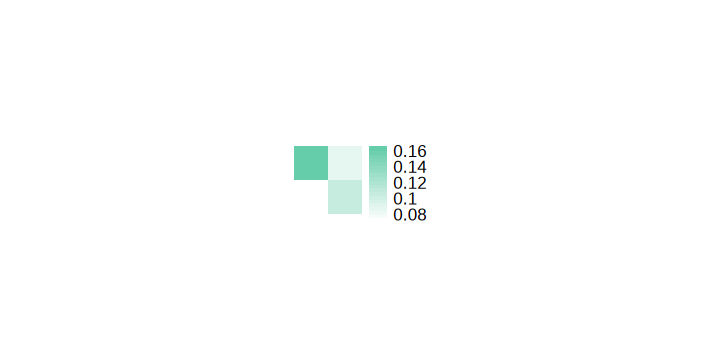

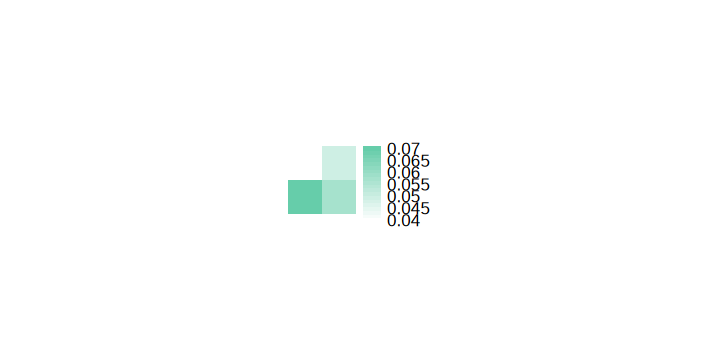

In [1192]:
options(repr.plot.width = 6, repr.plot.height = 3)
mtx <- matrix(c(vcont1, vcont3, acont1, acont3), ncol = 2) ### col: vCM specific peaks, aCM specific peaks
t1 <- mtx %>%
pheatmap(cluster_rows = F, cluster_cols = F, border_color = NA, angle_col = 90, cellwidth = 20, cellheight = 20,
        color = colorRampPalette(colors = c("white", "#66cdaa"))(20))

mtx <- matrix(c(vcont2, vcont4, acont2, acont4), ncol = 2) ### col: vCM specific peaks, aCM specific peaks
t2 <- mtx %>%
pheatmap(cluster_rows = F, cluster_cols = F, border_color = NA, angle_col = 90, cellwidth = 20, cellheight = 20,
        color = colorRampPalette(colors = c("white", "#66cdaa"))(20))

ggsave(t1, filename = paste0("plot/FIG_SCENIC_", qtf, "_target_region_vCM_aCM_E5ratio.pdf"), 
       dpi = 300, height = 4, width = 6)
ggsave(t2, filename = paste0("plot/FIG_SCENIC_", qtf, "_target_region_vCM_aCM_E3ratio.pdf"), 
       dpi = 300, height = 4, width = 6)

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


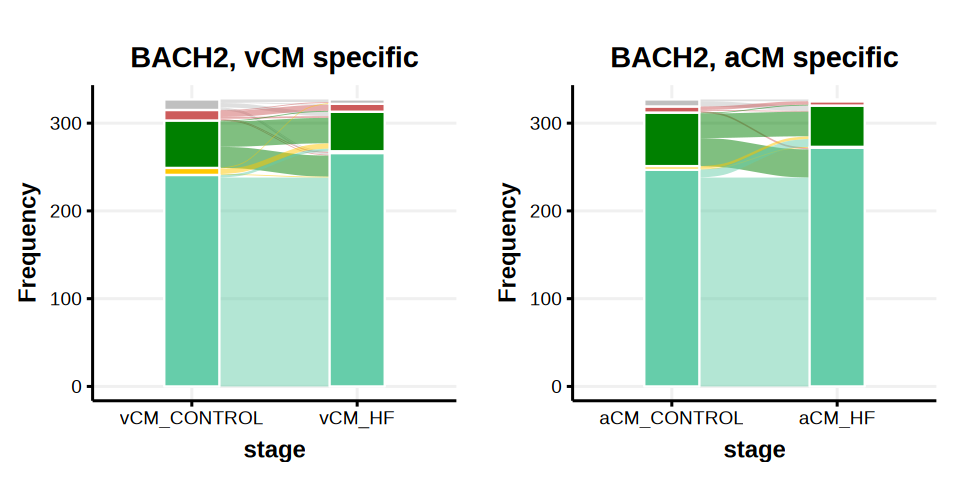

In [1175]:
qqpeak <- setdiff(qpeak2, qpeak1)
t1 <- chmm[qqpeak, grep(paste0(c("vCM"),collapse = "|"), colnames(chmm))] %>% 
count(across(everything())) %>%
mutate(id = 1:nrow(.)) %>%
tidyr::pivot_longer(cols = starts_with("vCM"), names_to = "stage", values_to = "state") %>%
mutate(state = factor(state, levels = c("E2", "E1", "E3", "E4", "E5"))) %>%
ggplot(aes(x = stage, stratum = state, alluvium = id, y = n, fill = state)) +
geom_flow() + ylab("Frequency") + 
geom_stratum(color = "white") +
NoLegend() + theme_Publication() + ggtitle(paste0(qtf, ", vCM specific")) + 
scale_fill_manual(values = cols) + NoLegend()

t2 <- chmm[qqpeak, grep(paste0(c("aCM"),collapse = "|"), colnames(chmm))] %>% 
count(across(everything())) %>%
mutate(id = 1:nrow(.)) %>%
tidyr::pivot_longer(cols = starts_with("aCM"), names_to = "stage", values_to = "state") %>%
mutate(state = factor(state, levels = c("E2", "E1", "E3", "E4", "E5"))) %>%
ggplot(aes(x = stage, stratum = state, alluvium = id, y = n, fill = state)) +
geom_flow() + ylab("Frequency") + 
geom_stratum(color = "white") +
NoLegend() + theme_Publication() + ggtitle(paste0(qtf, ", aCM specific")) + 
scale_fill_manual(values = cols) + NoLegend()

options(repr.plot.width = 8, repr.plot.height = 4)
fig1 <- cowplot::plot_grid(t1, t2)

fig1
# ggsave(fig1, filename = "plot/FIG_SCENIC_FOS_target_region_vCM_Myeloid_chromhmm.pdf", 
#        dpi = 300, height = 4, width = 8)

In [1213]:
# qregion <- elist[["vCM"]] %>% dplyr::filter(gene == "BACH2") %>% dplyr::select(Region) %>% unlist
# elist[["vCM"]] %>% filter(Region %in% qregion) %>%
# dplyr::select(gene) %>% table %>%
# as.data.frame %>% arrange(desc(Freq)) %>% head

# qregion <- elist[["Fibroblast"]] %>% dplyr::filter(gene == "SMAD3") %>% dplyr::select(Region) %>% unlist
# elist[["Fibroblast"]] %>% filter(Region %in% qregion) %>%
# dplyr::select(gene) %>% table %>%
# as.data.frame %>% arrange(desc(Freq)) %>% head

In [ ]:
### Define active level and open level of the target regions for TF:

In [864]:
qregion <- upGRN %>% filter(celltype == "vCM", gene == "KLF4") %>% 
dplyr::select(Region) %>% unlist
chmm[qregion, grep("vCM", colnames(chmm))] %>%
dplyr::filter(vCM_HF == "E1") %>%
head

,vCM_CONTROL,vCM_HF
,<chr>,<chr>
chr6:10886868-10887168,E1,E1
chr3:32384998-32385298,E1,E1
chr6:11044151-11044451,E1,E1
chr17:64345978-64346278,E2,E1
chr12:96078250-96078550,E1,E1
chr12:96108383-96108683,E1,E1


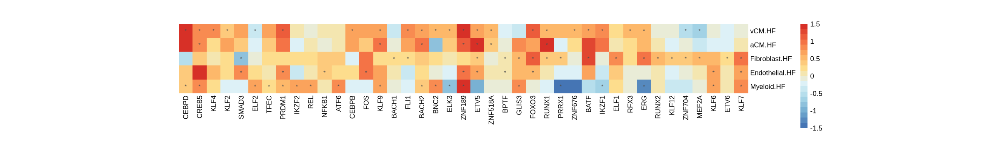

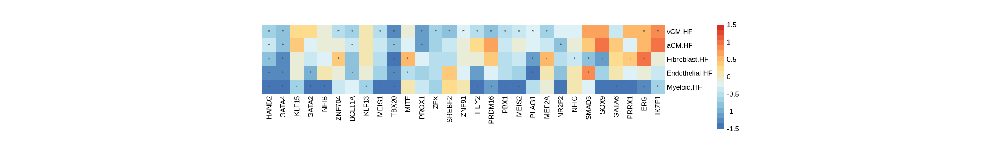

In [222]:
lmat <- do.call(rbind, tflist) %>%
mutate(value = padj) %>%
reshape2::dcast(celltype ~ gene, value.var = "value") %>%
tibble::column_to_rownames("celltype") 

lmat[,setdiff(colnames(m1), colnames(lmat))] <- 1
lmat[is.na(lmat)] <- 1
lmat <- ifelse(lmat < 0.05, "*", "")

m1 <- log2(rpkm[t1$tree_col$labels[t1$tree_col$order], paste0(rownames(rmat), ".HF")]/rpkm[t1$tree_col$labels[t1$tree_col$order], paste0(rownames(rmat), ".CONTROL")]) %>%
t %>% as.data.frame
t3 <- m1[,t1$tree_col$labels[t1$tree_col$order]] %>%
pheatmap(cluster_rows = F, cluster_cols = F, 
         display_numbers = lmat[gsub(".HF", "", rownames(m1)), t1$tree_col$labels[t1$tree_col$order]], 
         breaks = seq(-1.5,1.5,0.15),
         border_color = NA, angle_col = 90, cellwidth = 20, cellheight = 20,
         color = rev(colorRampPalette(brewer.pal(n = 8, name = "RdYlBu"))(20)))

m1 <- log2(rpkm[t2$tree_col$labels[t2$tree_col$order], paste0(rownames(rmat), ".HF")]/rpkm[t2$tree_col$labels[t2$tree_col$order], paste0(rownames(rmat), ".CONTROL")]) %>%
t %>% as.data.frame
t4 <- m1[,t2$tree_col$labels[t2$tree_col$order]] %>%
pheatmap(cluster_rows = F, cluster_cols = F, 
         display_numbers = lmat[gsub(".HF", "", rownames(m1)), t2$tree_col$labels[t2$tree_col$order]], 
         breaks = seq(-1.5,1.5,0.15),
         border_color = NA, angle_col = 90, cellwidth = 20, cellheight = 20,
         color = rev(colorRampPalette(brewer.pal(n = 8, name = "RdYlBu"))(20)))

ggsave(t3, filename = "plot/FIG_SCENIC_HF_vs_CONTROL_fgsea_absNES2_upGRN_TF_FC_heatmap.pdf", dpi = 300, height = 3, width = 20)
ggsave(t4, filename = "plot/FIG_SCENIC_HF_vs_CONTROL_fgsea_absNES2_downGRN_TF_FC_heatmap.pdf", dpi = 300, height = 3, width = 20)

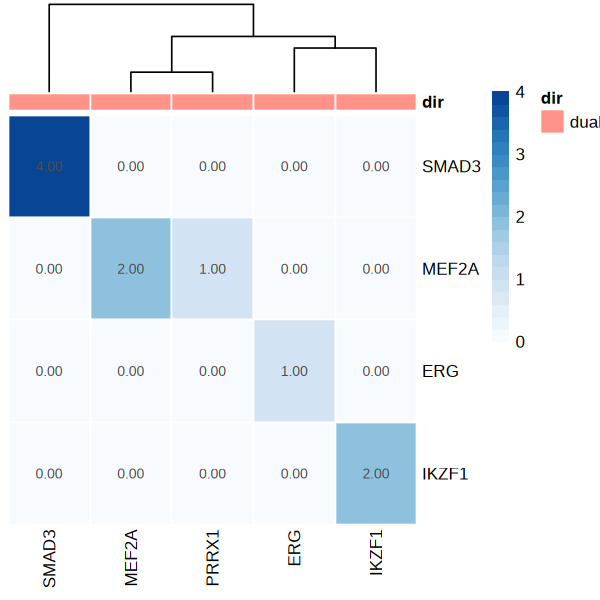

In [817]:
### Connect GRN using heatmaps:
f <- "Fibro"
vcf <- dual# unique(c(upGRN[upGRN$celltype == f,]$gene, downGRN[downGRN$celltype == f,]$gene))

elist <- read.csv(paste0("GRN/scenicplus/", f, "/edges_R2G.csv")) %>% filter(is_extended == "False")
qelist <- elist %>%
mutate(gene = stringr::str_split_fixed(Consensus_name, pattern = "_", n = 3)[,1]) %>%
mutate(targetR = as.integer(paste0(stringr::str_split_fixed(Consensus_name, pattern = "_", n = 3)[,2], 1))) %>%
mutate(targetG = as.integer(paste0(stringr::str_split_fixed(Consensus_name, pattern = "_", n = 3)[,3], 1))) %>%
mutate(regulated = ifelse(targetR*targetG > 0, 1, -1)) %>%
dplyr::select(gene, Gene, regulated)

cmeta <- rbind(upGRN, downGRN) %>% 
dplyr::select(gene, pathway) %>%
distinct %>% group_by(gene) %>%
mutate(dir = ifelse(length(pathway) == 1, pathway, "dual")) %>%
ungroup %>% dplyr::select(gene, dir) %>% distinct %>% tibble::column_to_rownames("gene") %>%
arrange(dir)

options(repr.plot.width = 5, repr.plot.height = 5)
mtx <- qelist %>%
# filter(Gene %in% unique(qelist$gene)) %>%
filter(Gene %in% vcf, gene %in% vcf) %>%
reshape2::dcast(gene ~ Gene, value.var = "regulated", fun.aggregate = sum) %>%
tibble::column_to_rownames("gene") ### row: TF

mtx[mtx > 4] <- 4
mtx[mtx < -4] <- -4
f1 <- mtx %>%
pheatmap(cluster_rows = T, cluster_cols = T, annotation_col = cmeta, 
         treeheight_row = F, display_numbers = T,
         border_color = "white", angle_col = 90, #cellwidth = 20, cellheight = 20,
         color = (colorRampPalette(brewer.pal(n = 8, name = "Blues"))(20)))

### Focused on vCM

In [901]:
ct <- "vCM"
elist <- read.csv(paste0("GRN/scenicplus/", ct, "/edges_R2G.csv")) %>% filter(is_extended == "False")
rpeak <- read.table(paste0("../reference/FNIH_peaks/unified_peaks/", ct, "_UnifiedFiltVariable.bed")) %>%
mutate(range = paste0(V1, ":", V2, "-", V3))
setdiff(elist$Region, rpeak$range) %>% length
intersect(elist$Region, rpeak$range) %>% length
### Not all peaks are shared!

elist <- elist %>% filter(Region %in% rpeak$range)

[1] 1222

[1] 3614

In [902]:
### Target gene GO
qgrn <- upGRN %>%
filter(celltype == ct) %>%
dplyr::select(gene) %>% unlist %>% unique

clist <- list()
for (f in qgrn){ #unique(diffpair1$celltype.x)
    qgene <- elist %>% filter(Consensus_name %in% paste0(f, "_+_+")) 
    qtable <- enrichGO(gene = unique(qgene$Gene),
                OrgDb = org.Hs.eg.db,
                keyType = 'SYMBOL',
                ont = "BP", # biological process
                pAdjustMethod = "BH", 
                pvalueCutoff = 0.05, 
                qvalueCutoff = 0.05, 
                readable = TRUE)
    clist[[f]] <- qtable@result %>% mutate(tf = f)
}

do.call(rbind, clist) %>% 
filter(p.adjust < 0.05) %>%
dplyr::select(tf) %>% table

tf
BACH2  BNC2 CEBPD CREB5  ELK3   ERG  FLI1 IKZF1  KLF2  KLF4  KLF9 PRDM1 
    8    23     4    49    20    57   154   142    56    77     4    66 

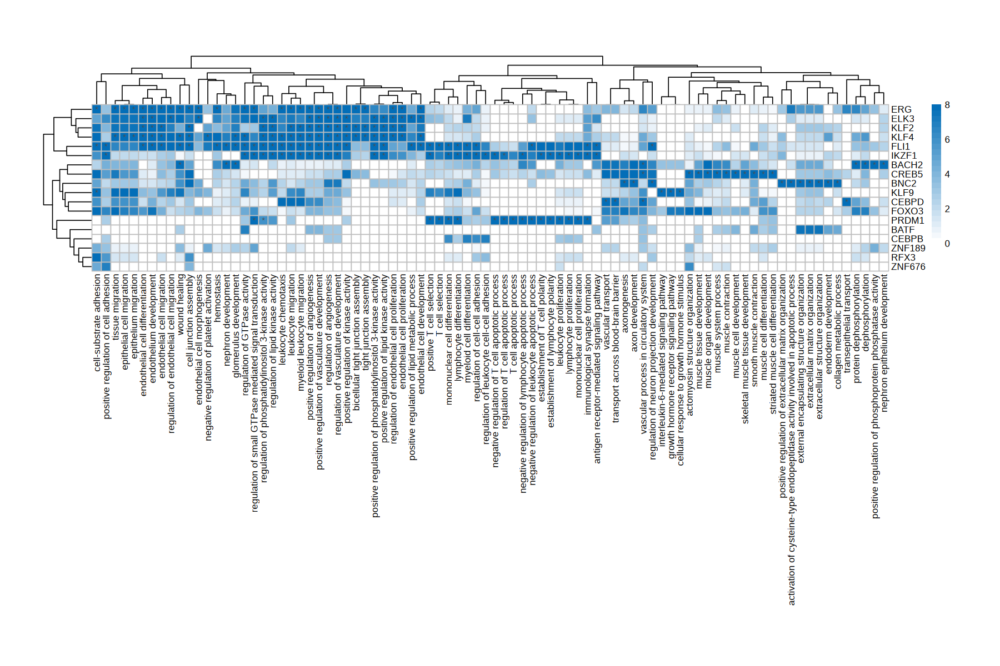

In [903]:
qterm1 <- do.call(rbind, clist) %>% 
filter(p.adjust < 0.05) %>% 
group_by(tf) %>%
slice_max(order_by = -log10(pvalue), n = 10) %>% ungroup %>%
dplyr::select(Description) %>% unlist %>% unique %>% as.character

tmp <- do.call(rbind, clist) %>% 
reshape2::dcast(Description ~ tf, value.var = "pvalue", fun.aggregate = mean) %>%
tibble::column_to_rownames("Description")
tmp[is.na(tmp)] <- 1
tmp <- -log2(tmp)

ttp <- tmp[c(qterm1), ]
ttp[ttp > 8] <- 8

lmat <- do.call(rbind, clist) %>% 
mutate(value = p.adjust) %>%
reshape2::dcast(Description ~ tf, value.var = "value", fun.aggregate = mean) %>%
tibble::column_to_rownames("Description") 

lmat[is.na(lmat)] <- 1
lmat <- ifelse(lmat < 0.05, "*", "")

options(repr.plot.width = 15, repr.plot.height = 10)
t1 <- ttp %>% t %>%
pheatmap(cluster_cols = T, cluster_rows = T, border_color = "gray", angle_col = 90, cellwidth = 10, cellheight = 10,
         display_numbers = t(lmat[rownames(ttp), colnames(ttp)]), # breaks = seq(-4,4,0.4),
         color = colorRampPalette(c("white", "#036EB8"))(25))
tforder <- t1$tree_row$label[t1$tree_row$order]

# ggsave(t1, filename = "plot/FIG_SCENIC_HF_vCM_upGRN_target_gene_enrichGO_heatmap_complete.pdf", 
#        dpi = 300, height = 10, width = 15)
# write.table(t(ttp), "plot/FIG_SCENIC_HF_vCM_upGRN_target_gene_enrichGO_heatmap_complete.txt", 
#             sep = "\t", quote = F, row.names=  T, col.names = T)

In [941]:
### 1. Do the TF collaborate or act separately？
### check term "would healing"
qtf <- c("BACH2", "CREB5", "ERG", "FLI1", "KLF4")
qg1 <- elist %>% filter(Consensus_name %in% paste0(qtf, "_+_+")) #%>% dplyr::select(Region)

In [943]:
suppressPackageStartupMessages(library(ggVennDiagram))

qpeak <- list()
for (tf in unique(qg1$Consensus_name)){
    qpeak[[tf]] <- elist %>% filter(Consensus_name == tf) %>% 
    dplyr::select(Region) %>% unlist %>% unique
}

options(repr.plot.width = 6, repr.plot.height = 6)
t1 <- ggVennDiagram(qpeak, force_upset = T) #+ NoLegend()

ggsave(t1, filename = "plot/FIG_SCENIC_vCM_wound_healing_term_TF_bind_target.pdf", 
      dpi = 300, height = 5, width = 5)
### Seems to be separately, while ERG and FL1 share same motifs

In [944]:
qpeak <- list()
for (tf in unique(qg1$Consensus_name)){
    qpeak[[tf]] <- elist %>% filter(Consensus_name == tf) %>% 
    dplyr::select(Gene) %>% unlist %>% unique
}

options(repr.plot.width = 6, repr.plot.height = 6)
t1 <- ggVennDiagram(qpeak, force_upset = T) #+ NoLegend()
ggsave(t1, filename = "plot/FIG_SCENIC_vCM_wound_healing_term_TF_bind_genes.pdf", 
      dpi = 300, height = 5, width = 5)

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


vCM4       vCM2       vCM3       vCM8       vCM1       vCM7       vCM5 
0.18122071 0.06158971 0.15297949 0.25860412 0.14698888 0.15165281 0.10032483 
     vCM13      vCM12      vCM11       vCM6      vCM10       vCM9 
0.34838530 0.24414156 0.24489633 0.24896358 0.45610144 0.28212497

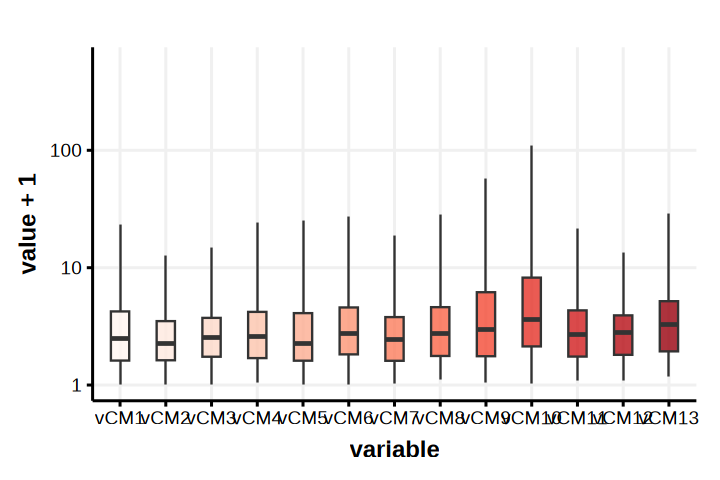

In [978]:
### BACH2 and CREB5
qgene <- setdiff(qpeak[["CREB5_+_+"]], qpeak[["BACH2_+_+"]])
# rpkm2 <- read.table("integration/FNIH_Heart_pool.int.subtype.rpkm.txt", header = T, row.names = 1)

options(repr.plot.width = 6, repr.plot.height = 4)
t1 <- rpkm2[qgene, grep(ct, colnames(rpkm2))] %>%
tibble::rownames_to_column("gene") %>%
reshape2::melt(id.vars = "gene") %>%
mutate(variable = factor(variable, levels = paste0("vCM", 1:13))) %>%
ggplot(aes(x = variable, y = value + 1, fill = variable)) + 
geom_boxplot(width = 0.4, coef = 2, outlier.shape = NA, alpha = 0.8) +
scale_y_log10() + 
theme_Publication() + 
scale_fill_manual(values = colorRampPalette(brewer.pal(n = 8, name = "Reds"))(13)) + NoLegend()

rpkm2[qgene, grep(ct, colnames(rpkm2))] %>%
apply(MARGIN = 2, function(x) mean(log10(x)))
      
t1
ggsave(t1, filename = "plot/FIG_SCENIC_CREB5_BACH2_cotarget_genes_RPKM_vCM.pdf", dpi = 300, height = 4, width = 6)

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


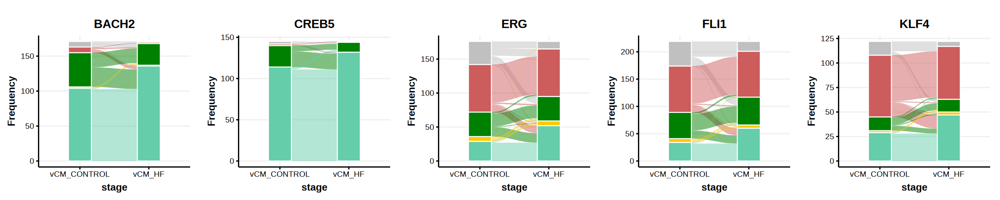

In [927]:
qpeak <- list()
for (tf in qtf){
    qpeak[[tf]] <- elist %>% 
    filter(Consensus_name == paste0(tf, "_+_+")) %>% 
    dplyr::select(Region) %>% unlist %>% unique
}

plist <- list()
for (tf in qtf){
    plist[[tf]] <- chmm[qpeak[[tf]], grep(paste0(ct, collapse = "|"), colnames(chmm))] %>% 
    count(across(everything())) %>%
    mutate(id = 1:nrow(.)) %>%
    tidyr::pivot_longer(cols = starts_with(ct), names_to = "stage", values_to = "state") %>%
    mutate(state = factor(state, levels = c("E2", "E1", "E3", "E4", "E5"))) %>%
    ggplot(aes(x = stage, stratum = state, alluvium = id, y = n, fill = state)) +
    geom_flow() + ylab("Frequency") + 
    geom_stratum(color = "white") +
    NoLegend() + theme_Publication() + ggtitle(tf) + 
    scale_fill_manual(values = cols) + NoLegend()
}

options(repr.plot.width = 20, repr.plot.height = 4)
fig1 <- cowplot::plot_grid(plotlist = plist, nrow = 1)

fig1

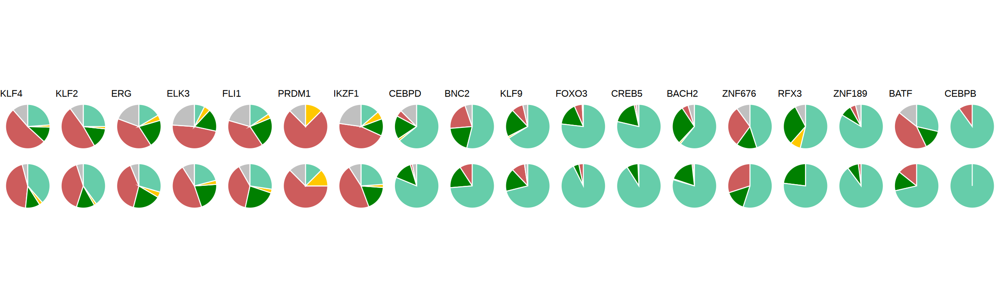

In [940]:
tforder <- c('KLF4','KLF2','ERG','ELK3','FLI1','PRDM1','IKZF1','CEBPD','BNC2','KLF9','FOXO3',
             'CREB5','BACH2','ZNF676','RFX3','ZNF189','BATF','CEBPB')
plist <- list()
for (qtf in tforder){
    qqpeak <- elist %>% 
    filter(Consensus_name == paste0(qtf, "_+_+")) %>% 
    dplyr::select(Region) %>% unlist %>% unique
    tmp <- chmm[qqpeak, grep(paste0(ct, collapse = "|"), colnames(chmm))] %>% 
    apply(MARGIN = 2, function(x) as.data.frame(table(x)))
          
    plist[[qtf]] <- do.call(rbind, tmp) %>%
    mutate(class = gsub("^([^.]+)\\.([^.]+)$", "\\1", rownames(.))) %>%
          mutate(x = factor(x, levels = c("E2","E1", "E3" ,"E4", "E5"))) %>%
    ggplot(aes(x = "", y = Freq, fill = x)) +
    geom_bar(width = 1, stat = "identity", color = "white") +
    coord_polar(theta = "y") + 
    theme_void() + facet_grid(class ~ .) +
    theme(strip.text = element_blank()) + ggtitle(qtf) + 
    scale_fill_manual(values = cols) + NoLegend()
}

options(repr.plot.width = 20, repr.plot.height = 6)
fig1 <- cowplot::plot_grid(plotlist = plist, ncol = length(plist))
fig1
ggsave(fig1, filename = "plot/FIG_vCM_upGRN_target_region_chromhmm.pdf", 
       dpi = 300, height = 5, width = 20)

In [1248]:
qtf <- "FOS"
olist <- list()
for(ct in unique(elist$celltype)){
    qgene <- elist %>% filter(celltype == ct) %>% 
    filter(Consensus_name %in% paste0(qtf, "_+_+")) %>% dplyr::select(Gene) %>% unlist
    qtable <- enrichGO(gene = qgene,
                OrgDb = org.Hs.eg.db,
                keyType = 'SYMBOL',
                ont = "BP", 
                pAdjustMethod = "BH", 
                pvalueCutoff = 0.05, 
                qvalueCutoff = 0.05, 
                readable = TRUE)
    if (nrow(qtable@result) > 0){
        olist[[ct]] <- qtable@result %>% mutate(celltype = ct)
    }
}  

olist <- do.call(rbind, olist)

In [1243]:
write.table(olist, "SCENIC_FOS_targeting_genes_enrichGO.tsv", row.names = T, col.names = T, sep = "\t", quote = F)

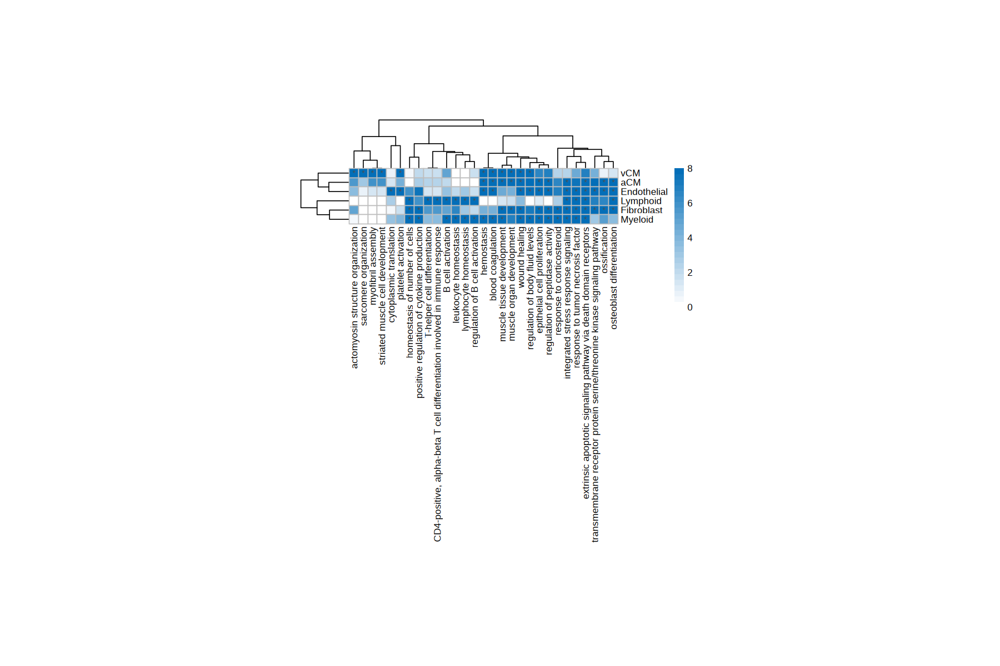

In [1257]:
qterm1 <- olist %>% 
filter(p.adjust < 0.05) %>% 
group_by(celltype) %>%
slice_max(order_by = -log10(pvalue), n = 5) %>% ungroup %>%
dplyr::select(Description) %>% unlist %>% unique %>% as.character

tmp <- olist %>% 
reshape2::dcast(Description ~ celltype, value.var = "pvalue", fun.aggregate = mean) %>%
tibble::column_to_rownames("Description")
tmp[is.na(tmp)] <- 1
tmp <- -log2(tmp)

ttp <- tmp[c(qterm1), ]
ttp[ttp > 8] <- 8

lmat <- olist %>% 
mutate(value = p.adjust) %>%
reshape2::dcast(Description ~ celltype, value.var = "value", fun.aggregate = mean) %>%
tibble::column_to_rownames("Description") 

lmat[is.na(lmat)] <- 1
lmat <- ifelse(lmat < 0.05, "*", "")

options(repr.plot.width = 15, repr.plot.height = 10)
t1 <- ttp %>% t %>%
pheatmap(cluster_cols = T, cluster_rows = T, border_color = "gray", angle_col = 90, cellwidth = 10, cellheight = 10,
         display_numbers = t(lmat[rownames(ttp), colnames(ttp)]), # breaks = seq(-4,4,0.4),
         color = colorRampPalette(c("white", "#036EB8"))(25))

In [1259]:
ggsave(t1, filename = "plot/FIG_SCENIC_HF_vs_CONTROL_FOS_target_enrichGO.pdf", 
       dpi = 300, height = 10, width = 12)

In [133]:
f <- "vCM"
tmp <- read.csv(paste0("GRN/scenicplus/", f, "/edges_R2G.csv")) %>% 
filter(is_extended == "False") %>% 
filter(Consensus_name %in% paste0(qtf, "_+_+")) %>%
select(Region) %>% distinct %>% unlist
tmp <- stringr::str_split_fixed(tmp, pattern = "[:-]", n = 3) %>% as.data.frame

write.table(tmp, paste0(f, "_FOS_target.bed"), sep = "\t", quote = F, row.names = F, col.names = F)

In [268]:
### Find Hi-C support
hg38 <- read.table("/projects/ps-renlab2/y2xie/ps-renlab/y2xie/projects/genome_ref/refdata-cellranger-arc-GRCh38-2020-A-2.0.0/regions//tss_1500bp.bed",
                   sep = "\t", header = F)
system("mkdir ../../87.FNIH_DHC_IGM_240925/05.R/APA/GRN_FOS_target/")

for(f in c('aCM','Endo','Fibro','Myeloid','vCM')){
    ct <- grep(f, colnames(rmat), value = T)[1]
    qpair <- read.csv(paste0("GRN/scenicplus/", f, "/edges_R2G.csv")) %>% 
    filter(is_extended == "False") %>% 
    filter(Consensus_name %in% paste0(qtf, "_+_+")) %>% dplyr::select(Region, Gene) %>% distinct
    
    qpair[,c("chrom", "start", "end")] <- stringr::str_split_fixed(qpair$Region, pattern = "[:-]", n = 3)
    qpair <- merge(qpair, hg38[,c(1:3,7)], by.x = "Gene", by.y = "V7") %>%
    dplyr::select(chrom, start, end, V1, V2, V3) %>% 
    filter(abs((as.integer(start) + as.integer(end))/2 - (as.integer(V2) + as.integer(V3))/2) >= 10000) ### approximation
    write.table(qpair, paste0("../../87.FNIH_DHC_IGM_240925/05.R/APA/GRN_FOS_target/", ct, ".bedpe"), sep = "\t", quote = F, row.names = F, col.names = F)
}

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables



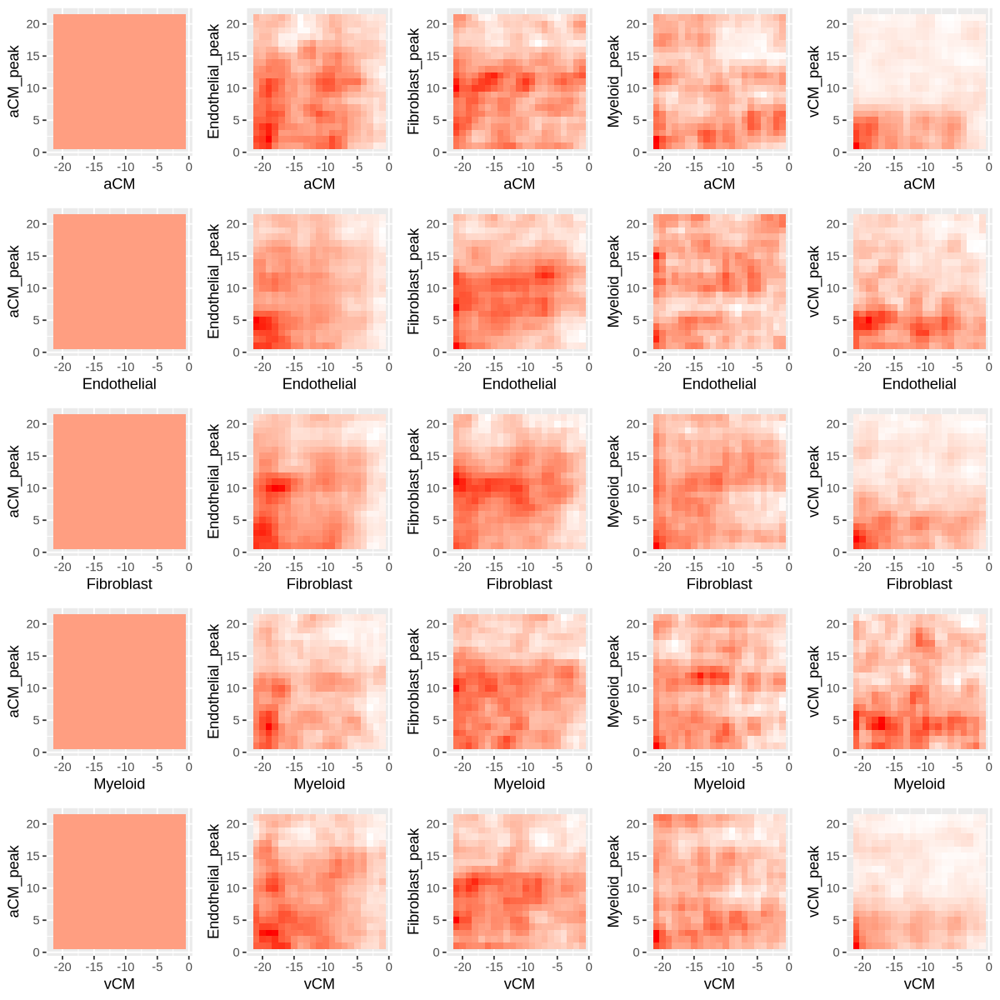

In [271]:
### Read and plot APA to see whether signal changes
plist <- list()
for (file in list.files("../../87.FNIH_DHC_IGM_240925/05.R/APA/GRN_FOS_target/", pattern = ".bedpe$")){
    f <- gsub(".bedpe", "", file)
    for (ffile in list.files(paste0("../../87.FNIH_DHC_IGM_240925/05.R/APA/GRN_FOS_target/", f))){
        tmp <- read.csv(paste0("../../87.FNIH_DHC_IGM_240925/05.R/APA/GRN_FOS_target/", f, "/", ffile, "/10000/gw/APA.txt"), header = F)
        tmp$V1 <- gsub("\\[", "", tmp$V1) %>% as.numeric
        tmp$V21 <- gsub("\\]", "", tmp$V21) %>% as.numeric
        plist[[paste0(f, ":", ffile)]] <- tmp
    }
}

pplist <- list()
for (i in 1:length(plist)){
    name <- stringr::str_split_fixed(names(plist)[i], pattern = ":", n = 2)
    pplist[[i]] <- plist[[i]] %>% mutate(id = colnames(.)) %>%
    reshape2::melt() %>% 
    mutate(id = as.integer(gsub("V", "", id))) %>% arrange(id) %>% 
    mutate(variable = as.integer(gsub("V", "", variable))) %>% arrange(variable) %>% 
    ggplot(aes(x = -id, y = variable, fill = value)) + 
    geom_tile() + NoLegend() + 
    xlab(name[1]) + ylab(name[2]) + 
    scale_fill_gradientn(colours = c("white", "red"), breaks = c(0, 0.2))
}

options(repr.plot.width = 10, repr.plot.height = 10)
cowplot::plot_grid(plotlist = pplist, ncol = 5)

### no support haha

## Separate ICM and NICM

In [ ]:
read.table("../reference/Multiome_Downstream/CHAMBER//4chambers_DESEQ2_ATAC.dds.res", header = T)

In [ ]:
### fGSEA of SCENIC+ peaks in HF versus CONTROL
# fgsea_results <- list()
# for (f in list.files("GRN/scenicplus/")){
#     ct <- grep(f, corder, value = T)[1]
#     elist <- read.csv(paste0("GRN/scenicplus/", f, "/edges_R2G.csv")) %>% filter(is_extended == "False")
#     tfr <- stringr::str_split_fixed(elist$Consensus_name, pattern = "_", n = 3)[,1] %>% unique
#     grnlist <- list()
#     for (tf in tfr){
#         grnlist[[tf]] <- elist %>% filter(Consensus_name == paste0(tf, "_+_+")) %>% dplyr::select(Region) %>% unlist %>% unique
#     }
#     ranked_genes <- read.table("../reference/Multiome_Downstream/CHAMBER/4chambers_DESEQ2_ATAC.dds.res", header = T) %>%
#     setNames(c("celltype", "contrast", "range", "log2FoldChange", "stat", "pvalue", "padj")) %>% 
#     filter(celltype == ct) %>% arrange(desc(stat)) %>%
#     mutate(range = sub("-", ":", range)) %>%
#     dplyr::select(range, stat) %>% tibble::deframe()
    
#     fgsea_results[[ct]] <- fgsea(pathways = grnlist, stats = ranked_genes, nperm = 10000)
#     fgsea_results[[ct]]$celltype <- ct
# }

qpathway <- do.call(rbind, fgsea_results) %>%
group_by(pathway) %>%
filter(min(padj) < 0.05) %>%
ungroup() %>%
select(pathway) %>% unlist %>% unique

rmat <- do.call(rbind, fgsea_results) %>%
filter(pathway %in% qpathway) %>%
mutate(value = NES) %>%
reshape2::dcast(celltype ~ pathway, value.var = "value") %>%
tibble::column_to_rownames("celltype") 

rmat <- rmat[c('vCM','aCM','Fibroblast','Endothelial','Myeloid'),] %>% t
rmat[is.na(rmat)] <- 0

lmat <- do.call(rbind, fgsea_results) %>%
filter(padj < 0.05) %>%
mutate(value = padj) %>%
reshape2::dcast(celltype ~ pathway, value.var = "value") %>%
tibble::column_to_rownames("celltype") 

lmat <- lmat[c('vCM','aCM','Fibroblast','Endothelial','Myeloid'),]
lmat[is.na(lmat)] <- 1
lmat <- ifelse(lmat < 0.05, "*", "")

options(repr.plot.width = 20, repr.plot.height = 3)
rmat <- rmat[apply(rmat, 1, function(x) max(abs(x)) >= 2),] %>% t
                   
t1 <- rmat %>%
pheatmap(cluster_rows = F, border_color = NA, angle_col = 90, cellwidth = 10, cellheight = 10,
         display_numbers = lmat[,colnames(rmat)], breaks = seq(-4,4,0.4),
         color = rev(colorRampPalette(brewer.pal(n = 8, name = "RdYlBu"))(20)))


## DE ATAC Motif finding

In [528]:
### read chromvar results
dev <- qs::qread('chromvar/devscores.qs')
ref <- qs::qread("../reference/LV_RV_LA_RA.multiome.mrg.filt.MTless.silQC.curated.RNA.qs")
ref
dim(dev)

An object of class Seurat 
70355 features across 329255 samples within 2 assays 
Active assay: SCT (33845 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, harmony, umap

[1]    692 329255

In [529]:
colnames(dev) <- gsub("\\.1", "-1", colnames(dev))
ref[["chromvar"]] <- CreateAssayObject(counts = dev)

umapd <- read.table("integration/All_data_int_umap.txt")
ref[["int.umap"]] <- CreateDimReducObject(embeddings = as.matrix(umapd[colnames(ref),]), assay = "RNA")

ref

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


An object of class Seurat 
71047 features across 329255 samples within 3 assays 
Active assay: SCT (33845 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 2 other assays present: RNA, chromvar
 4 dimensional reductions calculated: pca, harmony, umap, int.umap

In [1065]:
options(repr.plot.width = 4, repr.plot.height = 4)
ref$ttmp <- ref$disease_status_major
ref@meta.data[ref$cell.major_types != "Fibroblast",]$ttmp <- "NA"
t1 <- DimPlot(ref, group.by = "ttmp", reduction = "int.umap", cols = c('#6F4066', '#CECECE', '#B2DF8A'))

# ggsave(t1, filename = "plot/FIG_Fibro_disease_umap.pdf", dpi = 300, height = 5, width = 6)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



In [533]:
qq <- grep(paste0(c("FOXO1", "RUNX2", "IKZF1", "MEOX1", "MEOX2", "FOS", "JUN", "ATF2"), collapse = "|"), rownames(dev), value = T)
qq <- gsub("_", "-", qq)

DefaultAssay(ref) <- "chromvar"
# ref$tmp <- paste0(ref$disease_status_major, "_", ref$cell.major_types)
# tmp <- subset(ref, subset = cell.major_types %in% korder)
# tmp$tmp <- paste0(tmp$cell.major_types, "_", tmp$disease_status_major)

fig1 <- FeaturePlot(ref, features = qq, reduction = "int.umap", slot = "counts", 
                    min.cutoff = 'q10', max.cutoff = 'q90', ncol = 4) & scale_color_gradientn(colours = colorRampPalette(brewer.pal(n = 8, name = "YlGnBu"))(25))

options(repr.plot.width = 12, repr.plot.height = 36)
ggsave(fig1, filename = "plot/FIG_selected_up_motif_chromvar.pdf", dpi = 300, height = 36, width = 12)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To di

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is

## ATAC DE analysis

In [1860]:
### Active versus prime: 
active <- chmm[sub("-", ":", upd),grep("vCM", colnames(chmm))] %>%
setNames(c("CONTROL", "HF")) %>%
filter(CONTROL != "E5", HF == "E5")

for (f in unique(atacde$celltype)){
    upd <- atacde %>% filter(log2FoldChange >= 0.5, celltype == f) %>% select(range) %>% unlist
    active <- chmm[sub("-", ":", upd), grep(f, colnames(chmm))] %>%
    setNames(c("CONTROL", "HF")) %>%
    filter(CONTROL != "E5", HF == "E5")
    prime <- chmm[sub("-", ":", upd),grep(f, colnames(chmm))] %>%
    setNames(c("CONTROL", "HF")) %>%
    filter(CONTROL != "E3", HF == "E3")
    write.table(stringr::str_split_fixed(rownames(prime), pattern = "[:-]", n = 3), 
                paste0("chromhmm/ATAC_DE/", f, "_HF_primed.bed"), sep = "\t", quote = F, row.names = F, col.names = F)
    write.table(stringr::str_split_fixed(rownames(active), pattern = "[:-]", n = 3), 
                paste0("chromhmm/ATAC_DE/", f, "_HF_active.bed"), sep = "\t", quote = F, row.names = F, col.names = F)
}

In [1429]:
### vCM volcano plots
tmp <- read.table("../reference/Multiome_Downstream/CHAMBER/4chambers_DESEQ2_ATAC.dds.res", header = T) %>%
setNames(c("celltype", "contrast", "range", "log2FoldChange", "stat", "pvalue", "padj")) %>% 
filter(celltype == "vCM")

t1 <- tmp %>%
ggplot(aes(x = log2FoldChange, y = -log10(padj))) + 
geom_point(size = 1, alpha = 0.5, color = "grey") +
geom_point(data = tmp[tmp$padj < 0.05 & abs(tmp$log2FoldChange) >= 0.5, ],  
           aes(x = log2FoldChange, y = -log10(padj)), 
           size = 1, alpha = 0.5, color = colfunc2(6)[2]) +
geom_vline(xintercept = -0.5, linetype = "dashed", color = "grey", alpha = 0.5, width = 2) + 
geom_vline(xintercept = 0.5, linetype = "dashed", color = "grey", alpha = 0.5, width = 2) + 
ggtitle("HF_vs_Control") + 
xlab("log2FC") + 
xlim(-4, 4) + #ylim(0, 10) + 
theme_Publication()

ggsave(t1, filename = "plot/FIG_vCM_HF_vs_CONTROL_depeaks_volcano.pdf", dpi = 300, height = 5, width = 8)

Warning message in geom_vline(xintercept = -0.5, linetype = "dashed", color = "grey", :
“Ignoring unknown parameters: `width`”
Warning message in geom_vline(xintercept = 0.5, linetype = "dashed", color = "grey", :
“Ignoring unknown parameters: `width`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


In [1430]:
tmp[tmp$padj < 0.05 & tmp$log2FoldChange >= 0.5, ] %>% dim
tmp[tmp$padj < 0.05 & tmp$log2FoldChange <= -0.5, ] %>% dim

[1] 12358     7

[1] 6111    7

Using group, mod as id variables

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Using group, mod as id variables

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


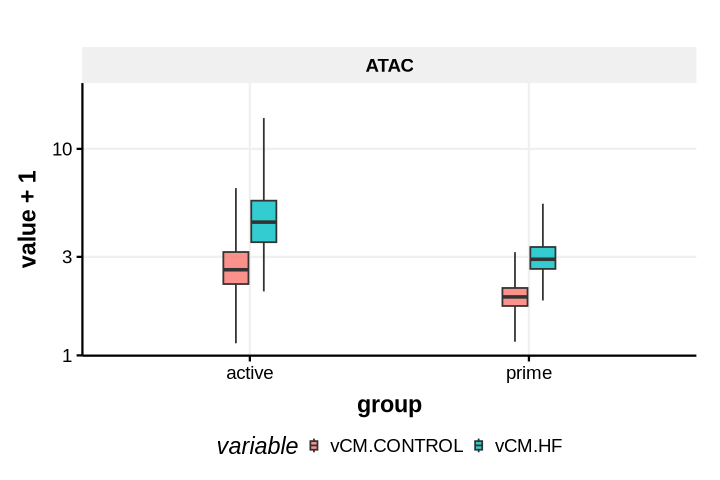

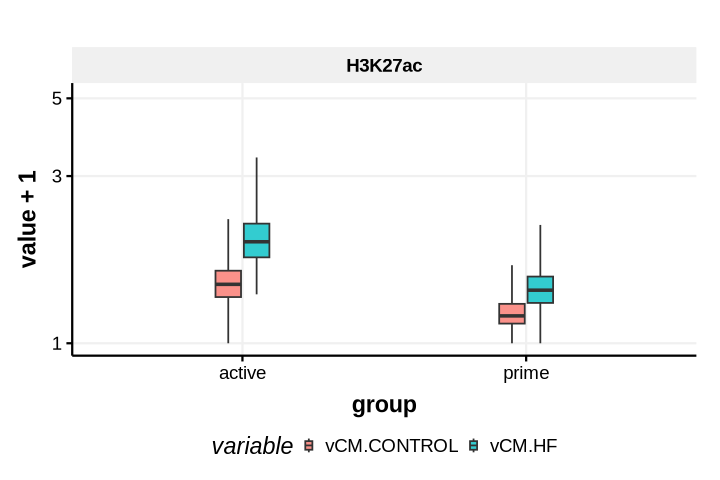

In [1634]:
### Prime / active cCREs?
active <- chmm[sub("-", ":", upd),grep("vCM", colnames(chmm))] %>%
setNames(c("CONTROL", "HF")) %>%
filter(CONTROL != "E5", HF == "E5")

prime <- chmm[sub("-", ":", upd),grep("vCM", colnames(chmm))] %>%
setNames(c("CONTROL", "HF")) %>%
filter(CONTROL != "E3", HF == "E3")

f1 <- atac[sub(":", "-", rownames(active)), grep("vCM", colnames(atac))] %>%
mutate(group = "active", mod = "ATAC")
f2 <- atac[sub(":", "-", rownames(prime)), grep("vCM", colnames(atac))] %>%
mutate(group = "prime", mod = "ATAC")

options(repr.plot.width = 6, repr.plot.height = 4)
do.call(rbind, list(f1, f2)) %>%
reshape2::melt() %>%
ggplot(aes(x = group, y = value+1, fill = variable)) + 
geom_boxplot(width = 0.2, coef = 2, outlier.shape = NA, alpha = 0.8) +
scale_y_log10() + 
theme_Publication() + 
facet_grid(. ~ mod)

f1 <- k27ac[rownames(active), grep("vCM", colnames(k27ac))] %>%
mutate(group = "active", mod = "H3K27ac")
f2 <- k27ac[rownames(prime), grep("vCM", colnames(k27ac))] %>%
mutate(group = "prime", mod = "H3K27ac")

do.call(rbind, list(f1, f2)) %>%
reshape2::melt() %>%
ggplot(aes(x = group, y = value+1, fill = variable)) + 
geom_boxplot(width = 0.2, coef = 2, outlier.shape = NA, alpha = 0.8) +
scale_y_log10() + 
theme_Publication() + 
facet_grid(. ~ mod)

In [ ]:
qgene <- tchmm %>% 
filter(vCM_CONTROL == "E1", vCM_HF == "E2") %>%
rownames

qtable <- enrichr(qgene, dbs)
lapply(qtable, function(x) x %>% filter(Adjusted.P.value < 0.05) %>% dim) 

### Can we separate primed from active?


In [1636]:
write.table(stringr::str_split_fixed(upd, pattern = "[:-]", n = 3), 
            "chromhmm/ATAC_DE/vCM_HF_up.bed", sep = "\t", quote = F, row.names = F, col.names = F)
write.table(stringr::str_split_fixed(rownames(prime), pattern = "[:-]", n = 3), 
            "chromhmm/ATAC_DE/vCM_HF_primed.bed", sep = "\t", quote = F, row.names = F, col.names = F)
write.table(stringr::str_split_fixed(rownames(active), pattern = "[:-]", n = 3), 
            "chromhmm/ATAC_DE/vCM_HF_active.bed", sep = "\t", quote = F, row.names = F, col.names = F)

In [1635]:
### Enrichment calculation 
dim(prime); dim(active)

[1] 2660    2

[1] 2092    2

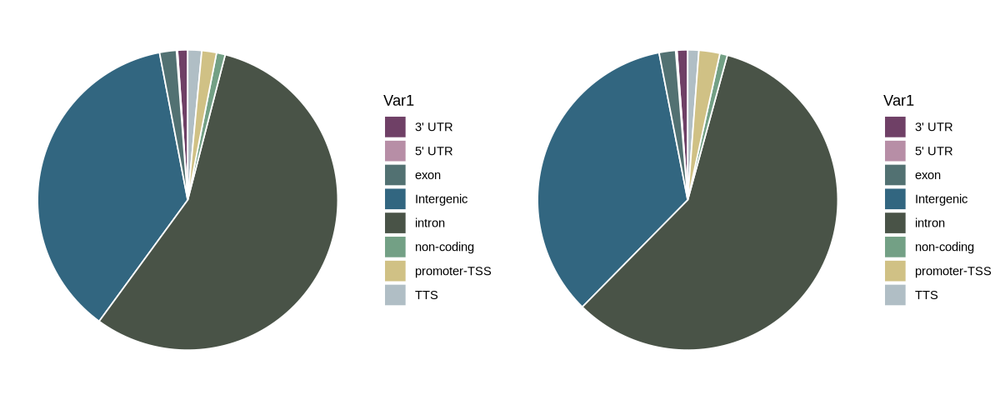

In [1783]:
panno <- read.csv("../reference/FNIH_peaks/Heart_UnionPeak.anno", sep = "\t") %>% 
mutate(ccre = paste0(Chr, ":", Start-1, "-", End))

t1 <- sum_anno(panno[panno$ccre %in% rownames(prime), ]) %>% 
mutate(percentage = (Freq / sum(Freq)) * 100,
       label = paste0(round(percentage, 2), "%"),
       ypos = (cumsum(Freq) - Freq) / 2) %>%
ggplot(aes(x = "", y = Freq, fill = Var1)) +
geom_bar(width = 1, stat = "identity", color = "white") +
coord_polar(theta = "y") + 
theme_void() + 
scale_fill_manual(values = cols0)

t2 <- sum_anno(panno[panno$ccre %in% rownames(active), ]) %>% 
mutate(percentage = (Freq / sum(Freq)) * 100,
       label = paste0(round(percentage, 2), "%"),
       ypos = (cumsum(Freq) - Freq) / 2) %>%
ggplot(aes(x = "", y = Freq, fill = Var1)) +
geom_bar(width = 1, stat = "identity", color = "white") +
coord_polar(theta = "y") + 
theme_void() + 
scale_fill_manual(values = cols0)

options(repr.plot.width = 10, repr.plot.height = 4)
cowplot::plot_grid(t1, t2)

In [ ]:
motif <- list()
for (file in list.files("chromhmm/ATAC_DE/motif/", pattern  = "vCM_HF_[primed|active]")){
    motif[[file]] <- read.csv(paste0("chromhmm/ATAC_DE/motif/", file, "/knownResults.txt"), header = T, sep = "\t") %>%
    setNames(c("motif", "consensus", "p_value", "log_p_value", "fdr", "tgt_num", "tgt_pct", "bgd_num", "bgd_pct")) %>%
    mutate(cond = file)
}

vmotif <- do.call(rbind, motif) %>% group_by(motif) %>% 
filter(min(fdr) < 0.05) %>% ungroup() %>%
select(motif) %>% unlist %>% unique

motif <- do.call(rbind, motif) %>%
filter(motif %in% vmotif) %>%
reshape2::dcast(cond ~ motif, value.var = "p_value") %>%
tibble::column_to_rownames("cond") %>% t
motif[is.na(motif)] <- 1
motif <- -log2(motif)
motif[motif > 30] <- 30

options(repr.plot.width = 6, repr.plot.height = 8)
set.seed(921)
t1 <- motif %>% t %>%
pheatmap(scale = "none", cluster_rows = T, cluster_cols = T, #gaps_row = 4, 
         show_colnames = T, border_color = NA,
         color = colorRampPalette(brewer.pal(n = 8, name = "YlGnBu"))(25))

t2 <- motif %>% as.data.frame %>%
tibble::rownames_to_column('motif') %>%
reshape2::melt() %>% 
mutate(motif = factor(motif, levels = c(t1$tree_col$labels[t1$tree_col$order]))) %>%
ggplot(aes(y = motif, x = variable, color = value, size = value)) + 
geom_point() + 
scale_color_gradientn(colors = colorRampPalette(brewer.pal(n = 8, name = "YlGnBu"))(25)) + 
theme_Publication() + 
theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

t2
ggsave(t2, filename = "plot/FIG_vCM_HF_vs_CONTROL_depeaks_motif_prime_active.pdf", dpi = 300, height = 6, width = 5)

### Calculate motif enrichment?
write.table(rownames(motif), "chromhmm/ATAC_DE/motif_instance/allmotif.tsv", 
            sep = "\t", quote = F, row.names = F, col.names = F)

Using motif as id variables

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


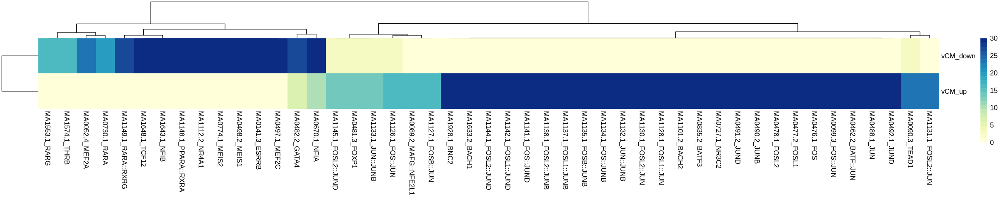

In [1172]:
motif <- list()
for (file in list.files("motif/", pattern  = "vCM.*")){
    motif[[file]] <- read.csv(paste0("motif/", file, "/knownResults.txt"), header = T, sep = "\t") %>%
    setNames(c("motif", "consensus", "p_value", "log_p_value", "fdr", "tgt_num", "tgt_pct", "bgd_num", "bgd_pct")) %>%
    mutate(cond = file)
}

vmotif <- do.call(rbind, motif) %>% group_by(motif) %>% 
filter(min(fdr) < 0.05) %>% ungroup() %>%
select(motif) %>% unlist %>% unique

motif <- do.call(rbind, motif) %>%
filter(motif %in% vmotif) %>%
reshape2::dcast(cond ~ motif, value.var = "p_value") %>%
tibble::column_to_rownames("cond") %>% t
motif[is.na(motif)] <- 1
motif <- -log2(motif)
motif[motif > 30] <- 30

### Match with TF regulon and abc
elist <- read.csv("GRN/scenicplus/vCM/edges_R2G.csv") %>% filter(is_extended == "False")
p1 <- elist %>% select(c(Region, Gene)) %>% distinct %>% mutate(pair = paste0(Region, ":", Gene))
p2 <- abc2 %>% filter(CellType == "vCM") %>% select(c(range, TargetGene)) %>% distinct %>% mutate(pair = paste0(range, ":", TargetGene))
telist <- elist %>% filter(paste0(Region, ":", Gene) %in% intersect(p1$pair, p2$pair))
tfr <- stringr::str_split_fixed(telist$Consensus_name, pattern = "_", n = 3)[,1] %>% unique

tmtx <- motif[grep(paste0(tfr, collapse = "|"), rownames(motif)), ] %>%
as.data.frame
tmtx <- tmtx[rowSums(tmtx) >= 20,] ### Filter some bad

options(repr.plot.width = 20, repr.plot.height = 4)
set.seed(921)
t1 <- tmtx %>% t %>%
pheatmap(scale = "none", cluster_rows = T, cluster_cols = T, #gaps_row = 4, 
         show_colnames = T, border_color = NA,
         color = colorRampPalette(brewer.pal(n = 8, name = "YlGnBu"))(25))

t2 <- tmtx %>% as.data.frame %>%
tibble::rownames_to_column('motif') %>%
reshape2::melt() %>% 
mutate(motif = factor(motif, levels = c(t1$tree_col$labels[t1$tree_col$order]))) %>%
ggplot(aes(y = variable, x = motif, color = value, size = value)) + 
geom_point() + 
scale_color_gradientn(colors = colorRampPalette(brewer.pal(n = 8, name = "YlGnBu"))(25)) + 
theme_Publication() + 
theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

ggsave(t2, filename = "plot/FIG_vCM_HF_vs_CONTROL_depeaks_motif_grn.pdf", dpi = 300, height = 4, width = 10)

In [1750]:
### Filter prime- / active- motifs
motif <- list()
for (file in list.files("motif/", pattern  = "vCM.*")){
    motif[[file]] <- read.csv(paste0("motif/", file, "/knownResults.txt"), header = T, sep = "\t") %>%
    setNames(c("motif", "consensus", "p_value", "log_p_value", "fdr", "tgt_num", "tgt_pct", "bgd_num", "bgd_pct")) %>%
    mutate(cond = file)
}
for (file in list.files("chromhmm/ATAC_DE/motif/", pattern  = "vCM_HF_(primed|active)_allbg")){
    motif[[file]] <- read.csv(paste0("chromhmm/ATAC_DE/motif/", file, "/knownResults.txt"), header = T, sep = "\t") %>%
    setNames(c("motif", "consensus", "p_value", "log_p_value", "fdr", "tgt_num", "tgt_pct", "bgd_num", "bgd_pct")) %>%
    mutate(cond = file)
}

vmotif <- do.call(rbind, motif) %>% group_by(motif) %>% 
filter(min(fdr) < 0.05) %>% ungroup() %>%
select(motif) %>% unlist %>% unique

qmtx <- do.call(rbind, motif) %>%
filter(motif %in% vmotif) %>%
reshape2::dcast(cond ~ motif, value.var = "fdr") %>%
tibble::column_to_rownames("cond") %>% t %>% as.data.frame
motif[is.na(qmtx)] <- 1

### Filter what motifs?
t1 <- qmtx %>% filter(vCM_up < 0.05, vCM_HF_primed_allbg < 0.05) %>% rownames
t2 <- qmtx %>% filter(vCM_up < 0.05, vCM_HF_active_allbg < 0.05) %>% rownames

qmtx %>% dim
t1 %>% length
t2 %>% length

[1] 304   4

[1] 47

[1] 53

In [1751]:
write.table(unique(c(t1,t2)), "motif/motif_instance/allmotif.tsv", sep = "\t", quote = F, row.names = F, col.names = F)

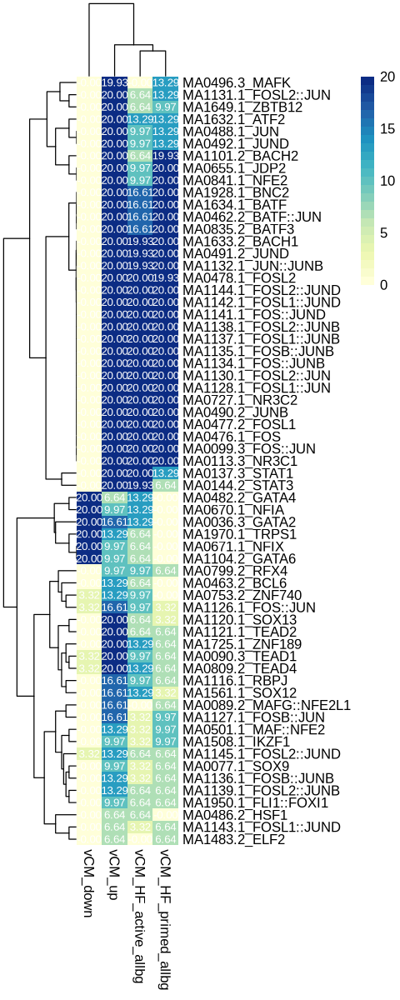

In [1753]:
### only show motifs for comparsion
# qmotif <- qmtx %>% filter(vCM_up < 0.01 & (vCM_HF_primed_allbg < 0.01 | vCM_HF_active_allbg < 0.01))
m1 <- do.call(rbind, motif) %>%
filter(motif %in% unique(c(t1,t2))) %>%
reshape2::dcast(cond ~ motif, value.var = "p_value") %>%
tibble::column_to_rownames("cond") %>% t %>% as.data.frame
m1[is.na(m1)] <- 1
m1 <- -log2(m1)
m1[m1 > 20] <- 20

tmtx <- round(m1, 2) %>% as.data.frame
tlabel <- round(tmtx, 1) %>% as.matrix
tlabel <- ifelse(tlabel > -log2(0.0001), "***", ifelse(tlabel > -log2(0.001), "**", ifelse(tlabel > -log2(0.01), "*", ifelse(tlabel <= -log2(0.01), "", tlabel))))

options(repr.plot.width = 4, repr.plot.height = 10)
set.seed(921)
f1 <- tmtx %>% 
pheatmap(scale = "none", cluster_rows = T, cluster_cols = T, number_color = "white", 
         display_numbers = TRUE, show_colnames = T, border_color = NA,
         color = colorRampPalette(brewer.pal(n = 8, name = "YlGnBu"))(25))

ggsave(f1, filename = "plot/FIG_vCM_HF_vs_CONTROL_depeaks_active_prime_motif_2.pdf", dpi = 300, height = 12, width = 5)

In [1754]:
### motif instance in all DE peaks??
pmotif <- read.csv("motif/motif_instance/vCM_instance//vCM_instance.txt", header = T, sep = "\t")
plist <- list()
for (f in unique(pmotif$Motif.Name)){
    tmp <- pmotif %>% filter(Motif.Name == f) %>% select(PositionID) %>% unlist
    tmp <- intersect(tmp, sub("-", ":", c(upd, downd)))
    plist[[f]] <- chmm[tmp, grep("vCM", colnames(chmm))] %>%
    count(across(everything())) %>%
    mutate(id = 1:nrow(.)) %>%
    tidyr::pivot_longer(cols = starts_with("vCM"), names_to = "stage", values_to = "state") %>%
    mutate(state = factor(state, levels = c("E2", "E1", "E3", "E4", "E5"))) %>%
    ggplot(aes(x = stage, stratum = state, alluvium = id, y = n, fill = state)) +
    geom_flow() + ylab("Frequency") + 
    geom_stratum(color = "white") +
    theme_Publication() + ggtitle(paste0(f)) + 
    NoLegend() + 
    scale_fill_manual(values = cols)
}

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behav

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


In [1755]:
### Use Active / Primed ratio for comparsion?
ctable <- list()
for (f in unique(pmotif$Motif.Name)){
    tmp <- pmotif %>% filter(Motif.Name == f) %>% select(PositionID) %>% unlist
    tmp <- intersect(tmp, sub("-", ":", c(upd)))
    t1 <- chmm[tmp, grep("vCM", colnames(chmm))] %>%
    setNames(c("CONTROL", "HF")) %>%
    filter(CONTROL != "E5", HF == "E5")

    t2 <- chmm[tmp,grep("vCM", colnames(chmm))] %>%
    setNames(c("CONTROL", "HF")) %>%
    filter(CONTROL != "E3", HF == "E3")
    
    tmtx <- data.frame(active = c(nrow(active), nrow(t1)), prime = c(nrow(prime), nrow(t2)))
    ctable[[f]] <- data.frame(motif = f, pvalue = chisq.test(tmtx)$p.value, stat = chisq.test(tmtx)$statistic)
}

ctable <- do.call(rbind, ctable)
ctable$fdr <- p.adjust(ctable$pvalue)

qqmotif <- ctable %>% filter(fdr < 0.05) %>% rownames
m1[qqmotif, ]

,vCM_down,vCM_HF_active_allbg,vCM_HF_primed_allbg,vCM_up
,<dbl>,<dbl>,<dbl>,<dbl>
MA0113.3_NR3C1,0.000000,20.000000,20.000000,20.000000
MA0482.2_GATA4,20.000000,13.287712,0.000000,6.643856
MA0496.3_MAFK,0.000000,0.000000,13.287712,19.931569
MA0670.1_NFIA,20.000000,13.287712,0.000000,9.965784
MA0671.1_NFIX,20.000000,6.643856,0.000000,9.965784
MA0727.1_NR3C2,0.000000,20.000000,20.000000,20.000000
MA0753.2_ZNF740,3.321928,9.965784,0.000000,13.287712
MA1101.2_BACH2,0.000000,6.643856,19.931569,20.000000
MA1483.2_ELF2,0.000000,0.000000,6.643856,6.643856


In [1757]:
qqmotif <- ctable %>% filter(fdr < 0.05) %>% rownames
options(repr.plot.width = 20, repr.plot.height = 8)
cowplot::plot_grid(plotlist = plist[qmotif], ncol = 5)

ERROR: Error in plist[qmotif]: invalid subscript type 'list'


In [1769]:
# options(repr.plot.width = 5, repr.plot.height = 5)
# plist[['MA0496.3_MAFK']]
# plist[['MA0482.2_GATA4']]

tmp <- pmotif %>% filter(Motif.Name == "MA0496.3_MAFK") %>% select(PositionID) %>% unlist
tmp <- intersect(tmp, sub("-", ":", c(upd)))
t1 <- chmm[tmp, grep("vCM", colnames(chmm))] %>%
setNames(c("CONTROL", "HF")) %>%
filter(CONTROL != "E5", HF == "E5")

t2 <- chmm[tmp,grep("vCM", colnames(chmm))] %>%
setNames(c("CONTROL", "HF")) %>%
filter(CONTROL != "E3", HF == "E3")

In [1780]:
dim(t1); dim(t2)
elist %>% filter(Region %in% rownames(t1)) %>% select(Consensus_name) %>% unlist %>% unique
elist %>% filter(Region %in% rownames(t2)) %>% select(Consensus_name) %>% unlist %>% unique

[1] 228   2

[1] 359   2

[1] "ATF3_+_+"   "BACH1_+_+"  "BACH2_+_+"  "BATF_+_+"   "BNC2_+_+"  
 [6] "CREB5_+_+"  "EBF1_+_+"   "ERG_+_+"    "FLI1_+_+"   "FOS_+_+"   
[11] "FOSB_+_+"   "FOSL2_+_+"  "FOXO1_+_+"  "FOXP1_+_+"  "JUN_+_+"   
[16] "MAF_+_+"    "MAFB_+_+"   "MAFF_+_+"   "NFE2L2_+_+" "SMAD3_+_+" 
[21] "TFCP2_+_+"  "BCL11A_-_+" "BNC2_-_+"   "MEF2A_-_+"  "NFE2L1_-_+"
[26] "NR3C2_-_+"

[1] "BACH1_+_+"  "BACH2_+_+"  "BNC2_+_+"   "ELK3_+_+"   "ERG_+_+"   
 [6] "ETS1_+_+"   "FLI1_+_+"   "IKZF1_+_+"  "KLF2_+_+"   "KLF4_+_+"  
[11] "MEF2C_+_+"  "NFE2L2_+_+" "NFIB_+_+"   "PRRX1_+_+"  "RFX3_+_+"  
[16] "SMAD3_+_+"  "WT1_+_+"    "ATF3_-_+"   "BCL11A_-_+"

In [ ]:
for (f in unique(pmotif$Motif.Name)){
    tmp <- pmotif %>% filter(Motif.Name == f) %>% select(PositionID) %>% unlist
    tmp <- intersect(tmp, sub("-", ":", c(upd, downd)))
    plist[[f]] <- chmm[tmp, grep("vCM", colnames(chmm))] %>%
    count(across(everything())) %>%
    mutate(id = 1:nrow(.)) %>%
    tidyr::pivot_longer(cols = starts_with("vCM"), names_to = "stage", values_to = "state") %>%
    mutate(state = factor(state, levels = c("E2", "E1", "E3", "E4", "E5"))) %>%
    ggplot(aes(x = stage, stratum = state, alluvium = id, y = n, fill = state)) +
    geom_flow() + ylab("Frequency") + 
    geom_stratum(color = "white") +
    theme_Publication() + ggtitle(paste0(f)) + 
    NoLegend() + 
    scale_fill_manual(values = cols)
}

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behav

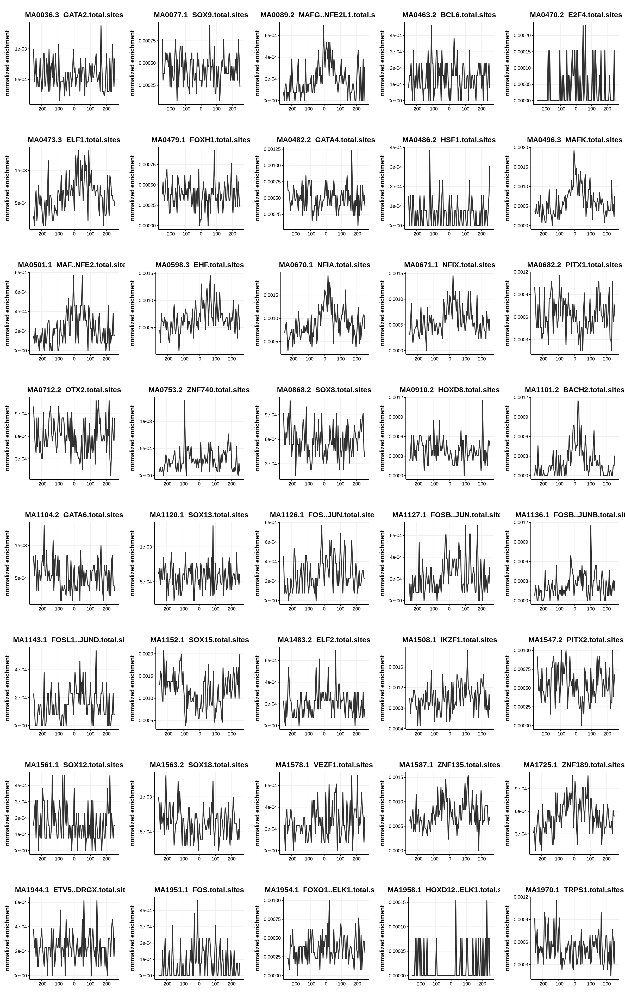

In [1553]:
### motif pileup?
anno1 <- read.csv("chromhmm/ATAC_DE/motif_instance/vCM_HF_primed_motif_enrichment.anno", sep = "\t")
anno1$distance <- anno1[,1]
anno1[,1] <- NULL

qmotif <- grep("total.sites", colnames(anno1), value = T)
plist <- list()

for (f in qmotif){
    plist[[f]] <- anno1[,c(f, "distance")] %>% setNames(c("motif", "distance")) %>%
    filter(distance >= -250 & distance <= 250) %>%
    ggplot(aes(x = distance, y = motif)) + 
    geom_line(alpha = 0.8, linewidth = 1) + 
    theme_classic() + xlab("") + ylab("normalized enrichment") + 
    theme_Publication() + ggtitle(f)
}

options(repr.plot.width = 20, repr.plot.height = 32)
cowplot::plot_grid(plotlist = plist, ncol = 5)

In [1705]:
### Find overlap with GRN
# elist <- read.csv("GRN/scenicplus/vCM/edges_R2G.csv") %>% filter(is_extended == "False")
# tfr <- stringr::str_split_fixed(elist$Consensus_name, pattern = "_", n = 3)[,1] %>% unique
grep(paste0(tfr, collapse = "|"), t1, value = T)
grep(paste0(tfr, collapse = "|"), t2, value = T)

grep(paste0(tfr, collapse = "|"), rownames(qmotif), value = T)

[1] "MA0089.2_MAFG::NFE2L1" "MA0496.3_MAFK"         "MA0501.1_MAF::NFE2"   
[4] "MA1101.2_BACH2"        "MA1127.1_FOSB::JUN"    "MA1136.1_FOSB::JUNB"  
[7] "MA1143.1_FOSL1::JUND"  "MA1508.1_IKZF1"        "MA1951.1_FOS"

[1] "MA0090.3_TEAD1"       "MA0482.2_GATA4"       "MA0670.1_NFIA"       
[4] "MA0809.2_TEAD4"       "MA1126.1_FOS::JUN"    "MA1950.1_FLI1::FOXI1"

[1] "MA0089.2_MAFG::NFE2L1" "MA0090.3_TEAD1"        "MA0099.3_FOS::JUN"    
 [4] "MA0462.2_BATF::JUN"    "MA0476.1_FOS"          "MA0477.2_FOSL1"       
 [7] "MA0478.1_FOSL2"        "MA0482.2_GATA4"        "MA0488.1_JUN"         
[10] "MA0490.2_JUNB"         "MA0491.2_JUND"         "MA0492.1_JUND"        
[13] "MA0496.3_MAFK"         "MA0501.1_MAF::NFE2"    "MA0670.1_NFIA"        
[16] "MA0727.1_NR3C2"        "MA0809.2_TEAD4"        "MA0835.2_BATF3"       
[19] "MA1101.2_BACH2"        "MA1126.1_FOS::JUN"     "MA1127.1_FOSB::JUN"   
[22] "MA1128.1_FOSL1::JUN"   "MA1130.1_FOSL2::JUN"   "MA1131.1_FOSL2::JUN"  
[25] "MA1132.1_JUN::JUNB"    "MA1134.1_FOS::JUNB"    "MA1135.1_FOSB::JUNB"  
[28] "MA1136.1_FOSB::JUNB"   "MA1137.1_FOSL1::JUNB"  "MA1138.1_FOSL2::JUNB" 
[31] "MA1139.1_FOSL2::JUNB"  "MA1141.1_FOS::JUND"    "MA1142.1_FOSL1::JUND" 
[34] "MA1143.1_FOSL1::JUND"  "MA1144.1_FOSL2::JUND"  "MA1145.1_FOSL2::JUND" 
[37] "MA1508.1_IKZF1"        "MA1633.2_BACH1"        "MA1634.1_BATF"        
[40] "MA1725.1_ZNF189"       "MA1928.1_BNC2"         "MA1950.1_FLI1::FOXI1" 
[43] "MA1951.1_FOS"

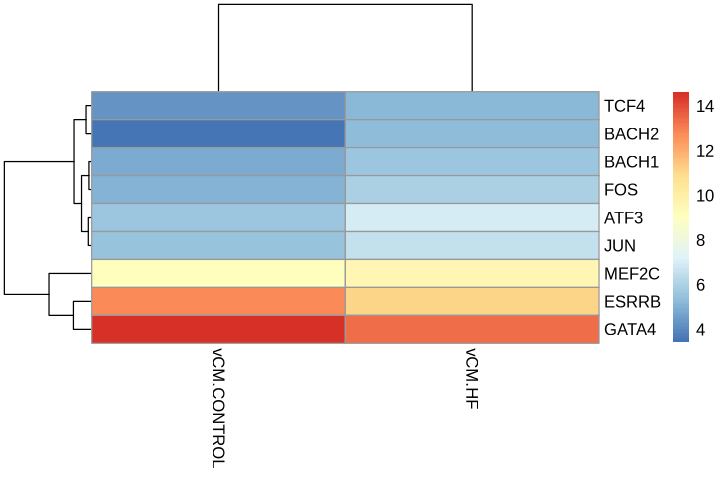

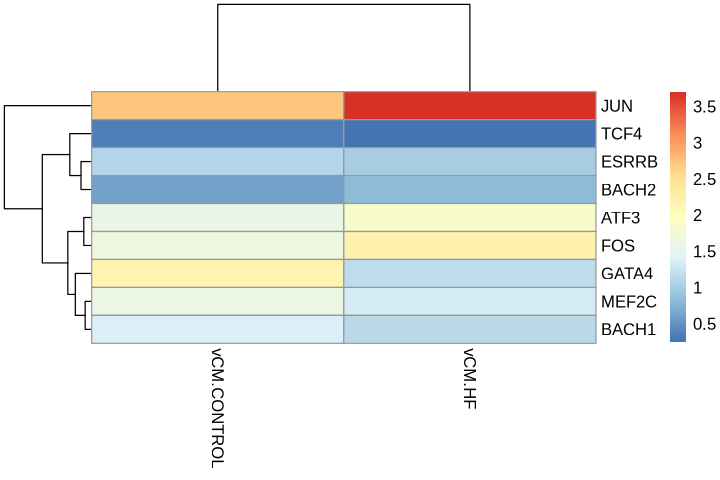

In [1253]:
### Histone, chromatin states, Hi-C
chmmlist <- peaklist <- genelist <- list()
for (tf in tth){
    tpeak <- glist[[tf]] %>% select(Region) %>% unlist %>% unique
    tgene <- glist[[tf]] %>% select(Gene) %>% unlist %>% unique
    peaklist[[tf]] <- atac[sub(":", "-", tpeak), grep("vCM", colnames(atac))] %>% apply(MARGIN = 2, median)
    genelist[[tf]] <- rpkm[tgene, grep("vCM", colnames(rpkm))] %>% apply(MARGIN = 2, median)
    chmmlist[[tf]] <- chmm[tpeak, grep("vCM", colnames(chmm))]
}

options(repr.plot.width = 6, repr.plot.height = 4)

do.call(rbind, peaklist) %>%
pheatmap()

do.call(rbind, genelist) %>%
pheatmap()

In [ ]:
### Association of DE peaks and abc links

In [1515]:
# abc <- read.table("../../87.FNIH_DHC_IGM_240925/05.R/abc/celltype//output/abc_bedpe/abc_lite_distalpairs.tsv", header = T)
ppeak <- abc %>% filter(CellType == "vCM") %>% select(range) %>% unlist %>% unique
length(ppeak)
intersect(ppeak, sub("-", ":", upd)) %>% length
intersect(ppeak, sub("-", ":", downd)) %>% length
intersect(ppeak, rownames(active)) %>% length
intersect(ppeak, rownames(prime)) %>% length

[1] 5310

[1] 125

[1] 242

[1] 4

[1] 2

In [1520]:
ppeak <- elist %>% select(Region) %>% unlist %>% unique
length(ppeak)
intersect(ppeak, sub("-", ":", upd)) %>% length
intersect(ppeak, sub("-", ":", downd)) %>% length
intersect(ppeak, rownames(active)) %>% length
intersect(ppeak, rownames(prime)) %>% length

[1] 4836

[1] 543

[1] 205

[1] 151

[1] 60

In [1518]:
abc %>% filter(CellType == "vCM") %>% filter(range %in% intersect(ppeak, rownames(active)))
abc %>% filter(CellType == "vCM") %>% filter(range %in% intersect(ppeak, rownames(prime)))

chr,start.x,end.x,range,name,CPM,chrom.x,start.y,end.y,TargetGene,RPKM,CellType,ABC.Score
<chr>,<int>,<int>,<chr>,<chr>,<dbl>,<chr>,<int>,<int>,<chr>,<dbl>,<chr>,<dbl>
chr18,80103179,80103479,chr18:80103179-80103479,intergenic|chr18:80103179-80103479,0.5411044,chr18,80109262,80109263,ADNP2,1.023859,vCM,0.020907
chr3,178277674,178277974,chr3:178277674-178277974,genic|chr3:178277674-178277974,1.3141107,chr3,178272932,178272933,KCNMB2,1.094005,vCM,0.022967
chr6,53910928,53911228,chr6:53910928-53911228,genic|chr6:53910928-53911228,1.5750003,chr6,53929982,53929983,MLIP,12.355312,vCM,0.026942
chrX,136822673,136822973,chrX:136822673-136822973,intergenic|chrX:136822673-136822973,0.7246934,chrX,136847796,136847797,AL683813.1,4.879663,vCM,0.028655


chr,start.x,end.x,range,name,CPM,chrom.x,start.y,end.y,TargetGene,RPKM,CellType,ABC.Score
<chr>,<int>,<int>,<chr>,<chr>,<dbl>,<chr>,<int>,<int>,<chr>,<dbl>,<chr>,<dbl>
chr6,99436079,99436379,chr6:99436079-99436379,genic|chr6:99436079-99436379,0.4058283,chr6,99425330,99425331,PNISR,8.062265,vCM,0.027960
chr6,99436079,99436379,chr6:99436079-99436379,genic|chr6:99436079-99436379,0.4058283,chr6,99424922,99424923,AL513550.1,4.211135,vCM,0.027959
chrX,28933190,28933490,chrX:28933190-28933490,genic|chrX:28933190-28933490,0.4058283,chrX,28942050,28942051,AC003659.1,6.122329,vCM,0.025748


In [481]:
f <- "vCM"
tpeak <- atacde %>% filter(log2FoldChange >= 1) %>% filter(celltype == f) %>% select(range) %>% unlist %>% unique

options(repr.plot.width = 5, repr.plot.height = 5)
t1 <- chmm[sub("-", ":", tpeak), grep(f, colnames(chmm))] %>% 
filter(vCM_CONTROL != "E5", vCM_HF == "E5") %>%
count(across(everything())) %>%
mutate(id = 1:nrow(.)) %>%
tidyr::pivot_longer(cols = starts_with(f), names_to = "stage", values_to = "state") %>%
mutate(state = factor(state, levels = c("E2", "E1", "E3", "E4", "E5"))) %>%
ggplot(aes(x = stage, stratum = state, alluvium = id, y = n, fill = state)) +
geom_flow() + ylab("Frequency") + 
geom_stratum(color = "white") +
theme_Publication() + ggtitle(paste0(f, ", log2FoldChange >= 1")) + 
NoLegend() + 
scale_fill_manual(values = cols)

ggsave(t1, filename = "plot/FIG_diffATAC_vCM_up_chromhmm.pdf", dpi = 300, height = 5, width = 5)

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


In [401]:
# write.table(stringr::str_split_fixed(tpeak, pattern = "-", n = 3), "vCM_HF_gained_E5.bed", sep = "\t", quote = F, row.names = F, col.names = F)

In [437]:
f <- "vCM"
tpeak <- atacde %>% filter(log2FoldChange >= 1) %>% filter(celltype == f) %>% select(range) %>% unlist %>% unique
data <- chmm[sub("-", ":", tpeak), sort(grep(f, colnames(chmm), value = T))] %>%
setNames(c("CONTROL", "HF")) %>%
filter(HF == "E5", CONTROL != "E5") %>%
select(CONTROL)

panno <- read.csv('vCM_HF_gained_E5.anno', header = T, sep = "\t") %>% 
mutate(range = paste0(Chr, ":", Start-1, "-", End)) %>%
tibble::column_to_rownames('range')

plist <- list()
for (f in unique(data$CONTROL)){
    qpeak <- data %>% filter(CONTROL == f) %>% rownames
    plist[[f]] <- sum_detailed_anno(panno[qpeak, ]) %>% 
        mutate(percentage = (Freq / sum(Freq)) * 100,
               label = paste0(round(percentage, 2), "%"),
               ypos = (cumsum(Freq) - Freq) / 2) %>%
        ggplot(aes(x = "", y = Freq, fill = Var1)) +
        geom_bar(width = 1, stat = "identity", color = "white") +
        coord_polar(theta = "y") + 
        theme_void() + ggtitle(paste0(f, ", npeaks = ", length(qpeak))) + #theme(legend.position = "none") +  # Remove legend if not needed
        scale_fill_manual(values = cols0)
}

In [591]:
f <- "vCM"
tpeak <- atacde %>% filter(log2FoldChange <= -1) %>% filter(celltype == f) %>% select(range) %>% unlist %>% unique
t1 <- chmm[sub("-", ":", tpeak), sort(grep(f, colnames(chmm), value = T))] %>%
setNames(c("CONTROL", "HF")) %>%
filter(HF != "E5", CONTROL == "E5") %>%
mutate(HF = factor(HF, levels = c("E2", "E1", "E3", "E4", "E5"))) %>%
select(HF) %>%
table %>% as.data.frame %>%
ggplot(aes(x = "", y = Freq, fill = HF)) + 
geom_bar(stat = "identity", position = position_fill(), color = "white") +
theme_Publication() + ggtitle("down regulated") + 
scale_fill_manual(values = c("#c0c0c0", "#cd5c5c", "#008000", "#ffc800", '#66cdaa'))

tpeak <- atacde %>% filter(log2FoldChange >= 1) %>% filter(celltype == f) %>% select(range) %>% unlist %>% unique
t2 <- chmm[sub("-", ":", tpeak), sort(grep(f, colnames(chmm), value = T))] %>%
setNames(c("CONTROL", "HF")) %>%
filter(HF == "E5", CONTROL != "E5") %>%
mutate(CONTROL = factor(CONTROL, levels = c("E2", "E1", "E3", "E4", "E5"))) %>%
select(CONTROL) %>%
table %>% as.data.frame %>%
ggplot(aes(x = "", y = Freq, fill = CONTROL)) + 
geom_bar(stat = "identity", position = position_fill(), color = "white") +
theme_Publication() + ggtitle("up regulated") + 
scale_fill_manual(values = c("#c0c0c0", "#cd5c5c", "#008000", "#ffc800", '#66cdaa'))

options(repr.plot.width = 4, repr.plot.height = 5)
fig1 <- cowplot::plot_grid(t1, t2)

ggsave(fig1, filename = "plot/FIG_diffATAC_vCM_chromhmm_switched_states.pdf", dpi = 300, height = 5, width = 4)

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


In [455]:
### motif?
system("mkdir -p chromhmm/ATAC_DE/motif")
qpeak <- atacde %>% 
filter(log2FoldChange >= 1) %>% 
select(celltype, range) %>% distinct %>%
mutate(celltype = factor(celltype, levels = corder)) %>%
arrange(celltype)

plist <- list()
for (f in unique(qpeak$celltype)){
    tpeak <- qpeak %>% filter(celltype == f) %>% select(range) %>% unlist %>% unique
    if (length(tpeak) >= 5){
        data <- chmm[sub("-", ":", tpeak), grep(f, colnames(chmm))] %>% 
        setNames(c("CONTROL", "HF")) %>%
        filter(HF == "E5", CONTROL != "E5")
        write.table(stringr::str_split_fixed(rownames(data), pattern = "[-:]", n = 3), 
                    paste0("chromhmm/ATAC_DE/motif/", f, "_HF_gained.bed"), 
                    sep = "\t", quote = F, row.names = F, col.names = F)
        for (s in unique(data$CONTROL)){
            ttpeak <- data %>% filter(CONTROL == s) %>% rownames
            write.table(stringr::str_split_fixed(ttpeak, pattern = "[-:]", n = 3), 
                        paste0("chromhmm/ATAC_DE/motif/",f, "_HF_gained_", s, ".bed"), 
                        sep = "\t", quote = F, row.names = F, col.names = F)
        }
    }
}

In [456]:
qpeak <- atacde %>% 
filter(log2FoldChange <= -1) %>% 
select(celltype, range) %>% distinct %>%
mutate(celltype = factor(celltype, levels = corder)) %>%
arrange(celltype)

plist <- list()
for (f in unique(qpeak$celltype)){
    tpeak <- qpeak %>% filter(celltype == f) %>% select(range) %>% unlist %>% unique
    if (length(tpeak) >= 5){
        data <- chmm[sub("-", ":", tpeak), grep(f, colnames(chmm))] %>% 
        setNames(c("CONTROL", "HF")) %>%
        filter(HF != "E5", CONTROL == "E5")
        write.table(stringr::str_split_fixed(rownames(data), pattern = "[-:]", n = 3), 
                    paste0("chromhmm/ATAC_DE/",f, "_HF_lost.bed"), 
                    sep = "\t", quote = F, row.names = F, col.names = F)
        for (s in unique(data$HF)){
            ttpeak <- data %>% filter(HF == s) %>% rownames
            write.table(stringr::str_split_fixed(ttpeak, pattern = "[:-]", n = 3), 
                        paste0("chromhmm/ATAC_DE/", f, "_HF_lost_", s, ".bed"), 
                        sep = "\t", quote = F, row.names = F, col.names = F)
        }
    }
}

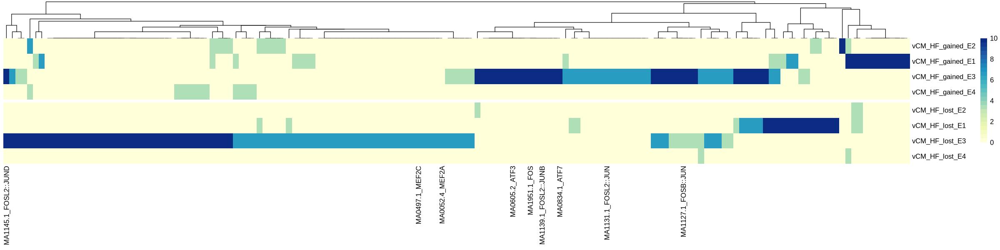

In [586]:
motif <- list()
for (file in list.files("chromhmm/ATAC_DE/motif/", pattern  = "E[0-9]$")){ ### DE peaks as background
    motif[[file]] <- read.csv(paste0("chromhmm/ATAC_DE/motif/", file, "/knownResults.txt"), header = T, sep = "\t") %>%
    setNames(c("motif", "consensus", "p_value", "log_p_value", "fdr", "tgt_num", "tgt_pct", "bgd_num", "bgd_pct")) %>%
    mutate(cond = file)
}

# ffile <- do.call(rbind, motif)

vmotif <- do.call(rbind, motif) %>% group_by(motif) %>% 
filter(min(fdr) < 0.05) %>% ungroup() %>%
select(motif) %>% unlist %>% unique

motif <- do.call(rbind, motif) %>%
filter(motif %in% vmotif) %>%
reshape2::dcast(cond ~ motif, value.var = "p_value") %>%
tibble::column_to_rownames("cond") %>% t
motif[is.na(motif)] <- 1
motif <- -log2(motif)
motif[motif > 10] <- 10

mt <- paste0(c("MEF", "ATF", "FOS"), collapse = "|")
llabel <- grep(paste0(mt, collapse = "|"), rownames(motif), value = T) %>% as.character
labs.row <- rownames(motif) %>% as.character
labs.row[!((labs.row) %in% llabel)] <- ""

options(repr.plot.width = 20, repr.plot.height = 5)
t1 <- motif[,c('vCM_HF_gained_E2','vCM_HF_gained_E1','vCM_HF_gained_E3','vCM_HF_gained_E4',
         'vCM_HF_lost_E2','vCM_HF_lost_E1','vCM_HF_lost_E3','vCM_HF_lost_E4')] %>% t %>%
pheatmap(scale = "none", cluster_rows = F, cluster_cols = T, gaps_row = 4, angle_col = 90, 
         labels_col = labs.row,
         color = colorRampPalette(brewer.pal(n = 8, name = "YlGnBu"))(25))

ggsave(t1, filename = "plot/FIG_diffATAC_vCM_chromhmm_E5_motif.pdf", dpi = 300, height = 8, width = 10)

In [707]:
qpeak <- read.table("chromhmm/ATAC_DE/vCM_HF_lost.bed") %>% mutate(range = paste0(V1, ":", V2, "-", V3))
abc %>% filter(CellType %in% c("vCM_CONTROL", "vCM_HF")) %>%
filter(range %in% qpeak$range) %>%
filter(abs(start.y - start.x) >= 30000) %>%
# select(c(TargetGene, CellType, ABC.Score)) %>%
# reshape2::dcast(TargetGene ~ CellType, value.var = "ABC.Score") %>%
head

,chr,start.x,end.x,range,name,CPM,chrom.x,start.y,end.y,TargetGene,RPKM,CellType,ABC.Score
,<chr>,<int>,<int>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<dbl>
vCM_CONTROL.1432,chr14,39739860,39740160,chr14:39739860-39740160,genic|chr14:39739860-39740160,4.230147,chr14,39147833,39147834,AL109628.2,1.519180,vCM_CONTROL,0.020278
vCM_CONTROL.1433,chr14,39739860,39740160,chr14:39739860-39740160,genic|chr14:39739860-39740160,4.230147,chr14,39230231,39230232,MIA2,1.544045,vCM_CONTROL,0.022920


In [700]:
abc %>% filter(CellType %in% c("vCM_CONTROL", "vCM_HF")) %>%
filter(range %in% qpeak$range) %>%
filter(abs(start.y - start.x) >= 30000) %>%
select(c(TargetGene, CellType, ABC.Score)) %>%
reshape2::dcast(TargetGene ~ CellType, value.var = "ABC.Score") %>%
filter(vCM_CONTROL == 0, vCM_HF != 0) %>%
select(TargetGene) %>% unlist %>% unique

ERROR: Error in (function (cond) : error in evaluating the argument 'x' in selecting a method for function 'unique': [1m[22m[36mℹ[39m In argument: `vCM_CONTROL == 0`.
[1mCaused by error:[22m
[33m![39m object 'vCM_CONTROL' not found


In [687]:
# qpeak <- atacde %>% 
# filter(abs(log2FoldChange) >= 1) %>% 
# filter(celltype == "vCM") %>% 
# select(range) %>% unlist %>% unique

qgene <- genede %>% filter(celltype == "vCM") %>%
filter(log2FoldChange > 0) %>%
select(gene) %>%
unlist %>% unique

abc %>% filter(CellType %in% c("vCM_CONTROL", "vCM_HF")) %>%
# filter(range %in% sub("-", ":", qpeak)) %>%
filter(TargetGene %in% qgene) %>%
filter(abs(start.y - start.x) >= 30000) %>%
select(c(TargetGene, CellType, ABC.Score)) %>%
reshape2::dcast(TargetGene ~ CellType, value.var = "ABC.Score") %>%
filter(vCM_CONTROL == 0, vCM_HF != 0) %>%
select(TargetGene) %>% unlist %>% unique

Aggregation function missing: defaulting to length



[1] "AC015982.2" "AC023157.3" "AC025181.2" "AC073348.2" "AC093752.3"
 [6] "ADNP2"      "AL024497.2" "AL161430.1" "AL355001.1" "AL360093.1"
[11] "ANKRA2"     "C5orf51"    "C6"         "CHURC1"     "CU638689.5"
[16] "ERAP1"      "FAM135A"    "GABARAPL2"  "GABPB2"     "GEN1"      
[21] "GUF1"       "HDAC7"      "LAMA2"      "LRIG1"      "MAOA"      
[26] "MAP3K7"     "NAV2-AS3"   "NID2"       "PDCD4"      "PGAP2"     
[31] "PPA2"       "RTRAF"      "SLC7A8"     "TAF1D"      "TMEM30A"   
[36] "ZBTB20-AS5" "ZNF462"

In [706]:
qqgene <- "ANKFY1"
abc %>% filter(CellType %in% c("vCM_CONTROL", "vCM_HF")) %>%
filter(TargetGene %in% qqgene)
rpkm[qqgene,grep("vCM", colnames(rpkm))]

,chr,start.x,end.x,range,name,CPM,chrom.x,start.y,end.y,TargetGene,RPKM,CellType,ABC.Score
,<chr>,<int>,<int>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<dbl>
vCM_HF.1694,chr17,596283,596583,chr17:596283-596583,genic|chr17:596283-596583,1.600324,chr17,4263994,4263995,ANKFY1,1.046443,vCM_HF,0.026184
vCM_HF.1695,chr17,632561,632861,chr17:632561-632861,genic|chr17:632561-632861,2.133765,chr17,4263994,4263995,ANKFY1,1.046443,vCM_HF,0.035215
vCM_HF.1698,chr17,633176,633476,chr17:633176-633476,genic|chr17:633176-633476,1.760356,chr17,4263994,4263995,ANKFY1,1.046443,vCM_HF,0.029056
vCM_HF.1711,chr17,705919,706219,chr17:705919-706219,genic|chr17:705919-706219,1.600324,chr17,4263994,4263995,ANKFY1,1.046443,vCM_HF,0.026884
vCM_HF.1712,chr17,714697,714997,chr17:714697-714997,genic|chr17:714697-714997,3.360680,chr17,4263994,4263995,ANKFY1,1.046443,vCM_HF,0.056578


,vCM.CONTROL,vCM.HF
,<dbl>,<dbl>
ANKFY1,0.9663118,1.016167


## DE results by chamber

In [1670]:
# ### Read disease differential peaks and gene

atacdec <- genedec <- list()
for (f in c("aCM", "vCM", "Fibroblast", "Myeloid", "Endothelial", "Lymphoid")){
    for (cb in c("LA", "RA", "LV", "RV")){
        test <- tryCatch({
            read.table(paste0("../reference/Multiome_Downstream/ATAC/", cb, "/DESEQ/", f, "_HF_vs_NON_HF.dds.res")) %>% 
            # filter(padj < 0.05) %>% 
            mutate(chamber = cb, celltype = f, range = rownames(.))},
                         error = function(e) {
                             message(paste("Error reading file:", f, "_", cb, "- skipping to next file."))
                             return(NULL) 
                         })
        if (is.null(data)) {next}
        atacdec[[paste0(f, "_", cb)]] <- test
        test <- tryCatch({
            read.table(paste0("../reference/Multiome_Downstream/RNA/", cb, "/DESEQ/", f, "_HF_vs_NON_HF.dds.res")) %>% 
            # filter(padj < 0.05) %>% 
            mutate(chamber = cb, celltype = f, gene = rownames(.))},
                         error = function(e) {
                             message(paste("Error reading file:", f, "_", cb, "- skipping to next file."))
                             return(NULL) 
                         })
        if (is.null(data)) {next}
        genedec[[paste0(f, "_", cb)]] <- test
    }
}
atacdec <- do.call(rbind, atacdec)
genedec <- do.call(rbind, genedec)

Warning message in file(file, "rt"):
“cannot open file '../reference/Multiome_Downstream/ATAC/LV/DESEQ/aCM_HF_vs_NON_HF.dds.res': No such file or directory”
Error reading file: aCM _ LV - skipping to next file.

Warning message in file(file, "rt"):
“cannot open file '../reference/Multiome_Downstream/RNA/LV/DESEQ/aCM_HF_vs_NON_HF.dds.res': No such file or directory”
Error reading file: aCM _ LV - skipping to next file.

Warning message in file(file, "rt"):
“cannot open file '../reference/Multiome_Downstream/ATAC/RV/DESEQ/aCM_HF_vs_NON_HF.dds.res': No such file or directory”
Error reading file: aCM _ RV - skipping to next file.

Warning message in file(file, "rt"):
“cannot open file '../reference/Multiome_Downstream/RNA/RV/DESEQ/aCM_HF_vs_NON_HF.dds.res': No such file or directory”
Error reading file: aCM _ RV - skipping to next file.

Warning message in file(file, "rt"):
“cannot open file '../reference/Multiome_Downstream/ATAC/LA/DESEQ/vCM_HF_vs_NON_HF.dds.res': No such file or director

In [1669]:
### example: Fibroblast
elist <- read.csv("GRN/scenicplus/Fibro/edges_R2G.csv") %>% filter(is_extended == "False")
tfr <- stringr::str_split_fixed(elist$Consensus_name, pattern = "_", n = 3)[,1] %>% unique
grnlist <- list()
for (f in tfr){
    grnlist[[f]] <- elist %>% filter(Consensus_name == paste0(f, "_+_+")) %>% select(Gene) %>% unlist %>% unique
}

In [1675]:
flist <- list()
for (ch in unique(genedec$chamber)){
    ranked_genes <- genedec %>% filter(chamber == ch, celltype == "Fibroblast") %>% 
    arrange(desc(stat)) %>% 
    select(gene, stat) %>% tibble::deframe()
    
    flist[[ch]] <- fgsea(
    pathways = grnlist,
    stats = ranked_genes,
    minSize = 5, maxSize = 500,
    nperm = 10000)
    
    flist[[ch]]$chamber <- ch
}

Warning message in fgsea(pathways = grnlist, stats = ranked_genes, minSize = 5, :
“You are trying to run fgseaSimple. It is recommended to use fgseaMultilevel. To run fgseaMultilevel, you need to remove the nperm argument in the fgsea function call.”
Warning message in fgsea(pathways = grnlist, stats = ranked_genes, minSize = 5, :
“You are trying to run fgseaSimple. It is recommended to use fgseaMultilevel. To run fgseaMultilevel, you need to remove the nperm argument in the fgsea function call.”
Warning message in fgsea(pathways = grnlist, stats = ranked_genes, minSize = 5, :
“You are trying to run fgseaSimple. It is recommended to use fgseaMultilevel. To run fgseaMultilevel, you need to remove the nperm argument in the fgsea function call.”
Warning message in fgsea(pathways = grnlist, stats = ranked_genes, minSize = 5, :
“You are trying to run fgseaSimple. It is recommended to use fgseaMultilevel. To run fgseaMultilevel, you need to remove the nperm argument in the fgsea function cal

In [ ]:
rmat <- k27ac[unique(abc2$range), corder]
max_indices <- max.col(rmat)
permutation_vector <- order(max_indices)
smat <- rmat[permutation_vector, ]
log2(smat + 1) %>%
pheatmap(cluster_rows = F, cluster_cols = F, border_color = NA,
         scale = "none", show_rownames = F, angle_col = 45, color = viridis(50))

In [866]:
# rmeta <- read.csv("integration/CAREHF_Multiome_DPT_RNA_int.meta.csv", row.names = 1)
mts <- rmeta %>% filter(orig.ident == "MULTIOME" & nn2.celltype == "Fibroblast") %>%
mutate(cluster = paste0(nn2.celltype, "_",  condition, "_", chamber)) %>%
mutate(sample = paste0("FNIH_Heart_", nn2.celltype, "_", condition, ".tagAlign.gz")) %>%
mutate(barcode = paste0(library, ":", barcode)) %>%
select(c(library, barcode, cluster, sample)) %>%
setNames(c("library", "barcode", "cluster", "sample"))
write.table(mts, "FNIH_Heart_cluster/FNIH_Heart_pool_ATAC_Fibroblast_chamber_disease.cluster_info.xls", sep = "\t", quote = F, row.names = F, col.names = T)

In [774]:
### example: Fibroblast
ct <- "Fibroblast"
qrange <- atacde %>% filter(celltype == ct) %>%
filter(abs(log2FoldChange) >= 1) %>%
select(range) %>% unlist %>% unique 

# atac2 <- read.csv('FNIH_Heart_signal/FNIH_Heart_pool.ATAC.chamber_celltype_HF.cpm.csv', row.names = 1)
# head(atac2[sub("-", ":", qrange), grep(ct, colnames(atac2))])

In [775]:
atacde %>% filter(celltype == ct) %>%
filter(abs(log2FoldChange) >= 1) %>%
select(chamber) %>% table

chamber
  LA   LV   RA   RV 
1963 5979 3735 2398 

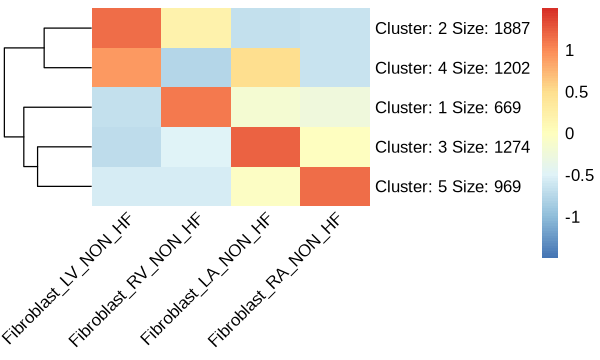

In [807]:
smat <- log2(atac2 + 1)

qrange <- atacde %>% filter(celltype == ct) %>%
filter(log2FoldChange >= 1) %>%
select(range) %>% unlist %>% unique 

set.seed(921)

options(repr.plot.width = 5, repr.plot.height = 3)
f1 <- smat[sub("-", ":", qrange), paste0("Fibroblast_", c("LV", "RV", "LA", "RA"), "_NON_HF")] %>%
pheatmap(scale = "row", cluster_rows = T, cluster_cols = F, border_color = NA, 
         kmeans_k = 5, show_rownames = T, angle_col = 45)

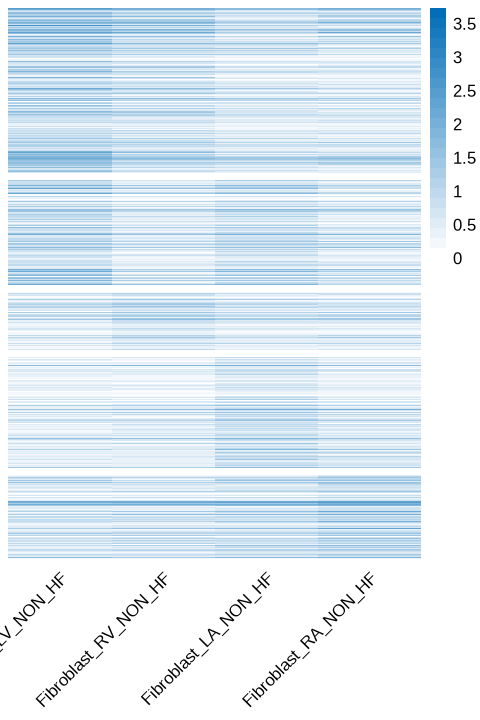

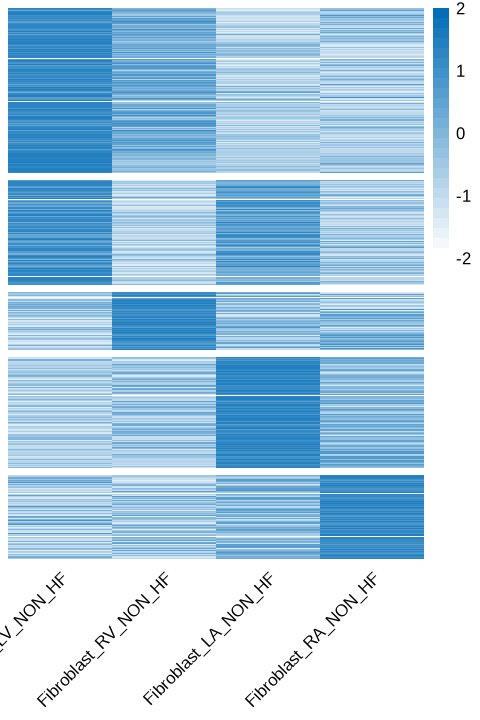

In [808]:
rorder <- f1$kmeans$cluster %>% as.data.frame %>% setNames("cluster") %>%
mutate(cluster = factor(cluster, levels = c(2,4,1,3,5))) %>% 
arrange(cluster)

set.seed(921)
options(repr.plot.width = 4, repr.plot.height = 6)

t0 <- smat[rownames(rorder), paste0("Fibroblast_", c("LV", "RV", "LA", "RA"), "_NON_HF")] %>%
pheatmap(scale = "none", cluster_rows = F, cluster_cols = F, show_rownames = F, angle_col = 45,
         gaps_row = cumsum(table(rorder$cluster)),
         border_color = NA, color = colorRampPalette(c("white", "#036EB8"))(25))

t1 <- smat[rownames(rorder), paste0("Fibroblast_", c("LV", "RV", "LA", "RA"), "_NON_HF")] %>%
pheatmap(scale = "row", cluster_rows = F, cluster_cols = F, show_rownames = F, angle_col = 45,
         gaps_row = cumsum(table(rorder$cluster)), breaks = seq(-2, 2, 4/25),
         border_color = NA, color = colorRampPalette(c("white", "#036EB8"))(25))

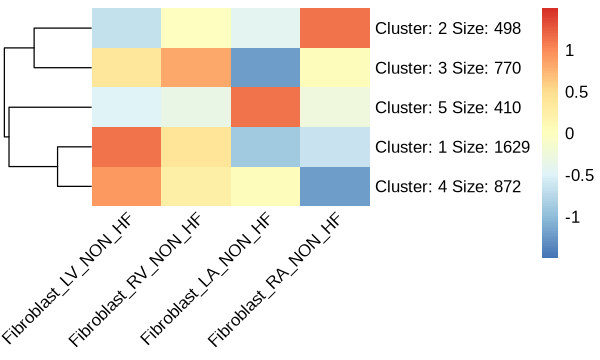

In [811]:
qrange <- atacde %>% filter(celltype == ct) %>%
filter(log2FoldChange <= -1) %>%
select(range) %>% unlist %>% unique 

set.seed(921)

options(repr.plot.width = 5, repr.plot.height = 3)
f2 <- smat[sub("-", ":", qrange), paste0("Fibroblast_", c("LV", "RV", "LA", "RA"), "_NON_HF")] %>%
pheatmap(scale = "row", cluster_rows = T, cluster_cols = F, border_color = NA, 
         kmeans_k = 5, show_rownames = T, angle_col = 45)

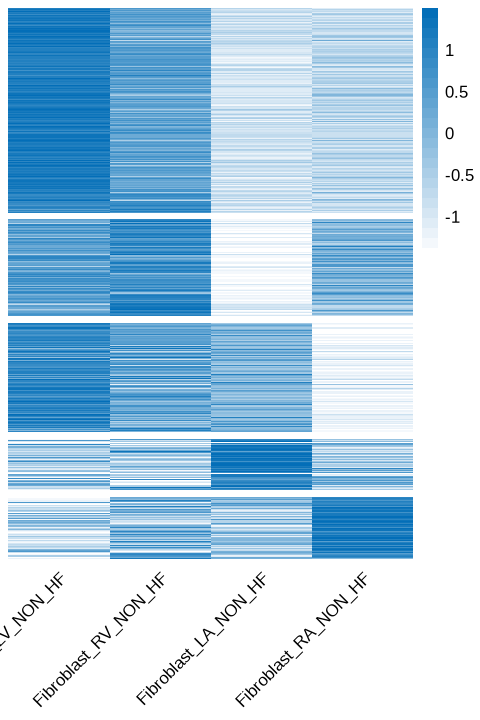

In [815]:
rorder2 <- f2$kmeans$cluster %>% as.data.frame %>% setNames("cluster") %>%
mutate(cluster = factor(cluster, levels = c(1,3,4,5,2))) %>% 
arrange(cluster)

set.seed(921)
options(repr.plot.width = 4, repr.plot.height = 6)

t2 <- smat[rownames(rorder2), paste0("Fibroblast_", c("LV", "RV", "LA", "RA"), "_NON_HF")] %>%
pheatmap(scale = "row", cluster_rows = F, cluster_cols = F, show_rownames = F, angle_col = 45,
         gaps_row = cumsum(table(rorder2$cluster)),
         border_color = NA, color = colorRampPalette(c("white", "#036EB8"))(25))

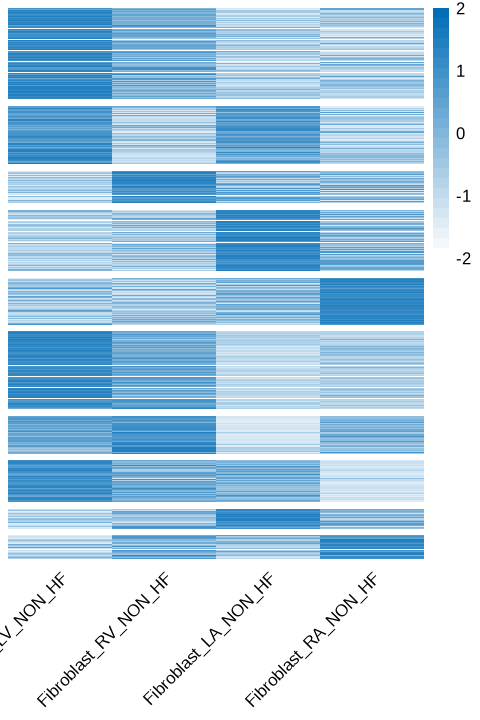

In [821]:
options(repr.plot.width = 4, repr.plot.height = 6)
smat[c(rownames(rorder), rownames(rorder2)), paste0("Fibroblast_", c("LV", "RV", "LA", "RA"), "_NON_HF")] %>%
pheatmap(scale = "row", cluster_rows = F, cluster_cols = F, show_rownames = F, angle_col = 45,
         gaps_row = cumsum(c((table(rorder$cluster)), (table(rorder2$cluster)))), breaks = seq(-2, 2, 4/25),
         border_color = NA, color = colorRampPalette(c("white", "#036EB8"))(25))

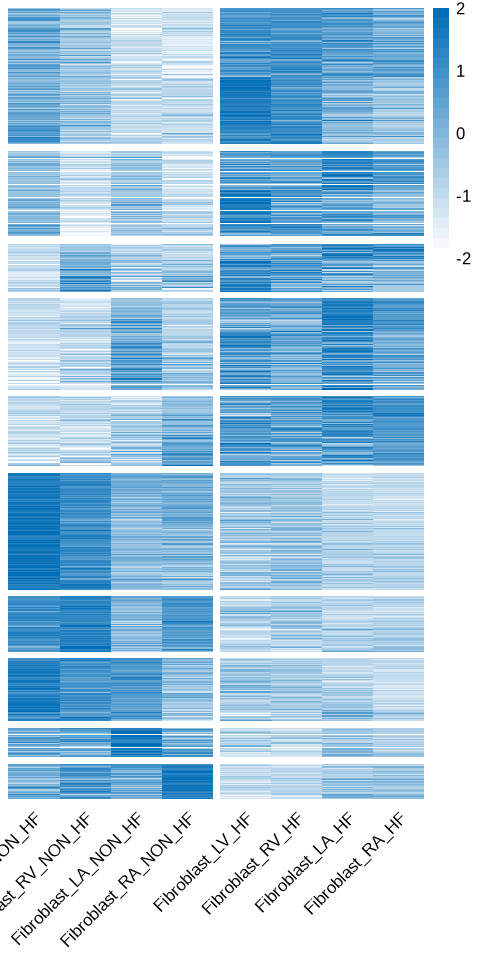

In [825]:
options(repr.plot.width = 4, repr.plot.height = 8)
dorder <- c(paste0("Fibroblast_", c("LV", "RV", "LA", "RA"), "_NON_HF"), paste0("Fibroblast_", c("LV", "RV", "LA", "RA"), "_HF"))
fig1 <- smat[c(rownames(rorder), rownames(rorder2)), dorder] %>%
pheatmap(scale = "row", cluster_rows = F, cluster_cols = F, show_rownames = F, angle_col = 45,
         gaps_row = cumsum(c((table(rorder$cluster)), (table(rorder2$cluster)))), breaks = seq(-2, 2, 4/25),
         gaps_col = 4,
         border_color = NA, color = colorRampPalette(c("white", "#036EB8"))(25))

ggsave(fig1, filename = "plot/FIG_diffATAC_Fibroblast_by_chamber_ATAC_CPM_scaled.pdf", dpi = 300, height = 6, width = 4)
ggsave(fig1, filename = "plot/FIG_diffATAC_Fibroblast_by_chamber_ATAC_CPM_scaled.png", dpi = 300, height = 6, width = 4)

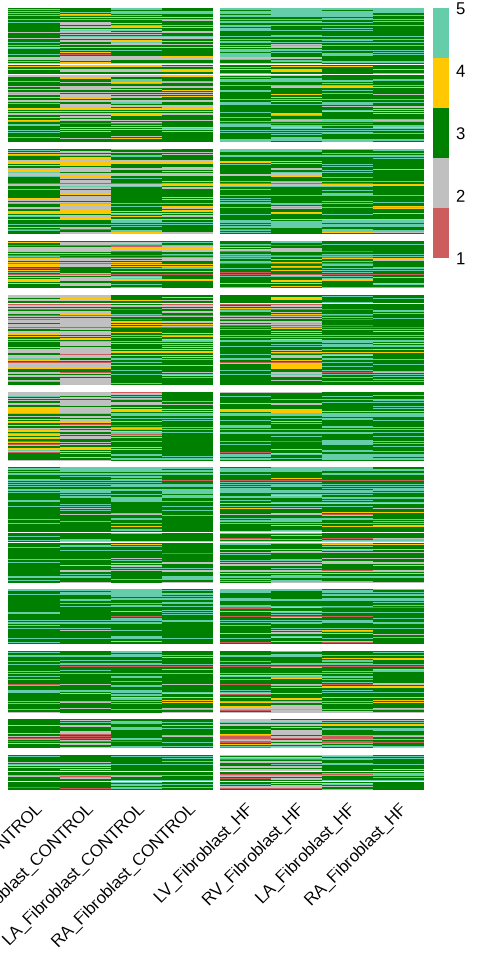

In [864]:
### chromhmm example: Fibroblast
chmm2 <- list()
for (f in list.files("chromhmm/chamber_disease_celltype/annotate/", pattern = ".*Fibroblast*")){
    fname = gsub("_annotate.bed", "", f)
    fname = gsub("Heart_UnionPeak_", "", fname)
    chmm2[[f]] <- read.table(paste0("chromhmm/chamber_disease_celltype/annotate/", f)) %>% 
    mutate(range = paste0(V1, ":", V2, "-", V3)) %>%
    select(c(range, V4)) %>% 
    group_by(range) %>%
    slice_sample(n = 1) %>%
    ungroup() %>%
    tibble::column_to_rownames("range") %>% setNames(fname)
}
commonf <- Reduce(intersect, lapply(chmm2, rownames))
for (f in names(chmm)){
    chmm2[[f]] <- chmm2[[f]][commonf, , drop = F]
}
chmm2 <- Reduce(cbind, chmm2[-1], chmm2[[1]]) ### dont use do.call for cbind

tmp <- apply(chmm2, MARGIN = 2, function(x) as.integer(gsub("E", "", x))) %>% as.data.frame
rownames(tmp) <- rownames(chmm2)
dorder <- c(paste0(c("LV", "RV", "LA", "RA"), "_Fibroblast_CONTROL"), paste0(c("LV", "RV", "LA", "RA"), "_Fibroblast_HF"))
tmp[c(rownames(rorder), rownames(rorder2)), dorder] %>%
pheatmap(scale = "none", cluster_rows = F, cluster_cols = F, show_rownames = F, angle_col = 45,
         gaps_row = cumsum(c((table(rorder$cluster)), (table(rorder2$cluster)))), 
         gaps_col = 4,
         border_color = NA, color = c("#cd5c5c", "#c0c0c0", "#008000", "#ffc800", '#66cdaa'))

In [1035]:
### example?
qqpeak <- atac2[c(rownames(rorder), rownames(rorder2)), paste0("Fibroblast_", c("LV", "RV", "LA", "RA"), "_NON_HF")] %>%
filter(rowMeans(.) > 1) %>%
apply(MARGIN = 1, function (x) 100*sd(x)/mean(x)) %>%
as.data.frame %>%
setNames("cov") %>%
arrange(desc(cov)) %>%
head(50) %>% rownames

      qlist <- list()
for (chb in c("LV", "RV", "LA", "RA")){
    q1 <- atacde %>% filter(log2FoldChange > 1, celltype == "Fibroblast", chamber == chb)
    qlist[[chb]] <- intersect(qqpeak, sub("-", ":", q1$range))
}

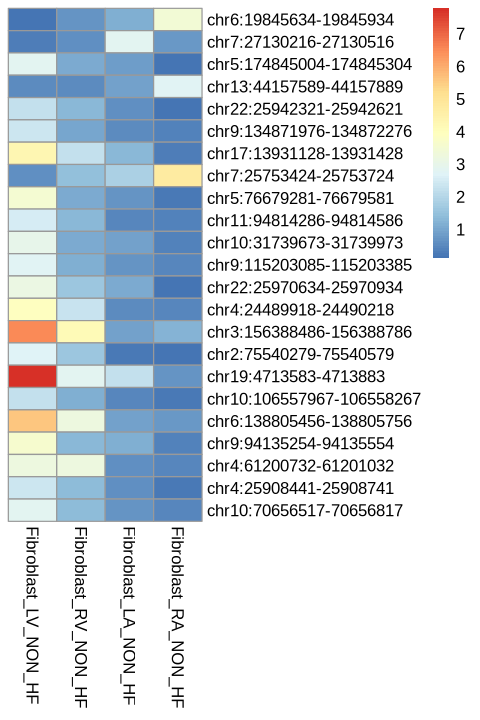

In [1042]:
atac2[unique(unlist(qlist)), paste0("Fibroblast_", c("LV", "RV", "LA", "RA"), "_NON_HF")] %>%
pheatmap(cluster_rows = F, cluster_cols = F)

In [1031]:
# qqpeak <- "chr7:27130751-27131051"
# atac2[qqpeak, paste0("Fibroblast_", c("LV", "RV", "LA", "RA"), "_NON_HF")]
# atac2[qqpeak, paste0("Fibroblast_", c("LV", "RV", "LA", "RA"), "_HF")]

# qqpeak <- atacde %>% filter(range %in% sub(":", "-", qqpeak)) %>% 
# select(range) %>% unlist %>% unique
atac2[qqpeak, paste0("Fibroblast_", c("LV", "RV", "LA", "RA"), "_NON_HF")] %>% arrange(desc(Fibroblast_RV_NON_HF))
atac2[qqpeak, paste0("Fibroblast_", c("LV", "RV", "LA", "RA"), "_HF")]

# chmm2[qqpeak, paste0(c("LV", "RV", "LA", "RA"), "_Fibroblast_CONTROL")]
# chmm2[qqpeak, paste0(c("LV", "RV", "LA", "RA"), "_Fibroblast_HF")]

,Fibroblast_LV_NON_HF,Fibroblast_RV_NON_HF,Fibroblast_LA_NON_HF,Fibroblast_RA_NON_HF
,<dbl>,<dbl>,<dbl>,<dbl>
chr6:138805456-138805756,5.6200749,3.2390635,0.9142706,0.7749266
chr9:107394152-107394452,4.2890045,3.0940308,1.1212752,0.1671410
chr7:33761539-33761839,0.9613286,2.8764818,0.4485101,0.7597319
chr19:4713583-4713883,7.7830642,2.8039654,2.2425504,0.6609668
chr12:30417646-30417946,4.0856465,2.3930395,0.9660217,0.2735035
chr4:24489918-24490218,3.9007757,2.3205231,0.5347620,0.4710338
chr20:50565874-50566172,3.5680081,2.2963510,0.6900155,0.2659062
chr6:1544615-1544915,3.8453144,2.0788020,0.6382644,0.4102552
chr8:113601703-113602003,2.5142440,1.7403923,0.2760062,0.2127249


,Fibroblast_LV_HF,Fibroblast_RV_HF,Fibroblast_LA_HF,Fibroblast_RA_HF
,<dbl>,<dbl>,<dbl>,<dbl>
chr7:27143650-27143950,0.2633378,0.3285881,0.4968284,0.34398219
chr7:27130751-27131051,0.9743498,0.8899260,1.7429716,1.37979371
chr6:19845634-19845934,0.6846783,0.5202644,2.3701156,2.65909824
chr5:76679281-76679581,3.3356121,2.3274987,1.6208007,1.07446121
chr2:75540279-75540579,1.9048101,1.4786463,0.5294073,0.47925608
chr7:27130216-27130516,0.5968990,0.5613379,0.7900385,0.68796437
NA,NA,NA,NA,NA
chr3:7687455-7687755,1.1499084,0.8625436,0.5131178,0.29373760
chr1:100882821-100883121,0.5968990,0.5065733,0.1303156,0.15073377


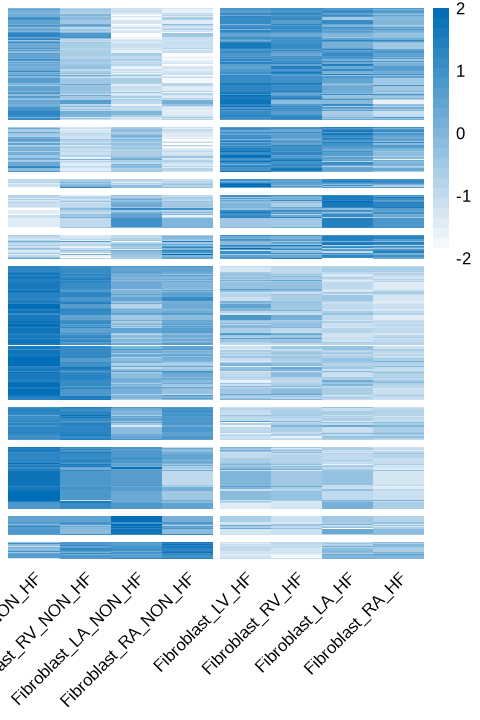

In [951]:
### ABC?
qpair <- abc %>% filter(CellType %in% paste0("Fibroblast_", c("CONTROL", "HF"))) %>%
filter(range %in% c(rownames(rorder), rownames(rorder2))) %>%
select(range, TargetGene) %>%
distinct

r1 <- rorder %>% mutate(group = 'up') %>% mutate(group = paste0(group, "_", cluster))
r2 <- rorder2 %>% mutate(group = 'down') %>% mutate(group = paste0(group, "_", cluster))
idx <- match(qpair$range, c(rownames(rorder), rownames(rorder2))) %>% sort

gap_rows <- rbind(r1, r2)[sort(idx),,drop = F] %>%
table %>% as.data.frame %>% filter(Freq > 0) %>%
mutate(group = factor(group, levels = c("up_2", "up_4", "up_1", "up_3", "up_5", "down_1", "down_3", "down_4", "down_5", "down_2"))) %>%
arrange(group) %>% select(Freq) %>% cumsum

dorder <- c(paste0("Fibroblast_", c("LV", "RV", "LA", "RA"), "_NON_HF"), paste0("Fibroblast_", c("LV", "RV", "LA", "RA"), "_HF"))

options(repr.plot.width = 4, repr.plot.height = 6)
smat[c(rownames(rorder), rownames(rorder2))[sort(idx)], dorder] %>%
pheatmap(scale = "row", cluster_rows = F, cluster_cols = F, show_rownames = F, angle_col = 45,
         breaks = seq(-2, 2, 4/25), gaps_col = 4, gaps_row = gap_rows$Freq, 
         border_color = NA, color = colorRampPalette(c("white", "#036EB8"))(25))

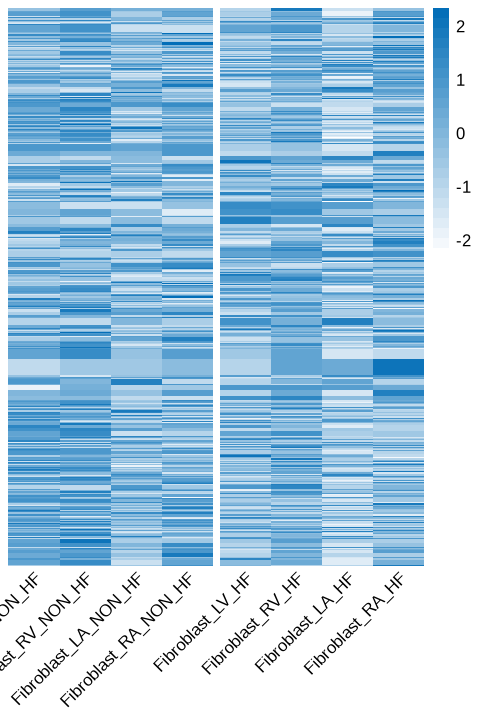

In [980]:
qgene <- qpair[match(qpair$range, c(rownames(rorder), rownames(rorder2))[sort(idx)]), ] %>% 
filter(!TargetGene %in% c('MRPS26','MRPL4')) %>%
select(TargetGene) %>% unlist
log2(rpkm[qgene, dorder]+1) %>%
pheatmap(scale = "row", cluster_rows = F, cluster_cols = F, show_rownames = F, angle_col = 45,
         #breaks = seq(-2, 2, 4/25), 
         gaps_col = 4, #gaps_row = gap_rows$Freq, 
         border_color = NA, color = colorRampPalette(c("white", "#036EB8"))(25))

### so noisy

In [ ]:
qpair <- abc %>% filter(CellType %in% paste0("Fibroblast_", c("CONTROL", "HF"))) %>%
filter(range %in% c(rownames(rorder), rownames(rorder2))) %>%
select(range, TargetGene) %>%
distinct

In [744]:
# cpm <- read.csv('FNIH_Heart_signal/FNIH_Heart_pool.ATAC.chamber_celltype_ICM.cpm.csv', row.names = 1)
# cpm <- read.csv('FNIH_Heart_signal/FNIH_Heart_pool.ATAC.chamber_celltype_HF.cpm.csv', row.names = 1)

degroup1 <- degroup2 <- list()
for (ct in grep("Fibroblast", unique(paste0(atacde$celltype, "_", atacde$chamber)), value = T)){
    print(ct)
    degroup1[[ct]] <- atacde %>% filter(padj < 0.05, log2FoldChange >= 1) %>%
    filter(paste0(celltype, "_", chamber) == ct) %>% 
    select(range) %>% unlist
    degroup2[[ct]] <- atacde %>% filter(padj < 0.05, log2FoldChange <= -1) %>%
    filter(paste0(celltype, "_", chamber) == ct) %>% 
    select(range) %>% unlist
}

lapply(degroup1, length)
Reduce(intersect, degroup1) %>% length

lapply(degroup2, length)
Reduce(intersect, degroup2) %>% length

[1] "Fibroblast_LA"
[1] "Fibroblast_RA"
[1] "Fibroblast_LV"
[1] "Fibroblast_RV"


$Fibroblast_LA
[1] 684

$Fibroblast_RA
[1] 2148

$Fibroblast_LV
[1] 3826

$Fibroblast_RV
[1] 1251

[1] 102

$Fibroblast_LA
[1] 1279

$Fibroblast_RA
[1] 1587

$Fibroblast_LV
[1] 2153

$Fibroblast_RV
[1] 1147

[1] 153

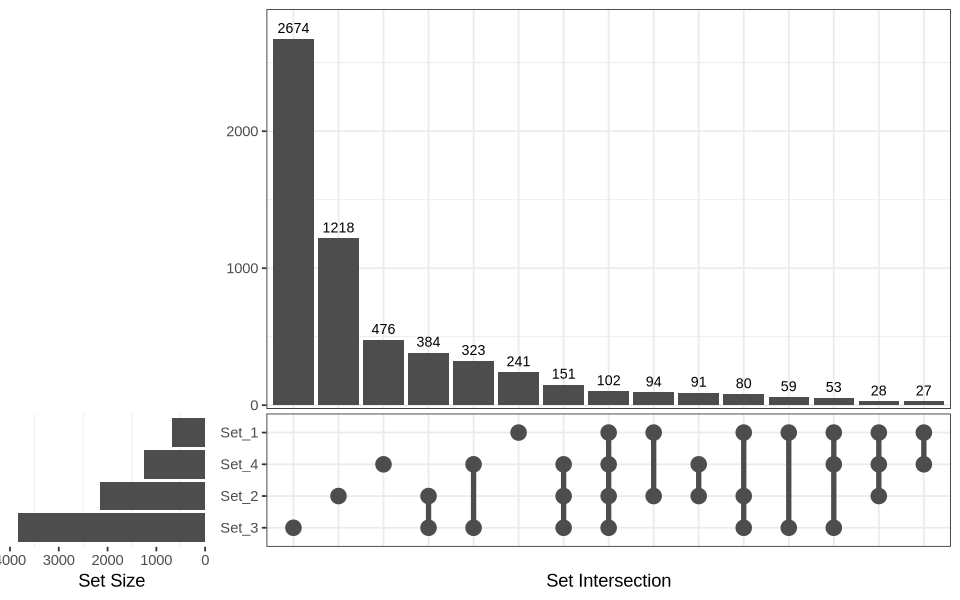

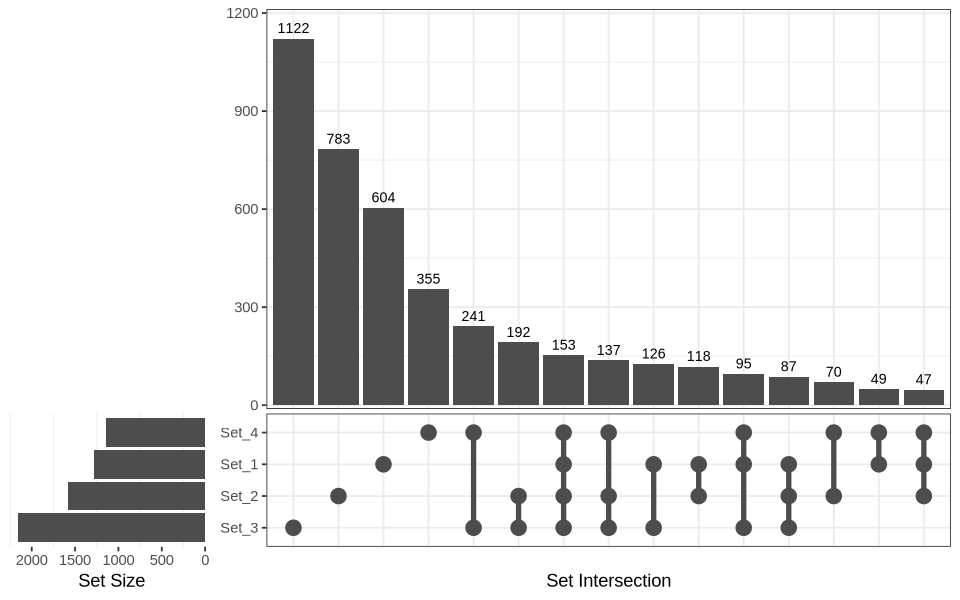

In [887]:
suppressPackageStartupMessages(library(ggVennDiagram))
ggVennDiagram(list(degroup1[[1]], degroup1[[2]], degroup1[[3]], degroup1[[4]]), 
                    force_upset = T) #+ NoLegend()
ggVennDiagram(list(degroup2[[1]], degroup2[[2]], degroup2[[3]], degroup2[[4]]), 
                    force_upset = T) #+ NoLegend()

In [998]:
lapply(degroup1, length)      
lapply(degroup2, length)

qpair1 <- lapply(degroup1, function(x) intersect(abc[abc$CellType == "Fibroblast_HF", ]$range, sub("-", ":", x)))
qpair2 <- lapply(degroup2, function(x) intersect(abc[abc$CellType == "Fibroblast_CONTROL", ]$range, sub("-", ":", x)))
                 
lapply(qpair1, length)
lapply(qpair2, length)

$Fibroblast_LA
[1] 684

$Fibroblast_RA
[1] 2148

$Fibroblast_LV
[1] 3826

$Fibroblast_RV
[1] 1251

$Fibroblast_LA
[1] 1279

$Fibroblast_RA
[1] 1587

$Fibroblast_LV
[1] 2153

$Fibroblast_RV
[1] 1147

$Fibroblast_LA
[1] 43

$Fibroblast_RA
[1] 64

$Fibroblast_LV
[1] 87

$Fibroblast_RV
[1] 61

$Fibroblast_LA
[1] 56

$Fibroblast_RA
[1] 59

$Fibroblast_LV
[1] 82

$Fibroblast_RV
[1] 55

In [1009]:
qtarget <- list()
for (f in names(qpair1)){
    qtarget[[f]] <- abc %>% 
    filter(CellType == "Fibroblast_HF") %>%
    filter(range %in% qpair1[[f]]) %>%
    select(TargetGene) %>% unlist
}

lapply(qtarget, length)
Reduce(intersect, qtarget) %>% length

$Fibroblast_LA
[1] 60

$Fibroblast_RA
[1] 98

$Fibroblast_LV
[1] 124

$Fibroblast_RV
[1] 83

[1] 10

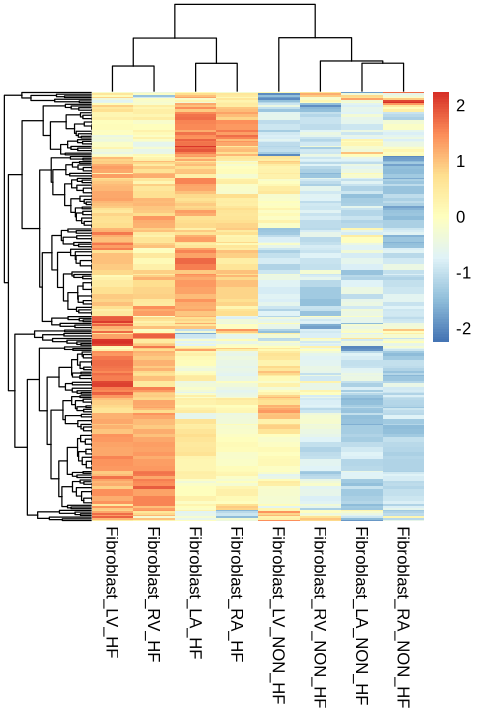

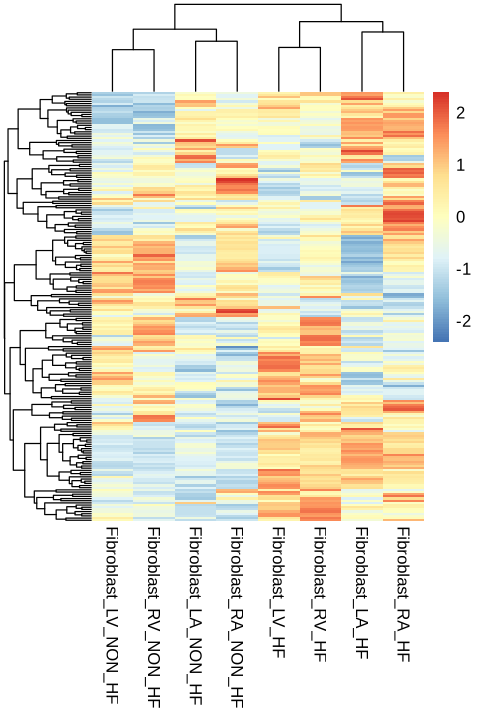

In [1021]:
atac2[unlist(qpair1), grep("Fibro", colnames(atac2))] %>%
pheatmap(scale = 'row', show_rownames = F)

rpkm[unique(unlist(qtarget)),grep("Fibro", colnames(rpkm))] %>%
pheatmap(scale = 'row', show_rownames = F)

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


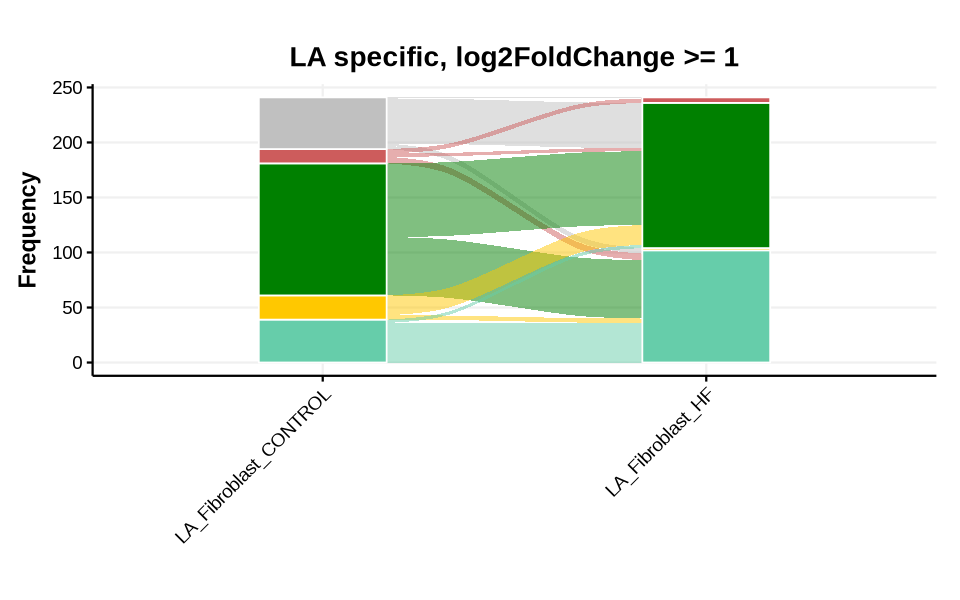

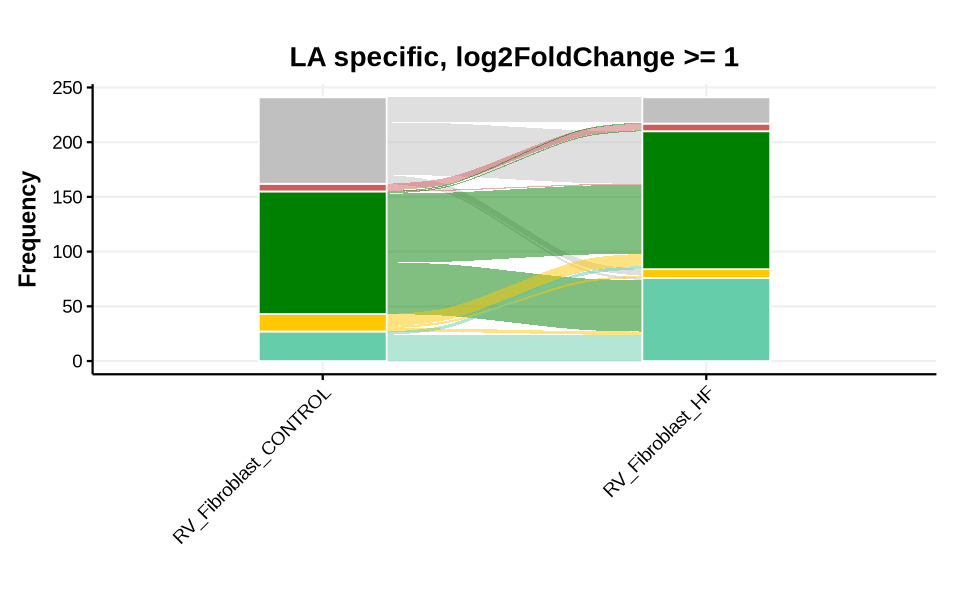

In [898]:
### LA specific peaks?
qqpeak <- setdiff(degroup1[[1]], c(degroup1[[2]], degroup1[[3]], degroup1[[4]]))

chmm2[sub("-", ":", qqpeak), grep("LA", colnames(chmm2))] %>% 
count(across(everything())) %>%
mutate(id = 1:nrow(.)) %>%
tidyr::pivot_longer(cols = starts_with("L") | starts_with("R"), names_to = "stage", values_to = "state") %>%
mutate(state = factor(state, levels = c("E2", "E1", "E3", "E4", "E5"))) %>%
ggplot(aes(x = stage, stratum = state, alluvium = id, y = n, fill = state)) +
geom_flow() + ylab("Frequency") + 
geom_stratum(color = "white") +
theme_Publication() + 
theme(axis.text.x = element_text(angle = 45, hjust = 1, vjust = 1)) + 
ggtitle(paste0("LA specific, log2FoldChange >= 1")) + 
NoLegend() + xlab("") + 
scale_fill_manual(values = cols)

chmm2[sub("-", ":", qqpeak), grep("RV", colnames(chmm2))] %>% 
count(across(everything())) %>%
mutate(id = 1:nrow(.)) %>%
tidyr::pivot_longer(cols = starts_with("L") | starts_with("R"), names_to = "stage", values_to = "state") %>%
mutate(state = factor(state, levels = c("E2", "E1", "E3", "E4", "E5"))) %>%
ggplot(aes(x = stage, stratum = state, alluvium = id, y = n, fill = state)) +
geom_flow() + ylab("Frequency") + 
geom_stratum(color = "white") +
theme_Publication() + 
theme(axis.text.x = element_text(angle = 45, hjust = 1, vjust = 1)) + 
ggtitle(paste0("LA specific, log2FoldChange >= 1")) + 
NoLegend() + xlab("") + 
scale_fill_manual(values = cols)

### so similar.

[1] "chr2-227154970-227155270" "chr6-43076058-43076358"  
[3] "chr4-140071842-140072142" "chr5-68288331-68288631"  
[5] "chr1-20069973-20070273"   "chr8-48649057-48649357"

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


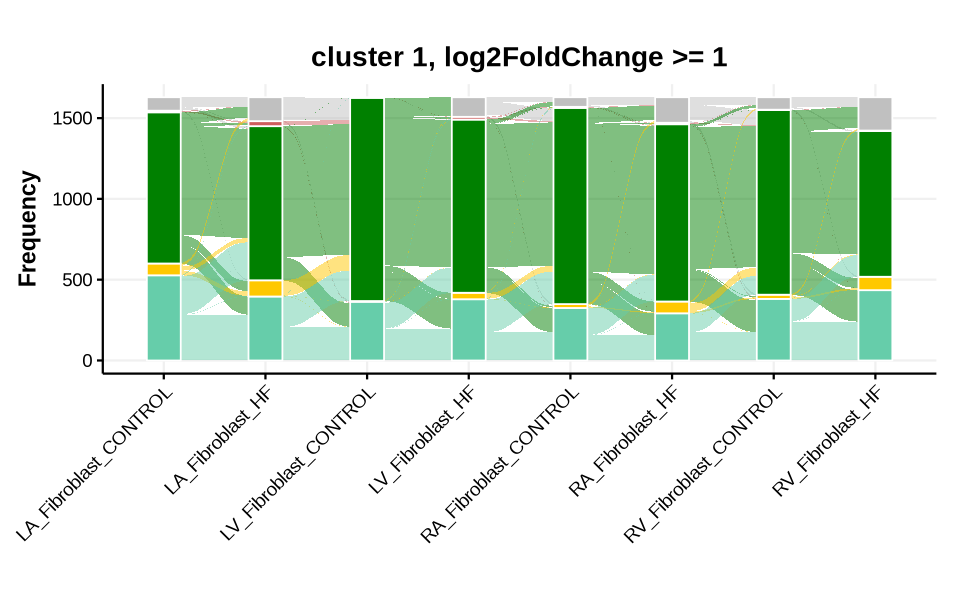

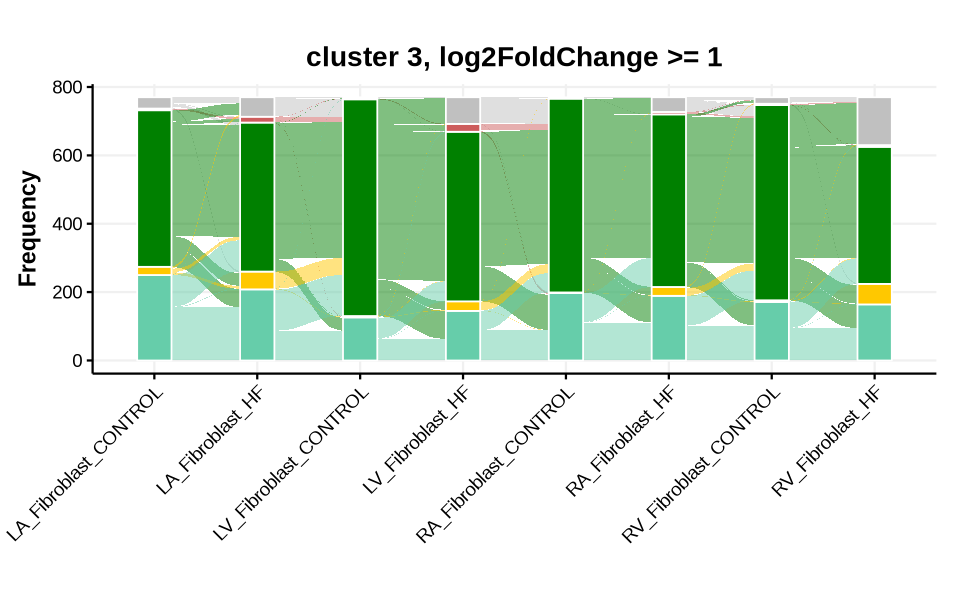

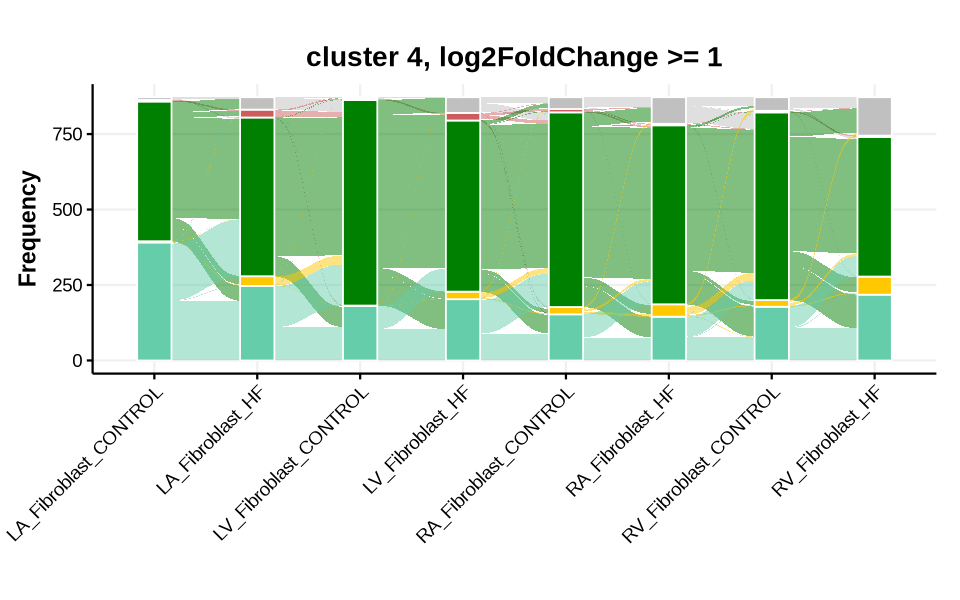

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]


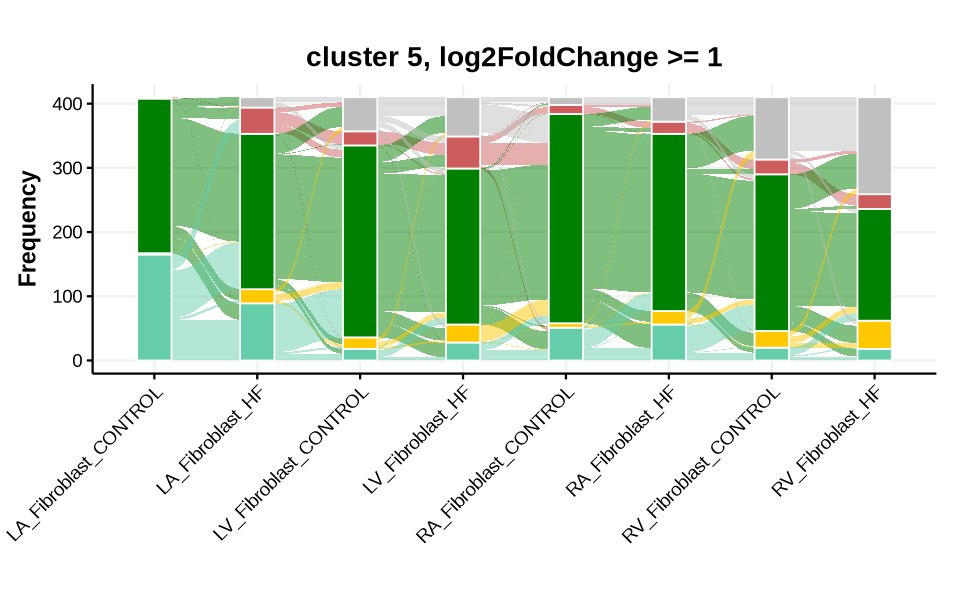

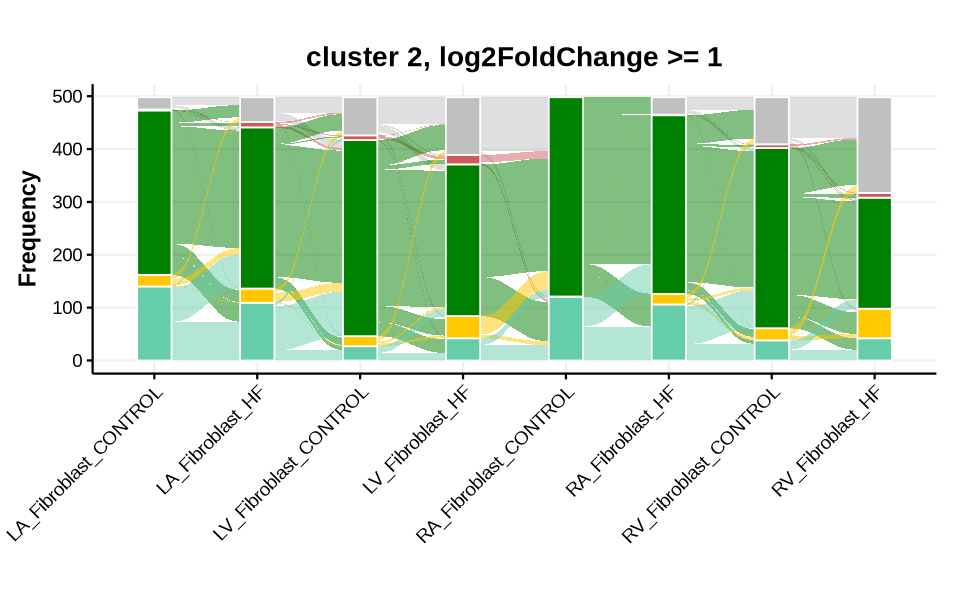

In [881]:
### chromhmm shift
plist <- list()
i=1
for (f in unique(rorder2$cluster)){
    qpeak <- rorder2 %>% filter(cluster == f) %>% rownames
    data <- chmm2[qpeak, grep(ct, colnames(chmm2))] %>% count(across(everything()))
    plist[[i]] <- data %>%
    mutate(id = 1:nrow(.)) %>%
    tidyr::pivot_longer(cols = starts_with("L") | starts_with("R"), names_to = "stage", values_to = "state") %>%
    mutate(state = factor(state, levels = c("E2", "E1", "E3", "E4", "E5"))) %>%
    ggplot(aes(x = stage, stratum = state, alluvium = id, y = n, fill = state)) +
    geom_flow() + ylab("Frequency") + 
    geom_stratum(color = "white") +
    theme_Publication() + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1, vjust = 1)) + 
    ggtitle(paste0("cluster ", f, ", log2FoldChange >= 1")) + 
    NoLegend() + xlab("") + 
    scale_fill_manual(values = cols)
    i = i + 1
}

options(repr.plot.width = 8, repr.plot.height = 5)
plist

In [242]:
stringr::str_split_fixed(colnames(rmat), pattern = "_", n = 4) %>%
as.data.frame %>% setNames(c("chamber", "celltype", "condition"))

V1,V2,V3,V4
<chr>,<chr>,<chr>,<chr>
LV,vCM,ICM,HF
LV,vCM,NICM,HF
LV,vCM,NON,HF
RV,vCM,ICM,HF
RV,vCM,NICM,HF
RV,vCM,NON,HF


Using gene as id variables

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Using gene as id variables

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


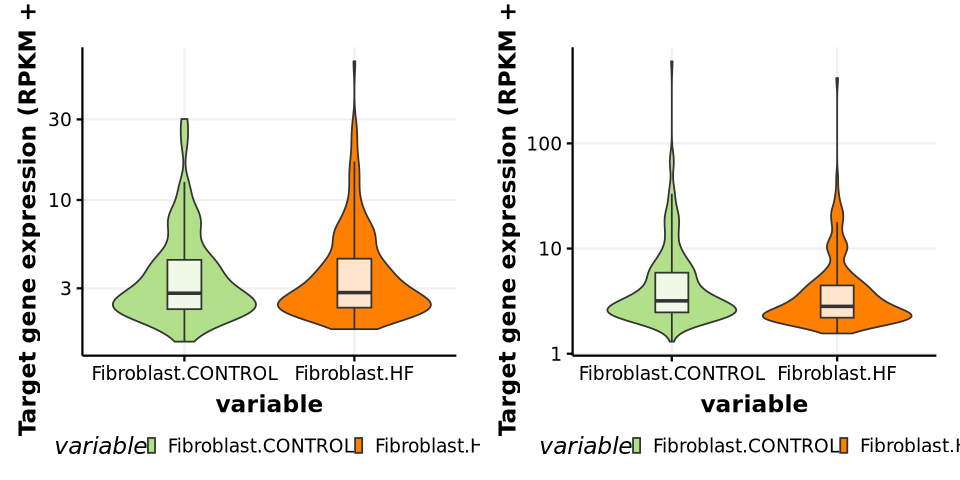

In [460]:
# rpkm <- read.table("integration/FNIH_Heart_pool.int.disease.rpkm.txt", header = T)
colnames(rpkm) <- gsub("label_", "", colnames(rpkm))
deabcpeak <- intersect(sub(":", "-", abcpeak), atacde[atacde$celltype == ct & atacde$log2FoldChange >= 1, ]$range) ### HF upregulated
deabcpeak2 <- intersect(sub(":", "-", abcpeak), atacde[atacde$celltype == ct & atacde$log2FoldChange <= -1, ]$range) ### HF downregulated

qgene <- abc2 %>% filter(CellType == ct & range %in% sub("-", ":", deabcpeak)) %>% select(TargetGene) %>% unlist %>% unique
t1 <- rpkm[qgene, grep(ct, colnames(rpkm))] %>% tibble::rownames_to_column("gene") %>%
reshape2::melt() %>%
ggplot(aes(x = variable, y = value + 1)) + 
geom_violin(aes(fill = variable)) + 
geom_boxplot(width = 0.2, coef = 2, outlier.shape = NA, fill = "white", alpha = 0.8) +
scale_y_log10() + ylab("Target gene expression (RPKM + 1)") + 
theme_Publication() + 
scale_fill_manual(values = c('#B2DF8A', '#FF7F00'))

qgene <- abc2 %>% filter(CellType == ct & range %in% sub("-", ":", deabcpeak2)) %>% select(TargetGene) %>% unlist %>% unique
t2 <- rpkm[qgene, grep(ct, colnames(rpkm))] %>% tibble::rownames_to_column("gene") %>%
reshape2::melt() %>%
ggplot(aes(x = variable, y = value + 1)) + 
geom_violin(aes(fill = variable)) + 
geom_boxplot(width = 0.2, coef = 2, outlier.shape = NA, fill = "white", alpha = 0.8) +
scale_y_log10() + ylab("Target gene expression (RPKM + 1)") + 
theme_Publication() + 
scale_fill_manual(values = c('#B2DF8A', '#FF7F00'))

options(repr.plot.width = 8, repr.plot.height = 4)
cowplot::plot_grid(t1, t2, ncol = 2)

In [464]:
wilcox.test(t1$data[t1$data$variable == paste0(ct, ".CONTROL"), ]$value, t1$data[t1$data$variable == paste0(ct, ".HF"), ]$value, paired = T)
wilcox.test(t2$data[t2$data$variable == paste0(ct, ".CONTROL"), ]$value, t2$data[t2$data$variable == paste0(ct, ".HF"), ]$value)


	Wilcoxon signed rank test with continuity correction

data:  t1$data[t1$data$variable == paste0(ct, ".CONTROL"), ]$value and t1$data[t1$data$variable == paste0(ct, ".HF"), ]$value
V = 9511, p-value = 0.5111
alternative hypothesis: true location shift is not equal to 0



	Wilcoxon rank sum test with continuity correction

data:  t2$data[t2$data$variable == paste0(ct, ".CONTROL"), ]$value and t2$data[t2$data$variable == paste0(ct, ".HF"), ]$value
W = 24960, p-value = 0.001962
alternative hypothesis: true location shift is not equal to 0


No id variables; using all as measure variables

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
No id variables; using all as measure variables

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


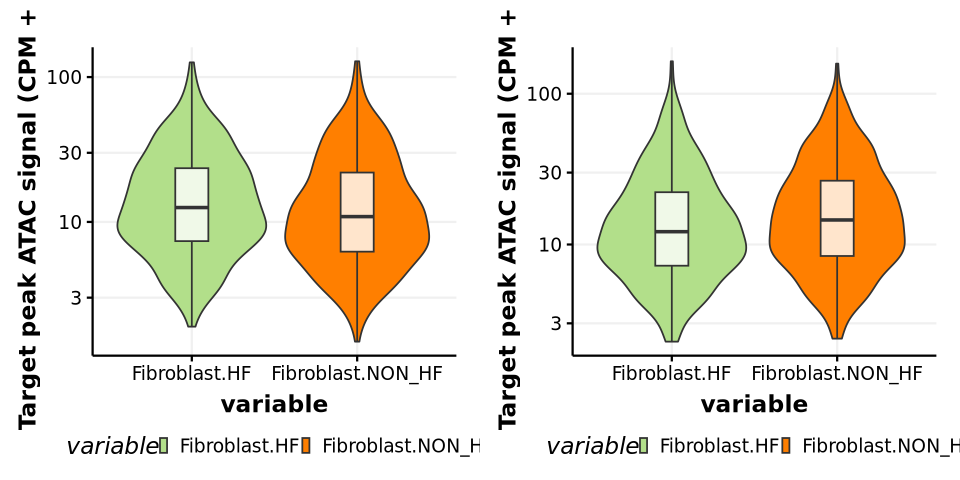

In [465]:
# cpm <- read.table("../reference/ATAC_celltype_HF.cpm.txt", header = T)
deabcgene <- intersect(abcgene, genede[genede$celltype == ct & genede$log2FoldChange >= 1, ]$gene) ### HF upregulated
deabcgene2 <- intersect(abcgene, genede[genede$celltype == ct & genede$log2FoldChange <= -1, ]$gene) ### HF downregulated

qpeak <- abc2 %>% filter(CellType == ct & TargetGene %in% sub("-", ":", deabcgene)) %>% select(range) %>% unlist %>% unique
t1 <- cpm[sub(":", "-", qpeak), grep(ct, colnames(cpm))] %>%
reshape2::melt() %>%
ggplot(aes(x = variable, y = value + 1)) + 
geom_violin(aes(fill = variable)) + 
geom_boxplot(width = 0.2, coef = 2, outlier.shape = NA, fill = "white", alpha = 0.8) +
scale_y_log10() + ylab("Target peak ATAC signal (CPM + 1)") + 
theme_Publication() + 
scale_fill_manual(values = c('#B2DF8A', '#FF7F00'))

qpeak <- abc2 %>% filter(CellType == ct & TargetGene %in% sub("-", ":", deabcgene2)) %>% select(range) %>% unlist %>% unique
t2 <- cpm[sub(":", "-", qpeak), grep(ct, colnames(cpm))] %>%
reshape2::melt() %>%
ggplot(aes(x = variable, y = value + 1)) + 
geom_violin(aes(fill = variable)) + 
geom_boxplot(width = 0.2, coef = 2, outlier.shape = NA, fill = "white", alpha = 0.8) +
scale_y_log10() + ylab("Target peak ATAC signal (CPM + 1)") + 
theme_Publication() + 
scale_fill_manual(values = c('#B2DF8A', '#FF7F00'))

options(repr.plot.width = 8, repr.plot.height = 4)
cowplot::plot_grid(t1, t2, ncol = 2)

In [466]:
wilcox.test(t1$data[t1$data$variable == paste0(ct, ".NON_HF"), ]$value, t1$data[t1$data$variable == paste0(ct, ".HF"), ]$value, paired = T)
wilcox.test(t2$data[t2$data$variable == paste0(ct, ".NON_HF"), ]$value, t2$data[t2$data$variable == paste0(ct, ".HF"), ]$value, paired = T)


	Wilcoxon signed rank test with continuity correction

data:  t1$data[t1$data$variable == paste0(ct, ".NON_HF"), ]$value and t1$data[t1$data$variable == paste0(ct, ".HF"), ]$value
V = 22392, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0



	Wilcoxon signed rank test with continuity correction

data:  t2$data[t2$data$variable == paste0(ct, ".NON_HF"), ]$value and t2$data[t2$data$variable == paste0(ct, ".HF"), ]$value
V = 142176, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0


In [470]:
### Output HF/CTR specific pairs
### gene anchors
p1 <- abc2 %>% filter(CellType == ct & TargetGene %in% deabcgene) %>% 
select(chr, start.x ,end.x, chrom.x, start.y, end.y) %>% distinct

p2 <- abc2 %>% filter(CellType == ct & TargetGene %in% deabcgene) %>% 
select(chr, start.x ,end.x, chrom.x, start.y, end.y) %>% distinct

write.table(p1, paste0("../../87.FNIH_DHC_IGM_240925/05.R/abc/", ct, "_example/", ct, "HF_upregulated_genes_abc.bedpe"), 
            sep = "\t", row.names = F, col.names = F, quote = F)
write.table(p2, paste0("../../87.FNIH_DHC_IGM_240925/05.R/abc/", ct, "_example/", ct, "HF_downregulated_genes_abc.bedpe"), 
            sep = "\t", row.names = F, col.names = F, quote = F)

Using id as id variables

Using id as id variables

Using id as id variables

Using id as id variables



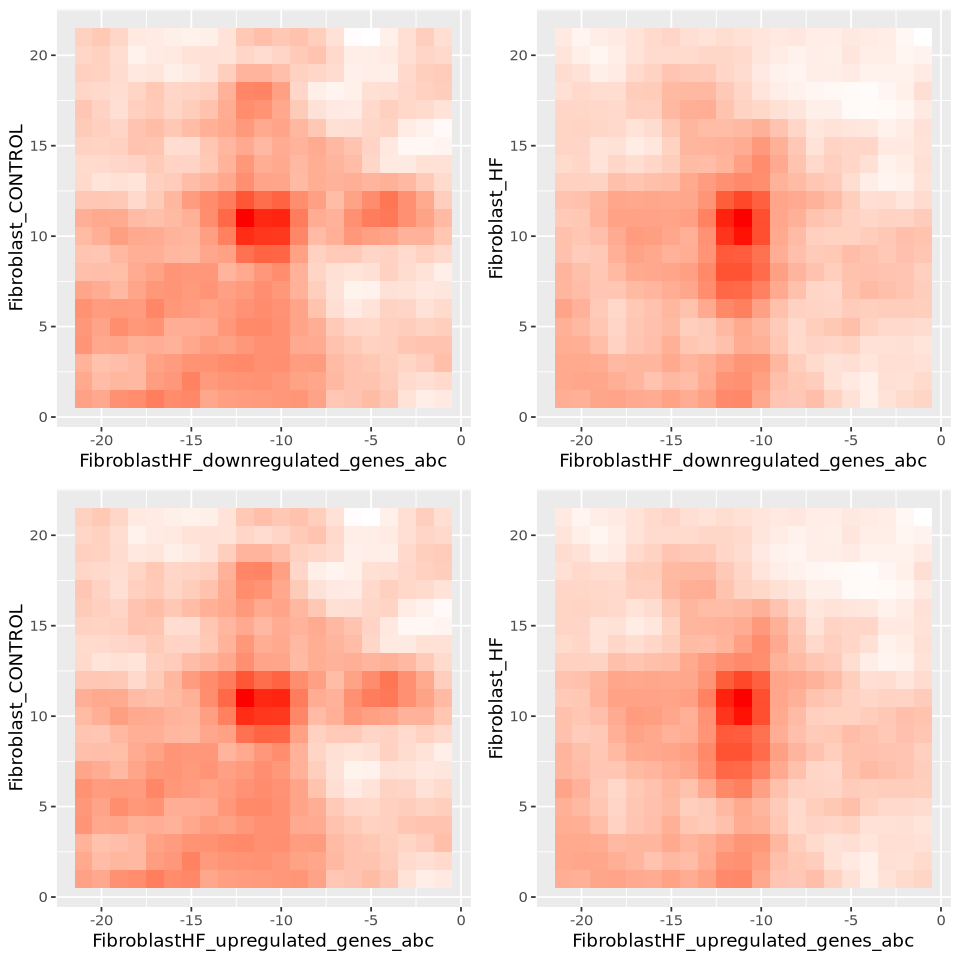

In [471]:
### Read and plot APA to see whether signal changes
plist <- list()
for (file in list.files("../../87.FNIH_DHC_IGM_240925/05.R/abc/Fibroblast_example/", pattern = ".bedpe$")){
    f <- gsub(".bedpe", "", file)
    for (ffile in list.files(paste0("../../87.FNIH_DHC_IGM_240925/05.R/abc/Fibroblast_example/", f))){
        tmp <- read.csv(paste0("../../87.FNIH_DHC_IGM_240925/05.R/abc/Fibroblast_example/", f, "/", ffile, "/10000/gw/APA.txt"), header = F)
        tmp$V1 <- gsub("\\[", "", tmp$V1) %>% as.numeric
        tmp$V21 <- gsub("\\]", "", tmp$V21) %>% as.numeric
        plist[[paste0(f, ":", ffile)]] <- tmp
    }
}

pplist <- list()
for (i in 1:length(plist)){
    name <- stringr::str_split_fixed(names(plist)[i], pattern = ":", n = 2)
    pplist[[i]] <- plist[[i]] %>% mutate(id = colnames(.)) %>%
    reshape2::melt() %>% 
    mutate(id = as.integer(gsub("V", "", id))) %>% arrange(id) %>% 
    mutate(variable = as.integer(gsub("V", "", variable))) %>% arrange(variable) %>% 
    ggplot(aes(x = -id, y = variable, fill = value)) + 
    geom_tile() + NoLegend() + 
    xlab(name[1]) + ylab(name[2]) + 
    scale_fill_gradientn(colours = c("white", "red"), breaks = c(0, 0.2))
}

options(repr.plot.width = 8, repr.plot.height = 8)
cowplot::plot_grid(plotlist = pplist, ncol = 2)

### not expected

### Examples of chromHMM shift

In [140]:
## Plot compartment shift flow chart

chmm <- list()
for (f in list.files("chromhmm/disease_annotate/", pattern = "^Heart_UnionPeak.*")){
    fname = gsub("_annotate.bed", "", f)
    chmm[[f]] <- read.table(paste0("chromhmm/disease_annotate/", f)) %>% 
    mutate(range = paste0(V1, ":", V2, "-", V3)) %>%
    dplyr::select(c(range, V4)) %>% 
    group_by(range) %>%
    slice_sample(n = 1) %>%
    ungroup() %>%
    tibble::column_to_rownames("range") %>% setNames(fname)
}
commonf <- Reduce(intersect, lapply(chmm, rownames))
for (f in names(chmm)){
    chmm[[f]] <- chmm[[f]][commonf, , drop = F]
}
chmm <- Reduce(cbind, chmm[-1], chmm[[1]]) ### dont use do.call for cbind

In [141]:
write.table(chmm, "/projects//ps-renlab2/y2xie/projects/77.LC/81.FNIH_DPT_IGM_240827/05.R/chromhmm/disease_celltype_cCRE.txt",
           sep = "\t", quote = F, row.names = T, col.names = T)

In [160]:
chmm <- read.table("/projects//ps-renlab2/y2xie/projects/77.LC/81.FNIH_DPT_IGM_240827/05.R/chromhmm/disease_celltype_cCRE.txt",
                   sep = "\t", header = T, row.names = 1)
colnames(chmm) <- gsub("Heart_UnionPeak_", "", colnames(chmm))

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


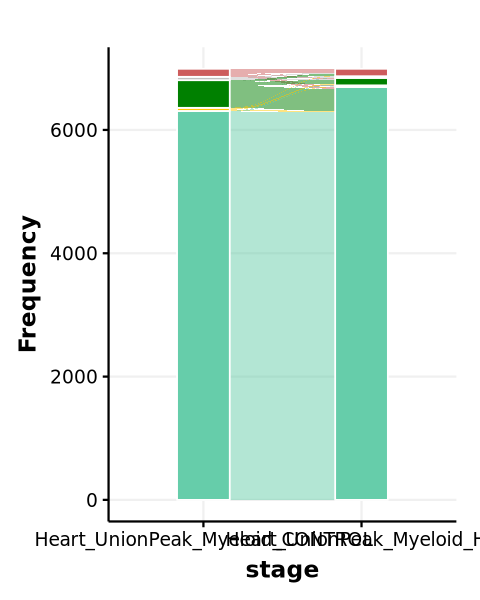

In [1768]:
ctp <- abc %>% filter(CellType %in% grep("Myeloid", CellType, value = T)) # abc_unique #%>% filter(range %in% cts[cts$celltype == "vCM",]$peaks)
data <- chmm[ctp$range,] %>% count(across(everything()))
t1 <- data %>%
mutate(id = 1:nrow(.)) %>%
tidyr::pivot_longer(cols = starts_with('Heart_UnionPeak'), names_to = "stage", values_to = "state") %>%
ggplot(aes(x = stage, stratum = state, alluvium = id, y = n, fill = state)) +
geom_flow() + ylab("Frequency") + 
geom_stratum(color = "white") +
theme_Publication() + 
NoLegend() + 
scale_fill_manual(values = cols)

t1
# ggsave(t1, filename = "plot/FIG_HF_vs_CONTROL_vCM_cts_links_ChromHMM_5_states.pdf", dpi = 300, height = 5, width = 5)

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


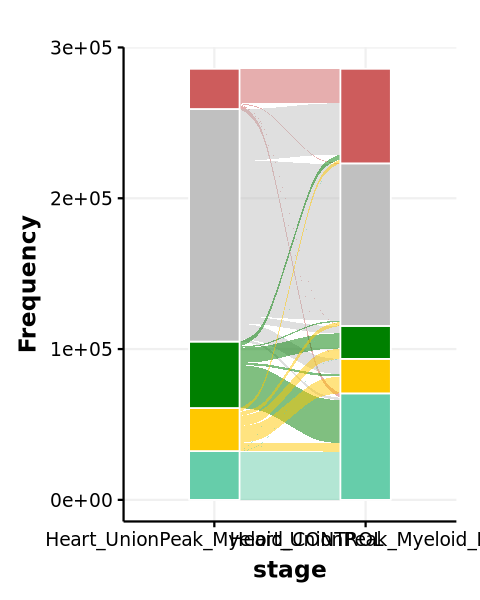

In [1787]:
data <- chmm %>% count(across(everything()))
t1 <- data %>%
mutate(id = 1:nrow(.)) %>%
tidyr::pivot_longer(cols = starts_with('Heart_UnionPeak'), names_to = "stage", values_to = "state") %>%
ggplot(aes(x = stage, stratum = state, alluvium = id, y = n, fill = state)) +
geom_flow() + ylab("Frequency") + 
geom_stratum(color = "white") +
theme_Publication() + 
NoLegend() + 
scale_fill_manual(values = cols)

t1
ggsave(t1, filename = "plot/FIG_HF_vs_CONTROL_Myeloid_cts_links_ChromHMM_5_states.pdf", dpi = 300, height = 5, width = 5)

In [1784]:
ppp <- chmm %>% filter(Heart_UnionPeak_Myeloid_HF %in% c('E5') & !(Heart_UnionPeak_Myeloid_CONTROL %in% c('E5'))) %>% rownames
ggg1 <- abc2 %>% filter(CellType %in% c("Myeloid")) %>% filter(range %in% ppp)
ggg2 <- abc %>% filter(CellType %in% c("Myeloid_HF", "Myeloid_CONTROL")) %>% filter(range %in% ppp)
ggg <- rbind(ggg1, ggg2)
unique(ggg$TargetGene) %>% length

qtable <- enrichr(ggg$TargetGene, dbs)
lapply(qtable, function(x) x %>% filter(Adjusted.P.value < 0.05) %>% dim) 

[1] 984

Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2021... Done.
  Querying KEGG_2021_Human... Done.
Parsing results... Done.


$GO_Biological_Process_2021
[1] 87  9

$KEGG_2021_Human
[1] 42  9

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


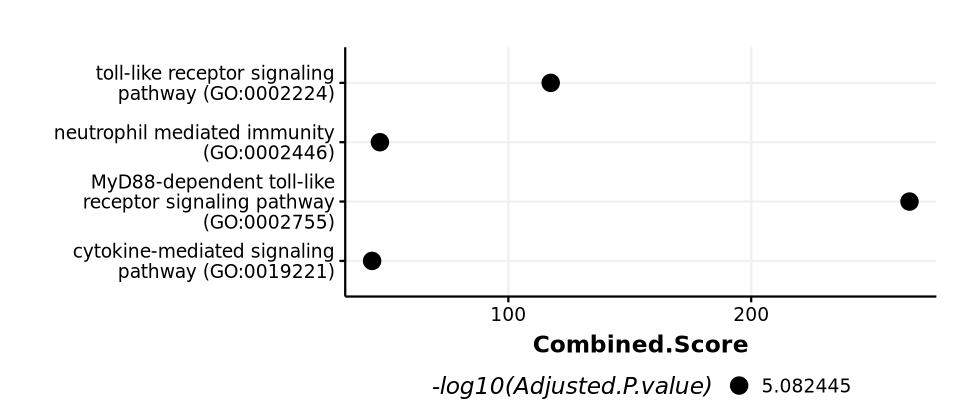

In [1817]:
options(repr.plot.width = 8, repr.plot.height = 3.5)
qtable[[1]] %>% filter(Adjusted.P.value < 0.05) %>%
slice_max(order_by = -log10(Adjusted.P.value), n = 3) %>%
arrange(desc(Combined.Score)) %>%
ggplot(aes(x = Combined.Score, y = Term, size = -log10(Adjusted.P.value))) +
geom_point() + ylab("") + 
scale_y_discrete(labels = label_wrap(30)) +
theme_Publication()

In [1812]:
qtable[[1]] %>% filter(Adjusted.P.value < 0.05) %>%
slice_max(order_by = -log10(Adjusted.P.value), n = 5) %>%
arrange(desc(Combined.Score))

Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Odds.Ratio,Combined.Score,Genes
<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<chr>
MyD88-dependent toll-like receptor signaling pathway (GO:0002755),12/29,4.491765e-09,8.270946e-06,0,0,13.797386,265.19983,IRAK1;TRAF6;BTK;LY96;IRAK3;TAB2;RPS27A;TLR5;MAP3K7;TLR4;MYD88;TLR2
toll-like receptor signaling pathway (GO:0002224),21/91,2.279596e-09,8.270946e-06,0,0,5.902181,117.44907,COLEC12;ITGAM;UBE2D3;LY96;IRAK3;NMI;IKBKB;RPS6KA3;OAS1;IRAK1;TRAF6;BTK;TAB2;TLR5;RPS27A;PIK3AP1;MAP3K7;TLR4;MYD88;BIRC3;TLR2
neutrophil mediated immunity (GO:0002446),55/488,8.838841e-09,8.270946e-06,0,0,2.540826,47.11735,ITGAM;DDX3X;PTPRJ;CXCL1;PYGL;MAGT1;GLIPR1;ANPEP;C3AR1;ITGAV;RAC1;CTSC;CAP1;ARSA;MANBA;FCER1G;ANXA2;PRKCD;ATP6AP2;ADAM10;CYBB;KCNAB2;APRT;EEF1A1;RAP2B;CAT;PLEKHO2;DNASE1L1;TLR2;KMT2E;PDXK;RAB5C;ROCK1;FGL2;CFP;GNS;RAP1B;CST3;NCSTN;CD59;CCT8;CD58;SLC15A4;ATP6V0A1;TMEM30A;GCA;CMTM6;HUWE1;IGF2R;DERA;VNN1;FABP5;RAB14;VAPA;GLA
neutrophil degranulation (GO:0043312),54/481,1.382610e-08,1.035022e-05,0,0,2.527778,45.74446,ITGAM;DDX3X;PTPRJ;CXCL1;PYGL;MAGT1;GLIPR1;ANPEP;C3AR1;ITGAV;RAC1;CTSC;CAP1;ARSA;MANBA;FCER1G;ANXA2;PRKCD;ATP6AP2;ADAM10;CYBB;KCNAB2;APRT;EEF1A1;RAP2B;CAT;PLEKHO2;DNASE1L1;TLR2;PDXK;RAB5C;ROCK1;FGL2;CFP;GNS;RAP1B;CST3;NCSTN;CD59;CCT8;CD58;SLC15A4;ATP6V0A1;TMEM30A;GCA;CMTM6;HUWE1;IGF2R;DERA;VNN1;FABP5;RAB14;VAPA;GLA
cytokine-mediated signaling pathway (GO:0019221),65/621,7.607963e-09,8.270946e-06,0,0,2.348306,43.89940,CD86;ARF1;CDKN1B;ITGAM;TNFRSF6B;CXCL8;EDA;RPLP0;F13A1;SLA;PTPRJ;CXCL1;CXCL3;CXCL2;IKBKB;TRIM8;CASP1;TIMP1;MAP3K7;JAK1;IL13RA1;ANXA1;FCER1G;ANXA2;GSTO1;PRKCD;IRAK3;GAB2;SIRT1;TNFRSF1A;IL17RA;PSMA1;OAS1;TRAF6;IL1B;TRAF5;IRF5;BIRC3;CCL13;CEBPD;PDGFB;SAMHD1;PSMB6;RAP1B;CCL8;IRAK1;STAT4;STAT6;RPS27A;SH2B3;PAK2;MAP3K3;POU2F1;STAT1;STAT2;FER;TEC;BCL6;IL2RA;HNRNPA2B1;TNFSF8;TAB2;TRIM38;VIM;MYD88


No id variables; using all as measure variables

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_boxplot()`).”


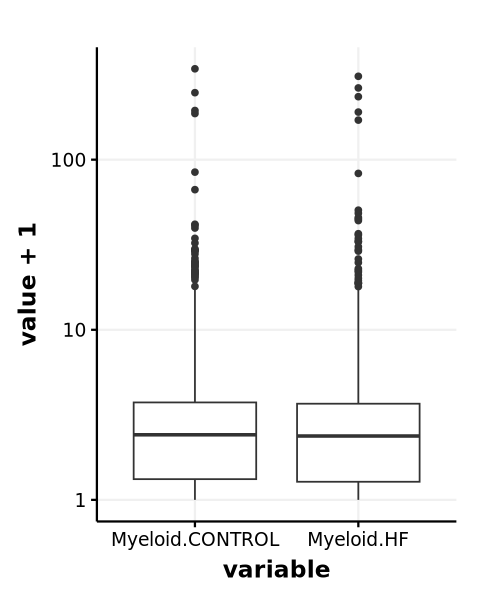

In [1775]:
# q1 <- qtable[[1]] %>% filter(Adjusted.P.value < 0.05) 
# q1 <- strsplit(q1$Genes, ";")[[1]]
rpkm[grep(paste(unique(ggg$TargetGene), collapse = "|"), rownames(rpkm)), grep("Myeloid", colnames(rpkm))] %>%
reshape2::melt() %>%
ggplot(aes(x = variable, y = value + 1)) + 
scale_y_log10() + 
geom_boxplot() + 
theme_Publication()

In [615]:
tmp <- abc %>%
filter(TargetGene == "TNNT2") %>%
dplyr::select(chr, start.x, end.x) %>%
distinct

write.table(tmp, "TNNT2_enhancer.bed", sep = "\t", quote = F, row.names = F, col.names = F)

In [618]:
abc %>%
filter(TargetGene == "TNNT2") %>%
distinct

chr,start.x,end.x,range,name,CPM,chrom.x,start.y,end.y,TargetGene,RPKM,CellType,ABC.Score
<chr>,<int>,<int>,<chr>,<chr>,<dbl>,<chr>,<int>,<int>,<chr>,<dbl>,<chr>,<dbl>
chr1,201361639,201361939,chr1:201361639-201361939,genic|chr1:201361639-201361939,3.439878,chr1,201377763,201377764,TNNT2,48.247842,vCM,0.037874
chr1,201369124,201369424,chr1:201369124-201369424,genic|chr1:201369124-201369424,5.130829,chr1,201377763,201377764,TNNT2,48.247842,vCM,0.056492
chr1,201384036,201384323,chr1:201384036-201384323,genic|chr1:201384036-201384323,6.309664,chr1,201377763,201377764,TNNT2,48.247842,vCM,0.062418
chr1,201385354,201385620,chr1:201385354-201385620,genic|chr1:201385354-201385620,6.976382,chr1,201377763,201377764,TNNT2,48.247842,vCM,0.069013
chr1,201357317,201357567,chr1:201357317-201357567,intergenic|chr1:201357317-201357567,2.236492,chr1,201377763,201377764,TNNT2,45.005136,aCM,0.020757
chr1,201358579,201358879,chr1:201358579-201358879,intergenic|chr1:201358579-201358879,2.253896,chr1,201377763,201377764,TNNT2,45.005136,aCM,0.020919
chr1,201361639,201361939,chr1:201361639-201361939,genic|chr1:201361639-201361939,3.411303,chr1,201377763,201377764,TNNT2,45.005136,aCM,0.044381
chr1,201369124,201369424,chr1:201369124-201369424,genic|chr1:201369124-201369424,4.551304,chr1,201377763,201377764,TNNT2,45.005136,aCM,0.059213
chr1,201384036,201384323,chr1:201384036-201384323,genic|chr1:201384036-201384323,5.256191,chr1,201377763,201377764,TNNT2,45.005136,aCM,0.059190


### How about disease?

In [744]:
gorder <- c("MYL2" ,"MYH6" ,"WT1" ,"MYH11", "PDGFRB", "NRXN1", 
            "PDGFRA", "ADIPOQ", "FLT1", "CDH5", "C1QA", "CD3E")
ttt <- tss %>% filter(V7 %in% gorder) %>%
mutate(V7 = factor(V7, levels = gorder)) %>%
arrange(V7) %>%
group_by(V7) %>%
filter(
    (V6 == "+" & V2 == min(V2)) |
    (V6 != "+" & V3 == max(V3))
  ) %>%
  ungroup() %>%
mutate(V2 = V2 - 7000) %>%
mutate(V3 = V3 + 8500) %>%
ungroup() %>% 
select(c(V1, V2, V3)) 
write.table(ttt, "/projects//ps-renlab2/y2xie/projects/tmp/heart_pool_regiob.bed",
           sep = "\t", quote = F, row.names = F, col.names = F)

In [34]:
rpkm["WRN", grep('vCM', colnames(rpkm))]

,vCM.CONTROL,vCM.HF
,<dbl>,<dbl>
WRN,0.4431236,0.4893418


In [842]:
floop <- read.table("../../87.FNIH_DHC_IGM_240925/04.matrices/raw/hic/loop/Fibroblast_HF_5000/merged_loops.bedpe")
range1 <- GenomicRanges::GRanges(floop$V1, IRanges(floop$V2, floop$V3))
range2 <- GenomicRanges::GRanges(floop$V4, IRanges(floop$V5, floop$V6))
qrange <- GenomicRanges::GRanges(13, IRanges(37560000, 37600000))

idx <- c(unique(queryHits(findOverlaps(range1, qrange))), unique(queryHits(findOverlaps(range2, qrange))))
floop[idx, 1:6]

,V1,V2,V3,V4,V5,V6
,<chr>,<int>,<int>,<chr>,<int>,<int>
479,13,37100000,37125000,13,37575000,37600000


In [838]:
meta = read.table("../../87.FNIH_DHC_IGM_240925/05.R/integration/FNIH_DHC_annotation.filter.txt", sep = "\t")
hfcells <- meta %>% filter(condition == "HF") %>% rownames

lsumm <- read.csv("../../87.FNIH_DHC_IGM_240925/05.R/loop/Fibro_POSTN_loop.summary", sep = '\t', header = F) %>%
mutate(V9 = gsub(".contacts.gz", "", V8)) %>%
mutate(V7 = ifelse(V7 == ".", 0, V7)) %>%
group_by(V9) %>%
summarise(impute_counts = sum(as.numeric(V7))) %>%
mutate(class = ifelse(V9 %in% hfcells, "HF", "Non-HF"))

lsumm <- lsumm %>% mutate(type = impute_counts > 0)
lsummt <- table(lsumm$class, lsumm$type) %>% 
as.data.frame %>% 
setNames(c("class", "type", "count")) 

lsummt <- matrix(lsummt$count, ncol = 2, nrow = 2, dimnames = list(unique(lsummt$class), unique(lsummt$type))) %>% t
lsummt
chisq.test(lsummt)

,HF,Non-HF
FALSE,14104,6203
TRUE,107,28



	Pearson's Chi-squared test with Yates' continuity correction

data:  lsummt
X-squared = 5.6309, df = 1, p-value = 0.01765


[1] 0.0075865

[1] 0.004513945

In [234]:
test <- abc[grep("Fibroblast", abc$CellType),] %>% select(c(range, TargetGene, CellType)) %>% distinct

### how many pairs are shared?
ts1 <- paste0(test[test$CellType == "Fibroblast_HF", ]$range, "__", test[test$CellType == "Fibroblast_HF", ]$TargetGene)
ts2 <- paste0(test[test$CellType == "Fibroblast_CONTROL", ]$range, "__", test[test$CellType == "Fibroblast_CONTROL", ]$TargetGene)
intersect(ts1, ts2) %>% length
length(intersect(ts1, ts2))/length(ts1)
length(intersect(ts1, ts2))/length(ts2)

[1] 4797

[1] 0.7350598

[1] 0.6075228

In [235]:
cts <- "Fibroblast"
diffpeak <- diffgene <- list()
for (dd in c("LV", "RV")){
    diffpeak[[dd]] <- read.table(paste0("../reference/Multiome_Downstream/ATAC/", dd, "/DESEQ/", cts, "_HF_vs_NON_HF.dds.res")) %>%
    filter(padj < 0.05 & abs(log2FoldChange) >= 1) %>%
    rownames %>% unique
    diffpeak[[dd]] <- sub("-", ":", diffpeak[[dd]])
    
    diffgene[[dd]] <- read.table(paste0("../reference/Multiome_Downstream/RNA/", dd, "/DESEQ/", cts, "_HF_vs_NON_HF.dds.res")) %>%
    filter(padj < 0.05 & abs(log2FoldChange) >= 1) %>%
    rownames %>% unique
}

In [236]:
length(unique(unlist(diffpeak)))
length(unique(unlist(diffgene)))

[1] 7122

[1] 1273

In [244]:
tmp <- abc[grep("Fibroblast", abc$CellType),] %>% mutate(pair = paste0(range, "__", TargetGene)) 
tmp2 <- tmp %>% filter(abs(start.y - start.x) >= 100000) %>%
filter((range %in% unique(unlist(diffpeak))) | (TargetGene %in% unique(unlist(diffgene)))) %>%
arrange(desc(abs(start.y - start.x)))

dim(tmp2)

tmp2$chr <- gsub("chr", "", tmp2$chr)
tmp2$chrom.x <- gsub("chr", "", tmp2$chrom.x)
write.table(tmp2[,c(1:3,7:9)], "Fibroblast_abc.bedpe", sep = "\t", quote = F, row.names = F, col.names = F)

[1] 442  14

In [528]:
pair1 <- read.table("Fibroblast_CONTROL_5000_unique.bedpe")
pair1 %>% 
mutate(region = paste0(V1, ":", as.integer(V2-500000), "-", as.integer(V6+500000))) %>%
filter(abs(V5 - V3) >= 100000 & abs(V5 - V3) < 1000000) %>%
arrange(desc(abs(V5 - V3))) %>%
head(25)

,V1,V2,V3,V4,V5,V6,V7,region
,<chr>,<int>,<int>,<chr>,<int>,<int>,<chr>,<chr>
1,5,158150000,158175000,5,159100000,159125000,"255,0,0",5:157650000-159625000
2,13,84900000,84925000,13,85800000,85825000,"255,0,0",13:84400000-86325000
3,12,88125000,88150000,12,88975000,89000000,"255,0,0",12:87625000-89500000
4,22,39525000,39550000,22,40325000,40350000,"255,0,0",22:39025000-40850000
5,12,105400000,105425000,12,106125000,106150000,"255,0,0",12:104900000-106650000
6,1,168600000,168625000,1,169325000,169350000,"255,0,0",1:168100000-169850000
7,22,43975000,44000000,22,44625000,44650000,"255,0,0",22:43475000-45150000
8,5,138650000,138675000,5,139250000,139275000,"255,0,0",5:138150000-139775000
9,2,8125000,8150000,2,8675000,8700000,"255,0,0",2:7625000-9200000


In [132]:
qmeta <- ref@meta.data %>%
select(c(library, gex_barcode, cell.major_types)) %>%
mutate(gex_barcode = gsub(".*_([^_]+)$", "\\1", gex_barcode)) %>%
setNames(c("library", "barcode", "cluster")) %>%
mutate(sample = paste0(library, "_rmdup.bam"))

write.table(qmeta, "../reference/LV_RV_LA_RA.multiome.mrg.filt.MTless.silQC.cluster_info.xls", sep = "\t", 
            row.names = F, col.names = T, quote = F)

In [573]:
### split from tagalign...
qmeta <- ref@meta.data %>%
mutate(disease_status_major = ifelse(disease_status_major == "NON_HF", "CONTROL", disease_status_major)) %>%
mutate(tmp = paste0(cell.major_types, "_", disease_status_major)) %>%
mutate(sample = paste0("FNIH_Heart.cluster.", cell.major_types, "_atac_keep_reads.tagAlign.gz")) %>%
select(c(library, gex_barcode, sample, tmp)) %>%
mutate(gex_barcode = gsub(".*_([^_]+)$", "\\1", gex_barcode)) %>%
setNames(c("library", "barcode", "sample", "cluster")) %>%
mutate(barcode = paste0(library, ":", barcode)) 
# mutate(sample = paste0("FNIH_Heart.cluster.", sample, ".bam"))

head(qmeta)
write.table(qmeta, "../reference/LV_RV_LA_RA.multiome.mrg.filt.MTless.silQC.HF.cluster_info.xls", sep = "\t", 
            row.names = F, col.names = T, quote = F)

,library,barcode,sample,cluster
,<chr>,<chr>,<chr>,<chr>
QY_2193_1_2_QY_2192_1_2_AAACAGCCAACTAGGG-1,QY_2193_1_2_QY_2192_1_2,QY_2193_1_2_QY_2192_1_2:AAACAGCCAACTAGGG-1,FNIH_Heart.cluster.Fibroblast_atac_keep_reads.tagAlign.gz,Fibroblast_HF
QY_2193_1_2_QY_2192_1_2_AAACAGCCACTTACAG-1,QY_2193_1_2_QY_2192_1_2,QY_2193_1_2_QY_2192_1_2:AAACAGCCACTTACAG-1,FNIH_Heart.cluster.Endothelial_atac_keep_reads.tagAlign.gz,Endothelial_HF
QY_2193_1_2_QY_2192_1_2_AAACAGCCAGTTTGTG-1,QY_2193_1_2_QY_2192_1_2,QY_2193_1_2_QY_2192_1_2:AAACAGCCAGTTTGTG-1,FNIH_Heart.cluster.vCM_atac_keep_reads.tagAlign.gz,vCM_CONTROL
QY_2193_1_2_QY_2192_1_2_AAACAGCCATCCGTAA-1,QY_2193_1_2_QY_2192_1_2,QY_2193_1_2_QY_2192_1_2:AAACAGCCATCCGTAA-1,FNIH_Heart.cluster.Endothelial_atac_keep_reads.tagAlign.gz,Endothelial_HF
QY_2193_1_2_QY_2192_1_2_AAACAGCCATGCATAT-1,QY_2193_1_2_QY_2192_1_2,QY_2193_1_2_QY_2192_1_2:AAACAGCCATGCATAT-1,FNIH_Heart.cluster.vCM_atac_keep_reads.tagAlign.gz,vCM_CONTROL
QY_2193_1_2_QY_2192_1_2_AAACATGCAGGCCTTG-1,QY_2193_1_2_QY_2192_1_2,QY_2193_1_2_QY_2192_1_2:AAACATGCAGGCCTTG-1,FNIH_Heart.cluster.Fibroblast_atac_keep_reads.tagAlign.gz,Fibroblast_CONTROL


In [325]:
# tmp <- read.table("../reference/80LociHF_CelltypePeaks_Differential_ABC.txt", header = T)
tmp[,c("chrom1", "start1", "end1")] <- stringr::str_split_fixed(tmp$Celltype_Peak_ID, pattern = "-", n = 5)[,3:5]
tmp$range <- paste0(tmp$chrom1, "-", tmp$start1, "-", tmp$end1) 

merge(tmp, hg38, by.x = 'ABC_TargetGene', by.y = 'V7') %>%
filter(celltype %in% korder) %>%
mutate(start1 = ifelse(V6 == '+', V2, V3)) %>%
mutate(dist = abs(start - start1)) %>%
dplyr::filter(dist >= 10000) %>%
# dplyr::filter(ABC_TargetGene == 'TNFRSF14') %>% #unlist %>% unique
dplyr::select(Peak_ID, ABC_TargetGene, celltype) %>% distinct

Peak_ID,ABC_TargetGene,celltype
<chr>,<chr>,<chr>
chr11-47257343-47257643,AC018410.1,Myeloid
chr11-47257343-47257643,AC018410.1,Pericyte
chr11-47257343-47257643,AC018410.1,aCM
chr18-79820000-79820300,AC021594.2,Myeloid
chr1-78068734-78069034,AC103591.3,vCM
chr18-79506916-79507216,AC139100.2,vCM
chr18-79693644-79693944,ADNP2,Endothelial
chr18-79506916-79507216,ADNP2,Pericyte
chr18-79820000-79820300,ADNP2,Myeloid


In [348]:
abc %>% filter(range %in% tmp[tmp$PPA > 0.015,]$range, abs(start.x - start.y) >= 10000) %>%
filter(CellType %in% korder) %>%
dplyr::select(TargetGene) %>% unlist %>% unique 

[1] "PROB1"      "SKI"        "RER1"       "HES5"       "AL513477.2"
[6] "TNFRSF14"   "CTSB"

In [356]:
abc %>% filter(range %in% tmp[tmp$PPA > 0.01,]$range, abs(start.x - start.y) >= 10000) %>%
filter(CellType %in% korder) %>%
dplyr::filter(TargetGene == 'CTSB')

tmp %>% filter(Peak_ID == "chr1-2207728-2207962")

chr,start.x,end.x,range,name,CPM,chrom.x,start.y,end.y,TargetGene,RPKM,CellType,ABC.Score
<chr>,<int>,<int>,<chr>,<chr>,<dbl>,<chr>,<int>,<int>,<chr>,<dbl>,<chr>,<dbl>
chr8,11898182,11898482,chr8-11898182-11898482,intergenic|chr8:11898182-11898482,5.439957,chr8,11869447,11869448,CTSB,28.24893,Myeloid,0.025887


seqnames,start,end,width,strand,rsID,PPA,Locus,Peak_ID,celltype,chromSTATE,Celltype_Peak_ID,chamber,contrast,ATAC_DESeq2,ABC_TargetGene,chrom1,start1,end1,range
<chr>,<int>,<int>,<int>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
chr1,2207867,2207868,2,*,rs2503713,0.03391747,locus_1,chr1-2207728-2207962,SM,E5,SM--chr1-2207728-2207962,LV,HF_vs_NON_HF,NS,AL513477.2,chr1,2207728,2207962,chr1-2207728-2207962
chr1,2207867,2207868,2,*,rs2503713,0.03391747,locus_1,chr1-2207728-2207962,SM,E5,SM--chr1-2207728-2207962,LV,HF_vs_NON_HF,NS,RER1,chr1,2207728,2207962,chr1-2207728-2207962
chr1,2207867,2207868,2,*,rs2503713,0.03391747,locus_1,chr1-2207728-2207962,SM,E5,SM--chr1-2207728-2207962,LV,HF_vs_NON_HF,NS,SKI,chr1,2207728,2207962,chr1-2207728-2207962
chr1,2207867,2207868,2,*,rs2503713,0.03391747,locus_1,chr1-2207728-2207962,SM,E5,SM--chr1-2207728-2207962,RV,HF_vs_NON_HF,NS,AL513477.2,chr1,2207728,2207962,chr1-2207728-2207962
chr1,2207867,2207868,2,*,rs2503713,0.03391747,locus_1,chr1-2207728-2207962,SM,E5,SM--chr1-2207728-2207962,RV,HF_vs_NON_HF,NS,RER1,chr1,2207728,2207962,chr1-2207728-2207962
chr1,2207867,2207868,2,*,rs2503713,0.03391747,locus_1,chr1-2207728-2207962,SM,E5,SM--chr1-2207728-2207962,RV,HF_vs_NON_HF,NS,SKI,chr1,2207728,2207962,chr1-2207728-2207962
chr1,2207867,2207868,2,*,rs2503713,0.03391747,locus_1,chr1-2207728-2207962,SM,E5,SM--chr1-2207728-2207962,LA,HF_vs_NON_HF,NS,AL513477.2,chr1,2207728,2207962,chr1-2207728-2207962
chr1,2207867,2207868,2,*,rs2503713,0.03391747,locus_1,chr1-2207728-2207962,SM,E5,SM--chr1-2207728-2207962,LA,HF_vs_NON_HF,NS,RER1,chr1,2207728,2207962,chr1-2207728-2207962
chr1,2207867,2207868,2,*,rs2503713,0.03391747,locus_1,chr1-2207728-2207962,SM,E5,SM--chr1-2207728-2207962,LA,HF_vs_NON_HF,NS,SKI,chr1,2207728,2207962,chr1-2207728-2207962


Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


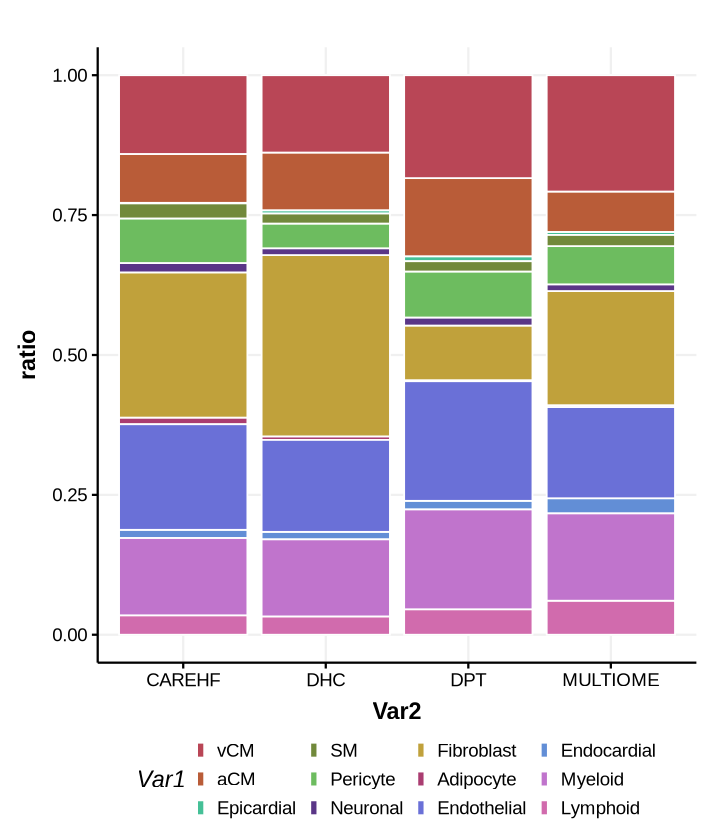

In [392]:
options(repr.plot.width = 6, repr.plot.height = 7)

# meta <- read.csv("integration/All_data_int_metadata.file.txt", sep = '\t')
tmp <- meta %>% filter(integrated_majortype == 1)
table(tmp$nn2.celltype, tmp$orig.ident) %>% 
as.data.frame %>%
group_by(Var2) %>%
mutate(ratio = Freq/sum(Freq)) %>% ungroup %>%
mutate(Var1 = factor(Var1, levels = corder)) %>%
ggplot(aes(x = Var2, y = ratio, fill = Var1)) + 
geom_col(color = "white") + 
theme_Publication() + 
scale_fill_manual(values = celltype_colors)

In [478]:
### Differential K27ac results
# desum <- read.table("../reference/4Chambers_Ac_ATACpeaks/HFnonHF_ResultsSummaries.tsv", sep = '\t', header = T)
desum <- read.table("../reference/4chambers_Ac1kb/4Chambers_Ac//HFnonHF_ResultsSummaries.tsv", sep = '\t', header = T)
desum$celltype <- gsub("_H3k27ac", "", desum$celltype)
desum %>% arrange(desc(up_padj))

,celltype,contrast,overall_meanCount,non0s_genes,up_pval,down_pval,up_padj,down_padj
,<chr>,<chr>,<dbl>,<int>,<int>,<int>,<int>,<int>
10,vCM,HF_vs_NON_HF,3.2924323,24604,36310,5411,6154,862
1,aCM,HF_vs_NON_HF,3.4383353,39063,5098,3354,88,63
3,Endothelial,HF_vs_NON_HF,1.7191401,22517,2638,3914,13,27
7,Myeloid,HF_vs_NON_HF,2.2415656,7352,4125,9222,4,16
2,Endocardial,HF_vs_NON_HF,0.1809744,1,236,418,0,0
4,Fibroblast,HF_vs_NON_HF,0.6656144,3818,2164,3363,0,0
5,Low quality,HF_vs_NON_HF,0.1608311,9,180,283,0,0
6,Lymphoid,HF_vs_NON_HF,0.3260571,183,872,859,0,0
8,Pericyte,HF_vs_NON_HF,0.8921581,4865,976,1373,0,14


Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


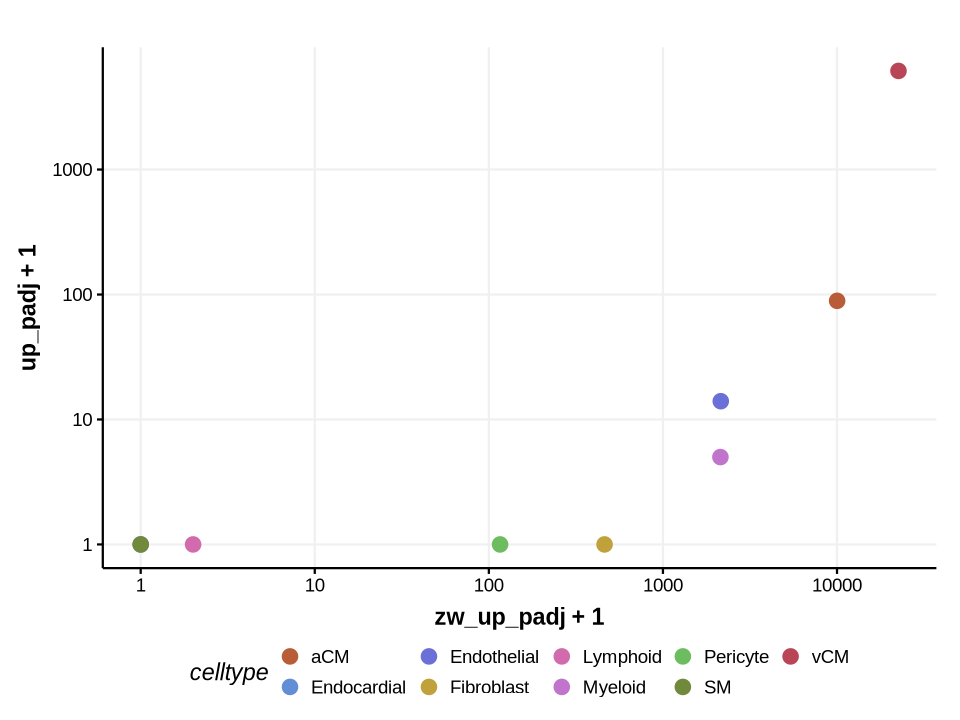

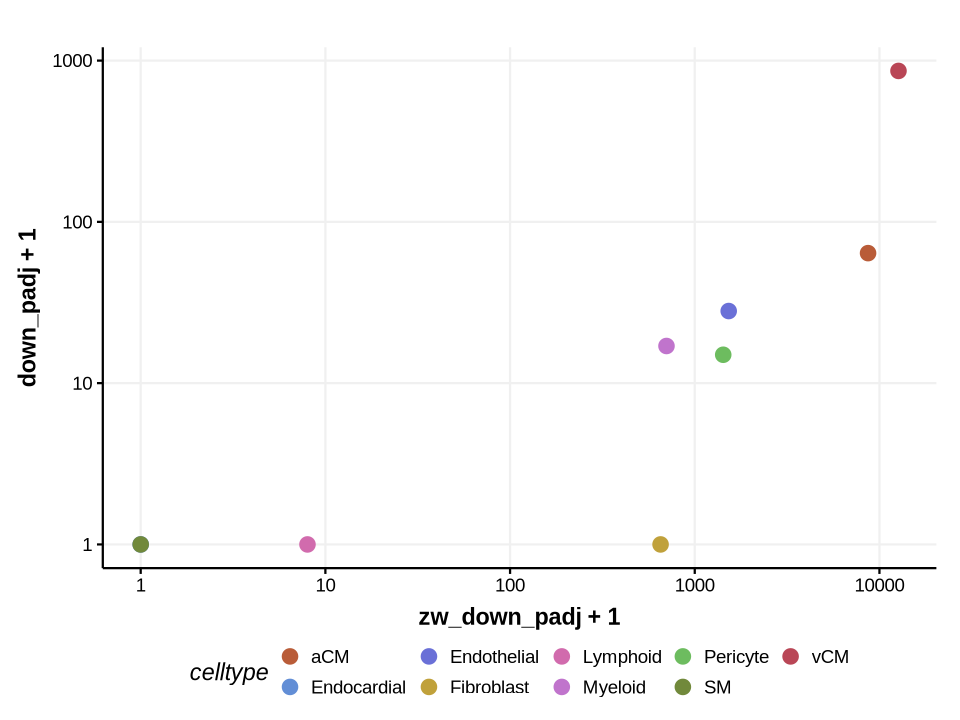

In [484]:
### read ZW summary
# lsum <- list()
# for (f in list.files("250225_ZW_diff_H3K27ac/")){
#     fname <- gsub("_H3K27ac.txt", "", f)
#     tmp <- read.csv(paste0("250225_ZW_diff_H3K27ac/", f), header = T)
#     l1 <- tmp %>% filter(adjusted.p.value < 0.05) %>% filter(abs(log2.fold_change.) >= 1)
#     l2 <- tmp %>% filter(adjusted.p.value < 0.05) %>% filter(abs(log2.fold_change.) >= 0.5)
#     l3 <- tmp %>% filter(adjusted.p.value < 0.05) %>% filter(abs(log2.fold_change.) >= 0)
#     lsum[[fname]] <- data.frame(compare = fname, logfc1 = nrow(l1), logfc0.5 = nrow(l2))
# }

tmp <- do.call(rbind, lsum) %>%
mutate(celltype = stringr::str_split_fixed(compare, pattern = "_", n = 4)[,1]) %>%
mutate(condition = stringr::str_split_fixed(compare, pattern = "_", n = 4)[,4]) %>%
reshape2::dcast(celltype ~ condition, value.var = "logfc0.5") %>%
setNames(c('celltype', 'zw_down_padj', 'zw_up_padj'))

options(repr.plot.width = 8, repr.plot.height = 6)
merge(desum, tmp, by = "celltype") %>%
ggplot(aes(x = zw_up_padj+1, y = up_padj+1, color = celltype)) + 
geom_point(size = 4) + 
theme_Publication() + scale_x_log10() + scale_y_log10() +
scale_colour_manual(values = celltype_colors)

merge(desum, tmp, by = "celltype") %>%
ggplot(aes(x = zw_down_padj+1, y = down_padj+1, color = celltype)) + 
geom_point(size = 4) + 
theme_Publication() + scale_x_log10() + scale_y_log10() +
scale_colour_manual(values = celltype_colors)

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


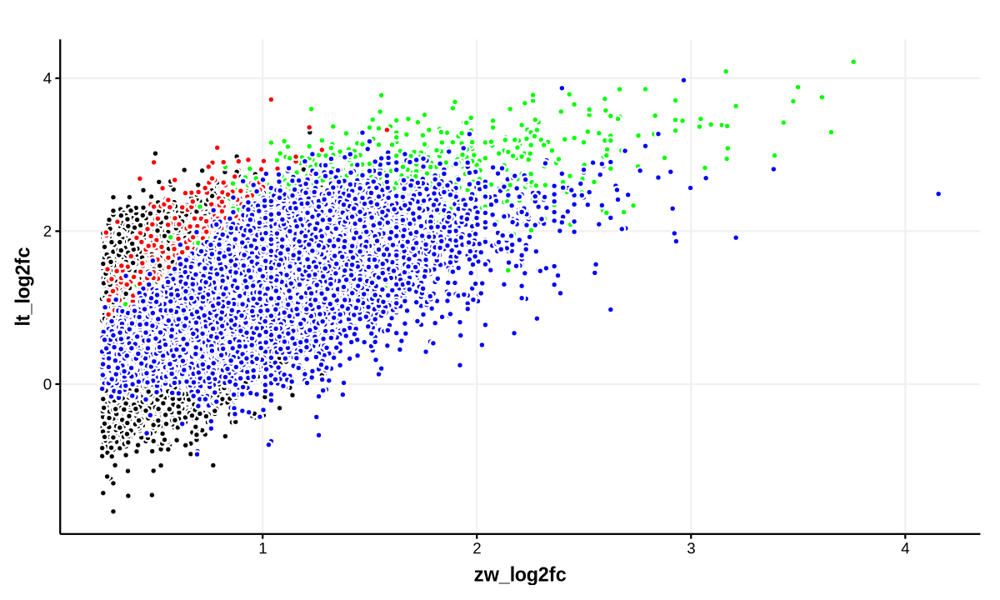

In [543]:
### find peaks that are not called:
t1 <- read.table("../reference/4chambers_Ac1kb//4Chambers_Ac/vCM_H3k27ac_HF_vs_NON_HF.dds.res", sep = '\t', header = T)
t2 <- read.csv("250225_ZW_diff_H3K27ac/vCM_sc_diffpeaks_HF_H3K27ac.txt", header = T)

tmp <- merge(t1, t2, by.x = 0, by.y = 'feature.name')
tmp %>%
ggplot(aes(x = log2.fold_change., y = log2FoldChange)) + 
geom_point(color = "white", fill = "black", stroke = 1, shape = 21) + 
geom_point(data = tmp[tmp$padj < 0.05 & tmp$adjusted.p.value < 0.05, ], aes(x = log2.fold_change., y = log2FoldChange), 
          color = "white", fill = "green", stroke = 1, shape = 21) + 
geom_point(data = tmp[tmp$padj < 0.05 & tmp$adjusted.p.value >= 0.05, ], aes(x = log2.fold_change., y = log2FoldChange), 
          color = "white", fill = "red", stroke = 1, shape = 21) + 
geom_point(data = tmp[tmp$padj >= 0.05 & tmp$adjusted.p.value < 0.05, ], aes(x = log2.fold_change., y = log2FoldChange), 
          color = "white", fill = "blue", stroke = 1, shape = 21) + 
theme_Publication() + 
xlab("zw_log2fc") + ylab("lt_log2fc")

In [497]:
merge(t1, t2, by.x = 0, by.y = 'feature.name') %>%
filter(adjusted.p.value < 0.05, padj >= 0.05) %>%
arrange(desc(log2.fold_change.)) %>%
head ### this fucking deseq results

,Row.names,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,log2.fold_change.,p.value,adjusted.p.value
,<I<chr>>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,chrY:9160652-9161651,1.3948592,2.486936,0.8185240,3.038318,0.0023790245,0.09625052,4.155136,1.630665e-14,8.196598e-12
2,chr8:129004721-129005720,1.4288621,2.809985,0.8143169,3.450726,0.0005590805,0.05143371,3.385433,1.994237e-12,5.450773e-10
3,chr12:58781159-58782158,1.4960516,1.914162,0.7911642,2.419425,0.0155450643,0.20852406,3.209583,1.327200e-18,1.776103e-15
4,chr13:96450387-96451386,0.9044164,2.693503,0.8611530,3.127787,0.0017612790,0.08518664,3.069406,5.044621e-10,7.260027e-08
5,chr4:79514306-79515305,2.2168905,2.565286,1.1209822,2.288427,0.0221126763,0.23925356,2.997430,3.932823e-16,2.958057e-13
6,chr17:72337716-72338715,1.2169691,3.974322,1.2813424,3.101686,0.0019242168,0.08837724,2.965658,1.337018e-07,8.714209e-06


In [ ]:
### chromatin states?


## Load GRN results for checking

### Check: whether this increase confidences in enhancer calling

In [888]:
## Check overlap with VSITA enhancer
vista <- read.table("/projects//ps-renlab2/y2xie/projects/genome_ref/vista_enhancer_2024_locus.tsv", header = T)

### Check without considering conservation...
gccod <- vista %>% filter(curation_status == "positive" & assembly == "hg38") %>% select(coordinate_hg38) %>% unique %>% unlist
gccod <- stringr::str_split_fixed(gccod, pattern = "[:-]", n = 3) %>% as.data.frame
gccod <- gccod[grep("chr", gccod$V1),]
### generate GRange
gcrange <- GRanges(gccod[,1], ranges = IRanges(as.numeric(gccod[,2]), as.numeric(gccod[,3])))

In [885]:
p1 <- read.table("../reference/FNIH_peaks/vCM_UnifiedFiltVariable.bed") %>% mutate(range = paste0(V1, "-", V2, "-", V3))
p2 <- read.table("chromhmm/celltype/annotate/Heart_UnionPeak_vCM_annotate.bed") %>% mutate(range = paste0(V1, "-", V2, "-", V3)) %>% filter(range %in% p1$range & V4 == "E5")
p3 <- read.table("../../87.FNIH_DHC_IGM_240925/05.R/abc/celltype/output/vCM/EnhancerPredictions.txt", sep = "\t", header = T) %>% mutate(range = paste0(chr, "-", start, "-", end)) %>% distinct %>% filter(range %in% p2$range)
p4 <- read.csv("vCM_edges_R2G.csv") %>% select(Region) %>% setNames("range")
p4[,1:3] <- stringr::str_split_fixed(p4$range, pattern = "[:-]", n = 3)
p4 <- p4 %>% setNames(c("V1", "V2", "V3")) %>% mutate(range = paste0(V1, "-", V2, "-", V3)) %>% filter(range %in% p2$range)
# p5 <- read.table("../../87.FNIH_DHC_IGM_240925/05.R/atac_abc/celltype/output/vCM/EnhancerPredictions.txt", sep = "\t", header = T) %>% mutate(range = paste0(chr, "-", start, "-", end)) %>% distinct %>% filter(range %in% p1$range)
p5 <- p4 %>% filter(range %in% p3$range)

In [894]:
### generate random bed by shuffle
write.table(p1, "tmp.bed", sep = "\t", row.names = F, col.names = F, quote = F)
system("bedtools shuffle -i tmp.bed -g /projects/ps-renlab2/y2xie/projects/genome_ref/hg38.main.chrom.sizes -excl /projects/ps-renlab/y2xie/projects/genome_ref/hg38-blacklist.v2.bed -noOverlapping -seed 921 > tmp_shuffle.bed")
sfbed <- read.table("tmp_shuffle.bed")
sfrange <- GRanges(sfbed[,1], ranges = IRanges(as.numeric(sfbed[,2]), as.numeric(sfbed[,3])))
w0 <- queryHits(findOverlaps(sfrange, gcrange)) %>% unique %>% length

### contingency table
### compare to random
cting <- list()
i = 1
for (f in list(p1, p2, p3, p4, p5)){
    qrange <- GRanges(f[,1], ranges = IRanges(as.numeric(f[,2]), as.numeric(f[,3])))
    w1 <- queryHits(findOverlaps(qrange, gcrange)) %>% unique %>% length
    cting[[i]] <- c(w1, nrow(f) - w1)
    i = i + 1
}
cting[[i]] <- c(w0, nrow(sfbed)-w0)
cting <- do.call(rbind, cting)

cdf <- list()
for (i in 1:5){
    cdf[[i]] <- data.frame(pvalue = fisher.test(cting[c(i,6),])$p.value, 
                           or = fisher.test(cting[c(i,6),])$estimate) 
}
cdf <- do.call(rbind, cdf)
cdf$group <- c("ATAC", "ATAC+H3K27ac", "ATAC+H3K27ac+abc", "ATAC+H3K27ac+GRN", "ATAC+H3K27ac+abc+GRN")

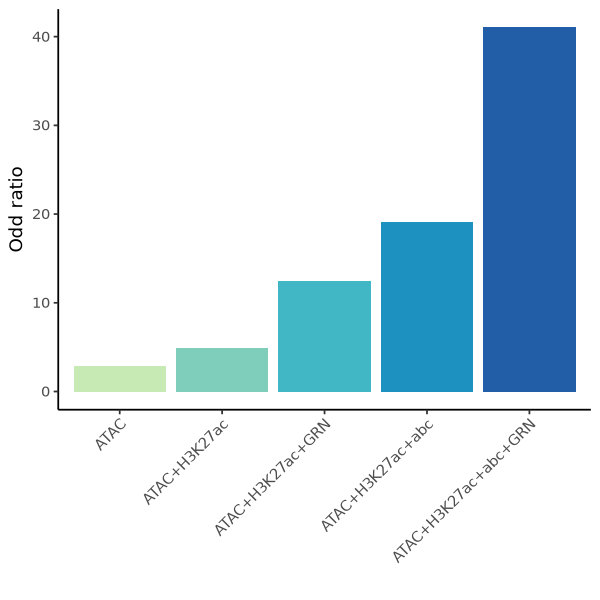

In [901]:
options(repr.plot.width = 5, repr.plot.height = 5)
t1 <- cdf %>%
mutate(group = factor(group, levels = c("ATAC", "ATAC+H3K27ac", "ATAC+H3K27ac+GRN", "ATAC+H3K27ac+abc", "ATAC+H3K27ac+abc+GRN"))) %>%
ggplot(aes(x = group, y = or, fill = group)) + 
geom_col() + ylab("Odd ratio") + xlab("") + 
theme_classic() + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + 
scale_fill_manual(values = colorRampPalette(brewer.pal(n = 8, name = "YlGnBu"))(8)[3:8]) + 
NoLegend()
     
t1

ggsave(t1, filename = "plot/FIG_enhancer_enrichment_combination_vCM.pdf", dpi = 300, height = 5, width = 5)

In [1472]:
t2 <- cdf %>% 
filter(group %in% c("ATAC", "ATAC+H3K27ac", "ATAC+H3K27ac+GRN", "ATAC+H3K27ac+abc")) %>%
mutate(group = factor(group, levels = c("ATAC", "ATAC+H3K27ac", "ATAC+H3K27ac+GRN", "ATAC+H3K27ac+abc"))) %>%
ggplot(aes(x = group, y = or, fill = group)) + 
geom_col() + ylab("Odd ratio") + xlab("") + 
theme_Publication() + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + 
scale_fill_manual(values = colorRampPalette(brewer.pal(n = 8, name = "YlGnBu"))(8)[3:8]) + 
NoLegend()

ggsave(t2, filename = "plot/FIG_enhancer_enrichment_combination_noall_vCM.pdf", dpi = 300, height = 6, width = 4)

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


### Load vCM GRN

In [1163]:
### enhancer prediction?
elist <- read.csv("GRN/scenicplus/vCM/edges_R2G.csv") %>% filter(is_extended == "False")
p1 <- unique(elist$Region)
p2 <- abc2 %>% filter(CellType == "vCM") %>% select(range) %>% unlist %>% unique
p3 <- intersect(p1, p2)
length(p1)
length(p2)
length(p3)

[1] 4836

[1] 5310

[1] 470

In [1164]:
### Check out the regulon and also targeting genes of this overlap enhancer
p1 <- elist %>% select(c(Region, Gene)) %>% distinct %>% mutate(pair = paste0(Region, ":", Gene))
p2 <- abc2 %>% filter(CellType == "vCM") %>% select(c(range, TargetGene)) %>% distinct %>% mutate(pair = paste0(range, ":", TargetGene))
# p2 <- abc %>% filter(CellType %in% grep("vCM", abc$CellType, value = T)) %>% select(c(range, TargetGene)) %>% distinct %>% mutate(pair = paste0(range, ":", TargetGene))
p3 <- intersect(p1$pair, p2$pair)
nrow(p1)
nrow(p2)
length(p3)

[1] 5126

[1] 7615

[1] 317

In [1167]:
p1 <- elist %>% select(c(Region, Gene)) %>% distinct %>% mutate(pair = paste0(Region, ":", Gene))
p2 <- abc2 %>% filter(CellType == "vCM") %>% select(c(range, TargetGene)) %>% distinct %>% mutate(pair = paste0(range, ":", TargetGene))
telist <- elist %>% 
filter(paste0(Region, ":", Gene) %in% unique(p1$pair)) %>%
filter(is_extended == "False")
tfr <- stringr::str_split_fixed(telist$Consensus_name, pattern = "_", n = 3)[,1] %>% unique
tfr

[1] "AR"      "ARID5B"  "ATF3"    "BACH1"   "BACH2"   "BATF"    "BCL11A" 
  [8] "BHLHE40" "BNC2"    "CEBPB"   "CEBPD"   "CREB5"   "CUX1"    "EBF1"   
 [15] "EGR1"    "EGR2"    "EGR3"    "ELF1"    "ELF4"    "ELK3"    "EOMES"  
 [22] "ERG"     "ESRRB"   "ESRRG"   "ETS1"    "ETS2"    "ETV1"    "ETV7"   
 [29] "FLI1"    "FOS"     "FOSB"    "FOSL1"   "FOSL2"   "FOXC1"   "FOXO1"  
 [36] "FOXO3"   "FOXP1"   "GATA4"   "HAND2"   "HES1"    "HEY2"    "IKZF1"  
 [43] "IKZF3"   "IRF4"    "IRF8"    "JUN"     "JUNB"    "JUND"    "KLF10"  
 [50] "KLF12"   "KLF15"   "KLF16"   "KLF17"   "KLF2"    "KLF3"    "KLF4"   
 [57] "KLF6"    "KLF7"    "KLF9"    "MAF"     "MAFB"    "MAFF"    "MAZ"    
 [64] "MEF2A"   "MEF2C"   "MEIS1"   "MEIS2"   "MITF"    "MXI1"    "NFE2L1" 
 [71] "NFE2L2"  "NFIA"    "NFIB"    "NPAS2"   "NR3C2"   "NR4A1"   "NRF1"   
 [78] "PBX1"    "PLAG1"   "PRDM1"   "PRDM16"  "PROX1"   "PRRX1"   "RARB"   
 [85] "RFX3"    "RUNX1"   "RUNX3"   "SMAD3"   "SOX17"   "SOX18"   "SOX5"   
 [92] "SOX7"    "SREBF2"  "STAT6"   "TBX20"   "TCF12"   "TCF21"   "TCF4"   
 [99] "TEAD1"   "TEAD4"   "TFCP2"   "THRB"    "WT1"     "ZBTB20"  "ZFX"    
[106] "ZNF189"  "ZNF676"  "ZNF704"  "ZNF91"   "KLF13"   "ZNF148"  "ZNF385D"

In [1999]:
sharep <- stringr::str_split_fixed(p3, pattern = "[:-]", n = 4) %>%
as.data.frame %>% mutate(range = paste0(V1, ":", V2, "-", V3))

In [1960]:
vec <- paste0("vCM", c(3, 11, 2, 7, 13, 4, 9, 1, 10, 5, 6, 12, 8))
table(rmeta[rmeta$orig.ident == "MULTIOME" & rmeta$nn2.cell_subtype %in% vec,]$nn2.cell_subtype)


 vCM1 vCM10 vCM11 vCM12 vCM13  vCM2  vCM3  vCM4  vCM5  vCM6  vCM7  vCM8  vCM9 
10886  2573  2192  1186   190  8945  8889  8459  7487  5999  4269  3941  3433 

In [2015]:
table(rmeta[rmeta$orig.ident == "DPT" & rmeta$nn2.cell_subtype %in% vec & rmeta$integrated_subtype == 1 & rmeta$Target == "H3K27ac",]$nn2.cell_subtype)
table(rmeta[rmeta$orig.ident == "DPT" & rmeta$nn2.cell_subtype %in% vec & rmeta$integrated_subtype == 1 & rmeta$Target == "H3K27me3",]$nn2.cell_subtype)


 vCM1 vCM10 vCM11 vCM12 vCM13  vCM2  vCM3  vCM4  vCM5  vCM6  vCM7  vCM8  vCM9 
  914   229    64   129     7   879   726  1356   796   768   238   729   601 


 vCM1 vCM10 vCM11 vCM12 vCM13  vCM2  vCM3  vCM4  vCM5  vCM6  vCM7  vCM8  vCM9 
  935   165    64    96     3   765   533   932   624   524   367   546   529 

In [199]:
ct <- 'Fibroblast'
rmeta[rmeta$orig.ident == "DPT" & rmeta$nn2.celltype == ct & rmeta$integrated_subtype == 1 & rmeta$Target == "H3K27ac",]$nn2.celltype %>% table

.
Fibroblast 
      3482 

In [192]:
ct <- 'Fibroblast'
table(rmeta[rmeta$orig.ident == "DPT" & rmeta$nn2.celltype == ct & rmeta$integrated_subtype == 1 & rmeta$Target == "H3K27ac",]$nn2.cell_subtype)


          FB1          FB10          FB11           FB2           FB3 
         1395            31            54           441           635 
      FB4_myo           FB5           FB6           FB7 FB8_activated 
          311           127            81           165           151 
          FB9 
           91 

In [193]:
tmeta <- rmeta %>%
filter(orig.ident == "DPT", nn2.celltype == ct, integrated_subtype == 1) %>%
mutate(cluster = paste0(nn2.cell_subtype, "_", Target)) %>%
mutate(dna_bc = paste0(dna, ":", dna_bc)) %>%
mutate(sample = paste0("FNIH_Heart.cluster.", ct, "_", Target, ".bam")) %>%
select(c(cluster, dna, dna_bc, sample)) %>%
setNames(c("cluster", "library", "barcode", "sample"))

write.table(tmeta, paste0("FNIH_Heart_cluster/FNIH_Heart_pool_DPT_", ct, ".cluster_info.xls"), 
            sep = "\t", quote = F, row.names = F, col.names = T)

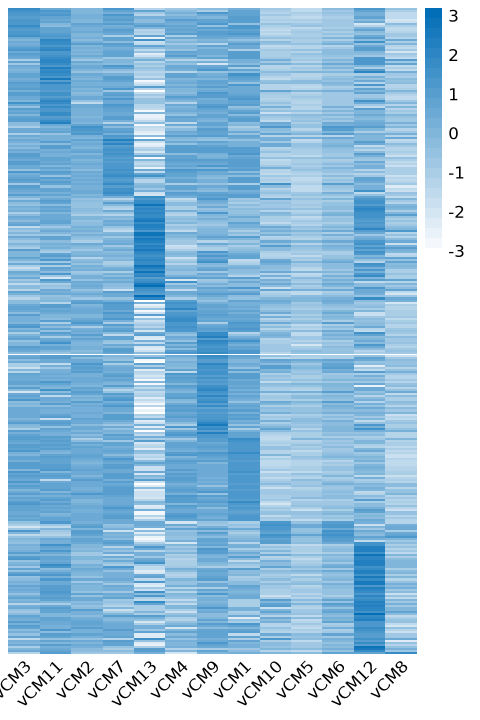

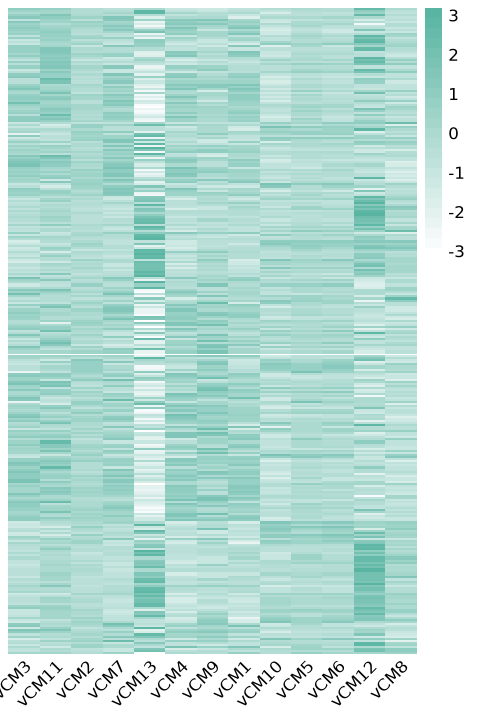

In [1175]:
# Plot pairs in subcluster: only overlap pairs from GRN+ABC
cpm <- read.csv("FNIH_Heart_signal/FNIH_Heart_pool.ATAC.cellsubtype.cpm.csv", row.names = 1)
rpkm <- read.table("integration/FNIH_Heart_pool.int.subtype.rpkm.txt", header = T)

rmat <- cpm[sharep$range, vec]
max_indices <- max.col(rmat)
permutation_vector <- order(max_indices)
smat <- rmat[permutation_vector, ]

# smat[smat > 16] <- 16
options(repr.plot.width = 4, repr.plot.height = 6)
t1 <- log2(smat + 1) %>%
pheatmap(scale = "row", cluster_rows = F, cluster_cols = F, angle_col = 45, 
         show_rownames = F, 
         border_color = NA, color = colorRampPalette(c("white", "#036EB8"))(25))

log2(rpkm[sharep[match(rownames(smat), sharep$range),]$V4, colnames(smat)] + 1) %>%
pheatmap(scale = "row", cluster_rows = F, cluster_cols = F, angle_col = 45, 
         show_rownames = F, 
         border_color = NA, color = colorRampPalette(c("white", "#59b4a2"))(25))

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


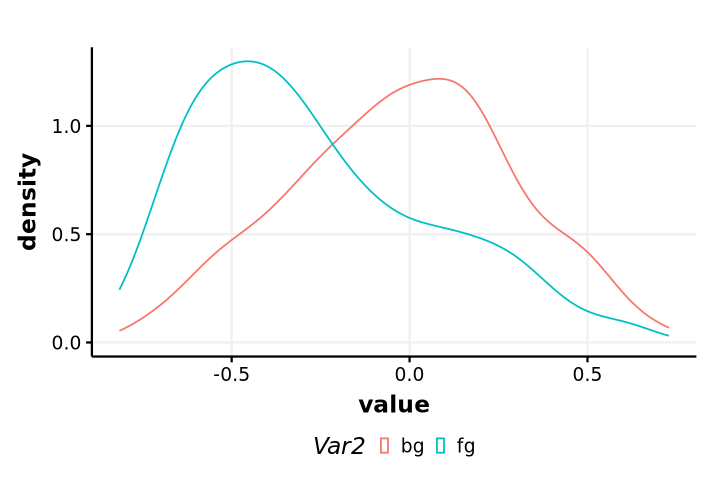

In [2001]:
# activity early to late  
ppeak <- sharep$range %>% unique
smat <- cpm[ppeak, vec]
fg <- apply(smat, MARGIN = 1, function(x) cor(x, 1:13)) %>% unlist
 
diffpeak <- atacde %>% filter(celltype == "vCM") %>% select(range) %>% unlist %>% unique
bg <- read.table("../reference/FNIH_peaks/vCM_UnifiedFiltVariable.bed") %>% 
mutate(range = paste0(V1, "-", V2, "-", V3)) %>% 
select(range) %>% unlist %>% unique
bg <- stringr::str_split_fixed(setdiff(bg, diffpeak), pattern = "[:-]", n = 4) %>%
as.data.frame %>% mutate(range = paste0(V1, ":", V2, "-", V3)) %>% select(range) %>% unlist %>% unique

# bg <- c(p1$pair, p2$pair)
# bg <- stringr::str_split_fixed(bg, pattern = "[:-]", n = 4) %>%
# as.data.frame %>% mutate(range = paste0(V1, ":", V2, "-", V3)) %>% select(range) %>% unlist %>% unique
  
bg <- setdiff(bg, rownames(smat))          
            
set.seed(921)
bg <- cpm[sample(bg, size = nrow(smat)), colnames(smat)] ### not diff peaks
bg <- apply(bg, MARGIN = 1, function(x) cor(x, 1:13)) %>% unlist

options(repr.plot.width = 6, repr.plot.height = 4)
cbind(bg, fg) %>%
reshape2::melt() %>%
ggplot(aes(x = value, color = Var2)) + 
geom_density() + 
theme_Publication()

In [2056]:
repvec <- paste0("vCM", c(1, 9, 5, 6, 8))
idx <- rowMeans(smat) >= 10
smat[idx, repvec] %>% 
apply(MARGIN = 1, function(x) cor(x, 1:5)) %>% unlist %>% sort

chr2:46564736-46565036 chr4:148442261-148442561  chr14:23438044-23438344 
              -0.9338925               -0.9279257               -0.9156749 
chr2:237886719-237887019  chr12:21657774-21658074  chr22:41410368-41410668 
              -0.9104380               -0.8945684               -0.8945142 
 chr19:46298088-46298388   chr1:31373052-31373352   chr1:54581554-54581854 
              -0.8906109               -0.8828742               -0.8807696 
 chr12:52051201-52051501   chr8:80578179-80578479 chr3:183636640-183636940 
              -0.8802479               -0.8743408               -0.8738412 
 chr13:23579118-23579418  chr15:99454916-99455216   chr1:54547839-54548139 
              -0.8701834               -0.8679054               -0.8651689 
chr1:244863161-244863461   chr6:53547923-53548223  chr16:75245407-75245707 
              -0.8650930               -0.8567146               -0.8537099 
 chr19:46300732-46301032  chr10:74826279-74826579  chr22:41448274-41448574 
              -0.8505149               -0.8364617               -0.8213834 
chr1:203278503-203278803 
              -0.7831172

[1] 1112 1156 1798 2711 2971 2998 3013 3015 3033 3051 3053 3781 3921 3042 3923
[16] 4736 4747 4748 4804 4808 4861 4901

In [2073]:
qgene <- p1[match(rownames(smat[idx,]), p1$Region),]$Gene
cor(t(smat[idx, repvec]), t(rpkm[qgene, repvec]), method = "spearman") %>%
head

,NR4A1,BTG2,ABCC9,MEF2A,RAMP1,ZNF704,HIF3A,HIF3A.1,NR3C2,FABP3,⋯,ACOT11,ADK,SSBP3,KLHL24,TOB2,TOB2.1,KLHL31,MYH7,TNFRSF19,RHOQ
chr12:52051201-52051501,-0.3,-0.9,0.9,1.0,0.1,0.9,0.3,0.3,0.9,0.8,⋯,0.7,0.7,1.0,0.7,0.3,0.3,0.7,0.7,1.0,0.1
chr1:203278503-203278803,-0.3,-0.9,0.9,1.0,0.1,0.9,0.3,0.3,0.9,0.8,⋯,0.7,0.7,1.0,0.7,0.3,0.3,0.7,0.7,1.0,0.1
chr12:21657774-21658074,-0.3,-0.9,0.9,1.0,0.1,0.9,0.3,0.3,0.9,0.8,⋯,0.7,0.7,1.0,0.7,0.3,0.3,0.7,0.7,1.0,0.1
chr15:99454916-99455216,0.1,-0.8,1.0,0.9,-0.3,0.8,0.6,0.6,0.8,0.9,⋯,0.4,0.5,0.9,0.9,-0.1,-0.1,0.5,0.5,0.9,-0.2
chr2:237886719-237887019,-0.3,-0.9,0.9,1.0,0.1,0.9,0.3,0.3,0.9,0.8,⋯,0.7,0.7,1.0,0.7,0.3,0.3,0.7,0.7,1.0,0.1
chr8:80578179-80578479,-0.3,-0.9,0.9,1.0,0.1,0.9,0.3,0.3,0.9,0.8,⋯,0.7,0.7,1.0,0.7,0.3,0.3,0.7,0.7,1.0,0.1


In [2067]:
qregion <- "chr12:21657774-21658074"
qgene <- p1 %>% filter(Region == qregion)
rpkm[qgene$Gene, repvec]

,vCM1,vCM9,vCM5,vCM6,vCM8
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ABCC9,2.049204,2.69189,1.623333,1.71128,1.619687


In [2005]:
table(p.adjust(qvalue::empPvals(-fg, -bg), method = "BH") < 0.05)


FALSE 
  317 

In [2029]:
### Build TF2gene: identify closely correlated TF
tgrn <- elist[elist$Consensus_name %in% grep("\\+_\\+", elist$Consensus_name, value = T), ] %>% 
mutate(TF = gsub("_\\+_\\+", "", Consensus_name))
tgrn <- tgrn[,c('Region', 'Gene', 'TF')] %>% filter(Region %in% sharep$range)
intersect(tgrn$TF, tgrn$Gene) %>% length
intersect(tgrn$TF, tgrn$Gene) %>% head

[1] 21

[1] "BCL11A" "CEBPD"  "CREB5"  "ELF1"   "ESRRG"  "FOXO3"

In [2030]:
intersect(tgrn$TF, tgrn$Gene)

[1] "BCL11A" "CEBPD"  "CREB5"  "ELF1"   "ESRRG"  "FOXO3"  "HAND2"  "HEY2"  
 [9] "JUNB"   "KLF12"  "MEF2A"  "MEIS1"  "MEIS2"  "NFE2L1" "NR3C2"  "NR4A1" 
[17] "PBX1"   "RARB"   "TBX20"  "THRB"   "ZNF704"

In [2013]:
c1 <- elist[grep("CEBPB", elist$Consensus_name), ]$Gene %>% unique
c2 <- elist[grep("PRRX1", elist$Consensus_name), ]$Gene %>% unique
intersect(c1, c2) %>% length
intersect(c1, c2)

[1] 1

[1] "CBFB"

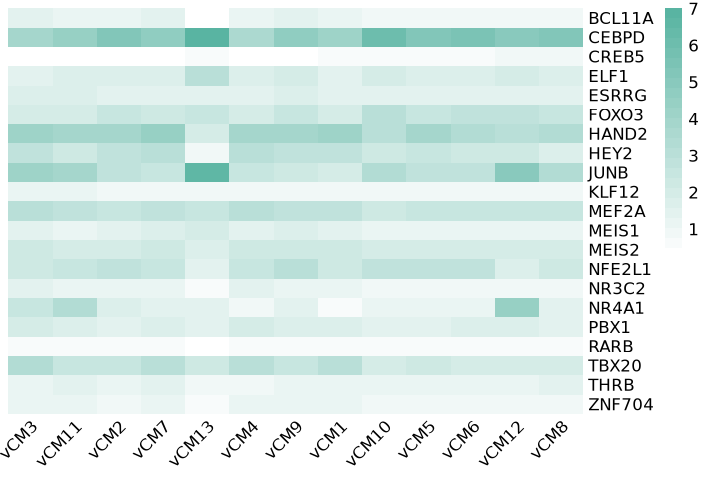

In [2033]:
# qgene <- elist[grep("BACH2", elist$Consensus_name), ]$Gene
log2(rpkm[intersect(tgrn$TF, tgrn$Gene), colnames(smat)] + 1) %>%
pheatmap(scale = "none", cluster_rows = F, cluster_cols = F, angle_col = 45, 
         show_rownames = T, 
         border_color = NA, color = colorRampPalette(c("white", "#59b4a2"))(25))

### Load all GRN

In [1118]:
elist <- list()
for (f in list.files("GRN//edges_R2G")){
    fname <- gsub("_edges_R2G.csv", "", f)
    edge <- read.csv(paste0("GRN//edges_R2G/", f))
    elist[[fname]] <- edge %>% filter(is_extended == "False") %>% select(c(Region, Gene)) %>% mutate(celltype = fname)
}
elist <- do.call(rbind, elist)
table(elist$celltype)


     aCM     Endo    Fibro Lymphoid  Myeloid      vCM 
   85149   100050    57281    32307    75567    49133 

In [5]:
length(elist$Region)
unique(elist$Region) %>% length

length(elist$Gene)
unique(elist$Gene) %>% length

distinct(elist[,1:2]) %>% dim

[1] 399487

[1] 61076

[1] 399487

[1] 10845

[1] 93768     2

In [65]:
hg38 <- read.table("/projects//ps-renlab/y2xie/projects/genome_ref/Paired-Tag/hg38/hg38.gcode.10X.coding.bed") %>%
mutate(start = ifelse(V4 == "+", V2, V3)) %>%
mutate(end = ifelse(V4 == "+", V2+1, V3-1)) %>%
select(c(V1, start, end, V4, V5, V6))

elist[,c("chrom", "start", "end")] <- stringr::str_split_fixed(elist$Region, pattern = "[:-]", n = 3)
elist <- merge(elist, hg38, by.x = "Gene", by.y = "V6") %>%
filter(abs(((as.integer(start.x)+as.integer(end.x))/2) - start.y) >= 50000) %>%
select(c(Gene, V1, start.y, end.y, Region, chrom, start.x, end.x, celltype))

In [67]:
length(elist$Region)
unique(elist$Region) %>% length

length(elist$Gene)
unique(elist$Gene) %>% length

distinct(elist[,c("Region", "Gene")]) %>% dim

[1] 262027

[1] 46933

[1] 262027

[1] 9898

[1] 63418     2

In [48]:
### Compare with abc links
k27ac <- read.csv("FNIH_Heart_signal/FNIH_Heart_pool.H3K27ac.HeartUnionPeak.cpm.csv", row.names = 1) ### FNIH

abc <- gex <- ac <- list()
for (f in colnames(k27ac)){
    abc[[f]] <- read.table(paste0("../../87.FNIH_DHC_IGM_240925/05.R/abc/celltype/output/", f, "/EnhancerPredictions.txt"), sep = "\t", header = T) %>%
    filter(abs(((start+end)/2) - TargetGeneTSS) >= 50000) ### long range only
    gex[[f]] <- read.table(paste0("../../87.FNIH_DHC_IGM_240925/05.R/abc/celltype/", f, "_gex.rpkm"), header = F, sep = "\t")
    ac[[f]] <- read.table(paste0("../../87.FNIH_DHC_IGM_240925/05.R/abc/celltype/", f, "_H3K27ac.cpm"), header = F, sep = "\t")
}

In [68]:
### Overlap between K27ac abc and grn
t1 <- abc[["aCM"]] %>% mutate(tpair = paste0(chr, ":", start, "-", end, ":", TargetGene)) %>% select(tpair) %>% unlist
t2 <- elist %>% filter(celltype == "aCM") %>% mutate(tpair = paste0(Region, ":", Gene)) %>% select(tpair) %>% unlist
length(t1); length(t2)
length(intersect(t1, t2))

[1] 1459

[1] 57518

[1] 16

In [69]:
### ??? Check on genome browser
fregion <- elist %>% filter(celltype == "aCM")
write.table(fregion[,c("V1", "start.y", "end.y", "chrom", "start.x", "end.x")], 
            "../../87.FNIH_DHC_IGM_240925/05.R/abc/aCM_eregulon_distal.bedpe", 
            sep = "\t", quote = F, row.names = F, col.names = F)

fregion <- abc[["aCM"]]
fregion$chrom2 <- fregion$chr
fregion$start2 <- fregion$TargetGeneTSS
fregion$end2 <- fregion$TargetGeneTSS+1

write.table(fregion[,c("chr", "start", "end", "chrom2", "start2", "end2")], 
            "../../87.FNIH_DHC_IGM_240925/05.R/abc/aCM_abc_distal.bedpe", 
            sep = "\t", quote = F, row.names = F, col.names = F)

In [72]:
### Check ATAC based abc
aabc <- list()
for (f in colnames(atac)){
    aabc[[f]] <- read.table(paste0("../../87.FNIH_DHC_IGM_240925/05.R/atac_abc/celltype/output/", f, "/EnhancerPredictions.txt"), sep = "\t", header = T) %>%
    filter(abs(((start+end)/2) - TargetGeneTSS) >= 50000) ### long range only
}

In [77]:
# t1 <- abc[["aCM"]] %>% mutate(tpair = paste0(chr, ":", start, "-", end, ":", TargetGene)) %>% select(tpair) %>% unlist
# t2 <- elist %>% filter(celltype == "aCM") %>% mutate(tpair = paste0(Region, ":", Gene)) %>% select(tpair) %>% unlist

t3 <- aabc[["aCM"]] %>% mutate(tpair = paste0(chr, ":", start, "-", end, ":", TargetGene)) %>% select(tpair) %>% unlist
print(paste0("Total number of atac-based distal GRN: ", length(t2)))
print(paste0("Total number of atac abc links: ", length(t3)))
print(paste0("Total number of atac abc links overlap with GRN: ", length(intersect(t3, t2))))

print(paste0("Total number of k27ac abc links: ", length(t1)))
print(paste0("Total number of k27ac abc links overlap with GRN: ", length(intersect(t1, t2))))

[1] "Total number of atac-based distal GRN: 57518"
[1] "Total number of atac abc links: 1494"
[1] "Total number of atac abc links overlap with GRN: 16"
[1] "Total number of k27ac abc links: 1459"
[1] "Total number of k27ac abc links overlap with GRN: 16"


In [79]:
fregion <- aabc[["aCM"]]
fregion$chrom2 <- fregion$chr
fregion$start2 <- fregion$TargetGeneTSS
fregion$end2 <- fregion$TargetGeneTSS+1

write.table(fregion[,c("chr", "start", "end", "chrom2", "start2", "end2")], 
            "../../87.FNIH_DHC_IGM_240925/05.R/abc/aCM_atac_abc_distal.bedpe", 
            sep = "\t", quote = F, row.names = F, col.names = F)

### Go check APA

Using id as id variables

Using id as id variables

Using id as id variables



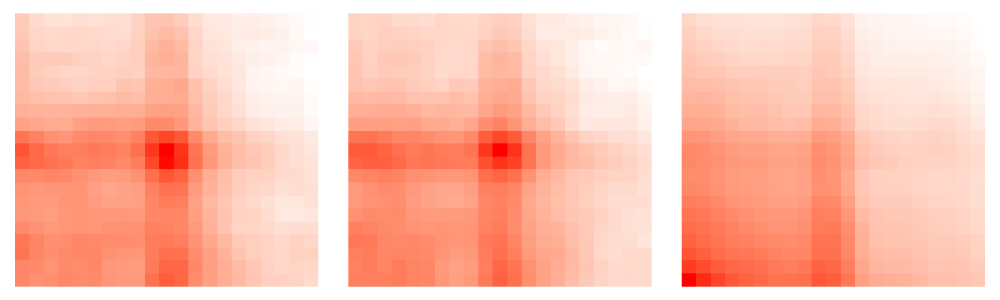

In [101]:
plist <- list()
for (file in list.files("../../87.FNIH_DHC_IGM_240925/05.R/abc/aCM_example/", pattern = ".bedpe$")){
    f <- gsub(".bedpe", "", file)
    tmp <- read.csv(paste0("../../87.FNIH_DHC_IGM_240925/05.R/abc/aCM_example/", f, "/10000/gw/APA.txt"), header = F)
    tmp$V1 <- gsub("\\[", "", tmp$V1) %>% as.numeric
    tmp$V21 <- gsub("\\]", "", tmp$V21) %>% as.numeric
    plist[[f]] <- tmp
}

### DONR USE KR for APA
options(repr.plot.width = 10, repr.plot.height = 4)
cowplot::plot_grid(plotlist = lapply(plist, function(x) x %>% mutate(id = colnames(x)) %>%
                          reshape2::melt() %>% 
                          mutate(id = as.integer(gsub("V", "", id))) %>% arrange(id) %>% 
                          mutate(variable = as.integer(gsub("V", "", variable))) %>% arrange(variable) %>% 
                          ggplot(aes(x = -id, y = variable, fill = value)) + 
                          geom_tile() + theme_void() + NoLegend() + 
                          scale_fill_gradientn(colours = c("white", "red"), breaks = c(0, 0.2))), ncol = 3)

In [102]:
names(plist)

[1] "aCM_abc_distal"      "aCM_atac_abc_distal" "aCM_eregulon_distal"

In [447]:
options(repr.plot.width = 4, repr.plot.height = 6)

rmat <- atac[unique(elist$Region), eorder]
max_indices <- max.col(rmat)
permutation_vector <- order(max_indices)
smat <- rmat[permutation_vector, ]
log2(smat + 1) %>%
pheatmap(cluster_rows = F, cluster_cols = F, border_color = NA,
         scale = "none", show_rownames = F, angle_col = 45, color = viridis(50))

Warning message in min(x, na.rm = T):
“no non-missing arguments to min; returning Inf”
Warning message in max(x, na.rm = T):
“no non-missing arguments to max; returning -Inf”


ERROR: Error in seq.default(min(x, na.rm = T), max(x, na.rm = T), length.out = n + : 'from' must be a finite number


In [97]:
### Use only ABC results for inferring links

In [285]:
mmlist <- list()
for (f in list.files("/projects//ps-renlab2/y2xie/projects/tmp/", pattern = '.*_barcodes.csv')){
    fname <- gsub("_barcodes.csv", "", f)
    mark = stringr::str_split_fixed(fname, pattern = "_", n = 4)[1]
    ct = stringr::str_split_fixed(fname, pattern = "_", n = 4)[3]
    mmlist[[fname]] <- read.table(paste0("/projects//ps-renlab2/y2xie/projects/tmp/", f), header = T) %>%
    mutate(cluster = fname, library = ct, sample = paste0("FNIH_Heart.cluster.", ct, "_", mark, ".bam"))
}

mmlist <- do.call(rbind, mmlist) %>% setNames(c("barcode", "cluster", "library", "sample"))

write.table(mmlist, "/projects//ps-renlab2/y2xie/projects/tmp/CM_cluster_info.txt", 
            sep = "\t", row.names = F, col.names = T, quote = F)

In [25]:
# rpkm <- read.table("integration/FNIH_Heart_pool.int.disease.rpkm.txt", header = T)

baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>


In [761]:
qpeak <- atacde %>% 
filter(log2FoldChange >= 1) %>% 
select(celltype, range) %>% distinct %>%
mutate(celltype = factor(celltype, levels = corder)) %>%
arrange(celltype)

smat <- log2(atac + 1)
smat[smat > 7] <- 7

set.seed(921)
library(factoextra)
# fviz_nbclust(smat[unique(qpeak$range), paste0(korder, ".NON_HF")], kmeans, method = "silhouette")

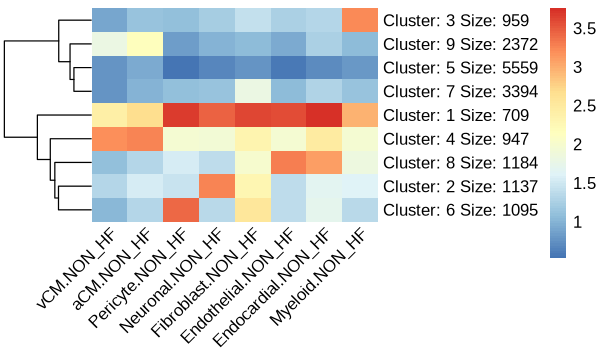

In [762]:
### fuck it
options(repr.plot.width = 5, repr.plot.height = 3)

set.seed(921)
f1 <- smat[unique(qpeak$range), paste0(korder, ".NON_HF")] %>%
pheatmap(cluster_rows = T, cluster_cols = F, border_color = NA, kmeans_k = length(korder)+1,
         show_rownames = T, angle_col = 45)

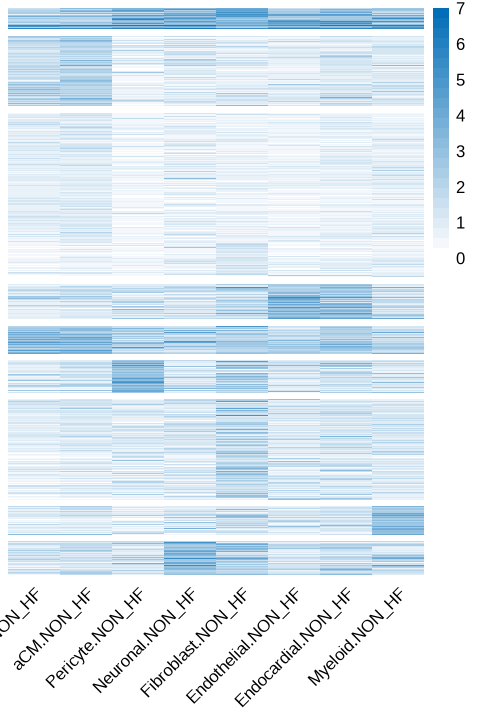

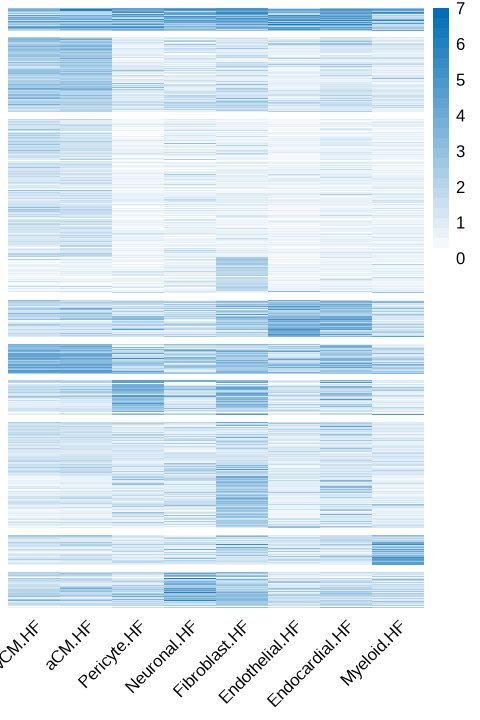

In [763]:
rorder <- f1$kmeans$cluster %>% as.data.frame %>% setNames("cluster") %>%
mutate(cluster = factor(cluster, levels = c(1,9,5,8,4,6,7,3,2))) %>% #c(1,5,8,7,6,4,3,2)
arrange(cluster)

options(repr.plot.width = 4, repr.plot.height = 6)
t1 <- smat[rownames(rorder), paste0(korder, ".NON_HF")] %>%
pheatmap(cluster_rows = F, cluster_cols = F, show_rownames = F, angle_col = 45,
         gaps_row = cumsum(table(rorder$cluster)),
         border_color = NA, color = colorRampPalette(c("white", "#036EB8"))(25))

t2 <- smat[rownames(rorder), paste0(korder, ".HF")] %>%
pheatmap(cluster_rows = F, cluster_cols = F, show_rownames = F, angle_col = 45,
         gaps_row = cumsum(table(rorder$cluster)),
         border_color = NA, color = colorRampPalette(c("white", "#036EB8"))(25))

In [344]:
ggsave(t1, filename = "plot/FIG_ATAC_DE_up_NONHF.pdf", dpi = 300, height = 4, width = 6)
ggsave(t2, filename = "plot/FIG_ATAC_DE_up_HF.pdf", dpi = 300, height = 4, width = 6)

In [346]:
qpeak <- atacde %>% 
filter(log2FoldChange <= -1) %>% 
select(celltype, range) %>% distinct %>%
mutate(celltype = factor(celltype, levels = corder)) %>%
arrange(celltype)

smat <- log2(atac + 1)
smat[smat > 7] <- 7

options(repr.plot.width = 5, repr.plot.height = 5)

set.seed(921)
fviz_nbclust(smat[unique(qpeak$range), paste0(korder, ".NON_HF")], kmeans, method = "silhouette")

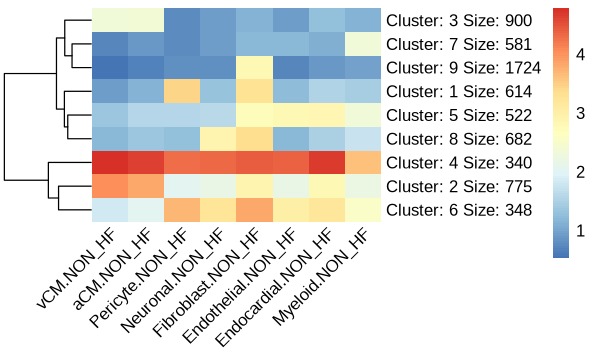

In [347]:
options(repr.plot.width = 5, repr.plot.height = 3)

set.seed(921)
f2 <- smat[unique(qpeak$range), paste0(korder, ".NON_HF")] %>%
pheatmap(cluster_rows = T, cluster_cols = F, border_color = NA, kmeans_k = length(korder)+1,
         show_rownames = T, angle_col = 45)

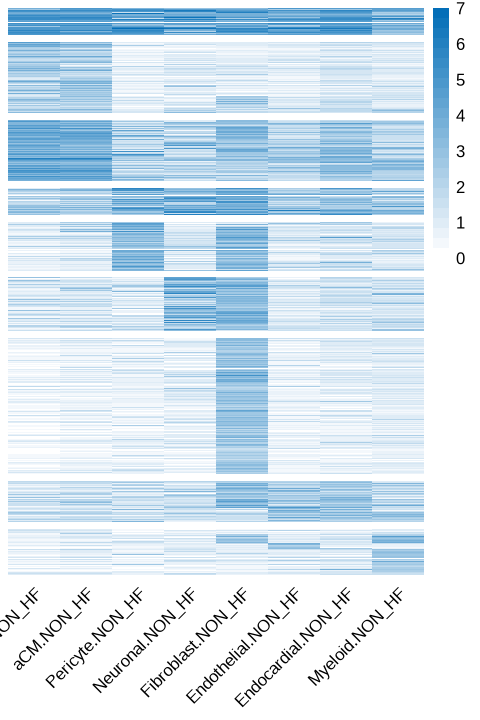

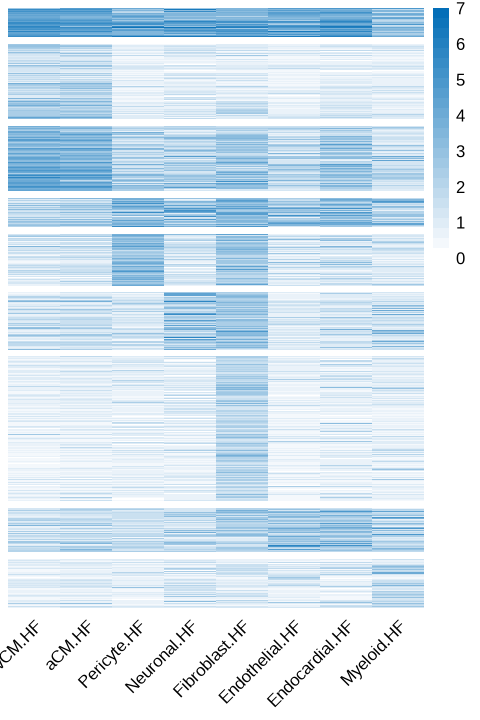

In [348]:
rorder <- f2$kmeans$cluster %>% as.data.frame %>% setNames("cluster") %>%
mutate(cluster = factor(cluster, levels = c(4,3,2,6,1,8,9,5,7))) %>%
arrange(cluster)

options(repr.plot.width = 4, repr.plot.height = 6)
t1 <- smat[rownames(rorder), paste0(korder, ".NON_HF")] %>%
pheatmap(cluster_rows = F, cluster_cols = F, show_rownames = F, angle_col = 45,
         gaps_row = cumsum(table(rorder$cluster)),
         border_color = NA, color = colorRampPalette(c("white", "#036EB8"))(25))

t2 <- smat[rownames(rorder), paste0(korder, ".HF")] %>%
pheatmap(cluster_rows = F, cluster_cols = F, show_rownames = F, angle_col = 45,
         gaps_row = cumsum(table(rorder$cluster)),
         border_color = NA, color = colorRampPalette(c("white", "#036EB8"))(25))

ggsave(t1, filename = "plot/FIG_ATAC_DE_down_NONHF.pdf", dpi = 300, height = 4, width = 6)
ggsave(t2, filename = "plot/FIG_ATAC_DE_down_HF.pdf", dpi = 300, height = 4, width = 6)

### GWAS analysis

In [21]:
# gabc <- read.table("../reference/80LociHF_CelltypePeaks_Differential_ABC.txt", header = T)
gabc %>% filter(seqnames == "chr8", start > 140620000, end < 140630000)

seqnames,start,end,width,strand,rsID,PPA,Locus,Peak_ID,celltype,chromSTATE,Celltype_Peak_ID,chamber,contrast,ATAC_DESeq2,ABC_TargetGene
<chr>,<int>,<int>,<int>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
chr8,140621293,140621294,2,*,rs13277721,0.0328352,locus_39,chr8-140621226-140621526,vCM,E5,vCM--chr8-140621226-140621526,LV,HF_vs_NON_HF,UP,NA
chr8,140621293,140621294,2,*,rs13277721,0.0328352,locus_39,chr8-140621226-140621526,vCM,E5,vCM--chr8-140621226-140621526,RV,HF_vs_NON_HF,NS,NA
chr8,140621293,140621294,2,*,rs13277721,0.0328352,locus_39,chr8-140621226-140621526,Neuronal,E3,Neuronal--chr8-140621226-140621526,LV,HF_vs_NON_HF,NS,NA
chr8,140621293,140621294,2,*,rs13277721,0.0328352,locus_39,chr8-140621226-140621526,Neuronal,E3,Neuronal--chr8-140621226-140621526,LA,HF_vs_NON_HF,NS,NA
chr8,140621293,140621294,2,*,rs13277721,0.0328352,locus_39,chr8-140621226-140621526,Neuronal,E3,Neuronal--chr8-140621226-140621526,RA,HF_vs_NON_HF,NS,NA
chr8,140621293,140621294,2,*,rs13277721,0.0328352,locus_39,chr8-140621226-140621526,aCM,E5,aCM--chr8-140621226-140621526,LA,HF_vs_NON_HF,NS,NA
chr8,140621293,140621294,2,*,rs13277721,0.0328352,locus_39,chr8-140621226-140621526,aCM,E5,aCM--chr8-140621226-140621526,RA,HF_vs_NON_HF,NS,NA
chr8,140621293,140621294,2,*,rs13277721,0.0328352,locus_39,chr8-140621226-140621526,Neuronal,ATAC,Neuronal--chr8-140621226-140621526,LV,HF_vs_NON_HF,NS,NA
chr8,140621293,140621294,2,*,rs13277721,0.0328352,locus_39,chr8-140621226-140621526,Neuronal,ATAC,Neuronal--chr8-140621226-140621526,LA,HF_vs_NON_HF,NS,NA


In [ ]:
# qregion <- chr8	140621293	140621294

In [37]:
tmp <- stringr::str_split_fixed(atacde$range, pattern = "-", n = 3) %>% as.data.frame
# tmpr <- GenomicRanges::(tmp$V1, IRanges(as.integer(tmp$V2), as.integer(tmp$V3)))
tmp %>% filter(V1 == "chr10", as.integer(V2) < 119659975, as.integer(V3) > 119659975)


### TRAPPC9; chr8-140621226-140621526

V1,V2,V3
<chr>,<chr>,<chr>
chr10,119659964,119660194


In [42]:
# atac <- read.table("../reference/ATAC_celltype.cpm.txt")
# rpkm <- read.table("integration/FNIH_Heart_pool.int.rpkm.txt", row.names = 1, header = T)

atacde %>% filter(range == "chr10-119659964-119660194")
genede %>% filter(gene %in% c("TIAL1", 'BAG3'))
# chr10:119,556,593-119,721,132
atac["chr10-119659964-119660194",]
rpkm[c("TIAL1", 'BAG3'), ]

celltype,contrast,range,log2FoldChange,stat,pvalue,padj
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
vCM,HF_vs_NON_HF,chr10-119659964-119660194,-0.363586,-2.904926,0.003673403,0.02631634


celltype,contrast,gene,log2FoldChange,stat,pvalue,padj
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
vCM,HF_vs_NON_HF,TIAL1,-0.1769593,-2.830741,0.004644032,0.02809078


,Fibroblast,Endothelial,vCM,Myeloid,Pericyte,Endocardial,Lymphoid,SM,Neuronal,Adipocyte,Epicardial,aCM
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr10-119659964-119660194,2.649555,1.916472,10.34201,1.467801,2.197464,3.43378,1.856723,3.585088,3.210035,5.195213,2.285008,7.251647


,vCM,Fibroblast,Myeloid,Adipocyte,Endothelial,SM,Neuronal,Pericyte,Lymphoid,Endocardial,aCM,Epicardial
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
TIAL1,2.023488,3.6455554,4.3729635,2.6944460,3.5121329,3.0211320,3.1868260,3.8818971,5.8486223,3.151476,2.335494,2.617046
BAG3,1.093424,0.8022351,0.2480426,0.8767937,0.7296039,0.7090068,0.3081407,0.4727489,0.3352022,1.303737,1.156955,2.654910
